In Retail Industry and chain of stores one of the biggest issue they face are supply chain management. The component of supply chain management (SCM) involved with determining how best to fulfill the requirements created from the Demand Plan.

It's objective is to balance supply and demand in a manner that achieves the financial and service objectives of the enterprise.

# Data


There are 3 Datasets :

Stores:
*   Store: The store number. Range from 1–45.
*   Type: Three types of stores ‘A’, ‘B’ or ‘C’.
*   Size: Sets the size of a Store would be calculated by the no. of products   
    available in the particular store ranging from 34,000 to 210,000
*   primary key is Store

Sales:
*   Date: The date of the week where this observation was taken.
*   Weekly_Sales: The sales recorded during that Week.
*   Store: The store which observation in recorded 1–45
*   Dept: One of 1–99 that shows the department.
*   IsHoliday: Boolean value representing a holiday week or not.
*   primary key is a combination of (Store,Dept,Date).

Features:
*   Temperature: Temperature of the region during that week.
*   Fuel_Price: Fuel Price in that region during that week.
*   MarkDown1:5 : Represents the Type of markdown and what quantity was
    available during that week.
*   CPI: Consumer Price Index during that week.
*   Unemployment: The unemployment rate during that week in the region of the
    store.
*   primary key here is a combination of (Store,Date)


In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import calendar
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, LinearRegression, LassoCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
import random
import sqlite3
from itertools import cycle, islice
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb

import lightgbm as lgb
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.svm import SVR

/usr/local/lib/python3.10/dist-packages/sklearn/experimental/enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


Load and read data

In [ ]:
df=pd.read_csv('/content/features.csv.zip')
sampledf=pd.read_csv('/content/sampleSubmission.csv.zip')
testdf=pd.read_csv('/content/test.csv.zip')
traindf=pd.read_csv('/content/train.csv.zip')
storesdf=pd.read_csv('/content/stores.csv')
sampledf.head()

,Id,Weekly_Sales
0,1_1_2012-11-02,0
1,1_1_2012-11-09,0
2,1_1_2012-11-16,0
3,1_1_2012-11-23,0
4,1_1_2012-11-30,0


In [ ]:
storesdf.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


from matplotlib import pyplot as plt
_df_16['Store'].plot(kind='hist', bins=20, title='Store')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_17['Size'].plot(kind='hist', bins=20, title='Size')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_18.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_19.plot(kind='scatter', x='Store', y='Size', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Size']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_20.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Size')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Store']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Store'}, axis=1)
              .sort_values('Store', ascending=True))
  xs = counted['Store']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_21.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_22['Store'].plot(kind='line', figsize=(8, 4), title='Store')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_23['Size'].plot(kind='line', figsize=(8, 4), title='Size')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_24['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_24, x='Store', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_25['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_25, x='Size', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


from matplotlib import pyplot as plt
_df_26['Temperature'].plot(kind='hist', bins=20, title='Temperature')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_27['Fuel_Price'].plot(kind='hist', bins=20, title='Fuel_Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_28['CPI'].plot(kind='hist', bins=20, title='CPI')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_29.groupby('Date').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_30.groupby('IsHoliday').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_31.plot(kind='scatter', x='Temperature', y='Fuel_Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_32.plot(kind='scatter', x='Fuel_Price', y='CPI', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Temperature']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_33.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Date')):
  _plot_series(series, series_name, i)
  fig.legend(title='Date', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Temperature')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Temperature']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_34.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('IsHoliday')):
  _plot_series(series, series_name, i)
  fig.legend(title='IsHoliday', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Temperature')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Fuel_Price']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_35.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Date')):
  _plot_series(series, series_name, i)
  fig.legend(title='Date', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Fuel_Price')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Fuel_Price']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_36.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('IsHoliday')):
  _plot_series(series, series_name, i)
  fig.legend(title='IsHoliday', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Fuel_Price')

from matplotlib import pyplot as plt
_df_37['Temperature'].plot(kind='line', figsize=(8, 4), title='Temperature')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_38['Fuel_Price'].plot(kind='line', figsize=(8, 4), title='Fuel_Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_39['CPI'].plot(kind='line', figsize=(8, 4), title='CPI')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['IsHoliday'].value_counts()
    for x_label, grp in _df_40.groupby('Date')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Date')
_ = plt.ylabel('IsHoliday')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_41['Date'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_41, x='Temperature', y='Date', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_42['IsHoliday'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_42, x='Temperature', y='IsHoliday', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_43['Date'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_43, x='Fuel_Price', y='Date', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_44['IsHoliday'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_44, x='Fuel_Price', y='IsHoliday', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
testdf.head()

,Store,Dept,Date,IsHoliday
0,1,1,2012-11-02,False
1,1,1,2012-11-09,False
2,1,1,2012-11-16,False
3,1,1,2012-11-23,True
4,1,1,2012-11-30,False


from matplotlib import pyplot as plt
import seaborn as sns
_df_45.groupby('Date').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_46.groupby('IsHoliday').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Store']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Store'}, axis=1)
              .sort_values('Store', ascending=True))
  xs = counted['Store']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_47.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Date')):
  _plot_series(series, series_name, i)
  fig.legend(title='Date', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Store']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Store'}, axis=1)
              .sort_values('Store', ascending=True))
  xs = counted['Store']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_48.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('IsHoliday')):
  _plot_series(series, series_name, i)
  fig.legend(title='IsHoliday', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Dept']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Dept'}, axis=1)
              .sort_values('Dept', ascending=True))
  xs = counted['Dept']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_49.sort_values('Dept', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Date')):
  _plot_series(series, series_name, i)
  fig.legend(title='Date', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Dept')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Dept']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Dept'}, axis=1)
              .sort_values('Dept', ascending=True))
  xs = counted['Dept']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_50.sort_values('Dept', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('IsHoliday')):
  _plot_series(series, series_name, i)
  fig.legend(title='IsHoliday', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Dept')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['IsHoliday'].value_counts()
    for x_label, grp in _df_51.groupby('Date')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Date')
_ = plt.ylabel('IsHoliday')

In [ ]:
traindf.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


from matplotlib import pyplot as plt
_df_52['Weekly_Sales'].plot(kind='hist', bins=20, title='Weekly_Sales')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_53.groupby('Date').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_54.groupby('IsHoliday').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Weekly_Sales']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_55.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Date')):
  _plot_series(series, series_name, i)
  fig.legend(title='Date', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Weekly_Sales')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Store']
  ys = series['Weekly_Sales']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_56.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('IsHoliday')):
  _plot_series(series, series_name, i)
  fig.legend(title='IsHoliday', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('Weekly_Sales')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Store']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Store'}, axis=1)
              .sort_values('Store', ascending=True))
  xs = counted['Store']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_57.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Date')):
  _plot_series(series, series_name, i)
  fig.legend(title='Date', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Store']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Store'}, axis=1)
              .sort_values('Store', ascending=True))
  xs = counted['Store']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_58.sort_values('Store', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('IsHoliday')):
  _plot_series(series, series_name, i)
  fig.legend(title='IsHoliday', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Store')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_59['Weekly_Sales'].plot(kind='line', figsize=(8, 4), title='Weekly_Sales')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['IsHoliday'].value_counts()
    for x_label, grp in _df_60.groupby('Date')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Date')
_ = plt.ylabel('IsHoliday')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_61['Date'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_61, x='Weekly_Sales', y='Date', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_62['IsHoliday'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_62, x='Weekly_Sales', y='IsHoliday', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
traindf.shape

(421570, 5)

#Group by Store

Since we are predicting the weekly sales for Store level, we will grouping the data in walmart dataset to avoid the department and take the sum of department sales to store level.

In [ ]:
storegroupdf=traindf.groupby(["Store","Date"])[["Weekly_Sales"]].sum()
storegroupdf.reset_index(inplace=True)

Merging all the datasets into one place for easier test and analysis.

In [ ]:
result = pd.merge(storegroupdf, storesdf, how='inner', on='Store', left_on=None, right_on=None,
        left_index=False, right_index=False, sort=False,
        suffixes=('_x', '_y'), copy=True, indicator=False)

data = pd.merge(result, df, how='inner', on=['Store','Date'], left_on=None, right_on=None,
        left_index=False, right_index=False, sort=False,
        suffixes=('_x', '_y'), copy=True, indicator=False)

In [ ]:
print(data.shape)

(6435, 15)


Dataframe Walmart with 421570 rows has come down to 6435 rows by doing a group by and merge

#Data Cleaning

In [ ]:
data.head()

,Store,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,1643690.90,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,1641957.44,A,151315,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,1611968.17,A,151315,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,1409727.59,A,151315,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,1554806.68,A,151315,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
data['IsHoliday'] = data['IsHoliday'].apply(lambda x: 1 if x == True else 0)

In [ ]:
data.dtypes

In [ ]:
data["Date"]=pd.to_datetime(data.Date)


data["Day"]=data.Date.dt.day
data["Month"]=data.Date.dt.month
data["Year"]=data.Date.dt.year

data['Month'] = data['Month'].apply(lambda x: calendar.month_abbr[x])

In [ ]:
data.isnull().sum()

Store              0
Date               0
Weekly_Sales       0
Type               0
Size               0
Temperature        0
Fuel_Price         0
MarkDown1       4155
MarkDown2       4798
MarkDown3       4389
MarkDown4       4470
MarkDown5       4140
CPI                0
Unemployment       0
IsHoliday          0
Day                0
Month              0
Year               0
dtype: int64

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Size,6435.0,1.302876e+05,63117.022465,34875.000,70713.000,126512.000000,2.023070e+05,2.196220e+05
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
MarkDown1,2280.0,6.855587e+03,8183.310015,0.270,1679.190,4972.590000,8.873583e+03,8.864676e+04
MarkDown2,1637.0,3.218966e+03,9268.082387,-265.760,37.200,187.040000,1.785290e+03,1.045195e+05
MarkDown3,2046.0,1.349853e+03,9287.242800,-29.100,4.700,22.700000,9.998750e+01,1.416306e+05
MarkDown4,1965.0,3.303858e+03,6211.203947,0.220,483.270,1419.420000,3.496080e+03,6.747485e+04
MarkDown5,2295.0,4.435262e+03,5868.933325,135.160,1702.565,3186.520000,5.422080e+03,1.085193e+05


In [ ]:
data['Week'] = data.Date.dt.isocalendar().week

#EDA

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,8190.0,23.000000,12.987966,1.000,12.000000,23.000000,34.000000,45.000000
Temperature,8190.0,59.356198,18.678607,-7.290,45.902500,60.710000,73.880000,101.950000
Fuel_Price,8190.0,3.405992,0.431337,2.472,3.041000,3.513000,3.743000,4.468000
MarkDown1,4032.0,7032.371786,9262.747448,-2781.450,1577.532500,4743.580000,8923.310000,103184.980000
MarkDown2,2921.0,3384.176594,8793.583016,-265.760,68.880000,364.570000,2153.350000,104519.540000
MarkDown3,3613.0,1760.100180,11276.462208,-179.260,6.600000,36.260000,163.150000,149483.310000
MarkDown4,3464.0,3292.935886,6792.329861,0.220,304.687500,1176.425000,3310.007500,67474.850000
MarkDown5,4050.0,4132.216422,13086.690278,-185.170,1440.827500,2727.135000,4832.555000,771448.100000
CPI,7605.0,172.460809,39.738346,126.064,132.364839,182.764003,213.932412,228.976456
Unemployment,7605.0,7.826821,1.877259,3.684,6.634000,7.806000,8.567000,14.313000


In [ ]:
df_weeks = data.groupby('Week').sum()

import plotly.express as px
fig = px.line( data_frame = df_weeks, x = df_weeks.index, y = 'Weekly_Sales', labels = {'Weekly_Sales' : 'Weekly Sales', 'x' : 'Weeks' }, title = 'Sales over weeks')
fig.update_traces(line_color='deeppink', line_width=3)

<ipython-input-19-f728e183c26b>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_weeks = data.groupby('Week').sum()


In [ ]:
df_weeks.head()

,Store,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Day,Year
Week,,,,,,,,,,,,,,,
1,2070,8.773121e+07,11725884,3438.27,287.489,214551.50,956964.10,5105.11,44069.57,223036.75,15421.135275,710.979,0,585,181035
2,2070,8.269676e+07,11725884,3167.09,291.404,148560.51,420168.49,3172.06,22332.89,165721.27,15430.151991,710.979,0,1215,181035
3,2070,8.273564e+07,11725884,3476.88,293.341,104001.81,141268.63,3098.39,27717.05,122143.56,15443.190027,710.979,0,1845,181035
4,2070,7.943483e+07,11725884,3455.57,294.581,63331.86,74200.84,3089.75,4254.13,116290.60,15456.228061,710.979,0,2475,181035
5,3105,1.419895e+08,17588826,4919.52,418.696,1624211.71,126542.47,6408.63,1286593.08,267767.25,23017.155918,1098.848,0,540,271485


In [ ]:

data.describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .background_gradient(subset=['std'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Store,6435.000000,23.000000,12.988182,1.000000,12.000000,23.000000,34.000000,45.000000
Weekly_Sales,6435.000000,1046964.877562,564366.622054,209986.250000,553350.105000,960746.040000,1420158.660000,3818686.450000
Size,6435.000000,130287.600000,63117.022465,34875.000000,70713.000000,126512.000000,202307.000000,219622.000000
Temperature,6435.000000,60.663782,18.444933,-2.060000,47.460000,62.670000,74.940000,100.140000
Fuel_Price,6435.000000,3.358607,0.459020,2.472000,2.933000,3.445000,3.735000,4.468000
MarkDown1,2280.000000,6855.587430,8183.310015,0.270000,1679.190000,4972.590000,8873.582500,88646.760000
MarkDown2,1637.000000,3218.965504,9268.082387,-265.760000,37.200000,187.040000,1785.290000,104519.540000
MarkDown3,2046.000000,1349.853021,9287.242800,-29.100000,4.700000,22.700000,99.987500,141630.610000
MarkDown4,1965.000000,3303.858142,6211.203947,0.220000,483.270000,1419.420000,3496.080000,67474.850000
MarkDown5,2295.000000,4435.262240,5868.933325,135.160000,1702.565000,3186.520000,5422.080000,108519.280000


In [ ]:
data['MarkDown1'].fillna(-500, inplace=True)
data['MarkDown2'].fillna(-500, inplace=True)
data['MarkDown3'].fillna(-500, inplace=True)
data['MarkDown4'].fillna(-500, inplace=True)
data['MarkDown5'].fillna(-500, inplace=True)

<ipython-input-23-fa47106adc03>:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




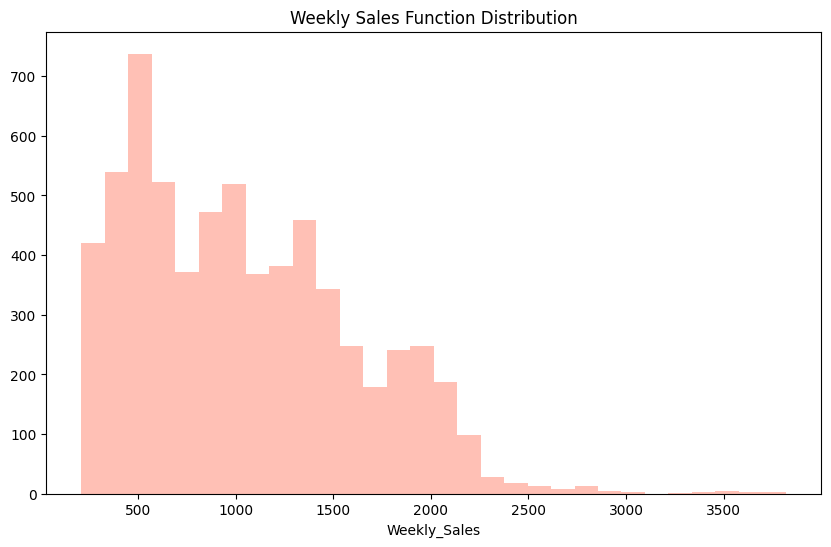

In [ ]:
plt.figure(figsize=(10, 6))
data["Weekly_Sales"]=data.Weekly_Sales/1000

sns.distplot(data.Weekly_Sales, kde=False, bins=30, color = 'tomato')
plt.title('Weekly Sales Function Distribution')
plt.show()

In the Distribution, natural Log of Sales and the square root of Sales look better distributed. We can use Natural Log for predictions later

In [ ]:
def scatter(dataset, column):
    plt.figure()
    plt.scatter(data[column] , data['Weekly_Sales'], color = 'turquoise')
    plt.ylabel('Weekly Sales')
    plt.xlabel(column)

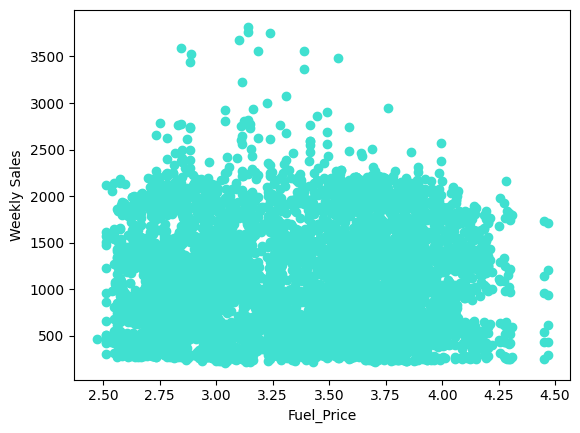

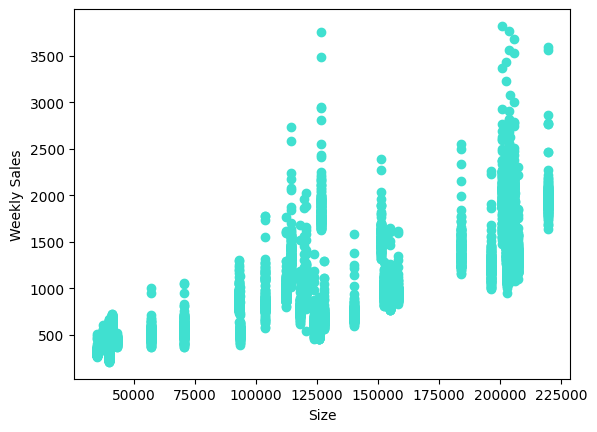

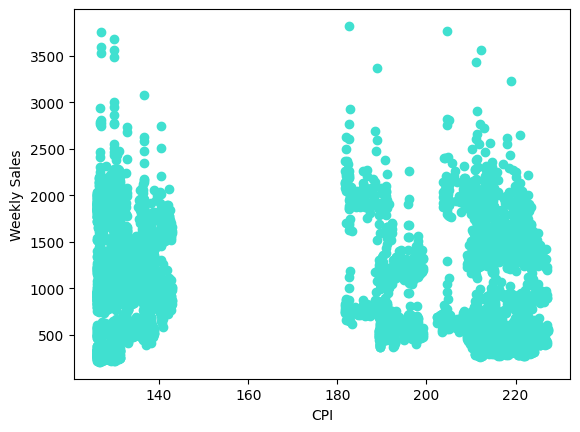

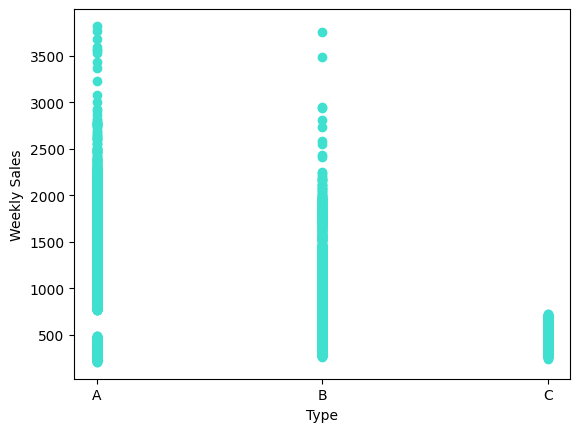

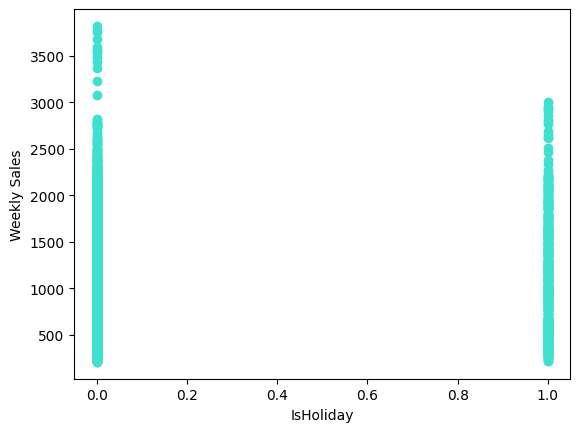

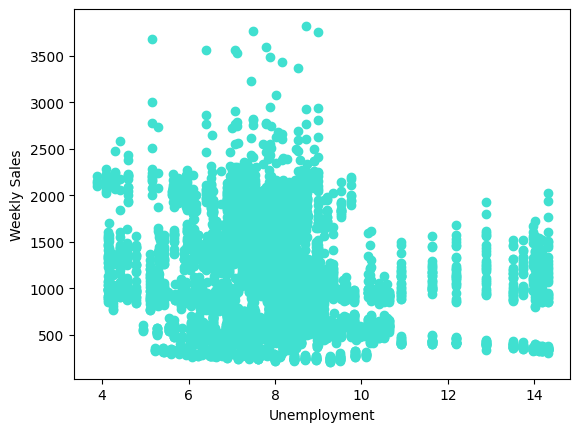

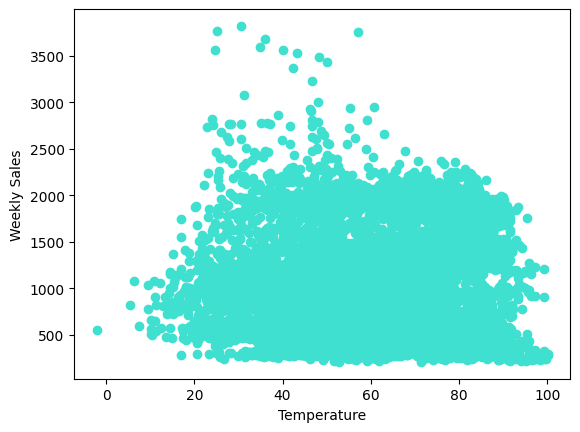

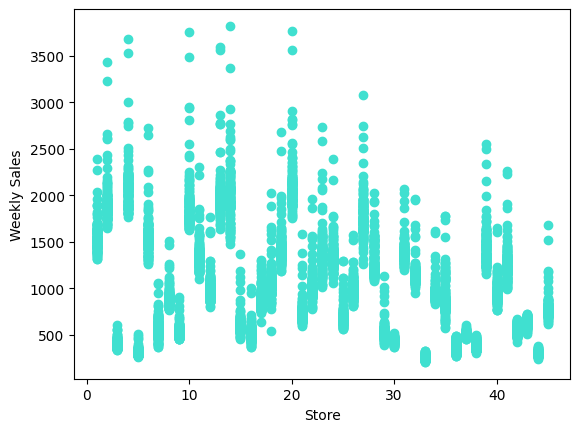

In [ ]:
scatter(data, 'Fuel_Price')
scatter(data, 'Size')
scatter(data, 'CPI')
scatter(data, 'Type')
scatter(data, 'IsHoliday')
scatter(data, 'Unemployment')
scatter(data, 'Temperature')
scatter(data, 'Store')

In [ ]:
data['Week'] = data.Date.dt.isocalendar().week

In [ ]:
data.head()

,Store,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Day,Month,Year,Week
0,1,2010-02-05,1643.69090,A,151315,42.31,2.572,-500.0,-500.0,-500.0,-500.0,-500.0,211.096358,8.106,0,5,Feb,2010,5
1,1,2010-02-12,1641.95744,A,151315,38.51,2.548,-500.0,-500.0,-500.0,-500.0,-500.0,211.242170,8.106,1,12,Feb,2010,6
2,1,2010-02-19,1611.96817,A,151315,39.93,2.514,-500.0,-500.0,-500.0,-500.0,-500.0,211.289143,8.106,0,19,Feb,2010,7
3,1,2010-02-26,1409.72759,A,151315,46.63,2.561,-500.0,-500.0,-500.0,-500.0,-500.0,211.319643,8.106,0,26,Feb,2010,8
4,1,2010-03-05,1554.80668,A,151315,46.50,2.625,-500.0,-500.0,-500.0,-500.0,-500.0,211.350143,8.106,0,5,Mar,2010,9


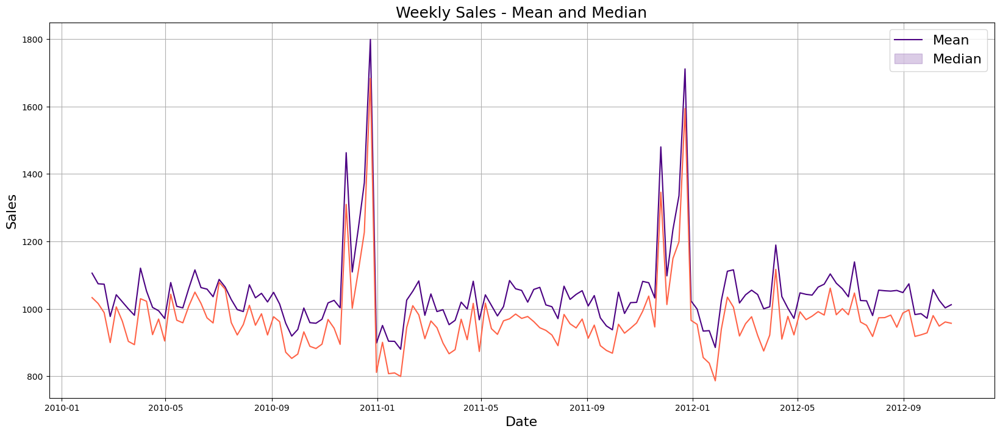

In [ ]:
weekly_sales_mean = data['Weekly_Sales'].groupby(data['Date']).mean()
weekly_sales_median = data['Weekly_Sales'].groupby(data['Date']).median()
plt.figure(figsize=(20,8))
sns.lineplot(x=weekly_sales_mean.index, y=weekly_sales_mean.values, color = 'indigo')
sns.lineplot(x=weekly_sales_median.index,y= weekly_sales_median.values, color = 'tomato')
plt.grid()
plt.legend(['Mean', 'Median'], loc='best', fontsize=16)
plt.title('Weekly Sales - Mean and Median', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.show()

#Checking the relationship of the other features with weekly sales

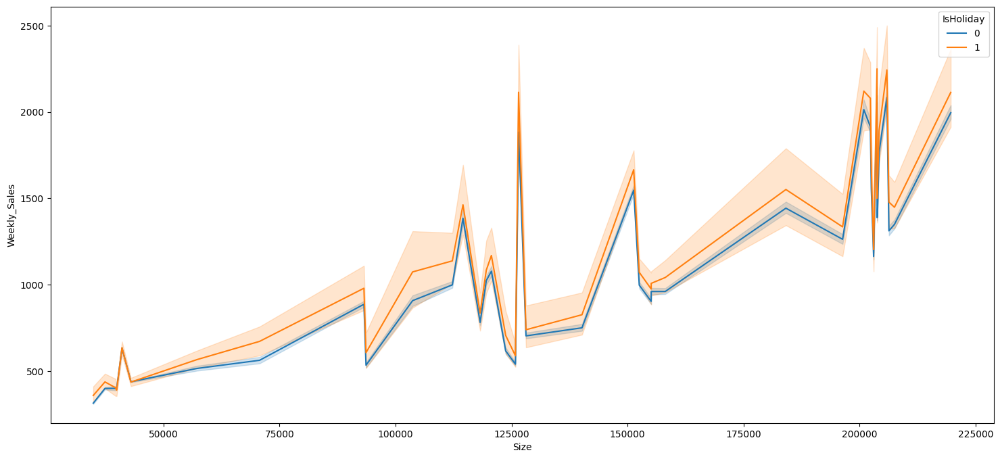

In [ ]:
plt.figure(figsize=(18,8))
sns.lineplot ( data = data, x = 'Size', y =  'Weekly_Sales', hue = 'IsHoliday');

In [ ]:
px.histogram(data, x='Temperature', y ='Weekly_Sales', color='IsHoliday', marginal='box')

In [ ]:
px.histogram(data, x='Fuel_Price', y ='Weekly_Sales', color='IsHoliday', marginal='box')

In [ ]:
px.histogram(data, x='CPI', y ='Weekly_Sales', color='IsHoliday')

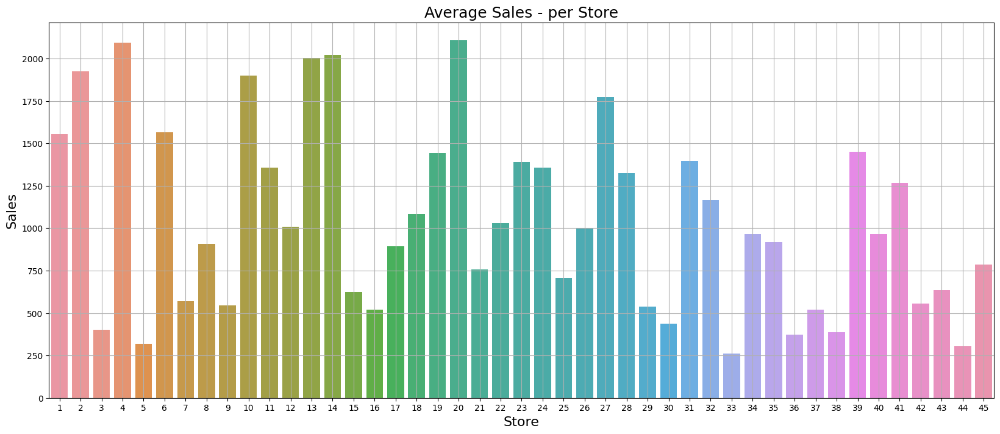

In [ ]:
weekly_sales = data['Weekly_Sales'].groupby(data['Store']).mean()
plt.figure(figsize=(20,8))
plt.style.use('default')
sns.barplot(x=weekly_sales.index, y=weekly_sales.values)
plt.grid()
plt.title('Average Sales - per Store', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Store', fontsize=16)
plt.show()

<ipython-input-50-8cb72bacb8e3>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

<ipython-input-50-8cb72bacb8e3>:4: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



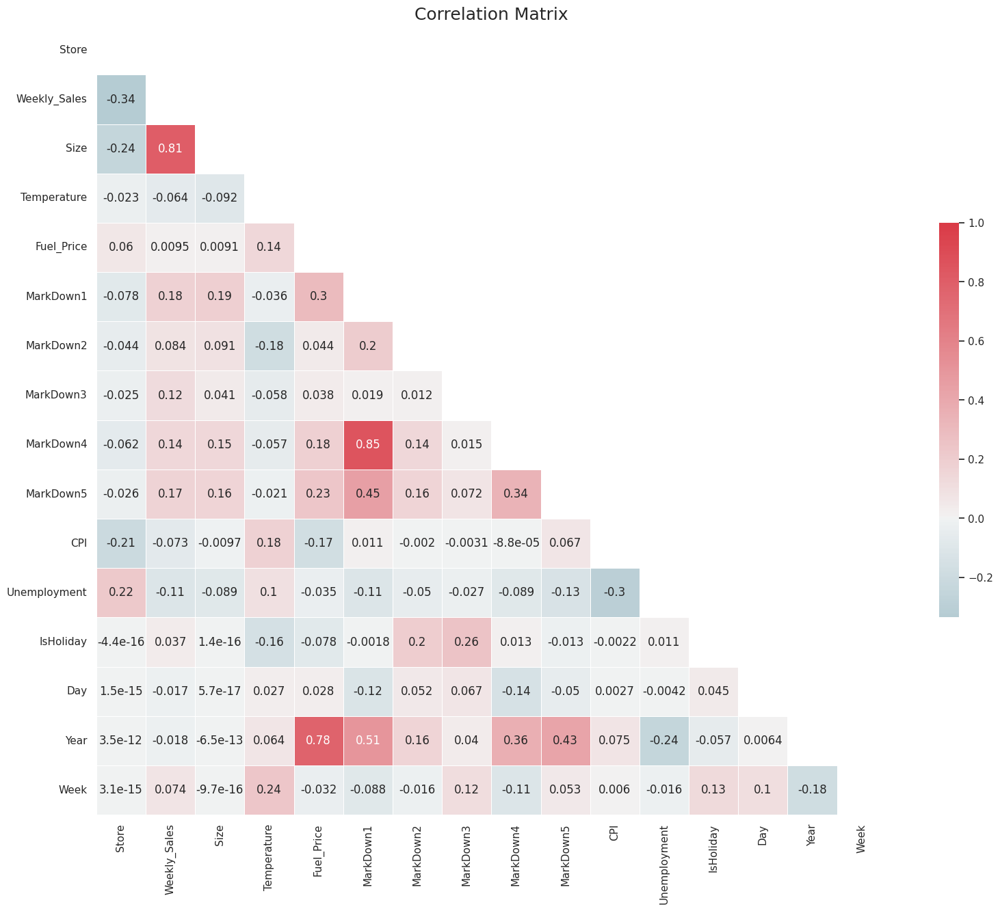

In [ ]:
sns.set(style="white")

corr = data.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20, 15))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
plt.title('Correlation Matrix', fontsize=18)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show()

#Detailed Time-Series Analysis

Store 4 & Store 6

In [ ]:
data1 = pd.read_csv('/content/train.csv.zip')
data1.set_index('Date', inplace=True)

store4 = data1[data1.Store == 4]
store6 = data1[data1.Store == 6]

sales4 = pd.DataFrame(store4.Weekly_Sales.groupby(store4.index).sum())
sales6 = pd.DataFrame(store6.Weekly_Sales.groupby(store6.index).sum())
sales4.dtypes
sales4.head(20)
sales6.dtypes
sales6.head(20)
sales4.reset_index(inplace = True)
sales6.reset_index(inplace = True)
sales4['Date'] = pd.to_datetime(sales4['Date'])
sales6['Date'] = pd.to_datetime(sales6['Date'])
sales4.set_index('Date',inplace = True)
sales6.set_index('Date',inplace = True)

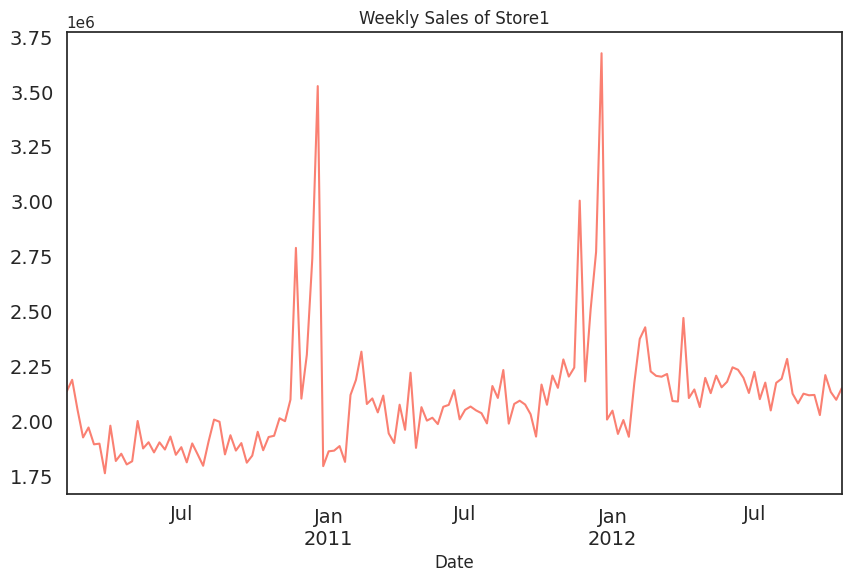

In [ ]:
sales4.Weekly_Sales.plot(figsize=(10,6), title= 'Weekly Sales of Store1', fontsize=14, color = 'salmon')
plt.show()

#Time Series Components

Trend: It represents the change in dependent variables with respect to time from start to end.

Seasonality: If observations repeats after fixed time interval then they are referred as seasonal observations.

Irregularities: This is also called as noise. Strange dips and jump in the data are called as irregularities.

Cyclicity: It occurs when observations in the series repeats in random pattern. Note that if there is any fixed pattern then it becomes seasonality, in case of cyclicity observations may repeat after a week, months or may be after a year.



---



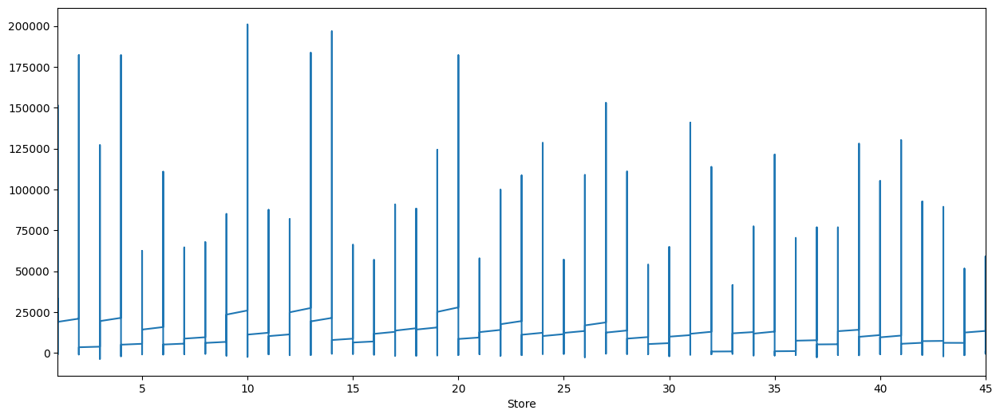

In [ ]:
import pandas as pd
%matplotlib inline
from statsmodels.tsa.filters.hp_filter import hpfilter
df = pd.read_csv('/content/train.csv.zip', index_col=0, parse_dates = True)
Weekly_Sales_cycle, Weekly_Sales_trend = hpfilter(df['Weekly_Sales'], lamb=1600)
Weekly_Sales_trend.plot(figsize=(15,6)).autoscale(axis='x',tight=True)

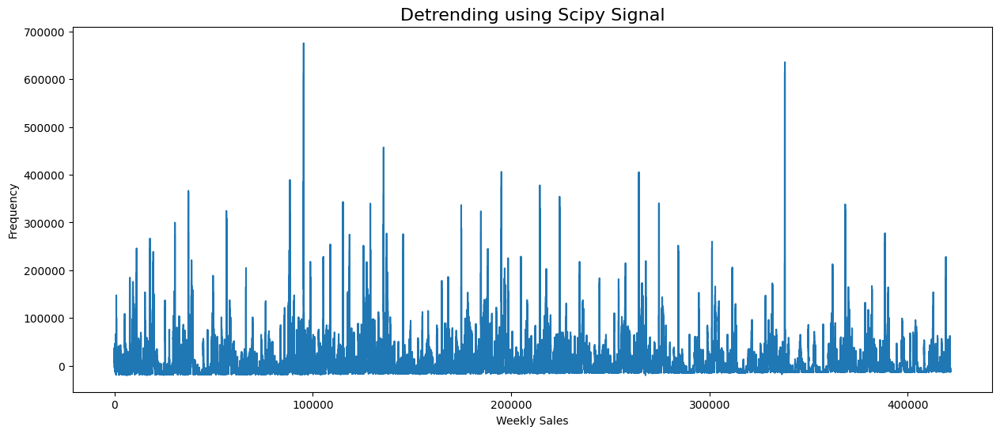

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
df = pd.read_csv('/content/train.csv.zip',index_col=0, parse_dates = True)
detrended = signal.detrend(df.Weekly_Sales.values)
plt.figure(figsize = (15,6))
plt.plot(detrended)
plt.xlabel('Weekly Sales')
plt.ylabel('Frequency')
plt.title('Detrending using Scipy Signal',fontsize = 16)
plt.show()

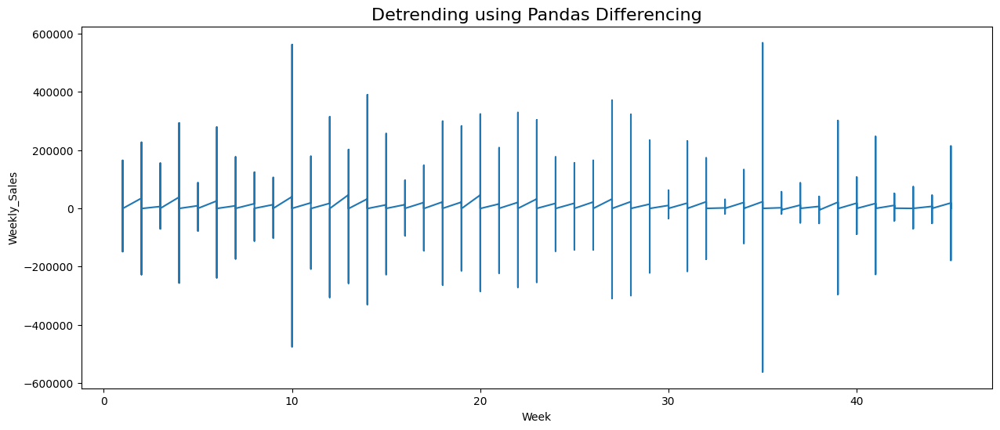

In [ ]:
from pandas import read_excel
from matplotlib import pyplot
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('/content/train.csv.zip', index_col=0, parse_dates = True)
diff = df.Weekly_Sales.diff()
plt.figure(figsize = (15,6))
pyplot.plot(diff)
pyplot.title('Detrending using Pandas Differencing', fontsize =16)
pyplot.xlabel('Week')
pyplot.ylabel('Weekly_Sales')
pyplot.show()

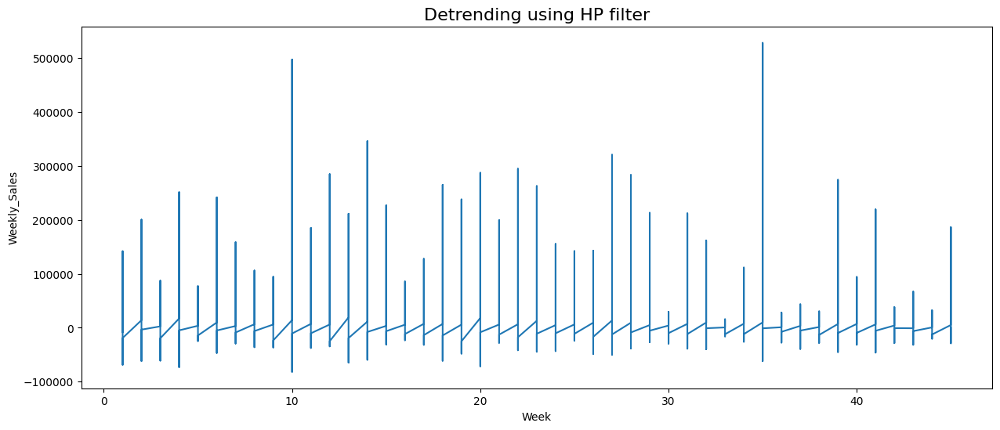

In [ ]:
from pandas import read_excel
from matplotlib import pyplot
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('/content/train.csv.zip', index_col=0, parse_dates = True)
Weekly_Sales_cycle, Weekly_Sales_trend = hpfilter(df['Weekly_Sales'], lamb=1600)
df['trend']= Weekly_Sales_trend
detrended= df.Weekly_Sales -df['trend']
plt.figure(figsize = (15,6))
pyplot.plot(detrended)
pyplot.title('Detrending using HP filter', fontsize =16)
pyplot.xlabel('Week')
pyplot.ylabel('Weekly_Sales')
pyplot.show()

Additive Decomposition




*   An additive model suggests that the components are added together.

*   An additive model is linear where changes over time are consistently made  
    by the same amount.
*   A linear seasonality has the same frequency (width of the cycles) and      amplitude (height of the cycles).








The statsmodels library provides an implementation of the naive, or classical, decomposition method in a function called seasonal_decompose(). You need to specify whether the model is additive or multiplicative.

The seasonal_decompose() function returns a result object which contains arrays to access four pieces of data from the decomposition.

<Figure size 640x480 with 0 Axes>

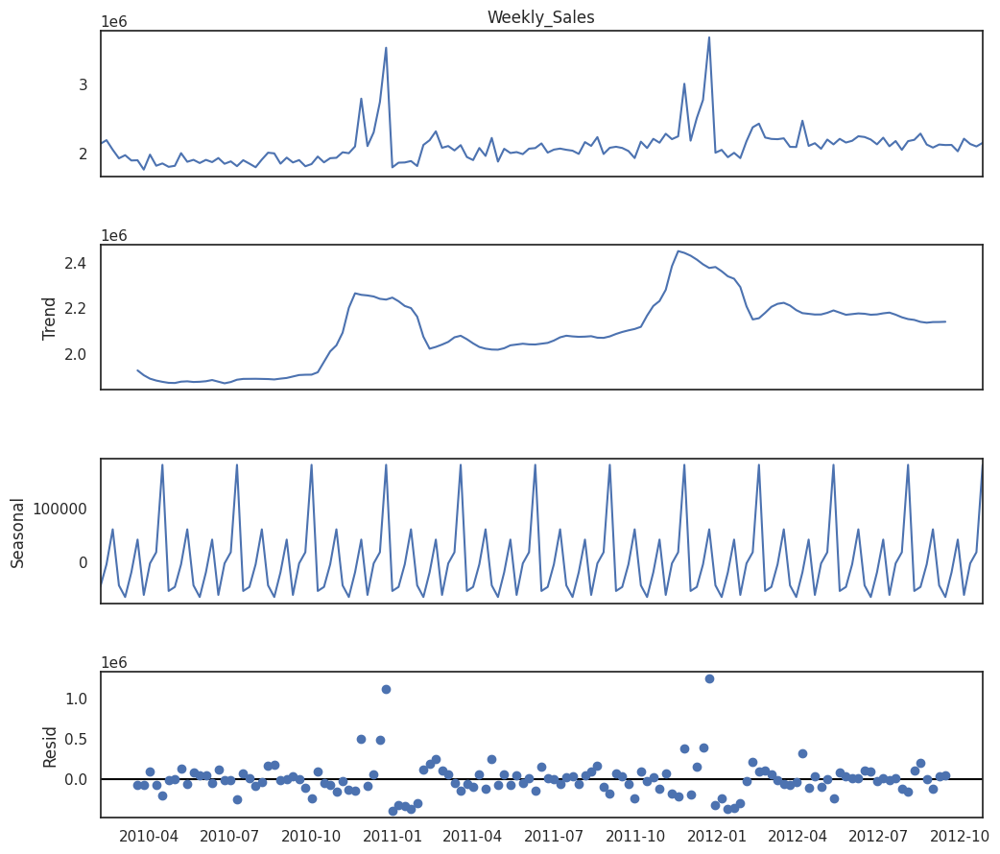

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(sales4.Weekly_Sales, period=12)
fig = plt.figure()
fig = decomposition.plot()
fig.set_size_inches(12, 10)
plt.show()

Multiplicative Decomposition


*   An additive model suggests that the components are multipled together.

*   An additive model is non-linear such as quadratic or exponential.
*   Changes increase or decrease over time.


*   A non-linear seasonality has an increasing or decreasing frequency (width of the cycles) and / or amplitude (height of the cycles) over time.







<Figure size 640x480 with 0 Axes>

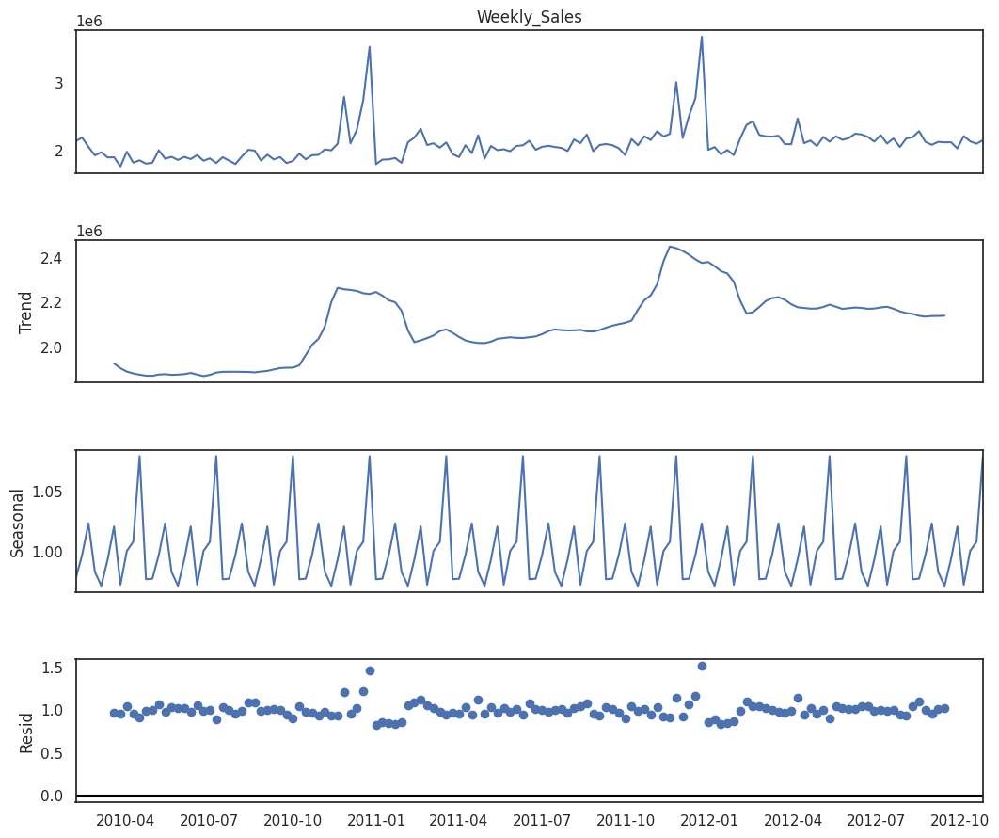

In [ ]:
decomposition = seasonal_decompose(sales4.Weekly_Sales, model= 'multiplicative', period=12)
fig = plt.figure()
fig = decomposition.plot()
fig.set_size_inches(12, 10)
plt.show()

In [ ]:
y1=sales4.Weekly_Sales
y2=sales6.Weekly_Sales

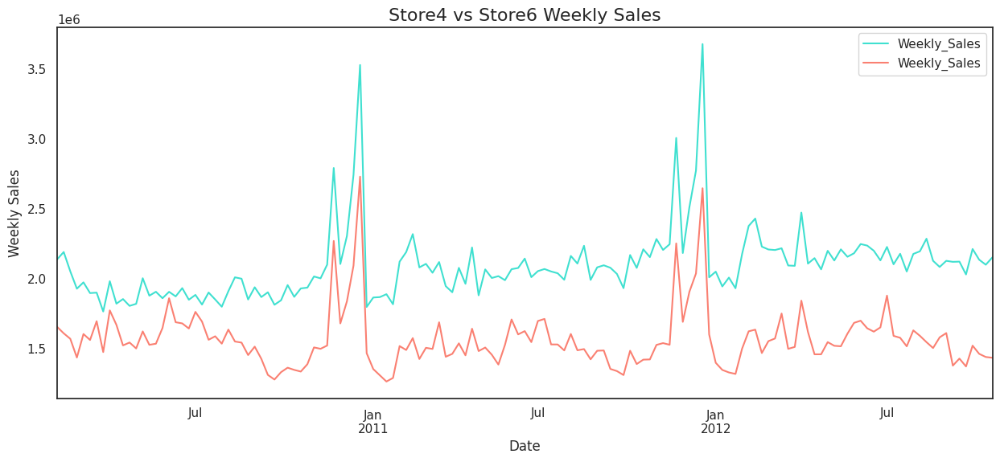

In [ ]:
y1.plot(figsize=(15, 6), legend=True, color = 'turquoise')
y2.plot(figsize=(15, 6), legend=True, color = 'salmon')
plt.ylabel('Weekly Sales')
plt.title('Store4 vs Store6 Weekly Sales', fontsize = '16')
plt.show()

This shows an interesting trend during year ends (during both 2011 & 2012). The best thing is both the stores have almost the same trends and spike just the magnitude is different.

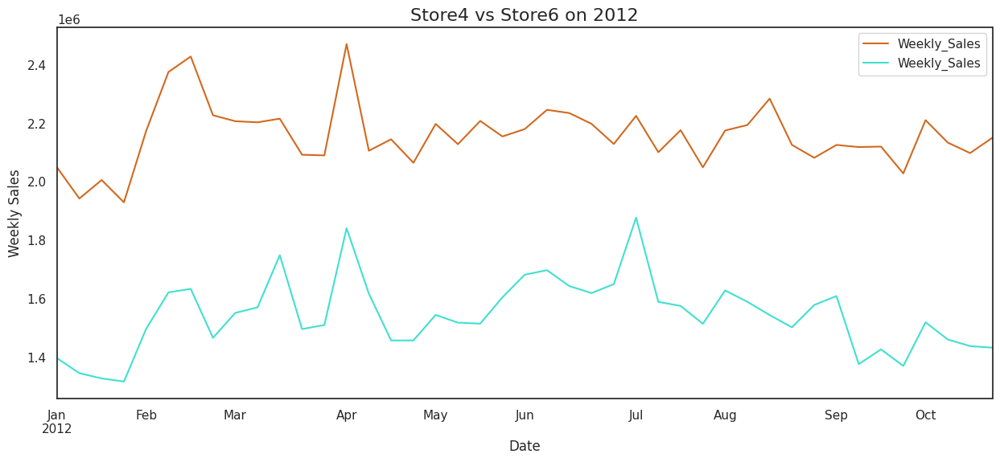

In [ ]:
# Lets Look into 2012 data for a better view
y1['2012'].plot(figsize=(15, 6),legend=True, color = 'chocolate')
y2['2012'].plot(figsize=(15, 6), legend=True, color = 'turquoise')
plt.ylabel('Weekly Sales')
plt.title('Store4 vs Store6 on 2012', fontsize = '16')
plt.show()

#ADF TEST

In [ ]:
import pandas as pd
from matplotlib import pyplot
from statsmodels.tsa.stattools import adfuller

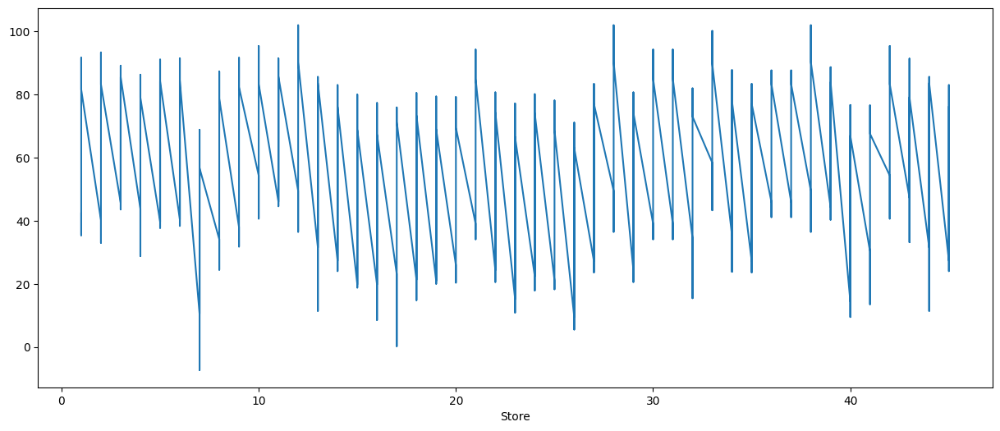

In [ ]:
series = pd.read_csv(r'/content/features.csv.zip', header=0, index_col=0)
series['Temperature'].plot(figsize=(15,6))
pyplot.show()

In [ ]:
def Augmented_Dickey_Fuller_Test_func(series , column_name):
    print (f'Results of Dickey-Fuller Test for column: {column_name}')
    dftest = adfuller(series, autolag='AIC')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 'Lags Used', 'Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    if dftest[1] <= 0.05:
        print("Conclusion:====>")
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Conclusion:====>")
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [ ]:
Augmented_Dickey_Fuller_Test_func( series['Temperature'], 'Temperature')

Results of Dickey-Fuller Test for column: Temperature
Test Statistic                -8.331707e+00
p-value                        3.354857e-13
Lags Used                      3.700000e+01
Number of Observations Used    8.152000e+03
Critical Value (1%)           -3.431152e+00
Critical Value (5%)           -2.861895e+00
Critical Value (10%)          -2.566959e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary


<Axes: xlabel='Store'>

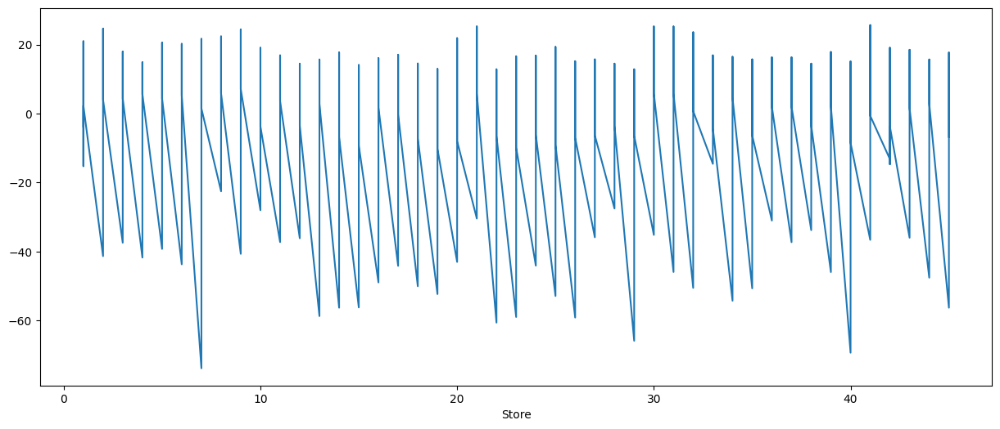

In [ ]:
series['Temperature'].diff().plot(figsize=(15,6))

In [ ]:
Augmented_Dickey_Fuller_Test_func(series['Temperature'].diff().dropna(),'')

Results of Dickey-Fuller Test for column: 
Test Statistic                  -28.543448
p-value                           0.000000
Lags Used                        37.000000
Number of Observations Used    8151.000000
Critical Value (1%)              -3.431153
Critical Value (5%)              -2.861895
Critical Value (10%)             -2.566959
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary


#ARIMA MODELLING

In [ ]:
import itertools
p = d = q = range(0, 5)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 52) for x in list(itertools.product(p, d, q))]

In [ ]:
import statsmodels.api as sm

mod = sm.tsa.statespace.SARIMAX(y1,
                                order=(4, 4, 3),
                                seasonal_order=(1, 1, 0, 52),   #enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()

print(results.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.7624      0.535     -3.295      0.001      -2.811      -0.714
ar.L2         -1.3055      0.578     -2.260      0.024      -2.438      -0.173
ar.L3         -0.6006      0.251     -2.390      0.017      -1.093      -0.108
ar.L4         -0.1900      0.090     -2.104      0.035      -0.367      -0.013
ma.L1         -1.3727      0.486     -2.827      0.005      -2.324      -0.421
ma.L2         -0.2331      1.044     -0.223      0.823      -2.279       1.813
ma.L3          0.6099      0.584      1.045      0.296      -0.534       1.754
ar.S.L52      -0.0682      0.048     -1.418      0.156      -0.163       0.026
sigma2      1.622e+10   5.35e-11   3.03e+20      0.000    1.62e+10    1.62e+10


<ipython-input-61-0b2061516065>:1: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



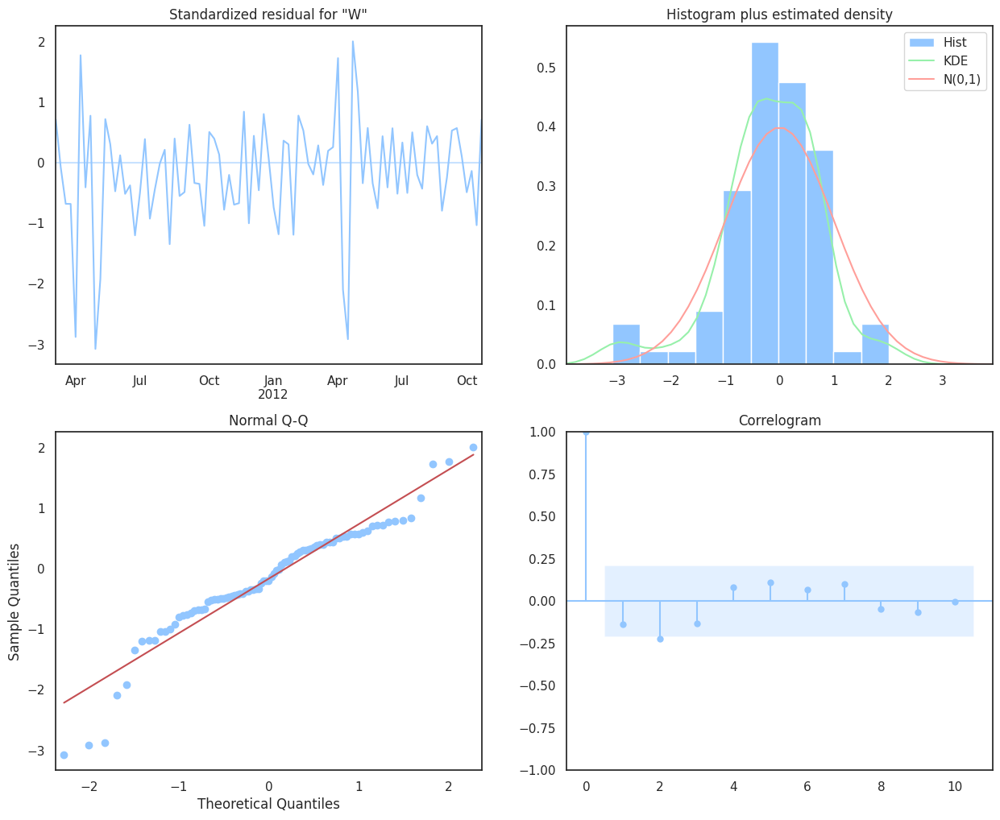

In [ ]:
plt.style.use('seaborn-pastel')
results.plot_diagnostics(figsize=(15, 12))
plt.show()

In [ ]:
# Will predict for last 90 days. So setting the date according to that
pred = results.get_prediction(start=pd.to_datetime('2012-07-27'), dynamic=False)
pred_ci = pred.conf_int()

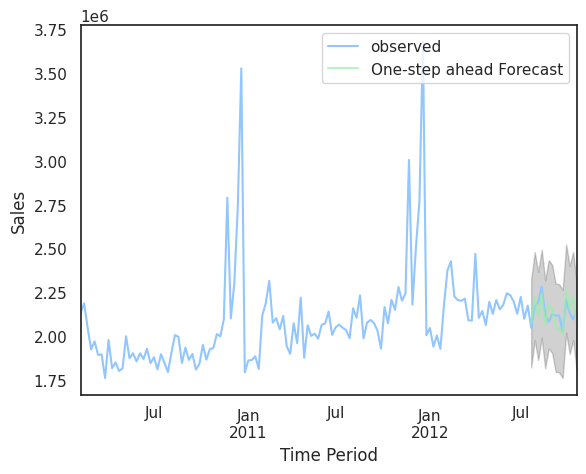

In [ ]:
ax = y1['2010':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Time Period')
ax.set_ylabel('Sales')
plt.legend()

plt.show()


In [ ]:
y_forecasted = pred.predicted_mean
y_truth = y1['2012-7-27':]

# Compute the mean square error
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 4720667479.51


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning:

Unknown keyword arguments: dict_keys(['full_results']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.



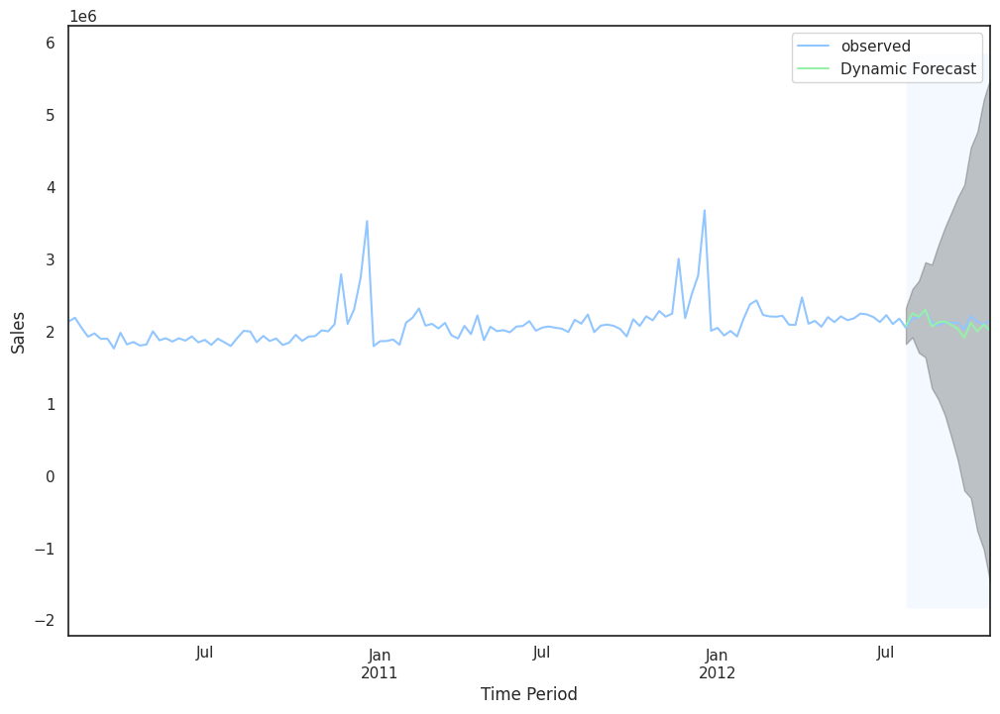

In [ ]:
pred_dynamic = results.get_prediction(start=pd.to_datetime('2012-7-27'), dynamic=True, full_results=True)
pred_dynamic_ci = pred_dynamic.conf_int()
ax = y1['2010':].plot(label='observed', figsize=(12, 8))
pred_dynamic.predicted_mean.plot(label='Dynamic Forecast', ax=ax)

ax.fill_between(pred_dynamic_ci.index,
                pred_dynamic_ci.iloc[:, 0],
                pred_dynamic_ci.iloc[:, 1], color='k', alpha=.25)

ax.fill_betweenx(ax.get_ylim(), pd.to_datetime('2012-7-26'), y1.index[-1],
                 alpha=.1, zorder=-1)

ax.set_xlabel('Time Period')
ax.set_ylabel('Sales')

plt.legend()
plt.show()

That looks good. Both the observed and predicted lines go together indicating nearly accurate prediction

In [ ]:
import numpy as np
y_forecasted = pred_dynamic.predicted_mean

y_truth = y1['2012-7-27':]

rmse = np.sqrt(((y_forecasted - y_truth) ** 2).mean())
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))

The Root Mean Squared Error of our forecasts is 75448.22


In [ ]:
Residual= y_forecasted - y_truth
print("Residual for Store1",np.abs(Residual).sum())

Residual for Store1 836795.2202102947


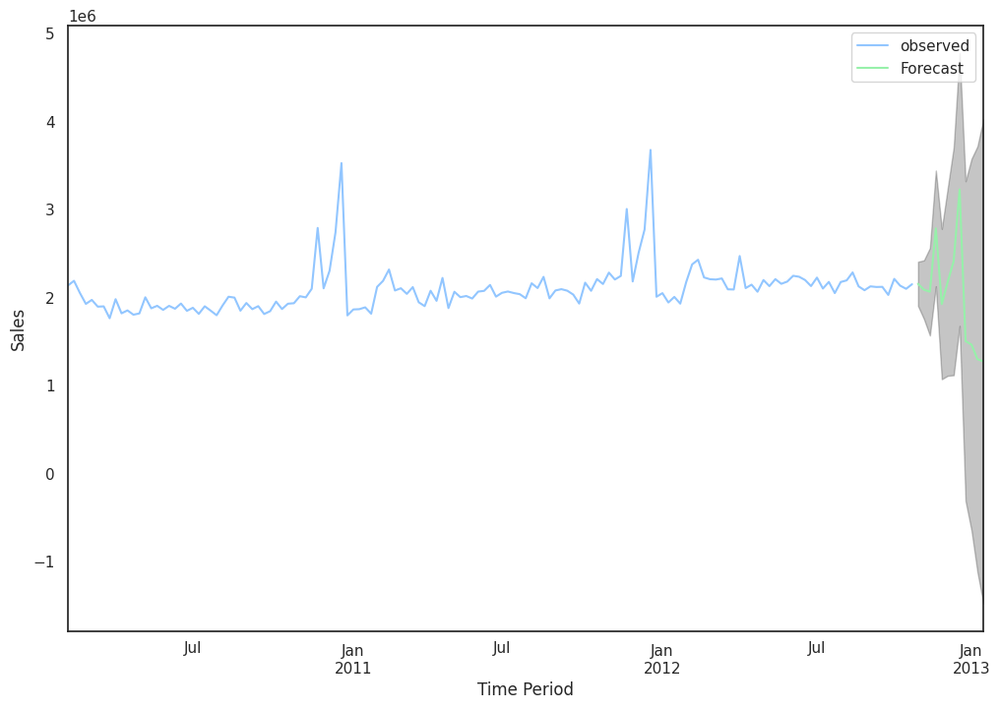

In [ ]:
pred_uc = results.get_forecast(steps=12)

pred_ci = pred_uc.conf_int()
ax = y1.plot(label='observed', figsize=(12, 8))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Time Period')
ax.set_ylabel('Sales')

plt.legend()
plt.show()

For future prediction the model is not that great because the error interval is way big. But if we just check the green line prediction this is almost like earlier years. If we look for may be first 2 weeks the prediction is way better and error is also low.

In [ ]:
!pip install pmdarima

In [ ]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from pmdarima import auto_arima
from sklearn import metrics
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

warnings.filterwarnings("ignore")

In [ ]:
X = df[['Weekly_Sales']]
train, test = X[0:-30], X[-30:]

In [ ]:
stepwise_model = auto_arima(train,start_p=1, start_q=1,
    max_p=2, max_q=2, seasonal=False,
    d=None, trace=True,error_action='ignore',suppress_warnings=True, stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8635774.964, Time=75.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8721382.587, Time=9.77 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8667096.477, Time=21.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8639826.300, Time=33.84 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8721380.587, Time=6.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8635362.318, Time=179.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8650824.285, Time=29.00 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8632112.993, Time=182.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8633168.356, Time=256.01 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=8632110.993, Time=152.76 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=8633166.323, Time=195.12 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8635360.316, Time=146.65 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8635772.963, Time=44.75 sec

Best model:  ARIMA(2,1,2)(0,0,0)[0]       

In [ ]:
stepwise_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               421540
Model:               SARIMAX(2, 1, 2)   Log Likelihood            -4316050.497
Date:                Thu, 02 Nov 2023   AIC                        8632110.993
Time:                        12:23:30   BIC                        8632165.752
Sample:                             0   HQIC                       8632126.606
                             - 421540                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4729      0.002   -249.510      0.000      -0.477      -0.469
ar.L2          0.2828      0.001    556.221      0.000       0.282       0.284
ma.L1          0.0087      0.002      4.616      0.000       0.005       0.012
ma.L2         -0.5563      0.001   -546.082      0.000      -0.558      -0.554
sigma2      4.693e+07   2.93e-11    1.6e+18      0.000    4.69e+07    4.69e+07
===================================================================================
Ljung-Box (L1) (Q):                  18.97   Jarque-Bera (JB):       10767371762.51
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.50   Skew:                            11.08
Prob(H) (two-sided):                  0.00   Kurtosis:                       785.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.29e+32. Standard errors may be unstable.
"""

In [ ]:
forecast,conf_int = stepwise_model.predict(n_periods=30,return_conf_int=True)
forecast = pd.DataFrame(forecast,columns=['sales_pred'])

In [ ]:
df_conf = pd.DataFrame(conf_int,columns= ['Upper_bound','Lower_bound'])
df_conf["new_index"] = range(1, 31)
df_conf = df_conf.set_index("new_index")

In [ ]:
forecast["new_index"] = range(1,31)
forecast = forecast.set_index("new_index")

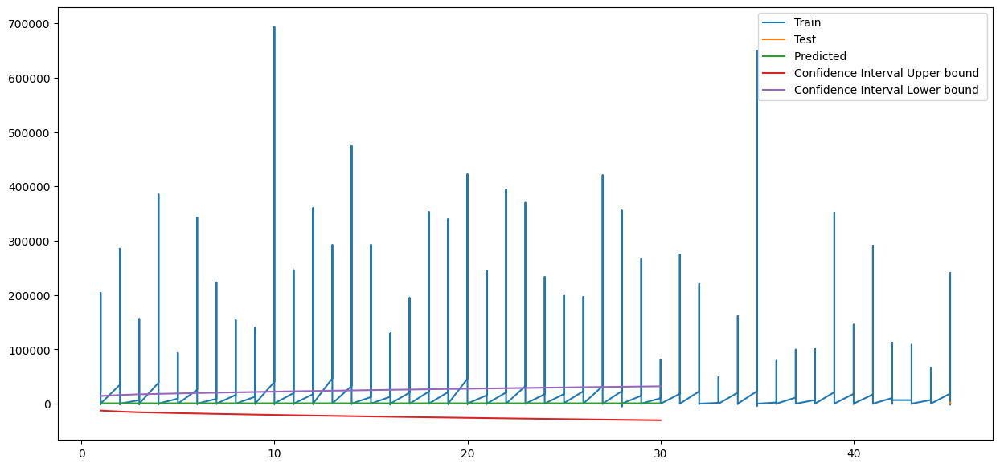

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [15,7]
plt.plot( train, label='Train ')
plt.plot(test, label='Test ')
plt.plot(forecast, label='Predicted ')
plt.plot(df_conf['Upper_bound'], label='Confidence Interval Upper bound ')
plt.plot(df_conf['Lower_bound'], label='Confidence Interval Lower bound ')
plt.legend(loc='best')
plt.show()

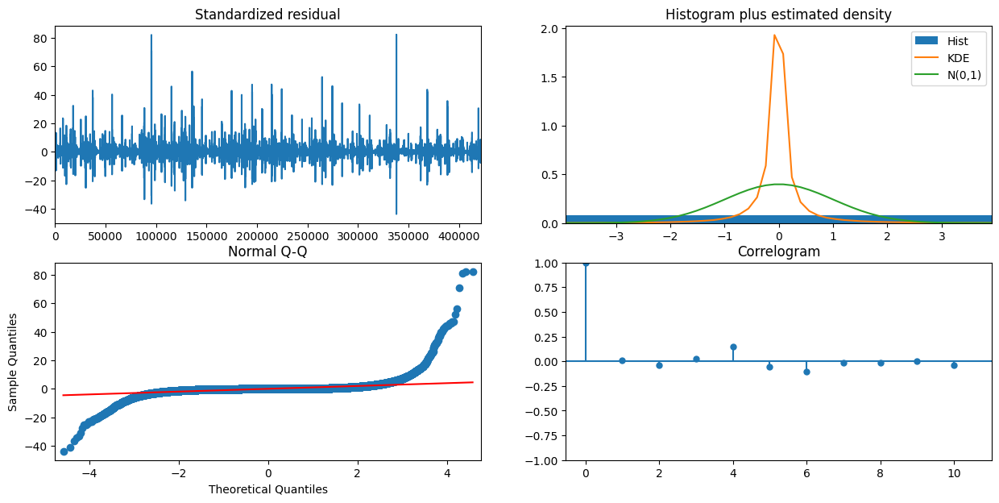

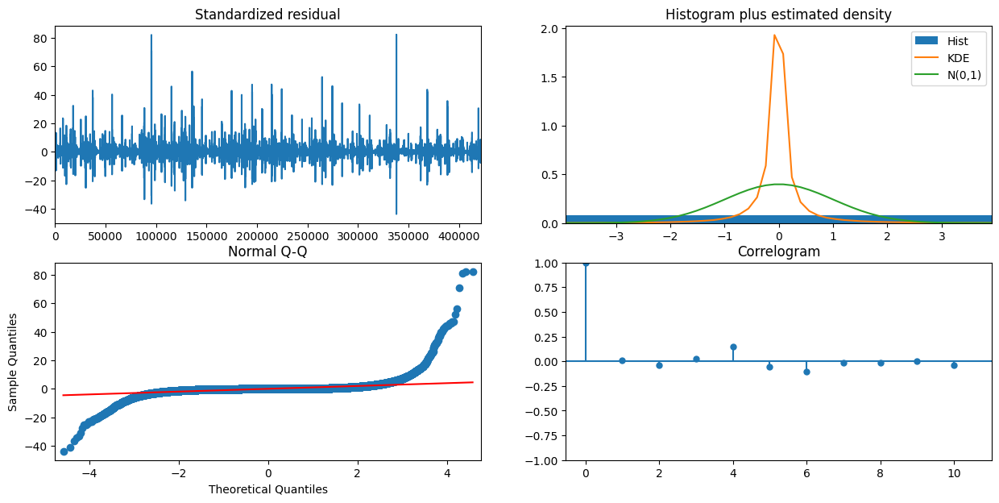

In [ ]:
stepwise_model.plot_diagnostics()

#Smoothing Method

In [ ]:
from statsmodels.tsa.api import SimpleExpSmoothing
import pandas as pd
import numpy as np
from sklearn import metrics
df =pd.read_csv(r'/content/features.csv.zip', header=0, index_col=0)


In [ ]:
df.head()

,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
Store,,,,,,,,,,,
1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
#Making a copy of the data for Close column for train/split
X = df['Temperature']
test = X.iloc[-30:] #Data expected for last 30 days
train = X.iloc[:-30] #Last 30 days to evaluate prediction

In [ ]:
#Function for calculating evaluation metrics to understand how far off our forecasts are against the actuals
#Closer to 0 better the model
#RMSE and MAPE are notable statistics measures used to check the accurcy of forecasting model.

def timeseries_evaluation_metrics_func(y_true, y_pred):

    def mean_absolute_percentage_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}') #how close a regression line is to a set of points.
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}') # average magnitude of the errors in a set of predictions.
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}') #square root of the avg of squared diff bet pred and actual obs
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}') #statistical measure of how accurate a forecast is.
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n') #proportion of variance in dependent variable by the independent variable

In [ ]:
resu = []
temp_df = pd.DataFrame()
for i in [0 , 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90,1]:
    print(f'Fitting for smoothing level= {i}')
    fit_v = SimpleExpSmoothing(np.asarray(train)).fit(i)
    fcst_pred_v= fit_v.forecast(30)
    timeseries_evaluation_metrics_func(test,fcst_pred_v)
    rmse = np.sqrt(metrics.mean_squared_error(test, fcst_pred_v))
    df3 = {'smoothing parameter':i, 'RMSE': rmse}
    temp_df = temp_df.append(df3, ignore_index=True)
temp_df.sort_values(by=['RMSE'])

Fitting for smoothing level= 0
Evaluation metric results:-
MSE is : 405.54662666666655
MAE is : 16.148000000000003
RMSE is : 20.13818826674005
MAPE is : 27.986975123731817
R2 is : -0.37945354268635145

Fitting for smoothing level= 0.1
Evaluation metric results:-
MSE is : 295.6590459659313
MAE is : 15.450666666666669
RMSE is : 17.194738903685955
MAPE is : 32.385772008642085
R2 is : -0.005674542868767896

Fitting for smoothing level= 0.2
Evaluation metric results:-
MSE is : 361.30802647343273
MAE is : 15.848847242420778
RMSE is : 19.008104231443827
MAPE is : 28.83154377720432
R2 is : -0.22897739580867005

Fitting for smoothing level= 0.3
Evaluation metric results:-
MSE is : 414.94606701062037
MAE is : 16.235193456472846
RMSE is : 20.370225011290877
MAPE is : 27.90467638019592
R2 is : -0.4114254305758134

Fitting for smoothing level= 0.4
Evaluation metric results:-
MSE is : 445.0448486287232
MAE is : 16.558135147785084
RMSE is : 21.09608609739549
MAPE is : 27.81649718557318
R2 is : -0.513

/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
<ipython-input-15-d993ad97386a>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_df = temp_df.append(df3, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
<ipython-input-15-d993ad97386a>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_df = temp_df.append(df3, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: EstimationWarning: Model has no free parameters to estimate. Set optim

,smoothing parameter,RMSE
1,0.1,17.194739
2,0.2,19.008104
0,0.0,20.138188
3,0.3,20.370225
4,0.4,21.096086
5,0.5,21.602520
6,0.6,22.065793
7,0.7,22.541929
8,0.8,23.040545
9,0.9,23.556306


In [ ]:
fitSES = SimpleExpSmoothing(np.asarray(train)).fit( smoothing_level = 1.0,optimized= False)
fcst_gs_pred = fitSES.forecast(30)
timeseries_evaluation_metrics_func(test,fcst_gs_pred)

Evaluation metric results:-
MSE is : 580.0065266666667
MAE is : 18.588000000000005
RMSE is : 24.08332465974469
MAPE is : 29.699630161434982
R2 is : -0.9728731676744133



In [ ]:
fitSESauto = SimpleExpSmoothing(np.asarray(train)).fit( optimized= True, use_brute = True)
fcst_auto_pred = fitSESauto.forecast(30)
timeseries_evaluation_metrics_func(test,fcst_auto_pred)

Evaluation metric results:-
MSE is : 528.5909229785241
MAE is : 17.79284235029519
RMSE is : 22.991105301366527
MAPE is : 28.801751363546423
R2 is : -0.7979846789205371



In [ ]:
fitSESauto.summary()

Dep. Variable:,endog,No. Observations:,8160
Model:,SimpleExpSmoothing,SSE,375764.506
Optimized:,True,AIC,31254.503
Trend:,None,BIC,31268.517
Seasonal:,None,AICC,31254.508
Seasonal Periods:,None,Date:,"Fri, 17 Nov 2023"
Box-Cox:,False,Time:,05:56:08
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.7902602,alpha,True
initial_level,42.310000,l.0,False


In [ ]:
df_fcst_gs_pred = pd.DataFrame(fcst_gs_pred, columns=['Close_grid_Search'])
df_fcst_gs_pred["new_index"] = range(1229, 1259)
df_fcst_gs_pred = df_fcst_gs_pred.set_index("new_index")

In [ ]:
df_fcst_auto_pred = pd.DataFrame(fcst_auto_pred, columns=['Close_auto_search'])
df_fcst_auto_pred["new_index"] = range(1229, 1259)
df_fcst_auto_pred = df_fcst_auto_pred.set_index("new_index")

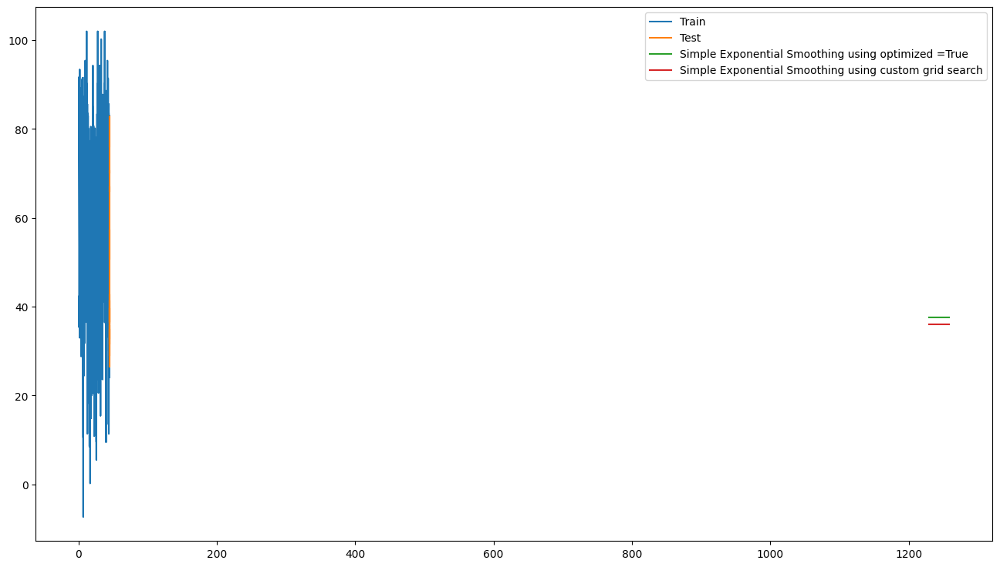

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [16,9]
plt.plot( train, label='Train')
plt.plot(test, label='Test')
plt.plot(df_fcst_auto_pred, label='Simple Exponential Smoothing using optimized =True')
plt.plot(df_fcst_gs_pred, label='Simple Exponential Smoothing using custom grid search')
plt.legend(loc='best')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn import metrics
from timeit import default_timer as timer
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [ ]:
df.head()

,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
Store,,,,,,,,,,,
1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
df['Temperature'] = df['Temperature']

In [ ]:
train = df.Temperature[0:-30]
test = df.Temperature[-30:]

In [ ]:
def timeseries_evaluation_metrics_func(y_true, y_pred):

    def mean_absolute_percentage_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')

In [ ]:
from sklearn.model_selection import ParameterGrid
#dampening - decreasing future time trends on a straight line(no trend)
param_grid = {'smoothing_level': [0.10, 0.20,.30,.40,.50,.60,.70,.80,.90], 'smoothing_slope':[0.10, 0.20,.30,.40,.50,.60,.70,.80,.90],
              'damping_slope': [0.10, 0.20,.30,.40,.50,.60,.70,.80,.90],'damped' : [True, False]}
pg = list(ParameterGrid(param_grid))

In [ ]:
df_results_moni = pd.DataFrame(columns=['smoothing_level', 'smoothing_slope', 'damping_slope','damped','RMSE','r2'])
start = timer()
for a,b in enumerate(pg):
    smoothing_level = b.get('smoothing_level')
    smoothing_slope = b.get('smoothing_slope')
    damping_slope = b.get('damping_slope')
    damped = b.get('damped')
    print(smoothing_level, smoothing_slope, damping_slope,damped)
    fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
    #fit1.summary
    z = fit1.forecast(30)
    print(z)
    df_pred = pd.DataFrame(z, columns=['Forecasted_result'])
    RMSE = np.sqrt(metrics.mean_squared_error(test, df_pred.Forecasted_result))
    r2 = metrics.r2_score(test, df_pred.Forecasted_result)
    print( f' RMSE is {np.sqrt(metrics.mean_squared_error(test, df_pred.Forecasted_result))}')
    df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
end = timer()
print(f' Total time taken to complete grid search in seconds: {(end - start)}')

0.1 0.1 0.1 True
8160    51.474400
8161    51.472554
8162    51.472369
8163    51.472350
8164    51.472349
8165    51.472348
8166    51.472348
8167    51.472348
8168    51.472348
8169    51.472348
8170    51.472348
8171    51.472348
8172    51.472348
8173    51.472348
8174    51.472348
8175    51.472348
8176    51.472348
8177    51.472348
8178    51.472348
8179    51.472348
8180    51.472348
8181    51.472348
8182    51.472348
8183    51.472348
8184    51.472348
8185    51.472348
8186    51.472348
8187    51.472348
8188    51.472348
8189    51.472348
dtype: float64
 RMSE is 17.203271303660784
0.1 0.2 0.1 True
8160    51.368834
8161    51.365162
8162    51.364794
8163    51.364758
8164    51.364754
8165    51.364754
8166    51.364753
8167    51.364753
8168    51.364753
8169    51.364753
8170    51.364753
8171    51.364753
8172    51.364753
8173    51.364753
8174    51.364753
8175    51.364753
8176    51.364753
8177    51.364753
8178    51.364753
8179    51.364753
8180    51.364753
8181 

<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa

8160    51.263711
8161    51.258234
8162    51.257687
8163    51.257632
8164    51.257627
8165    51.257626
8166    51.257626
8167    51.257626
8168    51.257626
8169    51.257626
8170    51.257626
8171    51.257626
8172    51.257626
8173    51.257626
8174    51.257626
8175    51.257626
8176    51.257626
8177    51.257626
8178    51.257626
8179    51.257626
8180    51.257626
8181    51.257626
8182    51.257626
8183    51.257626
8184    51.257626
8185    51.257626
8186    51.257626
8187    51.257626
8188    51.257626
8189    51.257626
dtype: float64
 RMSE is 17.22222410057096
0.1 0.4 0.1 True
8160    51.159053
8161    51.151794
8162    51.151068
8163    51.150996
8164    51.150989
8165    51.150988
8166    51.150988
8167    51.150988
8168    51.150988
8169    51.150988
8170    51.150988
8171    51.150988
8172    51.150988
8173    51.150988
8174    51.150988
8175    51.150988
8176    51.150988
8177    51.150988
8178    51.150988
8179    51.150988
8180    51.150988
8181    51.150988
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    50.951219
8161    50.940458
8162    50.939382
8163    50.939275
8164    50.939264
8165    50.939263
8166    50.939263
8167    50.939263
8168    50.939263
8169    50.939263
8170    50.939263
8171    50.939263
8172    50.939263
8173    50.939263
8174    50.939263
8175    50.939263
8176    50.939263
8177    50.939263
8178    50.939263
8179    50.939263
8180    50.939263
8181    50.939263
8182    50.939263
8183    50.939263
8184    50.939263
8185    50.939263
8186    50.939263
8187    50.939263
8188    50.939263
8189    50.939263
dtype: float64
 RMSE is 17.255194264949044
0.1 0.7 0.1 True
8160    50.848081
8161    50.835601
8162    50.834353
8163    50.834229
8164    50.834216
8165    50.834215
8166    50.834215
8167    50.834215
8168    50.834215
8169    50.834215
8170    50.834215
8171    50.834215
8172    50.834215
8173    50.834215
8174    50.834215
8175    50.834215
8176    50.834215
8177    50.834215
8178    50.834215
8179    50.834215
8180    50.834215
8181    50.834215
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    50.643455
8161    50.627599
8162    50.626014
8163    50.625855
8164    50.625839
8165    50.625838
8166    50.625838
8167    50.625838
8168    50.625838
8169    50.625838
8170    50.625838
8171    50.625838
8172    50.625838
8173    50.625838
8174    50.625838
8175    50.625838
8176    50.625838
8177    50.625838
8178    50.625838
8179    50.625838
8180    50.625838
8181    50.625838
8182    50.625838
8183    50.625838
8184    50.625838
8185    50.625838
8186    50.625838
8187    50.625838
8188    50.625838
8189    50.625838
dtype: float64
 RMSE is 17.293305712162734
0.2 0.1 0.1 True
8160    44.573625
8161    44.571374
8162    44.571149
8163    44.571127
8164    44.571124
8165    44.571124
8166    44.571124
8167    44.571124
8168    44.571124
8169    44.571124
8170    44.571124
8171    44.571124
8172    44.571124
8173    44.571124
8174    44.571124
8175    44.571124
8176    44.571124
8177    44.571124
8178    44.571124
8179    44.571124
8180    44.571124
8181    44.571124
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    44.392235
8161    44.385599
8162    44.384936
8163    44.384869
8164    44.384863
8165    44.384862
8166    44.384862
8167    44.384862
8168    44.384862
8169    44.384862
8170    44.384862
8171    44.384862
8172    44.384862
8173    44.384862
8174    44.384862
8175    44.384862
8176    44.384862
8177    44.384862
8178    44.384862
8179    44.384862
8180    44.384862
8181    44.384862
8182    44.384862
8183    44.384862
8184    44.384862
8185    44.384862
8186    44.384862
8187    44.384862
8188    44.384862
8189    44.384862
dtype: float64
 RMSE is 19.131865009397416
0.2 0.4 0.1 True
8160    44.304429
8161    44.295655
8162    44.294778
8163    44.294690
8164    44.294682
8165    44.294681
8166    44.294681
8167    44.294681
8168    44.294681
8169    44.294681
8170    44.294681
8171    44.294681
8172    44.294681
8173    44.294681
8174    44.294681
8175    44.294681
8176    44.294681
8177    44.294681
8178    44.294681
8179    44.294681
8180    44.294681
8181    44.294681
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    44.134387
8161    44.121444
8162    44.120149
8163    44.120020
8164    44.120007
8165    44.120006
8166    44.120006
8167    44.120006
8168    44.120006
8169    44.120006
8170    44.120006
8171    44.120006
8172    44.120006
8173    44.120006
8174    44.120006
8175    44.120006
8176    44.120006
8177    44.120006
8178    44.120006
8179    44.120006
8180    44.120006
8181    44.120006
8182    44.120006
8183    44.120006
8184    44.120006
8185    44.120006
8186    44.120006
8187    44.120006
8188    44.120006
8189    44.120006
dtype: float64
 RMSE is 19.250961949850332
0.2 0.7 0.1 True
8160    44.052070
8161    44.037093
8162    44.035595
8163    44.035445
8164    44.035430
8165    44.035429
8166    44.035429
8167    44.035429
8168    44.035429
8169    44.035429
8170    44.035429
8171    44.035429
8172    44.035429
8173    44.035429
8174    44.035429
8175    44.035429
8176    44.035429
8177    44.035429
8178    44.035429
8179    44.035429
8180    44.035429
8181    44.035429
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    43.892649
8161    43.873697
8162    43.871801
8163    43.871612
8164    43.871593
8165    43.871591
8166    43.871591
8167    43.871591
8168    43.871591
8169    43.871591
8170    43.871591
8171    43.871591
8172    43.871591
8173    43.871591
8174    43.871591
8175    43.871591
8176    43.871591
8177    43.871591
8178    43.871591
8179    43.871591
8180    43.871591
8181    43.871591
8182    43.871591
8183    43.871591
8184    43.871591
8185    43.871591
8186    43.871591
8187    43.871591
8188    43.871591
8189    43.871591
dtype: float64
 RMSE is 19.365288164984634
0.3 0.1 0.1 True
8160    41.817424
8161    41.814862
8162    41.814606
8163    41.814580
8164    41.814578
8165    41.814578
8166    41.814578
8167    41.814578
8168    41.814578
8169    41.814578
8170    41.814578
8171    41.814578
8172    41.814578
8173    41.814578
8174    41.814578
8175    41.814578
8176    41.814578
8177    41.814578
8178    41.814578
8179    41.814578
8180    41.814578
8181    41.814578
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.708627
8161    41.701027
8162    41.700267
8163    41.700191
8164    41.700184
8165    41.700183
8166    41.700183
8167    41.700183
8168    41.700183
8169    41.700183
8170    41.700183
8171    41.700183
8172    41.700183
8173    41.700183
8174    41.700183
8175    41.700183
8176    41.700183
8177    41.700183
8178    41.700183
8179    41.700183
8180    41.700183
8181    41.700183
8182    41.700183
8183    41.700183
8184    41.700183
8185    41.700183
8186    41.700183
8187    41.700183
8188    41.700183
8189    41.700183
dtype: float64
 RMSE is 20.46473630335517
0.3 0.4 0.1 True
8160    41.656328
8161    41.646249
8162    41.645241
8163    41.645140
8164    41.645130
8165    41.645129
8166    41.645129
8167    41.645129
8168    41.645129
8169    41.645129
8170    41.645129
8171    41.645129
8172    41.645129
8173    41.645129
8174    41.645129
8175    41.645129
8176    41.645129
8177    41.645129
8178    41.645129
8179    41.645129
8180    41.645129
8181    41.645129
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.555666
8161    41.540702
8162    41.539205
8163    41.539056
8164    41.539041
8165    41.539039
8166    41.539039
8167    41.539039
8168    41.539039
8169    41.539039
8170    41.539039
8171    41.539039
8172    41.539039
8173    41.539039
8174    41.539039
8175    41.539039
8176    41.539039
8177    41.539039
8178    41.539039
8179    41.539039
8180    41.539039
8181    41.539039
8182    41.539039
8183    41.539039
8184    41.539039
8185    41.539039
8186    41.539039
8187    41.539039
8188    41.539039
8189    41.539039
dtype: float64
 RMSE is 20.55326567732917
0.3 0.7 0.1 True
8160    41.507205
8161    41.489831
8162    41.488094
8163    41.487920
8164    41.487902
8165    41.487901
8166    41.487901
8167    41.487901
8168    41.487900
8169    41.487900
8170    41.487900
8171    41.487900
8172    41.487900
8173    41.487900
8174    41.487900
8175    41.487900
8176    41.487900
8177    41.487900
8178    41.487900
8179    41.487900
8180    41.487900
8181    41.487900
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.413787
8161    41.391653
8162    41.389440
8163    41.389219
8164    41.389197
8165    41.389194
8166    41.389194
8167    41.389194
8168    41.389194
8169    41.389194
8170    41.389194
8171    41.389194
8172    41.389194
8173    41.389194
8174    41.389194
8175    41.389194
8176    41.389194
8177    41.389194
8178    41.389194
8179    41.389194
8180    41.389194
8181    41.389194
8182    41.389194
8183    41.389194
8184    41.389194
8185    41.389194
8186    41.389194
8187    41.389194
8188    41.389194
8189    41.389194
dtype: float64
 RMSE is 20.636376964766125
0.4 0.1 0.1 True
8160    40.541166
8161    40.538084
8162    40.537775
8163    40.537744
8164    40.537741
8165    40.537741
8166    40.537741
8167    40.537741
8168    40.537741
8169    40.537741
8170    40.537741
8171    40.537741
8172    40.537741
8173    40.537741
8174    40.537741
8175    40.537741
8176    40.537741
8177    40.537741
8178    40.537741
8179    40.537741
8180    40.537741
8181    40.537741
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.462638
8161    40.453433
8162    40.452512
8163    40.452420
8164    40.452411
8165    40.452410
8166    40.452410
8167    40.452410
8168    40.452410
8169    40.452410
8170    40.452410
8171    40.452410
8172    40.452410
8173    40.452410
8174    40.452410
8175    40.452410
8176    40.452410
8177    40.452410
8178    40.452410
8179    40.452410
8180    40.452410
8181    40.452410
8182    40.452410
8183    40.452410
8184    40.452410
8185    40.452410
8186    40.452410
8187    40.452410
8188    40.452410
8189    40.452410
dtype: float64
 RMSE is 21.171733186996168
0.4 0.4 0.1 True
8160    40.424453
8161    40.412204
8162    40.410980
8163    40.410857
8164    40.410845
8165    40.410844
8166    40.410843
8167    40.410843
8168    40.410843
8169    40.410843
8170    40.410843
8171    40.410843
8172    40.410843
8173    40.410843
8174    40.410843
8175    40.410843
8176    40.410843
8177    40.410843
8178    40.410843
8179    40.410843
8180    40.410843
8181    40.410843
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.350041
8161    40.331734
8162    40.329904
8163    40.329720
8164    40.329702
8165    40.329700
8166    40.329700
8167    40.329700
8168    40.329700
8169    40.329700
8170    40.329700
8171    40.329700
8172    40.329700
8173    40.329700
8174    40.329700
8175    40.329700
8176    40.329700
8177    40.329700
8178    40.329700
8179    40.329700
8180    40.329700
8181    40.329700
8182    40.329700
8183    40.329700
8184    40.329700
8185    40.329700
8186    40.329700
8187    40.329700
8188    40.329700
8189    40.329700
dtype: float64
 RMSE is 21.24406770156453
0.4 0.7 0.1 True
8160    40.313738
8161    40.292416
8162    40.290283
8163    40.290070
8164    40.290049
8165    40.290047
8166    40.290046
8167    40.290046
8168    40.290046
8169    40.290046
8170    40.290046
8171    40.290046
8172    40.290046
8173    40.290046
8174    40.290046
8175    40.290046
8176    40.290046
8177    40.290046
8178    40.290046
8179    40.290046
8180    40.290046
8181    40.290046
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.242769
8161    40.215433
8162    40.212699
8163    40.212426
8164    40.212399
8165    40.212396
8166    40.212396
8167    40.212396
8168    40.212396
8169    40.212396
8170    40.212396
8171    40.212396
8172    40.212396
8173    40.212396
8174    40.212396
8175    40.212396
8176    40.212396
8177    40.212396
8178    40.212396
8179    40.212396
8180    40.212396
8181    40.212396
8182    40.212396
8183    40.212396
8184    40.212396
8185    40.212396
8186    40.212396
8187    40.212396
8188    40.212396
8189    40.212396
dtype: float64
 RMSE is 21.313647228078
0.5 0.1 0.1 True
8160    39.692670
8161    39.688907
8162    39.688530
8163    39.688493
8164    39.688489
8165    39.688488
8166    39.688488
8167    39.688488
8168    39.688488
8169    39.688488
8170    39.688488
8171    39.688488
8172    39.688488
8173    39.688488
8174    39.688488
8175    39.688488
8176    39.688488
8177    39.688488
8178    39.688488
8179    39.688488
8180    39.688488
8181    39.688488
8182   

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.616248
8161    39.604962
8162    39.603834
8163    39.603721
8164    39.603710
8165    39.603709
8166    39.603709
8167    39.603709
8168    39.603709
8169    39.603709
8170    39.603709
8171    39.603709
8172    39.603709
8173    39.603709
8174    39.603709
8175    39.603709
8176    39.603709
8177    39.603709
8178    39.603709
8179    39.603709
8180    39.603709
8181    39.603709
8182    39.603709
8183    39.603709
8184    39.603709
8185    39.603709
8186    39.603709
8187    39.603709
8188    39.603709
8189    39.603709
dtype: float64
 RMSE is 21.6804990909868
0.5 0.4 0.1 True
8160    39.578397
8161    39.563352
8162    39.561847
8163    39.561697
8164    39.561682
8165    39.561680
8166    39.561680
8167    39.561680
8168    39.561680
8169    39.561680
8170    39.561680
8171    39.561680
8172    39.561680
8173    39.561680
8174    39.561680
8175    39.561680
8176    39.561680
8177    39.561680
8178    39.561680
8179    39.561680
8180    39.561680
8181    39.561680
8182  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.503294
8161    39.480727
8162    39.478470
8163    39.478245
8164    39.478222
8165    39.478220
8166    39.478220
8167    39.478220
8168    39.478220
8169    39.478220
8170    39.478220
8171    39.478220
8172    39.478220
8173    39.478220
8174    39.478220
8175    39.478220
8176    39.478220
8177    39.478220
8178    39.478220
8179    39.478220
8180    39.478220
8181    39.478220
8182    39.478220
8183    39.478220
8184    39.478220
8185    39.478220
8186    39.478220
8187    39.478220
8188    39.478220
8189    39.478220
dtype: float64
 RMSE is 21.757649472084605
0.5 0.7 0.1 True
8160    39.465996
8161    39.439667
8162    39.437034
8163    39.436771
8164    39.436744
8165    39.436742
8166    39.436741
8167    39.436741
8168    39.436741
8169    39.436741
8170    39.436741
8171    39.436741
8172    39.436741
8173    39.436741
8174    39.436741
8175    39.436741
8176    39.436741
8177    39.436741
8178    39.436741
8179    39.436741
8180    39.436741
8181    39.436741
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.391810
8161    39.357948
8162    39.354562
8163    39.354224
8164    39.354190
8165    39.354186
8166    39.354186
8167    39.354186
8168    39.354186
8169    39.354186
8170    39.354186
8171    39.354186
8172    39.354186
8173    39.354186
8174    39.354186
8175    39.354186
8176    39.354186
8177    39.354186
8178    39.354186
8179    39.354186
8180    39.354186
8181    39.354186
8182    39.354186
8183    39.354186
8184    39.354186
8185    39.354186
8186    39.354186
8187    39.354186
8188    39.354186
8189    39.354186
dtype: float64
 RMSE is 21.83434260239935
0.6 0.1 0.1 True
8160    38.938755
8161    38.934226
8162    38.933773
8163    38.933727
8164    38.933723
8165    38.933722
8166    38.933722
8167    38.933722
8168    38.933722
8169    38.933722
8170    38.933722
8171    38.933722
8172    38.933722
8173    38.933722
8174    38.933722
8175    38.933722
8176    38.933722
8177    38.933722
8178    38.933722
8179    38.933722
8180    38.933722
8181    38.933722
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.894659
8161    38.885596
8162    38.884690
8163    38.884599
8164    38.884590
8165    38.884589
8166    38.884589
8167    38.884589
8168    38.884589
8169    38.884589
8170    38.884589
8171    38.884589
8172    38.884589
8173    38.884589
8174    38.884589
8175    38.884589
8176    38.884589
8177    38.884589
8178    38.884589
8179    38.884589
8180    38.884589
8181    38.884589
8182    38.884589
8183    38.884589
8184    38.884589
8185    38.884589
8186    38.884589
8187    38.884589
8188    38.884589
8189    38.884589
dtype: float64
 RMSE is 22.127866774032846
0.6 0.3 0.1 True
8160    38.850552
8161    38.836951
8162    38.835591
8163    38.835455
8164    38.835441
8165    38.835440
8166    38.835439
8167    38.835439
8168    38.835439
8169    38.835439
8170    38.835439
8171    38.835439
8172    38.835439
8173    38.835439
8174    38.835439
8175    38.835439
8176    38.835439
8177    38.835439
8178    38.835439
8179    38.835439
8180    38.835439
8181    38.835439
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.806422
8161    38.788278
8162    38.786463
8163    38.786282
8164    38.786264
8165    38.786262
8166    38.786262
8167    38.786262
8168    38.786262
8169    38.786262
8170    38.786262
8171    38.786262
8172    38.786262
8173    38.786262
8174    38.786262
8175    38.786262
8176    38.786262
8177    38.786262
8178    38.786262
8179    38.786262
8180    38.786262
8181    38.786262
8182    38.786262
8183    38.786262
8184    38.786262
8185    38.786262
8186    38.786262
8187    38.786262
8188    38.786262
8189    38.786262
dtype: float64
 RMSE is 22.190240034370262
0.6 0.5 0.1 True
8160    38.762260
8161    38.739567
8162    38.737298
8163    38.737071
8164    38.737048
8165    38.737046
8166    38.737046
8167    38.737046
8168    38.737046
8169    38.737046
8170    38.737046
8171    38.737046
8172    38.737046
8173    38.737046
8174    38.737046
8175    38.737046
8176    38.737046
8177    38.737046
8178    38.737046
8179    38.737046
8180    38.737046
8181    38.737046
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.718056
8161    38.690809
8162    38.688085
8163    38.687812
8164    38.687785
8165    38.687782
8166    38.687782
8167    38.687782
8168    38.687782
8169    38.687782
8170    38.687782
8171    38.687782
8172    38.687782
8173    38.687782
8174    38.687782
8175    38.687782
8176    38.687782
8177    38.687782
8178    38.687782
8179    38.687782
8180    38.687782
8181    38.687782
8182    38.687782
8183    38.687782
8184    38.687782
8185    38.687782
8186    38.687782
8187    38.687782
8188    38.687782
8189    38.687782
dtype: float64
 RMSE is 22.25296720185308
0.6 0.7 0.1 True
8160    38.673801
8161    38.641996
8162    38.638816
8163    38.638498
8164    38.638466
8165    38.638463
8166    38.638463
8167    38.638463
8168    38.638463
8169    38.638463
8170    38.638463
8171    38.638463
8172    38.638463
8173    38.638463
8174    38.638463
8175    38.638463
8176    38.638463
8177    38.638463
8178    38.638463
8179    38.638463
8180    38.638463
8181    38.638463
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.629490
8161    38.593121
8162    38.589485
8163    38.589121
8164    38.589085
8165    38.589081
8166    38.589081
8167    38.589080
8168    38.589080
8169    38.589080
8170    38.589080
8171    38.589080
8172    38.589080
8173    38.589080
8174    38.589080
8175    38.589080
8176    38.589080
8177    38.589080
8178    38.589080
8179    38.589080
8180    38.589080
8181    38.589080
8182    38.589080
8183    38.589080
8184    38.589080
8185    38.589080
8186    38.589080
8187    38.589080
8188    38.589080
8189    38.589080
dtype: float64
 RMSE is 22.316091514551164
0.6 0.9 0.1 True
8160    38.585116
8161    38.544178
8162    38.540085
8163    38.539675
8164    38.539634
8165    38.539630
8166    38.539630
8167    38.539630
8168    38.539630
8169    38.539630
8170    38.539630
8171    38.539630
8172    38.539630
8173    38.539630
8174    38.539630
8175    38.539630
8176    38.539630
8177    38.539630
8178    38.539630
8179    38.539630
8180    38.539630
8181    38.539630
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.185867
8161    38.180548
8162    38.180016
8163    38.179963
8164    38.179957
8165    38.179957
8166    38.179957
8167    38.179957
8168    38.179957
8169    38.179957
8170    38.179957
8171    38.179957
8172    38.179957
8173    38.179957
8174    38.179957
8175    38.179957
8176    38.179957
8177    38.179957
8178    38.179957
8179    38.179957
8180    38.179957
8181    38.179957
8182    38.179957
8183    38.179957
8184    38.179957
8185    38.179957
8186    38.179957
8187    38.179957
8188    38.179957
8189    38.179957
dtype: float64
 RMSE is 22.579835581974333
0.7 0.2 0.1 True
8160    38.133425
8161    38.122782
8162    38.121717
8163    38.121611
8164    38.121600
8165    38.121599
8166    38.121599
8167    38.121599
8168    38.121599
8169    38.121599
8170    38.121599
8171    38.121599
8172    38.121599
8173    38.121599
8174    38.121599
8175    38.121599
8176    38.121599
8177    38.121599
8178    38.121599
8179    38.121599
8180    38.121599
8181    38.121599
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.080885
8161    38.064912
8162    38.063315
8163    38.063155
8164    38.063139
8165    38.063138
8166    38.063138
8167    38.063138
8168    38.063138
8169    38.063138
8170    38.063138
8171    38.063138
8172    38.063138
8173    38.063138
8174    38.063138
8175    38.063138
8176    38.063138
8177    38.063138
8178    38.063138
8179    38.063138
8180    38.063138
8181    38.063138
8182    38.063138
8183    38.063138
8184    38.063138
8185    38.063138
8186    38.063138
8187    38.063138
8188    38.063138
8189    38.063138
dtype: float64
 RMSE is 22.656108091266002
0.7 0.4 0.1 True
8160    38.028247
8161    38.006940
8162    38.004810
8163    38.004597
8164    38.004575
8165    38.004573
8166    38.004573
8167    38.004573
8168    38.004573
8169    38.004573
8170    38.004573
8171    38.004573
8172    38.004573
8173    38.004573
8174    38.004573
8175    38.004573
8176    38.004573
8177    38.004573
8178    38.004573
8179    38.004573
8180    38.004573
8181    38.004573
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.975512
8161    37.948867
8162    37.946203
8163    37.945936
8164    37.945910
8165    37.945907
8166    37.945907
8167    37.945907
8168    37.945907
8169    37.945907
8170    37.945907
8171    37.945907
8172    37.945907
8173    37.945907
8174    37.945907
8175    37.945907
8176    37.945907
8177    37.945907
8178    37.945907
8179    37.945907
8180    37.945907
8181    37.945907
8182    37.945907
8183    37.945907
8184    37.945907
8185    37.945907
8186    37.945907
8187    37.945907
8188    37.945907
8189    37.945907
dtype: float64
 RMSE is 22.73299100196786
0.7 0.6 0.1 True
8160    37.922682
8161    37.890695
8162    37.887496
8163    37.887176
8164    37.887144
8165    37.887141
8166    37.887141
8167    37.887141
8168    37.887141
8169    37.887141
8170    37.887141
8171    37.887141
8172    37.887141
8173    37.887141
8174    37.887141
8175    37.887141
8176    37.887141
8177    37.887141
8178    37.887141
8179    37.887141
8180    37.887141
8181    37.887141
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.869758
8161    37.832426
8162    37.828692
8163    37.828319
8164    37.828282
8165    37.828278
8166    37.828278
8167    37.828278
8168    37.828278
8169    37.828278
8170    37.828278
8171    37.828278
8172    37.828278
8173    37.828278
8174    37.828278
8175    37.828278
8176    37.828278
8177    37.828278
8178    37.828278
8179    37.828278
8180    37.828278
8181    37.828278
8182    37.828278
8183    37.828278
8184    37.828278
8185    37.828278
8186    37.828278
8187    37.828278
8188    37.828278
8189    37.828278
dtype: float64
 RMSE is 22.810475762059575
0.7 0.8 0.1 True
8160    37.816744
8161    37.774063
8162    37.769795
8163    37.769368
8164    37.769325
8165    37.769321
8166    37.769321
8167    37.769321
8168    37.769321
8169    37.769321
8170    37.769321
8171    37.769321
8172    37.769321
8173    37.769321
8174    37.769321
8175    37.769321
8176    37.769321
8177    37.769321
8178    37.769321
8179    37.769321
8180    37.769321
8181    37.769321
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.763643
8161    37.715610
8162    37.710807
8163    37.710327
8164    37.710279
8165    37.710274
8166    37.710274
8167    37.710274
8168    37.710274
8169    37.710274
8170    37.710274
8171    37.710274
8172    37.710274
8173    37.710274
8174    37.710274
8175    37.710274
8176    37.710274
8177    37.710274
8178    37.710274
8179    37.710274
8180    37.710274
8181    37.710274
8182    37.710274
8183    37.710274
8184    37.710274
8185    37.710274
8186    37.710274
8187    37.710274
8188    37.710274
8189    37.710274
dtype: float64
 RMSE is 22.888546859345837
0.8 0.1 0.1 True
8160    37.420351
8161    37.414255
8162    37.413645
8163    37.413584
8164    37.413578
8165    37.413578
8166    37.413577
8167    37.413577
8168    37.413577
8169    37.413577
8170    37.413577
8171    37.413577
8172    37.413577
8173    37.413577
8174    37.413577
8175    37.413577
8176    37.413577
8177    37.413577
8178    37.413577
8179    37.413577
8180    37.413577
8181    37.413577
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.359407
8161    37.347212
8162    37.345992
8163    37.345870
8164    37.345858
8165    37.345857
8166    37.345857
8167    37.345857
8168    37.345857
8169    37.345857
8170    37.345857
8171    37.345857
8172    37.345857
8173    37.345857
8174    37.345857
8175    37.345857
8176    37.345857
8177    37.345857
8178    37.345857
8179    37.345857
8180    37.345857
8181    37.345857
8182    37.345857
8183    37.345857
8184    37.345857
8185    37.345857
8186    37.345857
8187    37.345857
8188    37.345857
8189    37.345857
dtype: float64
 RMSE is 23.131273209076596
0.8 0.3 0.1 True
8160    37.298398
8161    37.280104
8162    37.278274
8163    37.278091
8164    37.278073
8165    37.278071
8166    37.278071
8167    37.278071
8168    37.278071
8169    37.278071
8170    37.278071
8171    37.278071
8172    37.278071
8173    37.278071
8174    37.278071
8175    37.278071
8176    37.278071
8177    37.278071
8178    37.278071
8179    37.278071
8180    37.278071
8181    37.278071
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.176220
8161    37.145723
8162    37.142674
8163    37.142369
8164    37.142338
8165    37.142335
8166    37.142335
8167    37.142335
8168    37.142335
8169    37.142335
8170    37.142335
8171    37.142335
8172    37.142335
8173    37.142335
8174    37.142335
8175    37.142335
8176    37.142335
8177    37.142335
8178    37.142335
8179    37.142335
8180    37.142335
8181    37.142335
8182    37.142335
8183    37.142335
8184    37.142335
8185    37.142335
8186    37.142335
8187    37.142335
8188    37.142335
8189    37.142335
dtype: float64
 RMSE is 23.268485055320777
0.8 0.6 0.1 True
8160    37.115064
8161    37.078467
8162    37.074808
8163    37.074442
8164    37.074405
8165    37.074401
8166    37.074401
8167    37.074401
8168    37.074401
8169    37.074401
8170    37.074401
8171    37.074401
8172    37.074401
8173    37.074401
8174    37.074401
8175    37.074401
8176    37.074401
8177    37.074401
8178    37.074401
8179    37.074401
8180    37.074401
8181    37.074401
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.992657
8161    36.943864
8162    36.938985
8163    36.938497
8164    36.938448
8165    36.938443
8166    36.938443
8167    36.938443
8168    36.938443
8169    36.938443
8170    36.938443
8171    36.938443
8172    36.938443
8173    36.938443
8174    36.938443
8175    36.938443
8176    36.938443
8177    36.938443
8178    36.938443
8179    36.938443
8180    36.938443
8181    36.938443
8182    36.938443
8183    36.938443
8184    36.938443
8185    36.938443
8186    36.938443
8187    36.938443
8188    36.938443
8189    36.938443
dtype: float64
 RMSE is 23.40690150423741
0.8 0.9 0.1 True
8160    36.931421
8161    36.876534
8162    36.871045
8163    36.870496
8164    36.870441
8165    36.870436
8166    36.870435
8167    36.870435
8168    36.870435
8169    36.870435
8170    36.870435
8171    36.870435
8172    36.870435
8173    36.870435
8174    36.870435
8175    36.870435
8176    36.870435
8177    36.870435
8178    36.870435
8179    36.870435
8180    36.870435
8181    36.870435
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.582004
8161    36.568307
8162    36.566937
8163    36.566800
8164    36.566786
8165    36.566785
8166    36.566785
8167    36.566785
8168    36.566785
8169    36.566785
8170    36.566785
8171    36.566785
8172    36.566785
8173    36.566785
8174    36.566785
8175    36.566785
8176    36.566785
8177    36.566785
8178    36.566785
8179    36.566785
8180    36.566785
8181    36.566785
8182    36.566785
8183    36.566785
8184    36.566785
8185    36.566785
8186    36.566785
8187    36.566785
8188    36.566785
8189    36.566785
dtype: float64
 RMSE is 23.66124076583755
0.9 0.3 0.1 True
8160    36.513361
8161    36.492820
8162    36.490766
8163    36.490560
8164    36.490540
8165    36.490538
8166    36.490538
8167    36.490538
8168    36.490538
8169    36.490538
8170    36.490538
8171    36.490538
8172    36.490538
8173    36.490538
8174    36.490538
8175    36.490538
8176    36.490538
8177    36.490538
8178    36.490538
8179    36.490538
8180    36.490538
8181    36.490538
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.376152
8161    36.341934
8162    36.338512
8163    36.338170
8164    36.338136
8165    36.338133
8166    36.338132
8167    36.338132
8168    36.338132
8169    36.338132
8170    36.338132
8171    36.338132
8172    36.338132
8173    36.338132
8174    36.338132
8175    36.338132
8176    36.338132
8177    36.338132
8178    36.338132
8179    36.338132
8180    36.338132
8181    36.338132
8182    36.338132
8183    36.338132
8184    36.338132
8185    36.338132
8186    36.338132
8187    36.338132
8188    36.338132
8189    36.338132
dtype: float64
 RMSE is 23.819481219435087
0.9 0.6 0.1 True
8160    36.307599
8161    36.266550
8162    36.262445
8163    36.262034
8164    36.261993
8165    36.261989
8166    36.261989
8167    36.261989
8168    36.261988
8169    36.261988
8170    36.261988
8171    36.261988
8172    36.261988
8173    36.261988
8174    36.261988
8175    36.261988
8176    36.261988
8177    36.261988
8178    36.261988
8179    36.261988
8180    36.261988
8181    36.261988
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.170626
8161    36.115928
8162    36.110458
8163    36.109911
8164    36.109857
8165    36.109851
8166    36.109851
8167    36.109850
8168    36.109850
8169    36.109850
8170    36.109850
8171    36.109850
8172    36.109850
8173    36.109850
8174    36.109850
8175    36.109850
8176    36.109850
8177    36.109850
8178    36.109850
8179    36.109850
8180    36.109850
8181    36.109850
8182    36.109850
8183    36.109850
8184    36.109850
8185    36.109850
8186    36.109850
8187    36.109850
8188    36.109850
8189    36.109850
dtype: float64
 RMSE is 23.978582798677575
0.9 0.9 0.1 True
8160    36.102215
8161    36.040701
8162    36.034550
8163    36.033935
8164    36.033873
8165    36.033867
8166    36.033866
8167    36.033866
8168    36.033866
8169    36.033866
8170    36.033866
8171    36.033866
8172    36.033866
8173    36.033866
8174    36.033866
8175    36.033866
8176    36.033866
8177    36.033866
8178    36.033866
8179    36.033866
8180    36.033866
8181    36.033866
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    51.111183
8161    51.095501
8162    51.092364
8163    51.091737
8164    51.091612
8165    51.091587
8166    51.091582
8167    51.091581
8168    51.091580
8169    51.091580
8170    51.091580
8171    51.091580
8172    51.091580
8173    51.091580
8174    51.091580
8175    51.091580
8176    51.091580
8177    51.091580
8178    51.091580
8179    51.091580
8180    51.091580
8181    51.091580
8182    51.091580
8183    51.091580
8184    51.091580
8185    51.091580
8186    51.091580
8187    51.091580
8188    51.091580
8189    51.091580
dtype: float64
 RMSE is 17.239156807045465
0.1 0.3 0.2 True
8160    50.879849
8161    50.856647
8162    50.852006
8163    50.851078
8164    50.850892
8165    50.850855
8166    50.850848
8167    50.850846
8168    50.850846
8169    50.850846
8170    50.850846
8171    50.850846
8172    50.850846
8173    50.850846
8174    50.850846
8175    50.850846
8176    50.850846
8177    50.850846
8178    50.850846
8179    50.850846
8180    50.850846
8181    50.850846
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    50.424879
8161    50.387266
8162    50.379744
8163    50.378240
8164    50.377939
8165    50.377878
8166    50.377866
8167    50.377864
8168    50.377864
8169    50.377863
8170    50.377863
8171    50.377863
8172    50.377863
8173    50.377863
8174    50.377863
8175    50.377863
8176    50.377863
8177    50.377863
8178    50.377863
8179    50.377863
8180    50.377863
8181    50.377863
8182    50.377863
8183    50.377863
8184    50.377863
8185    50.377863
8186    50.377863
8187    50.377863
8188    50.377863
8189    50.377863
dtype: float64
 RMSE is 17.32846052273087
0.1 0.6 0.2 True
8160    50.201635
8161    50.157127
8162    50.148226
8163    50.146446
8164    50.146090
8165    50.146018
8166    50.146004
8167    50.146001
8168    50.146001
8169    50.146001
8170    50.146001
8171    50.146001
8172    50.146001
8173    50.146001
8174    50.146001
8175    50.146001
8176    50.146001
8177    50.146001
8178    50.146001
8179    50.146001
8180    50.146001
8181    50.146001
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    49.764444
8161    49.706749
8162    49.695210
8163    49.692903
8164    49.692441
8165    49.692349
8166    49.692330
8167    49.692327
8168    49.692326
8169    49.692326
8170    49.692326
8171    49.692326
8172    49.692326
8173    49.692326
8174    49.692326
8175    49.692326
8176    49.692326
8177    49.692326
8178    49.692326
8179    49.692326
8180    49.692326
8181    49.692326
8182    49.692326
8183    49.692326
8184    49.692326
8185    49.692326
8186    49.692326
8187    49.692326
8188    49.692326
8189    49.692326
dtype: float64
 RMSE is 17.44119532652643
0.1 0.9 0.2 True
8160    49.550764
8161    49.486768
8162    49.473969
8163    49.471409
8164    49.470897
8165    49.470795
8166    49.470774
8167    49.470770
8168    49.470769
8169    49.470769
8170    49.470769
8171    49.470769
8172    49.470769
8173    49.470769
8174    49.470769
8175    49.470769
8176    49.470769
8177    49.470769
8178    49.470769
8179    49.470769
8180    49.470769
8181    49.470769
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    44.262240
8161    44.243885
8162    44.240214
8163    44.239479
8164    44.239332
8165    44.239303
8166    44.239297
8167    44.239296
8168    44.239296
8169    44.239296
8170    44.239296
8171    44.239296
8172    44.239296
8173    44.239296
8174    44.239296
8175    44.239296
8176    44.239296
8177    44.239296
8178    44.239296
8179    44.239296
8180    44.239296
8181    44.239296
8182    44.239296
8183    44.239296
8184    44.239296
8185    44.239296
8186    44.239296
8187    44.239296
8188    44.239296
8189    44.239296
dtype: float64
 RMSE is 19.19723583608445
0.2 0.3 0.2 True
8160    44.074033
8161    44.047062
8162    44.041668
8163    44.040590
8164    44.040374
8165    44.040331
8166    44.040322
8167    44.040320
8168    44.040320
8169    44.040320
8170    44.040320
8171    44.040320
8172    44.040320
8173    44.040320
8174    44.040320
8175    44.040320
8176    44.040320
8177    44.040320
8178    44.040320
8179    44.040320
8180    44.040320
8181    44.040320
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    43.724087
8161    43.680879
8162    43.672237
8163    43.670509
8164    43.670163
8165    43.670094
8166    43.670080
8167    43.670078
8168    43.670077
8169    43.670077
8170    43.670077
8171    43.670077
8172    43.670077
8173    43.670077
8174    43.670077
8175    43.670077
8176    43.670077
8177    43.670077
8178    43.670077
8179    43.670077
8180    43.670077
8181    43.670077
8182    43.670077
8183    43.670077
8184    43.670077
8185    43.670077
8186    43.670077
8187    43.670077
8188    43.670077
8189    43.670077
dtype: float64
 RMSE is 19.46046162771424
0.2 0.6 0.2 True
8160    43.561513
8161    43.510634
8162    43.500458
8163    43.498422
8164    43.498015
8165    43.497934
8166    43.497918
8167    43.497914
8168    43.497914
8169    43.497914
8170    43.497914
8171    43.497914
8172    43.497914
8173    43.497914
8174    43.497914
8175    43.497914
8176    43.497914
8177    43.497914
8178    43.497914
8179    43.497914
8180    43.497914
8181    43.497914
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    43.259177
8161    43.193734
8162    43.180646
8163    43.178028
8164    43.177505
8165    43.177400
8166    43.177379
8167    43.177375
8168    43.177374
8169    43.177374
8170    43.177374
8171    43.177374
8172    43.177374
8173    43.177374
8174    43.177374
8175    43.177374
8176    43.177374
8177    43.177374
8178    43.177374
8179    43.177374
8180    43.177374
8181    43.177374
8182    43.177374
8183    43.177374
8184    43.177374
8185    43.177374
8186    43.177374
8187    43.177374
8188    43.177374
8189    43.177374
dtype: float64
 RMSE is 19.698705739941992
0.2 0.9 0.2 True
8160    43.118660
8161    43.046285
8162    43.031810
8163    43.028915
8164    43.028336
8165    43.028221
8166    43.028197
8167    43.028193
8168    43.028192
8169    43.028192
8170    43.028192
8171    43.028192
8172    43.028192
8173    43.028192
8174    43.028192
8175    43.028192
8176    43.028192
8177    43.028192
8178    43.028192
8179    43.028192
8180    43.028192
8181    43.028192
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.635595
8161    41.615142
8162    41.611051
8163    41.610233
8164    41.610069
8165    41.610036
8166    41.610030
8167    41.610028
8168    41.610028
8169    41.610028
8170    41.610028
8171    41.610028
8172    41.610028
8173    41.610028
8174    41.610028
8175    41.610028
8176    41.610028
8177    41.610028
8178    41.610028
8179    41.610028
8180    41.610028
8181    41.610028
8182    41.610028
8183    41.610028
8184    41.610028
8185    41.610028
8186    41.610028
8187    41.610028
8188    41.610028
8189    41.610028
dtype: float64
 RMSE is 20.514358873669906
0.3 0.3 0.2 True
8160    41.527015
8161    41.496752
8162    41.490700
8163    41.489489
8164    41.489247
8165    41.489199
8166    41.489189
8167    41.489187
8168    41.489187
8169    41.489186
8170    41.489186
8171    41.489186
8172    41.489186
8173    41.489186
8174    41.489186
8175    41.489186
8176    41.489186
8177    41.489186
8178    41.489186
8179    41.489186
8180    41.489186
8181    41.489186
8182

<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa

8160    41.328360
8161    41.279148
8162    41.269306
8163    41.267337
8164    41.266944
8165    41.266865
8166    41.266849
8167    41.266846
8168    41.266845
8169    41.266845
8170    41.266845
8171    41.266845
8172    41.266845
8173    41.266845
8174    41.266845
8175    41.266845
8176    41.266845
8177    41.266845
8178    41.266845
8179    41.266845
8180    41.266845
8181    41.266845
8182    41.266845
8183    41.266845
8184    41.266845
8185    41.266845
8186    41.266845
8187    41.266845
8188    41.266845
8189    41.266845
dtype: float64
 RMSE is 20.705253534189993
0.3 0.6 0.2 True
8160    41.237299
8161    41.178889
8162    41.167207
8163    41.164871
8164    41.164403
8165    41.164310
8166    41.164291
8167    41.164287
8168    41.164287
8169    41.164286
8170    41.164286
8171    41.164286
8172    41.164286
8173    41.164286
8174    41.164286
8175    41.164286
8176    41.164286
8177    41.164286
8178    41.164286
8179    41.164286
8180    41.164286
8181    41.164286
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.069511
8161    40.993134
8162    40.977858
8163    40.974803
8164    40.974192
8165    40.974070
8166    40.974045
8167    40.974040
8168    40.974039
8169    40.974039
8170    40.974039
8171    40.974039
8172    40.974039
8173    40.974039
8174    40.974039
8175    40.974039
8176    40.974039
8177    40.974039
8178    40.974039
8179    40.974039
8180    40.974039
8181    40.974039
8182    40.974039
8183    40.974039
8184    40.974039
8185    40.974039
8186    40.974039
8187    40.974039
8188    40.974039
8189    40.974039
dtype: float64
 RMSE is 20.871215850460345
0.3 0.9 0.2 True
8160    40.992003
8161    40.906812
8162    40.889774
8163    40.886366
8164    40.885685
8165    40.885549
8166    40.885521
8167    40.885516
8168    40.885515
8169    40.885515
8170    40.885515
8171    40.885515
8172    40.885515
8173    40.885515
8174    40.885515
8175    40.885515
8176    40.885515
8177    40.885515
8178    40.885515
8179    40.885515
8180    40.885515
8181    40.885515
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.417115
8161    40.392646
8162    40.387753
8163    40.386774
8164    40.386578
8165    40.386539
8166    40.386531
8167    40.386530
8168    40.386529
8169    40.386529
8170    40.386529
8171    40.386529
8172    40.386529
8173    40.386529
8174    40.386529
8175    40.386529
8176    40.386529
8177    40.386529
8178    40.386529
8179    40.386529
8180    40.386529
8181    40.386529
8182    40.386529
8183    40.386529
8184    40.386529
8185    40.386529
8186    40.386529
8187    40.386529
8188    40.386529
8189    40.386529
dtype: float64
 RMSE is 21.210703567386698
0.4 0.3 0.2 True
8160    40.340591
8161    40.304089
8162    40.296789
8163    40.295329
8164    40.295037
8165    40.294978
8166    40.294966
8167    40.294964
8168    40.294964
8169    40.294964
8170    40.294964
8171    40.294964
8172    40.294964
8173    40.294964
8174    40.294964
8175    40.294964
8176    40.294964
8177    40.294964
8178    40.294964
8179    40.294964
8180    40.294964
8181    40.294964
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.196798
8161    40.136487
8162    40.124425
8163    40.122013
8164    40.121530
8165    40.121434
8166    40.121414
8167    40.121410
8168    40.121410
8169    40.121410
8170    40.121409
8171    40.121409
8172    40.121409
8173    40.121409
8174    40.121409
8175    40.121409
8176    40.121409
8177    40.121409
8178    40.121409
8179    40.121409
8180    40.121409
8181    40.121409
8182    40.121409
8183    40.121409
8184    40.121409
8185    40.121409
8186    40.121409
8187    40.121409
8188    40.121409
8189    40.121409
dtype: float64
 RMSE is 21.368356861354698
0.4 0.6 0.2 True
8160    40.128782
8161    40.056649
8162    40.042222
8163    40.039337
8164    40.038760
8165    40.038644
8166    40.038621
8167    40.038616
8168    40.038616
8169    40.038615
8170    40.038615
8171    40.038615
8172    40.038615
8173    40.038615
8174    40.038615
8175    40.038615
8176    40.038615
8177    40.038615
8178    40.038615
8179    40.038615
8180    40.038615
8181    40.038615
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.998909
8161    39.903198
8162    39.884055
8163    39.880227
8164    39.879461
8165    39.879308
8166    39.879278
8167    39.879271
8168    39.879270
8169    39.879270
8170    39.879270
8171    39.879270
8172    39.879270
8173    39.879270
8174    39.879270
8175    39.879270
8176    39.879270
8177    39.879270
8178    39.879270
8179    39.879270
8180    39.879270
8181    39.879270
8182    39.879270
8183    39.879270
8184    39.879270
8185    39.879270
8186    39.879270
8187    39.879270
8188    39.879270
8189    39.879270
dtype: float64
 RMSE is 21.514191163936314
0.4 0.9 0.2 True
8160    39.936502
8161    39.829005
8162    39.807506
8163    39.803206
8164    39.802346
8165    39.802174
8166    39.802140
8167    39.802133
8168    39.802131
8169    39.802131
8170    39.802131
8171    39.802131
8172    39.802131
8173    39.802131
8174    39.802131
8175    39.802131
8176    39.802131
8177    39.802131
8178    39.802131
8179    39.802131
8180    39.802131
8181    39.802131
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.577797
8161    39.547873
8162    39.541889
8163    39.540692
8164    39.540452
8165    39.540405
8166    39.540395
8167    39.540393
8168    39.540393
8169    39.540393
8170    39.540393
8171    39.540393
8172    39.540393
8173    39.540393
8174    39.540393
8175    39.540393
8176    39.540393
8177    39.540393
8178    39.540393
8179    39.540393
8180    39.540393
8181    39.540393
8182    39.540393
8183    39.540393
8184    39.540393
8185    39.540393
8186    39.540393
8187    39.540393
8188    39.540393
8189    39.540393
dtype: float64
 RMSE is 21.719569490822856
0.5 0.3 0.2 True
8160    39.503184
8161    39.458320
8162    39.449348
8163    39.447553
8164    39.447194
8165    39.447123
8166    39.447108
8167    39.447105
8168    39.447105
8169    39.447105
8170    39.447105
8171    39.447105
8172    39.447105
8173    39.447105
8174    39.447105
8175    39.447105
8176    39.447105
8177    39.447105
8178    39.447105
8179    39.447105
8180    39.447105
8181    39.447105
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.356809
8161    39.282018
8162    39.267060
8163    39.264068
8164    39.263470
8165    39.263350
8166    39.263326
8167    39.263321
8168    39.263320
8169    39.263320
8170    39.263320
8171    39.263320
8172    39.263320
8173    39.263320
8174    39.263320
8175    39.263320
8176    39.263320
8177    39.263320
8178    39.263320
8179    39.263320
8180    39.263320
8181    39.263320
8182    39.263320
8183    39.263320
8184    39.263320
8185    39.263320
8186    39.263320
8187    39.263320
8188    39.263320
8189    39.263320
dtype: float64
 RMSE is 21.89127363352816
0.5 0.6 0.2 True
8160    39.284587
8161    39.194779
8162    39.176818
8163    39.173225
8164    39.172507
8165    39.172363
8166    39.172334
8167    39.172329
8168    39.172328
8169    39.172327
8170    39.172327
8171    39.172327
8172    39.172327
8173    39.172327
8174    39.172327
8175    39.172327
8176    39.172327
8177    39.172327
8178    39.172327
8179    39.172327
8180    39.172327
8181    39.172327
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.141138
8161    39.021144
8162    38.997146
8163    38.992346
8164    38.991386
8165    38.991194
8166    38.991156
8167    38.991148
8168    38.991146
8169    38.991146
8170    38.991146
8171    38.991146
8172    38.991146
8173    38.991146
8174    38.991146
8175    38.991146
8176    38.991146
8177    38.991146
8178    38.991146
8179    38.991146
8180    38.991146
8181    38.991146
8182    38.991146
8183    38.991146
8184    38.991146
8185    38.991146
8186    38.991146
8187    38.991146
8188    38.991146
8189    38.991146
dtype: float64
 RMSE is 22.061990353733094
0.5 0.9 0.2 True
8160    39.069613
8161    38.934437
8162    38.907402
8163    38.901995
8164    38.900914
8165    38.900697
8166    38.900654
8167    38.900646
8168    38.900644
8169    38.900643
8170    38.900643
8171    38.900643
8172    38.900643
8173    38.900643
8174    38.900643
8175    38.900643
8176    38.900643
8177    38.900643
8178    38.900643
8179    38.900643
8180    38.900643
8181    38.900643
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.808325
8161    38.772201
8162    38.764976
8163    38.763531
8164    38.763242
8165    38.763184
8166    38.763172
8167    38.763170
8168    38.763170
8169    38.763170
8170    38.763170
8171    38.763170
8172    38.763170
8173    38.763170
8174    38.763170
8175    38.763170
8176    38.763170
8177    38.763170
8178    38.763170
8179    38.763170
8180    38.763170
8181    38.763170
8182    38.763170
8183    38.763170
8184    38.763170
8185    38.763170
8186    38.763170
8187    38.763170
8188    38.763170
8189    38.763170
dtype: float64
 RMSE is 22.20512732527829
0.6 0.3 0.2 True
8160    38.721117
8161    38.666851
8162    38.655998
8163    38.653827
8164    38.653393
8165    38.653306
8166    38.653289
8167    38.653285
8168    38.653284
8169    38.653284
8170    38.653284
8171    38.653284
8172    38.653284
8173    38.653284
8174    38.653284
8175    38.653284
8176    38.653284
8177    38.653284
8178    38.653284
8179    38.653284
8180    38.653284
8181    38.653284
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.546113
8161    38.455365
8162    38.437216
8163    38.433586
8164    38.432860
8165    38.432715
8166    38.432686
8167    38.432680
8168    38.432679
8169    38.432679
8170    38.432679
8171    38.432679
8172    38.432679
8173    38.432679
8174    38.432679
8175    38.432679
8176    38.432679
8177    38.432679
8178    38.432679
8179    38.432679
8180    38.432679
8181    38.432679
8182    38.432679
8183    38.432679
8184    38.432679
8185    38.432679
8186    38.432679
8187    38.432679
8188    38.432679
8189    38.432679
dtype: float64
 RMSE is 22.41710626399222
0.6 0.6 0.2 True
8160    38.458117
8161    38.349025
8162    38.327206
8163    38.322843
8164    38.321970
8165    38.321795
8166    38.321760
8167    38.321753
8168    38.321752
8169    38.321752
8170    38.321752
8171    38.321752
8172    38.321752
8173    38.321752
8174    38.321752
8175    38.321752
8176    38.321752
8177    38.321752
8178    38.321752
8179    38.321752
8180    38.321752
8181    38.321752
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.280799
8161    38.134814
8162    38.105617
8163    38.099778
8164    38.098610
8165    38.098376
8166    38.098329
8167    38.098320
8168    38.098318
8169    38.098318
8170    38.098318
8171    38.098318
8172    38.098318
8173    38.098318
8174    38.098318
8175    38.098318
8176    38.098318
8177    38.098318
8178    38.098318
8179    38.098318
8180    38.098318
8181    38.098318
8182    38.098318
8183    38.098318
8184    38.098318
8185    38.098318
8186    38.098318
8187    38.098318
8188    38.098318
8189    38.098318
dtype: float64
 RMSE is 22.634380244311824
0.6 0.9 0.2 True
8160    38.191398
8161    38.026870
8162    37.993965
8163    37.987383
8164    37.986067
8165    37.985804
8166    37.985751
8167    37.985741
8168    37.985739
8169    37.985738
8170    37.985738
8171    37.985738
8172    37.985738
8173    37.985738
8174    37.985738
8175    37.985738
8176    37.985738
8177    37.985738
8178    37.985738
8179    37.985738
8180    37.985738
8181    37.985738
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.030200
8161    37.987666
8162    37.979160
8163    37.977458
8164    37.977118
8165    37.977050
8166    37.977036
8167    37.977034
8168    37.977033
8169    37.977033
8170    37.977033
8171    37.977033
8172    37.977033
8173    37.977033
8174    37.977033
8175    37.977033
8176    37.977033
8177    37.977033
8178    37.977033
8179    37.977033
8180    37.977033
8181    37.977033
8182    37.977033
8183    37.977033
8184    37.977033
8185    37.977033
8186    37.977033
8187    37.977033
8188    37.977033
8189    37.977033
dtype: float64
 RMSE is 22.71273463597411
0.7 0.3 0.2 True
8160    37.925436
8161    37.861531
8162    37.848750
8163    37.846193
8164    37.845682
8165    37.845580
8166    37.845559
8167    37.845555
8168    37.845555
8169    37.845554
8170    37.845554
8171    37.845554
8172    37.845554
8173    37.845554
8174    37.845554
8175    37.845554
8176    37.845554
8177    37.845554
8178    37.845554
8179    37.845554
8180    37.845554
8181    37.845554
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.714272
8161    37.607434
8162    37.586066
8163    37.581793
8164    37.580938
8165    37.580767
8166    37.580733
8167    37.580726
8168    37.580725
8169    37.580724
8170    37.580724
8171    37.580724
8172    37.580724
8173    37.580724
8174    37.580724
8175    37.580724
8176    37.580724
8177    37.580724
8178    37.580724
8179    37.580724
8180    37.580724
8181    37.580724
8182    37.580724
8183    37.580724
8184    37.580724
8185    37.580724
8186    37.580724
8187    37.580724
8188    37.580724
8189    37.580724
dtype: float64
 RMSE is 22.975068951967614
0.7 0.6 0.2 True
8160    37.607878
8161    37.479493
8162    37.453816
8163    37.448681
8164    37.447654
8165    37.447448
8166    37.447407
8167    37.447399
8168    37.447397
8169    37.447397
8170    37.447397
8171    37.447397
8172    37.447397
8173    37.447397
8174    37.447397
8175    37.447397
8176    37.447397
8177    37.447397
8178    37.447397
8179    37.447397
8180    37.447397
8181    37.447397
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.393582
8161    37.221987
8162    37.187668
8163    37.180804
8164    37.179432
8165    37.179157
8166    37.179102
8167    37.179091
8168    37.179089
8169    37.179089
8170    37.179088
8171    37.179088
8172    37.179088
8173    37.179088
8174    37.179088
8175    37.179088
8176    37.179088
8177    37.179088
8178    37.179088
8179    37.179088
8180    37.179088
8181    37.179088
8182    37.179088
8183    37.179088
8184    37.179088
8185    37.179088
8186    37.179088
8187    37.179088
8188    37.179088
8189    37.179088
dtype: float64
 RMSE is 23.244693251390224
0.7 0.9 0.2 True
8160    37.285756
8161    37.092518
8162    37.053871
8163    37.046141
8164    37.044595
8165    37.044286
8166    37.044224
8167    37.044212
8168    37.044209
8169    37.044209
8170    37.044209
8171    37.044209
8172    37.044209
8173    37.044209
8174    37.044209
8175    37.044209
8176    37.044209
8177    37.044209
8178    37.044209
8179    37.044209
8180    37.044209
8181    37.044209
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.238192
8161    37.189364
8162    37.179599
8163    37.177646
8164    37.177255
8165    37.177177
8166    37.177161
8167    37.177158
8168    37.177158
8169    37.177157
8170    37.177157
8171    37.177157
8172    37.177157
8173    37.177157
8174    37.177157
8175    37.177157
8176    37.177157
8177    37.177157
8178    37.177157
8179    37.177157
8180    37.177157
8181    37.177157
8182    37.177157
8183    37.177157
8184    37.177157
8185    37.177157
8186    37.177157
8187    37.177157
8188    37.177157
8189    37.177157
dtype: float64
 RMSE is 23.24510475262238
0.8 0.3 0.2 True
8160    37.115991
8161    37.042681
8162    37.028019
8163    37.025086
8164    37.024500
8165    37.024383
8166    37.024359
8167    37.024354
8168    37.024353
8169    37.024353
8170    37.024353
8171    37.024353
8172    37.024353
8173    37.024353
8174    37.024353
8175    37.024353
8176    37.024353
8177    37.024353
8178    37.024353
8179    37.024353
8180    37.024353
8181    37.024353
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.870490
8161    36.748140
8162    36.723670
8163    36.718776
8164    36.717797
8165    36.717602
8166    36.717562
8167    36.717555
8168    36.717553
8169    36.717553
8170    36.717553
8171    36.717553
8172    36.717553
8173    36.717553
8174    36.717553
8175    36.717553
8176    36.717553
8177    36.717553
8178    36.717553
8179    36.717553
8180    36.717553
8181    36.717553
8182    36.717553
8183    36.717553
8184    36.717553
8185    36.717553
8186    36.717553
8187    36.717553
8188    36.717553
8189    36.717553
dtype: float64
 RMSE is 23.558262795301356
0.8 0.6 0.2 True
8160    36.747325
8161    36.600443
8162    36.571067
8163    36.565192
8164    36.564017
8165    36.563782
8166    36.563735
8167    36.563725
8168    36.563723
8169    36.563723
8170    36.563723
8171    36.563723
8172    36.563723
8173    36.563723
8174    36.563723
8175    36.563723
8176    36.563723
8177    36.563723
8178    36.563723
8179    36.563723
8180    36.563723
8181    36.563723
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.500527
8161    36.304629
8162    36.265450
8163    36.257614
8164    36.256047
8165    36.255733
8166    36.255670
8167    36.255658
8168    36.255655
8169    36.255655
8170    36.255655
8171    36.255655
8172    36.255655
8173    36.255655
8174    36.255655
8175    36.255655
8176    36.255655
8177    36.255655
8178    36.255655
8179    36.255655
8180    36.255655
8181    36.255655
8182    36.255655
8183    36.255655
8184    36.255655
8185    36.255655
8186    36.255655
8187    36.255655
8188    36.255655
8189    36.255655
dtype: float64
 RMSE is 23.877620870658532
0.8 0.9 0.2 True
8160    36.377047
8161    36.156690
8162    36.112618
8163    36.103804
8164    36.102041
8165    36.101689
8166    36.101618
8167    36.101604
8168    36.101601
8169    36.101601
8170    36.101601
8171    36.101601
8172    36.101601
8173    36.101601
8174    36.101601
8175    36.101601
8176    36.101601
8177    36.101601
8178    36.101601
8179    36.101601
8180    36.101601
8181    36.101601
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.444393
8161    36.389501
8162    36.378523
8163    36.376327
8164    36.375888
8165    36.375800
8166    36.375783
8167    36.375779
8168    36.375779
8169    36.375778
8170    36.375778
8171    36.375778
8172    36.375778
8173    36.375778
8174    36.375778
8175    36.375778
8176    36.375778
8177    36.375778
8178    36.375778
8179    36.375778
8180    36.375778
8181    36.375778
8182    36.375778
8183    36.375778
8184    36.375778
8185    36.375778
8186    36.375778
8187    36.375778
8188    36.375778
8189    36.375778
dtype: float64
 RMSE is 23.793477385279772
0.9 0.3 0.2 True
8160    36.306748
8161    36.224406
8162    36.207938
8163    36.204644
8164    36.203985
8165    36.203854
8166    36.203827
8167    36.203822
8168    36.203821
8169    36.203821
8170    36.203821
8171    36.203821
8172    36.203821
8173    36.203821
8174    36.203821
8175    36.203821
8176    36.203821
8177    36.203821
8178    36.203821
8179    36.203821
8180    36.203821
8181    36.203821
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.031511
8161    35.894334
8162    35.866898
8163    35.861411
8164    35.860314
8165    35.860094
8166    35.860050
8167    35.860042
8168    35.860040
8169    35.860039
8170    35.860039
8171    35.860039
8172    35.860039
8173    35.860039
8174    35.860039
8175    35.860039
8176    35.860039
8177    35.860039
8178    35.860039
8179    35.860039
8180    35.860039
8181    35.860039
8182    35.860039
8183    35.860039
8184    35.860039
8185    35.860039
8186    35.860039
8187    35.860039
8188    35.860039
8189    35.860039
dtype: float64
 RMSE is 24.15418094802376
0.9 0.6 0.2 True
8160    35.894075
8161    35.729537
8162    35.696630
8163    35.690048
8164    35.688732
8165    35.688469
8166    35.688416
8167    35.688405
8168    35.688403
8169    35.688403
8170    35.688403
8171    35.688403
8172    35.688403
8173    35.688403
8174    35.688403
8175    35.688403
8176    35.688403
8177    35.688403
8178    35.688403
8179    35.688403
8180    35.688403
8181    35.688403
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.619903
8161    35.400815
8162    35.356998
8163    35.348234
8164    35.346481
8165    35.346131
8166    35.346061
8167    35.346047
8168    35.346044
8169    35.346043
8170    35.346043
8171    35.346043
8172    35.346043
8173    35.346043
8174    35.346043
8175    35.346043
8176    35.346043
8177    35.346043
8178    35.346043
8179    35.346043
8180    35.346043
8181    35.346043
8182    35.346043
8183    35.346043
8184    35.346043
8185    35.346043
8186    35.346043
8187    35.346043
8188    35.346043
8189    35.346043
dtype: float64
 RMSE is 24.51901516439407
0.9 0.9 0.2 True
8160    35.483278
8161    35.237014
8162    35.187761
8163    35.177910
8164    35.175940
8165    35.175546
8166    35.175467
8167    35.175452
8168    35.175448
8169    35.175448
8170    35.175448
8171    35.175448
8172    35.175448
8173    35.175448
8174    35.175448
8175    35.175448
8176    35.175448
8177    35.175448
8178    35.175448
8179    35.175448
8180    35.175448
8181    35.175448
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    50.788936
8161    50.750777
8162    50.739330
8163    50.735895
8164    50.734865
8165    50.734556
8166    50.734463
8167    50.734436
8168    50.734427
8169    50.734425
8170    50.734424
8171    50.734424
8172    50.734424
8173    50.734424
8174    50.734424
8175    50.734424
8176    50.734424
8177    50.734424
8178    50.734424
8179    50.734424
8180    50.734424
8181    50.734424
8182    50.734424
8183    50.734424
8184    50.734424
8185    50.734424
8186    50.734424
8187    50.734424
8188    50.734424
8189    50.734424
dtype: float64
 RMSE is 17.28132552444889
0.1 0.3 0.3 True
8160    50.402625
8161    50.346775
8162    50.330019
8163    50.324993
8164    50.323485
8165    50.323032
8166    50.322897
8167    50.322856
8168    50.322844
8169    50.322840
8170    50.322839
8171    50.322839
8172    50.322839
8173    50.322839
8174    50.322839
8175    50.322839
8176    50.322839
8177    50.322839
8178    50.322839
8179    50.322839
8180    50.322839
8181    50.322839
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    49.654110
8161    49.565566
8162    49.539002
8163    49.531033
8164    49.528643
8165    49.527925
8166    49.527710
8167    49.527646
8168    49.527626
8169    49.527621
8170    49.527619
8171    49.527618
8172    49.527618
8173    49.527618
8174    49.527618
8175    49.527618
8176    49.527618
8177    49.527618
8178    49.527618
8179    49.527618
8180    49.527618
8181    49.527618
8182    49.527618
8183    49.527618
8184    49.527618
8185    49.527618
8186    49.527618
8187    49.527618
8188    49.527618
8189    49.527618
dtype: float64
 RMSE is 17.474462491132044
0.1 0.6 0.3 True
8160    49.293464
8161    49.189868
8162    49.158789
8163    49.149465
8164    49.146668
8165    49.145829
8166    49.145577
8167    49.145502
8168    49.145479
8169    49.145472
8170    49.145470
8171    49.145470
8172    49.145469
8173    49.145469
8174    49.145469
8175    49.145469
8176    49.145469
8177    49.145469
8178    49.145469
8179    49.145469
8180    49.145469
8181    49.145469
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    48.602120
8161    48.470857
8162    48.431478
8163    48.419664
8164    48.416120
8165    48.415057
8166    48.414738
8167    48.414642
8168    48.414614
8169    48.414605
8170    48.414602
8171    48.414602
8172    48.414601
8173    48.414601
8174    48.414601
8175    48.414601
8176    48.414601
8177    48.414601
8178    48.414601
8179    48.414601
8180    48.414601
8181    48.414601
8182    48.414601
8183    48.414601
8184    48.414601
8185    48.414601
8186    48.414601
8187    48.414601
8188    48.414601
8189    48.414601
dtype: float64
 RMSE is 17.723100694357647
0.1 0.9 0.3 True
8160    48.272113
8161    48.128168
8162    48.084984
8163    48.072029
8164    48.068142
8165    48.066976
8166    48.066626
8167    48.066521
8168    48.066490
8169    48.066481
8170    48.066478
8171    48.066477
8172    48.066477
8173    48.066476
8174    48.066476
8175    48.066476
8176    48.066476
8177    48.066476
8178    48.066476
8179    48.066476
8180    48.066476
8181    48.066476
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    43.994550
8161    43.951844
8162    43.939033
8163    43.935189
8164    43.934036
8165    43.933690
8166    43.933586
8167    43.933555
8168    43.933546
8169    43.933543
8170    43.933542
8171    43.933542
8172    43.933542
8173    43.933542
8174    43.933542
8175    43.933542
8176    43.933542
8177    43.933542
8178    43.933542
8179    43.933542
8180    43.933542
8181    43.933542
8182    43.933542
8183    43.933542
8184    43.933542
8185    43.933542
8186    43.933542
8187    43.933542
8188    43.933542
8189    43.933542
dtype: float64
 RMSE is 19.337568229772632
0.2 0.3 0.3 True
8160    43.698046
8161    43.636375
8162    43.617873
8163    43.612323
8164    43.610657
8165    43.610158
8166    43.610008
8167    43.609963
8168    43.609950
8169    43.609945
8170    43.609944
8171    43.609944
8172    43.609944
8173    43.609944
8174    43.609944
8175    43.609944
8176    43.609944
8177    43.609944
8178    43.609944
8179    43.609944
8180    43.609944
8181    43.609944
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    43.174988
8161    43.079251
8162    43.050530
8163    43.041914
8164    43.039329
8165    43.038554
8166    43.038321
8167    43.038251
8168    43.038230
8169    43.038224
8170    43.038222
8171    43.038222
8172    43.038222
8173    43.038221
8174    43.038221
8175    43.038221
8176    43.038221
8177    43.038221
8178    43.038221
8179    43.038221
8180    43.038221
8181    43.038221
8182    43.038221
8183    43.038221
8184    43.038221
8185    43.038221
8186    43.038221
8187    43.038221
8188    43.038221
8189    43.038221
dtype: float64
 RMSE is 19.768798368904072
0.2 0.6 0.3 True
8160    42.944781
8161    42.833632
8162    42.800287
8163    42.790283
8164    42.787282
8165    42.786382
8166    42.786112
8167    42.786031
8168    42.786006
8169    42.785999
8170    42.785997
8171    42.785996
8172    42.785996
8173    42.785996
8174    42.785996
8175    42.785996
8176    42.785996
8177    42.785996
8178    42.785996
8179    42.785996
8180    42.785996
8181    42.785996
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    42.359782
8161    42.207279
8162    42.161527
8163    42.147802
8164    42.143684
8165    42.142449
8166    42.142079
8167    42.141967
8168    42.141934
8169    42.141924
8170    42.141921
8171    42.141920
8172    42.141920
8173    42.141920
8174    42.141920
8175    42.141920
8176    42.141920
8177    42.141920
8178    42.141920
8179    42.141920
8180    42.141920
8181    42.141920
8182    42.141920
8183    42.141920
8184    42.141920
8185    42.141920
8186    42.141920
8187    42.141920
8188    42.141920
8189    42.141920
dtype: float64
 RMSE is 20.23079137687756
0.3 0.1 0.3 True
8160    41.669738
8161    41.645979
8162    41.638852
8163    41.636713
8164    41.636072
8165    41.635879
8166    41.635822
8167    41.635804
8168    41.635799
8169    41.635798
8170    41.635797
8171    41.635797
8172    41.635797
8173    41.635797
8174    41.635797
8175    41.635797
8176    41.635797
8177    41.635797
8178    41.635797
8179    41.635797
8180    41.635797
8181    41.635797
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.487155
8161    41.441011
8162    41.427168
8163    41.423015
8164    41.421769
8165    41.421395
8166    41.421283
8167    41.421249
8168    41.421239
8169    41.421236
8170    41.421235
8171    41.421235
8172    41.421235
8173    41.421235
8174    41.421235
8175    41.421235
8176    41.421235
8177    41.421235
8178    41.421235
8179    41.421235
8180    41.421235
8181    41.421235
8182    41.421235
8183    41.421235
8184    41.421235
8185    41.421235
8186    41.421235
8187    41.421235
8188    41.421235
8189    41.421235
dtype: float64
 RMSE is 20.619267174512885
0.3 0.3 0.3 True
8160    41.323532
8161    41.256115
8162    41.235891
8163    41.229823
8164    41.228003
8165    41.227457
8166    41.227293
8167    41.227244
8168    41.227229
8169    41.227225
8170    41.227223
8171    41.227223
8172    41.227223
8173    41.227223
8174    41.227223
8175    41.227223
8176    41.227223
8177    41.227223
8178    41.227223
8179    41.227223
8180    41.227223
8181    41.227223
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.176436
8161    41.088638
8162    41.062299
8163    41.054397
8164    41.052027
8165    41.051316
8166    41.051102
8167    41.051038
8168    41.051019
8169    41.051013
8170    41.051012
8171    41.051011
8172    41.051011
8173    41.051011
8174    41.051011
8175    41.051011
8176    41.051011
8177    41.051011
8178    41.051011
8179    41.051011
8180    41.051011
8181    41.051011
8182    41.051011
8183    41.051011
8184    41.051011
8185    41.051011
8186    41.051011
8187    41.051011
8188    41.051011
8189    41.051011
dtype: float64
 RMSE is 20.827984563630952
0.3 0.5 0.3 True
8160    41.043724
8161    40.936244
8162    40.904001
8163    40.894327
8164    40.891426
8165    40.890555
8166    40.890294
8167    40.890215
8168    40.890192
8169    40.890185
8170    40.890183
8171    40.890182
8172    40.890182
8173    40.890182
8174    40.890182
8175    40.890182
8176    40.890182
8177    40.890182
8178    40.890182
8179    40.890182
8180    40.890182
8181    40.890182
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.923505
8161    40.796879
8162    40.758891
8163    40.747495
8164    40.744076
8165    40.743050
8166    40.742742
8167    40.742650
8168    40.742622
8169    40.742614
8170    40.742611
8171    40.742611
8172    40.742611
8173    40.742610
8174    40.742610
8175    40.742610
8176    40.742610
8177    40.742610
8178    40.742610
8179    40.742610
8180    40.742610
8181    40.742610
8182    40.742610
8183    40.742610
8184    40.742610
8185    40.742610
8186    40.742610
8187    40.742610
8188    40.742610
8189    40.742610
dtype: float64
 RMSE is 21.00526052404911
0.3 0.7 0.3 True
8160    40.814114
8161    40.668735
8162    40.625121
8163    40.612037
8164    40.608112
8165    40.606935
8166    40.606581
8167    40.606475
8168    40.606444
8169    40.606434
8170    40.606431
8171    40.606430
8172    40.606430
8173    40.606430
8174    40.606430
8175    40.606430
8176    40.606430
8177    40.606430
8178    40.606430
8179    40.606430
8180    40.606430
8181    40.606430
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.714082
8161    40.550225
8162    40.501068
8163    40.486320
8164    40.481896
8165    40.480569
8166    40.480171
8167    40.480051
8168    40.480016
8169    40.480005
8170    40.480002
8171    40.480001
8172    40.480000
8173    40.480000
8174    40.480000
8175    40.480000
8176    40.480000
8177    40.480000
8178    40.480000
8179    40.480000
8180    40.480000
8181    40.480000
8182    40.480000
8183    40.480000
8184    40.480000
8185    40.480000
8186    40.480000
8187    40.480000
8188    40.480000
8189    40.480000
dtype: float64
 RMSE is 21.158613411940784
0.3 0.9 0.3 True
8160    40.622113
8161    40.439950
8162    40.385301
8163    40.368906
8164    40.363988
8165    40.362512
8166    40.362070
8167    40.361937
8168    40.361897
8169    40.361885
8170    40.361882
8171    40.361880
8172    40.361880
8173    40.361880
8174    40.361880
8175    40.361880
8176    40.361880
8177    40.361880
8178    40.361880
8179    40.361880
8180    40.361880
8181    40.361880
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.447364
8161    40.419721
8162    40.411428
8163    40.408940
8164    40.408194
8165    40.407970
8166    40.407903
8167    40.407882
8168    40.407876
8169    40.407875
8170    40.407874
8171    40.407874
8172    40.407874
8173    40.407874
8174    40.407874
8175    40.407874
8176    40.407874
8177    40.407874
8178    40.407874
8179    40.407874
8180    40.407874
8181    40.407874
8182    40.407874
8183    40.407874
8184    40.407874
8185    40.407874
8186    40.407874
8187    40.407874
8188    40.407874
8189    40.407874
dtype: float64
 RMSE is 21.1982866684796
0.4 0.2 0.3 True
8160    40.325688
8161    40.271171
8162    40.254816
8163    40.249909
8164    40.248437
8165    40.247996
8166    40.247863
8167    40.247823
8168    40.247811
8169    40.247808
8170    40.247807
8171    40.247807
8172    40.247806
8173    40.247806
8174    40.247806
8175    40.247806
8176    40.247806
8177    40.247806
8178    40.247806
8179    40.247806
8180    40.247806
8181    40.247806
8182  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.214296
8161    40.133433
8162    40.109174
8163    40.101896
8164    40.099713
8165    40.099058
8166    40.098862
8167    40.098803
8168    40.098785
8169    40.098780
8170    40.098778
8171    40.098778
8172    40.098778
8173    40.098777
8174    40.098777
8175    40.098777
8176    40.098777
8177    40.098777
8178    40.098777
8179    40.098777
8180    40.098777
8181    40.098777
8182    40.098777
8183    40.098777
8184    40.098777
8185    40.098777
8186    40.098777
8187    40.098777
8188    40.098777
8189    40.098777
dtype: float64
 RMSE is 21.382414881036308
0.4 0.4 0.3 True
8160    40.111257
8161    40.004380
8162    39.972317
8163    39.962698
8164    39.959812
8165    39.958947
8166    39.958687
8167    39.958609
8168    39.958586
8169    39.958579
8170    39.958577
8171    39.958576
8172    39.958576
8173    39.958576
8174    39.958576
8175    39.958576
8176    39.958576
8177    39.958576
8178    39.958576
8179    39.958576
8180    39.958576
8181    39.958576
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.014934
8161    39.882213
8162    39.842396
8163    39.830451
8164    39.826868
8165    39.825793
8166    39.825470
8167    39.825373
8168    39.825344
8169    39.825336
8170    39.825333
8171    39.825332
8172    39.825332
8173    39.825332
8174    39.825332
8175    39.825332
8176    39.825332
8177    39.825332
8178    39.825332
8179    39.825332
8180    39.825332
8181    39.825332
8182    39.825332
8183    39.825332
8184    39.825332
8185    39.825332
8186    39.825332
8187    39.825332
8188    39.825332
8189    39.825332
dtype: float64
 RMSE is 21.54769417601646
0.4 0.6 0.3 True
8160    39.923932
8161    39.765406
8162    39.717849
8163    39.703581
8164    39.699301
8165    39.698017
8166    39.697632
8167    39.697516
8168    39.697482
8169    39.697471
8170    39.697468
8171    39.697467
8172    39.697467
8173    39.697467
8174    39.697467
8175    39.697467
8176    39.697467
8177    39.697467
8178    39.697467
8179    39.697467
8180    39.697467
8181    39.697467
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.837068
8161    39.652674
8162    39.597356
8163    39.580761
8164    39.575782
8165    39.574289
8166    39.573840
8167    39.573706
8168    39.573666
8169    39.573654
8170    39.573650
8171    39.573649
8172    39.573649
8173    39.573648
8174    39.573648
8175    39.573648
8176    39.573648
8177    39.573648
8178    39.573648
8179    39.573648
8180    39.573648
8181    39.573648
8182    39.573648
8183    39.573648
8184    39.573648
8185    39.573648
8186    39.573648
8187    39.573648
8188    39.573648
8189    39.573648
dtype: float64
 RMSE is 21.701746847830744
0.4 0.8 0.3 True
8160    39.753338
8161    39.542930
8162    39.479807
8163    39.460871
8164    39.455190
8165    39.453485
8166    39.452974
8167    39.452821
8168    39.452775
8169    39.452761
8170    39.452757
8171    39.452755
8172    39.452755
8173    39.452755
8174    39.452755
8175    39.452755
8176    39.452755
8177    39.452755
8178    39.452755
8179    39.452755
8180    39.452755
8181    39.452755
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.613536
8161    39.580130
8162    39.570108
8163    39.567102
8164    39.566200
8165    39.565929
8166    39.565848
8167    39.565823
8168    39.565816
8169    39.565814
8170    39.565813
8171    39.565813
8172    39.565813
8173    39.565813
8174    39.565813
8175    39.565813
8176    39.565813
8177    39.565813
8178    39.565813
8179    39.565813
8180    39.565813
8181    39.565813
8182    39.565813
8183    39.565813
8184    39.565813
8185    39.565813
8186    39.565813
8187    39.565813
8188    39.565813
8189    39.565813
dtype: float64
 RMSE is 21.70410863169886
0.5 0.2 0.3 True
8160    39.501357
8161    39.434772
8162    39.414796
8163    39.408803
8164    39.407006
8165    39.406466
8166    39.406304
8167    39.406256
8168    39.406241
8169    39.406237
8170    39.406236
8171    39.406235
8172    39.406235
8173    39.406235
8174    39.406235
8175    39.406235
8176    39.406235
8177    39.406235
8178    39.406235
8179    39.406235
8180    39.406235
8181    39.406235
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.287602
8161    39.154646
8162    39.114759
8163    39.102793
8164    39.099203
8165    39.098126
8166    39.097803
8167    39.097706
8168    39.097677
8169    39.097668
8170    39.097666
8171    39.097665
8172    39.097665
8173    39.097664
8174    39.097664
8175    39.097664
8176    39.097664
8177    39.097664
8178    39.097664
8179    39.097664
8180    39.097664
8181    39.097664
8182    39.097664
8183    39.097664
8184    39.097664
8185    39.097664
8186    39.097664
8187    39.097664
8188    39.097664
8189    39.097664
dtype: float64
 RMSE is 21.995611136261516
0.5 0.5 0.3 True
8160    39.183658
8161    39.017266
8162    38.967348
8163    38.952373
8164    38.947880
8165    38.946532
8166    38.946128
8167    38.946007
8168    38.945970
8169    38.945959
8170    38.945956
8171    38.945955
8172    38.945955
8173    38.945955
8174    38.945955
8175    38.945955
8176    38.945955
8177    38.945955
8178    38.945955
8179    38.945955
8180    38.945955
8181    38.945955
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.977346
8161    38.743208
8162    38.672967
8163    38.651894
8164    38.645572
8165    38.643676
8166    38.643107
8167    38.642936
8168    38.642885
8169    38.642870
8170    38.642865
8171    38.642864
8172    38.642863
8173    38.642863
8174    38.642863
8175    38.642863
8176    38.642863
8177    38.642863
8178    38.642863
8179    38.642863
8180    38.642863
8181    38.642863
8182    38.642863
8183    38.642863
8184    38.642863
8185    38.642863
8186    38.642863
8187    38.642863
8188    38.642863
8189    38.642863
dtype: float64
 RMSE is 22.28438890884798
0.5 0.8 0.3 True
8160    38.873771
8161    38.605244
8162    38.524686
8163    38.500519
8164    38.493269
8165    38.491093
8166    38.490441
8167    38.490245
8168    38.490186
8169    38.490169
8170    38.490164
8171    38.490162
8172    38.490162
8173    38.490161
8174    38.490161
8175    38.490161
8176    38.490161
8177    38.490161
8178    38.490161
8179    38.490161
8180    38.490161
8181    38.490161
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.853205
8161    38.812973
8162    38.800904
8163    38.797283
8164    38.796196
8165    38.795870
8166    38.795773
8167    38.795743
8168    38.795735
8169    38.795732
8170    38.795731
8171    38.795731
8172    38.795731
8173    38.795731
8174    38.795731
8175    38.795731
8176    38.795731
8177    38.795731
8178    38.795731
8179    38.795731
8180    38.795731
8181    38.795731
8182    38.795731
8183    38.795731
8184    38.795731
8185    38.795731
8186    38.795731
8187    38.795731
8188    38.795731
8189    38.795731
dtype: float64
 RMSE is 22.184579430653567
0.6 0.2 0.3 True
8160    38.724740
8161    38.644135
8162    38.619953
8163    38.612698
8164    38.610522
8165    38.609869
8166    38.609673
8167    38.609615
8168    38.609597
8169    38.609592
8170    38.609590
8171    38.609590
8172    38.609589
8173    38.609589
8174    38.609589
8175    38.609589
8176    38.609589
8177    38.609589
8178    38.609589
8179    38.609589
8180    38.609589
8181    38.609589
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.467728
8161    38.305550
8162    38.256896
8163    38.242300
8164    38.237921
8165    38.236607
8166    38.236213
8167    38.236095
8168    38.236060
8169    38.236049
8170    38.236046
8171    38.236045
8172    38.236045
8173    38.236044
8174    38.236044
8175    38.236044
8176    38.236044
8177    38.236044
8178    38.236044
8179    38.236044
8180    38.236044
8181    38.236044
8182    38.236044
8183    38.236044
8184    38.236044
8185    38.236044
8186    38.236044
8187    38.236044
8188    38.236044
8189    38.236044
dtype: float64
 RMSE is 22.54518899164922
0.6 0.5 0.3 True
8160    38.337937
8161    38.134453
8162    38.073408
8163    38.055094
8164    38.049600
8165    38.047952
8166    38.047458
8167    38.047309
8168    38.047265
8169    38.047251
8170    38.047247
8171    38.047246
8172    38.047246
8173    38.047246
8174    38.047246
8175    38.047246
8176    38.047246
8177    38.047246
8178    38.047246
8179    38.047246
8180    38.047246
8181    38.047246
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.073950
8161    37.786760
8162    37.700603
8163    37.674756
8164    37.667002
8165    37.664676
8166    37.663978
8167    37.663769
8168    37.663706
8169    37.663687
8170    37.663681
8171    37.663680
8172    37.663679
8173    37.663679
8174    37.663679
8175    37.663679
8176    37.663679
8177    37.663679
8178    37.663679
8179    37.663679
8180    37.663679
8181    37.663679
8182    37.663679
8183    37.663679
8184    37.663679
8185    37.663679
8186    37.663679
8187    37.663679
8188    37.663679
8189    37.663679
dtype: float64
 RMSE is 22.921869904815587
0.6 0.8 0.3 True
8160    37.939402
8161    37.609845
8162    37.510978
8163    37.481317
8164    37.472419
8165    37.469750
8166    37.468949
8167    37.468709
8168    37.468637
8169    37.468615
8170    37.468609
8171    37.468607
8172    37.468606
8173    37.468606
8174    37.468606
8175    37.468606
8176    37.468606
8177    37.468606
8178    37.468606
8179    37.468606
8180    37.468606
8181    37.468606
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.084571
8161    38.037111
8162    38.022873
8163    38.018602
8164    38.017321
8165    38.016936
8166    38.016821
8167    38.016786
8168    38.016776
8169    38.016773
8170    38.016772
8171    38.016772
8172    38.016771
8173    38.016771
8174    38.016771
8175    38.016771
8176    38.016771
8177    38.016771
8178    38.016771
8179    38.016771
8180    38.016771
8181    38.016771
8182    38.016771
8183    38.016771
8184    38.016771
8185    38.016771
8186    38.016771
8187    38.016771
8188    38.016771
8189    38.016771
dtype: float64
 RMSE is 22.68680739997138
0.7 0.2 0.3 True
8160    37.929958
8161    37.834728
8162    37.806158
8163    37.797588
8164    37.795016
8165    37.794245
8166    37.794014
8167    37.793944
8168    37.793923
8169    37.793917
8170    37.793915
8171    37.793915
8172    37.793914
8173    37.793914
8174    37.793914
8175    37.793914
8176    37.793914
8177    37.793914
8178    37.793914
8179    37.793914
8180    37.793914
8181    37.793914
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.616333
8161    37.424527
8162    37.366985
8163    37.349722
8164    37.344543
8165    37.342990
8166    37.342524
8167    37.342384
8168    37.342342
8169    37.342329
8170    37.342325
8171    37.342324
8172    37.342324
8173    37.342324
8174    37.342324
8175    37.342324
8176    37.342324
8177    37.342324
8178    37.342324
8179    37.342324
8180    37.342324
8181    37.342324
8182    37.342324
8183    37.342324
8184    37.342324
8185    37.342324
8186    37.342324
8187    37.342324
8188    37.342324
8189    37.342324
dtype: float64
 RMSE is 23.135201825779042
0.7 0.5 0.3 True
8160    37.457002
8161    37.216416
8162    37.144241
8163    37.122588
8164    37.116092
8165    37.114144
8166    37.113559
8167    37.113384
8168    37.113331
8169    37.113315
8170    37.113310
8171    37.113309
8172    37.113309
8173    37.113308
8174    37.113308
8175    37.113308
8176    37.113308
8177    37.113308
8178    37.113308
8179    37.113308
8180    37.113308
8181    37.113308
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.133377
8161    36.794469
8162    36.692797
8163    36.662295
8164    36.653145
8165    36.650400
8166    36.649576
8167    36.649329
8168    36.649255
8169    36.649233
8170    36.649226
8171    36.649224
8172    36.649224
8173    36.649223
8174    36.649223
8175    36.649223
8176    36.649223
8177    36.649223
8178    36.649223
8179    36.649223
8180    36.649223
8181    36.649223
8182    36.649223
8183    36.649223
8184    36.649223
8185    36.649223
8186    36.649223
8187    36.649223
8188    36.649223
8189    36.649223
dtype: float64
 RMSE is 23.606677249158384
0.7 0.8 0.3 True
8160    36.969349
8161    36.581020
8162    36.464522
8163    36.429572
8164    36.419087
8165    36.415942
8166    36.414998
8167    36.414715
8168    36.414630
8169    36.414605
8170    36.414597
8171    36.414595
8172    36.414594
8173    36.414594
8174    36.414594
8175    36.414594
8176    36.414594
8177    36.414594
8178    36.414594
8179    36.414594
8180    36.414594
8181    36.414594
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.300874
8161    37.246215
8162    37.229817
8163    37.224897
8164    37.223421
8165    37.222979
8166    37.222846
8167    37.222806
8168    37.222794
8169    37.222790
8170    37.222789
8171    37.222789
8172    37.222789
8173    37.222789
8174    37.222789
8175    37.222789
8176    37.222789
8177    37.222789
8178    37.222789
8179    37.222789
8180    37.222789
8181    37.222789
8182    37.222789
8183    37.222789
8184    37.222789
8185    37.222789
8186    37.222789
8187    37.222789
8188    37.222789
8189    37.222789
dtype: float64
 RMSE is 23.214408875930832
0.8 0.2 0.3 True
8160    37.119072
8161    37.009445
8162    36.976557
8163    36.966691
8164    36.963731
8165    36.962843
8166    36.962577
8167    36.962497
8168    36.962473
8169    36.962466
8170    36.962463
8171    36.962463
8172    36.962463
8173    36.962462
8174    36.962462
8175    36.962462
8176    36.962462
8177    36.962462
8178    36.962462
8179    36.962462
8180    36.962462
8181    36.962462
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.751233
8161    36.530902
8162    36.464802
8163    36.444973
8164    36.439024
8165    36.437239
8166    36.436703
8167    36.436543
8168    36.436495
8169    36.436480
8170    36.436476
8171    36.436475
8172    36.436474
8173    36.436474
8174    36.436474
8175    36.436474
8176    36.436474
8177    36.436474
8178    36.436474
8179    36.436474
8180    36.436474
8181    36.436474
8182    36.436474
8183    36.436474
8184    36.436474
8185    36.436474
8186    36.436474
8187    36.436474
8188    36.436474
8189    36.436474
dtype: float64
 RMSE is 23.752428136734043
0.8 0.5 0.3 True
8160    36.565517
8161    36.289577
8162    36.206794
8163    36.181960
8164    36.174509
8165    36.172274
8166    36.171604
8167    36.171403
8168    36.171342
8169    36.171324
8170    36.171319
8171    36.171317
8172    36.171317
8173    36.171316
8174    36.171316
8175    36.171316
8176    36.171316
8177    36.171316
8178    36.171316
8179    36.171316
8180    36.171316
8181    36.171316
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.191756
8161    35.804484
8162    35.688303
8163    35.653448
8164    35.642992
8165    35.639855
8166    35.638914
8167    35.638632
8168    35.638547
8169    35.638522
8170    35.638514
8171    35.638512
8172    35.638511
8173    35.638511
8174    35.638511
8175    35.638511
8176    35.638511
8177    35.638511
8178    35.638511
8179    35.638511
8180    35.638511
8181    35.638511
8182    35.638511
8183    35.638511
8184    35.638511
8185    35.638511
8186    35.638511
8187    35.638511
8188    35.638511
8189    35.638511
dtype: float64
 RMSE is 24.311584528636985
0.8 0.8 0.3 True
8160    36.004311
8161    35.561486
8162    35.428638
8163    35.388784
8164    35.376827
8165    35.373241
8166    35.372164
8167    35.371842
8168    35.371745
8169    35.371716
8170    35.371707
8171    35.371704
8172    35.371704
8173    35.371703
8174    35.371703
8175    35.371703
8176    35.371703
8177    35.371703
8178    35.371703
8179    35.371703
8180    35.371703
8181    35.371703
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.513991
8161    36.452358
8162    36.433869
8163    36.428322
8164    36.426658
8165    36.426159
8166    36.426009
8167    36.425964
8168    36.425950
8169    36.425946
8170    36.425945
8171    36.425945
8172    36.425945
8173    36.425945
8174    36.425945
8175    36.425945
8176    36.425945
8177    36.425945
8178    36.425945
8179    36.425945
8180    36.425945
8181    36.425945
8182    36.425945
8183    36.425945
8184    36.425945
8185    36.425945
8186    36.425945
8187    36.425945
8188    36.425945
8189    36.425945
dtype: float64
 RMSE is 23.758780145778573
0.9 0.2 0.3 True
8160    36.307722
8161    36.184264
8162    36.147226
8163    36.136115
8164    36.132781
8165    36.131781
8166    36.131481
8167    36.131391
8168    36.131364
8169    36.131356
8170    36.131354
8171    36.131353
8172    36.131353
8173    36.131353
8174    36.131353
8175    36.131353
8176    36.131353
8177    36.131353
8178    36.131353
8179    36.131353
8180    36.131353
8181    36.131353
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.893418
8161    35.646036
8162    35.571821
8163    35.549557
8164    35.542877
8165    35.540874
8166    35.540272
8167    35.540092
8168    35.540038
8169    35.540022
8170    35.540017
8171    35.540015
8172    35.540015
8173    35.540015
8174    35.540015
8175    35.540015
8176    35.540015
8177    35.540015
8178    35.540015
8179    35.540015
8180    35.540015
8181    35.540015
8182    35.540015
8183    35.540015
8184    35.540015
8185    35.540015
8186    35.540015
8187    35.540015
8188    35.540015
8189    35.540015
dtype: float64
 RMSE is 24.38086952109718
0.9 0.5 0.3 True
8160    35.685997
8161    35.376691
8162    35.283899
8163    35.256062
8164    35.247711
8165    35.245205
8166    35.244454
8167    35.244228
8168    35.244160
8169    35.244140
8170    35.244134
8171    35.244132
8172    35.244132
8173    35.244131
8174    35.244131
8175    35.244131
8176    35.244131
8177    35.244131
8178    35.244131
8179    35.244131
8180    35.244131
8181    35.244131
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.272185
8161    34.839527
8162    34.709730
8163    34.670791
8164    34.659109
8165    34.655604
8166    34.654553
8167    34.654237
8168    34.654143
8169    34.654114
8170    34.654106
8171    34.654103
8172    34.654103
8173    34.654102
8174    34.654102
8175    34.654102
8176    34.654102
8177    34.654102
8178    34.654102
8179    34.654102
8180    34.654102
8181    34.654102
8182    34.654102
8183    34.654102
8184    34.654102
8185    34.654102
8186    34.654102
8187    34.654102
8188    34.654102
8189    34.654102
dtype: float64
 RMSE is 25.018061845314698
0.9 0.8 0.3 True
8160    35.066358
8161    34.572410
8162    34.424226
8163    34.379771
8164    34.366434
8165    34.362433
8166    34.361233
8167    34.360873
8168    34.360765
8169    34.360732
8170    34.360723
8171    34.360720
8172    34.360719
8173    34.360719
8174    34.360718
8175    34.360718
8176    34.360718
8177    34.360718
8178    34.360718
8179    34.360718
8180    34.360718
8181    34.360718
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    50.970573
8161    50.931726
8162    50.916187
8163    50.909972
8164    50.907486
8165    50.906491
8166    50.906093
8167    50.905934
8168    50.905871
8169    50.905845
8170    50.905835
8171    50.905831
8172    50.905829
8173    50.905829
8174    50.905828
8175    50.905828
8176    50.905828
8177    50.905828
8178    50.905828
8179    50.905828
8180    50.905828
8181    50.905828
8182    50.905828
8183    50.905828
8184    50.905828
8185    50.905828
8186    50.905828
8187    50.905828
8188    50.905828
8189    50.905828
dtype: float64
 RMSE is 17.261866443019485
0.1 0.2 0.4 True
8160    50.372446
8161    50.297683
8162    50.267778
8163    50.255816
8164    50.251031
8165    50.249117
8166    50.248352
8167    50.248045
8168    50.247923
8169    50.247874
8170    50.247854
8171    50.247846
8172    50.247843
8173    50.247842
8174    50.247841
8175    50.247841
8176    50.247841
8177    50.247841
8178    50.247841
8179    50.247841
8180    50.247841
8181    50.247841
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    49.228316
8161    49.090290
8162    49.035080
8163    49.012995
8164    49.004162
8165    49.000628
8166    48.999215
8167    48.998650
8168    48.998423
8169    48.998333
8170    48.998297
8171    48.998282
8172    48.998276
8173    48.998274
8174    48.998273
8175    48.998273
8176    48.998273
8177    48.998273
8178    48.998273
8179    48.998273
8180    48.998273
8181    48.998273
8182    48.998273
8183    48.998273
8184    48.998273
8185    48.998273
8186    48.998273
8187    48.998273
8188    48.998273
8189    48.998273
dtype: float64
 RMSE is 17.588615373749818
0.1 0.5 0.4 True
8160    48.688264
8161    48.522675
8162    48.456439
8163    48.429945
8164    48.419347
8165    48.415108
8166    48.413412
8167    48.412734
8168    48.412463
8169    48.412354
8170    48.412311
8171    48.412294
8172    48.412287
8173    48.412284
8174    48.412283
8175    48.412282
8176    48.412282
8177    48.412282
8178    48.412282
8179    48.412282
8180    48.412282
8181    48.412282
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    47.680806
8161    47.467489
8162    47.382163
8163    47.348032
8164    47.334380
8165    47.328919
8166    47.326734
8167    47.325861
8168    47.325511
8169    47.325371
8170    47.325315
8171    47.325293
8172    47.325284
8173    47.325281
8174    47.325279
8175    47.325279
8176    47.325278
8177    47.325278
8178    47.325278
8179    47.325278
8180    47.325278
8181    47.325278
8182    47.325278
8183    47.325278
8184    47.325278
8185    47.325278
8186    47.325278
8187    47.325278
8188    47.325278
8189    47.325278
dtype: float64
 RMSE is 18.03478187746043
0.1 0.8 0.4 True
8160    47.214906
8161    46.981088
8162    46.887560
8163    46.850149
8164    46.835185
8165    46.829199
8166    46.826805
8167    46.825847
8168    46.825464
8169    46.825311
8170    46.825250
8171    46.825225
8172    46.825215
8173    46.825211
8174    46.825210
8175    46.825209
8176    46.825209
8177    46.825209
8178    46.825209
8179    46.825209
8180    46.825209
8181    46.825209
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    44.129950
8161    44.087535
8162    44.070568
8163    44.063782
8164    44.061067
8165    44.059981
8166    44.059547
8167    44.059373
8168    44.059304
8169    44.059276
8170    44.059265
8171    44.059260
8172    44.059258
8173    44.059258
8174    44.059257
8175    44.059257
8176    44.059257
8177    44.059257
8178    44.059257
8179    44.059257
8180    44.059257
8181    44.059257
8182    44.059257
8183    44.059257
8184    44.059257
8185    44.059257
8186    44.059257
8187    44.059257
8188    44.059257
8189    44.059257
dtype: float64
 RMSE is 19.280235423190124
0.2 0.2 0.4 True
8160    43.656952
8161    43.577595
8162    43.545852
8163    43.533155
8164    43.528077
8165    43.526045
8166    43.525232
8167    43.524907
8168    43.524777
8169    43.524725
8170    43.524704
8171    43.524696
8172    43.524693
8173    43.524692
8174    43.524691
8175    43.524691
8176    43.524691
8177    43.524691
8178    43.524691
8179    43.524691
8180    43.524691
8181    43.524691
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    42.877440
8161    42.737170
8162    42.681062
8163    42.658619
8164    42.649641
8165    42.646050
8166    42.644614
8167    42.644039
8168    42.643810
8169    42.643718
8170    42.643681
8171    42.643666
8172    42.643660
8173    42.643658
8174    42.643657
8175    42.643657
8176    42.643657
8177    42.643656
8178    42.643656
8179    42.643656
8180    42.643656
8181    42.643656
8182    42.643656
8183    42.643656
8184    42.643656
8185    42.643656
8186    42.643656
8187    42.643656
8188    42.643656
8189    42.643656
dtype: float64
 RMSE is 19.97031562593557
0.2 0.5 0.4 True
8160    42.558541
8161    42.392829
8162    42.326544
8163    42.300030
8164    42.289425
8165    42.285182
8166    42.283485
8167    42.282807
8168    42.282535
8169    42.282427
8170    42.282383
8171    42.282366
8172    42.282359
8173    42.282356
8174    42.282355
8175    42.282354
8176    42.282354
8177    42.282354
8178    42.282354
8179    42.282354
8180    42.282354
8181    42.282354
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    42.035286
8161    41.825756
8162    41.741943
8163    41.708419
8164    41.695009
8165    41.689645
8166    41.687499
8167    41.686641
8168    41.686297
8169    41.686160
8170    41.686105
8171    41.686083
8172    41.686074
8173    41.686071
8174    41.686070
8175    41.686069
8176    41.686069
8177    41.686069
8178    41.686069
8179    41.686069
8180    41.686069
8181    41.686069
8182    41.686069
8183    41.686069
8184    41.686069
8185    41.686069
8186    41.686069
8187    41.686069
8188    41.686069
8189    41.686069
dtype: float64
 RMSE is 20.4788814009631
0.2 0.8 0.4 True
8160    41.821673
8161    41.592828
8162    41.501289
8163    41.464674
8164    41.450028
8165    41.444170
8166    41.441826
8167    41.440889
8168    41.440514
8169    41.440364
8170    41.440304
8171    41.440280
8172    41.440270
8173    41.440267
8174    41.440265
8175    41.440264
8176    41.440264
8177    41.440264
8178    41.440264
8179    41.440264
8180    41.440264
8181    41.440264
8182  

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.563984
8161    41.520472
8162    41.503067
8163    41.496105
8164    41.493320
8165    41.492206
8166    41.491761
8167    41.491582
8168    41.491511
8169    41.491483
8170    41.491471
8171    41.491467
8172    41.491465
8173    41.491464
8174    41.491464
8175    41.491464
8176    41.491464
8177    41.491464
8178    41.491464
8179    41.491464
8180    41.491464
8181    41.491464
8182    41.491464
8183    41.491464
8184    41.491464
8185    41.491464
8186    41.491464
8187    41.491464
8188    41.491464
8189    41.491464
dtype: float64
 RMSE is 20.58059362274003
0.3 0.2 0.4 True
8160    41.305166
8161    41.222712
8162    41.189730
8163    41.176537
8164    41.171260
8165    41.169149
8166    41.168305
8167    41.167967
8168    41.167832
8169    41.167778
8170    41.167756
8171    41.167748
8172    41.167744
8173    41.167743
8174    41.167742
8175    41.167742
8176    41.167742
8177    41.167742
8178    41.167742
8179    41.167742
8180    41.167742
8181    41.167742
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.906012
8161    40.754875
8162    40.694420
8163    40.670238
8164    40.660566
8165    40.656696
8166    40.655149
8167    40.654530
8168    40.654282
8169    40.654183
8170    40.654143
8171    40.654128
8172    40.654121
8173    40.654119
8174    40.654118
8175    40.654117
8176    40.654117
8177    40.654117
8178    40.654117
8179    40.654117
8180    40.654117
8181    40.654117
8182    40.654117
8183    40.654117
8184    40.654117
8185    40.654117
8186    40.654117
8187    40.654117
8188    40.654117
8189    40.654117
dtype: float64
 RMSE is 21.057811755701227
0.3 0.5 0.4 True
8160    40.751640
8161    40.569044
8162    40.496006
8163    40.466790
8164    40.455104
8165    40.450430
8166    40.448560
8167    40.447812
8168    40.447513
8169    40.447393
8170    40.447345
8171    40.447326
8172    40.447318
8173    40.447315
8174    40.447314
8175    40.447314
8176    40.447313
8177    40.447313
8178    40.447313
8179    40.447313
8180    40.447313
8181    40.447313
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.506617
8161    40.263771
8162    40.166633
8163    40.127778
8164    40.112236
8165    40.106019
8166    40.103532
8167    40.102538
8168    40.102140
8169    40.101981
8170    40.101917
8171    40.101892
8172    40.101881
8173    40.101877
8174    40.101876
8175    40.101875
8176    40.101875
8177    40.101875
8178    40.101875
8179    40.101875
8180    40.101875
8181    40.101875
8182    40.101875
8183    40.101875
8184    40.101875
8185    40.101875
8186    40.101875
8187    40.101875
8188    40.101875
8189    40.101875
dtype: float64
 RMSE is 21.384761026321037
0.3 0.8 0.4 True
8160    40.407879
8161    40.135363
8162    40.026357
8163    39.982755
8164    39.965314
8165    39.958337
8166    39.955547
8167    39.954431
8168    39.953984
8169    39.953806
8170    39.953734
8171    39.953706
8172    39.953694
8173    39.953690
8174    39.953688
8175    39.953687
8176    39.953687
8177    39.953687
8178    39.953687
8179    39.953687
8180    39.953687
8181    39.953687
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.385886
8161    40.336619
8162    40.316912
8163    40.309030
8164    40.305877
8165    40.304615
8166    40.304111
8167    40.303909
8168    40.303828
8169    40.303796
8170    40.303783
8171    40.303778
8172    40.303776
8173    40.303775
8174    40.303775
8175    40.303775
8176    40.303775
8177    40.303775
8178    40.303775
8179    40.303775
8180    40.303775
8181    40.303775
8182    40.303775
8183    40.303775
8184    40.303775
8185    40.303775
8186    40.303775
8187    40.303775
8188    40.303775
8189    40.303775
dtype: float64
 RMSE is 21.260309956230934
0.4 0.2 0.4 True
8160    40.221417
8161    40.125735
8162    40.087463
8163    40.072154
8164    40.066030
8165    40.063581
8166    40.062601
8167    40.062209
8168    40.062052
8169    40.061989
8170    40.061964
8171    40.061954
8172    40.061950
8173    40.061949
8174    40.061948
8175    40.061948
8176    40.061948
8177    40.061948
8178    40.061948
8179    40.061948
8180    40.061948
8181    40.061948
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.956844
8161    39.772589
8162    39.698886
8163    39.669405
8164    39.657613
8165    39.652896
8166    39.651009
8167    39.650255
8168    39.649953
8169    39.649832
8170    39.649784
8171    39.649764
8172    39.649757
8173    39.649754
8174    39.649752
8175    39.649752
8176    39.649752
8177    39.649752
8178    39.649751
8179    39.649751
8180    39.649751
8181    39.649751
8182    39.649751
8183    39.649751
8184    39.649751
8185    39.649751
8186    39.649751
8187    39.649751
8188    39.649751
8189    39.649751
dtype: float64
 RMSE is 21.65606072621957
0.4 0.5 0.4 True
8160    39.845758
8161    39.617822
8162    39.526648
8163    39.490178
8164    39.475590
8165    39.469755
8166    39.467421
8167    39.466488
8168    39.466114
8169    39.465965
8170    39.465905
8171    39.465881
8172    39.465872
8173    39.465868
8174    39.465866
8175    39.465866
8176    39.465865
8177    39.465865
8178    39.465865
8179    39.465865
8180    39.465865
8181    39.465865
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.646513
8161    39.329975
8162    39.203360
8163    39.152714
8164    39.132456
8165    39.124353
8166    39.121111
8167    39.119815
8168    39.119296
8169    39.119089
8170    39.119006
8171    39.118972
8172    39.118959
8173    39.118954
8174    39.118952
8175    39.118951
8176    39.118951
8177    39.118950
8178    39.118950
8179    39.118950
8180    39.118950
8181    39.118950
8182    39.118950
8183    39.118950
8184    39.118950
8185    39.118950
8186    39.118950
8187    39.118950
8188    39.118950
8189    39.118950
dtype: float64
 RMSE is 21.98627746777975
0.4 0.8 0.4 True
8160    39.552882
8161    39.190822
8162    39.045997
8163    38.988068
8164    38.964896
8165    38.955627
8166    38.951919
8167    38.950436
8168    38.949843
8169    38.949606
8170    38.949511
8171    38.949473
8172    38.949458
8173    38.949452
8174    38.949449
8175    38.949448
8176    38.949448
8177    38.949448
8178    38.949448
8179    38.949448
8180    38.949448
8181    38.949448
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.569190
8161    39.510337
8162    39.486796
8163    39.477380
8164    39.473613
8165    39.472107
8166    39.471504
8167    39.471263
8168    39.471167
8169    39.471128
8170    39.471113
8171    39.471106
8172    39.471104
8173    39.471103
8174    39.471102
8175    39.471102
8176    39.471102
8177    39.471102
8178    39.471102
8179    39.471102
8180    39.471102
8181    39.471102
8182    39.471102
8183    39.471102
8184    39.471102
8185    39.471102
8186    39.471102
8187    39.471102
8188    39.471102
8189    39.471102
dtype: float64
 RMSE is 21.762931999773535
0.5 0.2 0.4 True
8160    39.422743
8161    39.306267
8162    39.259676
8163    39.241040
8164    39.233585
8165    39.230604
8166    39.229411
8167    39.228934
8168    39.228743
8169    39.228667
8170    39.228636
8171    39.228624
8172    39.228619
8173    39.228617
8174    39.228616
8175    39.228616
8176    39.228616
8177    39.228616
8178    39.228616
8179    39.228616
8180    39.228616
8181    39.228616
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.155219
8161    38.923654
8162    38.831028
8163    38.793977
8164    38.779157
8165    38.773229
8166    38.770858
8167    38.769909
8168    38.769530
8169    38.769378
8170    38.769317
8171    38.769293
8172    38.769283
8173    38.769280
8174    38.769278
8175    38.769277
8176    38.769277
8177    38.769277
8178    38.769277
8179    38.769277
8180    38.769277
8181    38.769277
8182    38.769277
8183    38.769277
8184    38.769277
8185    38.769277
8186    38.769277
8187    38.769277
8188    38.769277
8189    38.769277
dtype: float64
 RMSE is 22.204730655789
0.5 0.5 0.4 True


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.026590
8161    38.736450
8162    38.620395
8163    38.573973
8164    38.555404
8165    38.547976
8166    38.545005
8167    38.543817
8168    38.543341
8169    38.543151
8170    38.543075
8171    38.543045
8172    38.543032
8173    38.543028
8174    38.543026
8175    38.543025
8176    38.543025
8177    38.543024
8178    38.543024
8179    38.543024
8180    38.543024
8181    38.543024
8182    38.543024
8183    38.543024
8184    38.543024
8185    38.543024
8186    38.543024
8187    38.543024
8188    38.543024
8189    38.543024
dtype: float64
 RMSE is 22.34985807252438
0.5 0.6 0.4 True
8160    38.897930
8161    38.548104
8162    38.408173
8163    38.352201
8164    38.329812
8165    38.320857
8166    38.317275
8167    38.315842
8168    38.315269
8169    38.315039
8170    38.314948
8171    38.314911
8172    38.314896
8173    38.314890
8174    38.314888
8175    38.314887
8176    38.314887
8177    38.314887
8178    38.314887
8179    38.314887
8180    38.314887
8181    38.314887
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.767524
8161    38.356747
8162    38.192436
8163    38.126711
8164    38.100421
8165    38.089906
8166    38.085699
8167    38.084017
8168    38.083344
8169    38.083074
8170    38.082967
8171    38.082924
8172    38.082906
8173    38.082900
8174    38.082897
8175    38.082896
8176    38.082895
8177    38.082895
8178    38.082895
8179    38.082895
8180    38.082895
8181    38.082895
8182    38.082895
8183    38.082895
8184    38.082895
8185    38.082895
8186    38.082895
8187    38.082895
8188    38.082895
8189    38.082895
dtype: float64
 RMSE is 22.648847327122922
0.5 0.8 0.4 True
8160    38.634174
8161    38.161125
8162    37.971905
8163    37.896217
8164    37.865942
8165    37.853832
8166    37.848988
8167    37.847051
8168    37.846275
8169    37.845965
8170    37.845841
8171    37.845792
8172    37.845772
8173    37.845764
8174    37.845761
8175    37.845760
8176    37.845759
8177    37.845759
8178    37.845759
8179    37.845759
8180    37.845759
8181    37.845759
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.497089
8161    37.960464
8162    37.745814
8163    37.659954
8164    37.625610
8165    37.611873
8166    37.606378
8167    37.604180
8168    37.603300
8169    37.602949
8170    37.602808
8171    37.602752
8172    37.602729
8173    37.602720
8174    37.602717
8175    37.602715
8176    37.602715
8177    37.602714
8178    37.602714
8179    37.602714
8180    37.602714
8181    37.602714
8182    37.602714
8183    37.602714
8184    37.602714
8185    37.602714
8186    37.602714
8187    37.602714
8188    37.602714
8189    37.602714
dtype: float64
 RMSE is 22.96614241764158
0.6 0.1 0.4 True
8160    38.810614
8161    38.739912
8162    38.711632
8163    38.700320
8164    38.695795
8165    38.693985
8166    38.693261
8167    38.692972
8168    38.692856
8169    38.692809
8170    38.692791
8171    38.692783
8172    38.692780
8173    38.692779
8174    38.692779
8175    38.692779
8176    38.692779
8177    38.692778
8178    38.692778
8179    38.692778
8180    38.692778
8181    38.692778
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.643711
8161    38.502336
8162    38.445786
8163    38.423165
8164    38.414117
8165    38.410498
8166    38.409050
8167    38.408471
8168    38.408240
8169    38.408147
8170    38.408110
8171    38.408095
8172    38.408089
8173    38.408087
8174    38.408086
8175    38.408086
8176    38.408085
8177    38.408085
8178    38.408085
8179    38.408085
8180    38.408085
8181    38.408085
8182    38.408085
8183    38.408085
8184    38.408085
8185    38.408085
8186    38.408085
8187    38.408085
8188    38.408085
8189    38.408085
dtype: float64
 RMSE is 22.434126982528365
0.6 0.3 0.4 True
8160    38.478306
8161    38.265599
8162    38.180516
8163    38.146483
8164    38.132870
8165    38.127425
8166    38.125247
8167    38.124375
8168    38.124027
8169    38.123888
8170    38.123832
8171    38.123810
8172    38.123801
8173    38.123797
8174    38.123796
8175    38.123795
8176    38.123795
8177    38.123795
8178    38.123795
8179    38.123795
8180    38.123795
8181    38.123795
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.311771
8161    38.026675
8162    37.912637
8163    37.867022
8164    37.848775
8165    37.841477
8166    37.838558
8167    37.837390
8168    37.836923
8169    37.836736
8170    37.836661
8171    37.836631
8172    37.836619
8173    37.836614
8174    37.836613
8175    37.836612
8176    37.836611
8177    37.836611
8178    37.836611
8179    37.836611
8180    37.836611
8181    37.836611
8182    37.836611
8183    37.836611
8184    37.836611
8185    37.836611
8186    37.836611
8187    37.836611
8188    37.836611
8189    37.836611
dtype: float64
 RMSE is 22.808298839016544
0.6 0.5 0.4 True
8160    38.142388
8161    37.783648
8162    37.640152
8163    37.582753
8164    37.559794
8165    37.550610
8166    37.546937
8167    37.545467
8168    37.544880
8169    37.544645
8170    37.544551
8171    37.544513
8172    37.544498
8173    37.544492
8174    37.544489
8175    37.544488
8176    37.544488
8177    37.544488
8178    37.544488
8179    37.544488
8180    37.544488
8181    37.544488
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.969114
8161    37.535427
8162    37.361952
8163    37.292562
8164    37.264806
8165    37.253704
8166    37.249263
8167    37.247486
8168    37.246776
8169    37.246492
8170    37.246378
8171    37.246332
8172    37.246314
8173    37.246307
8174    37.246304
8175    37.246303
8176    37.246302
8177    37.246302
8178    37.246302
8179    37.246302
8180    37.246302
8181    37.246302
8182    37.246302
8183    37.246302
8184    37.246302
8185    37.246302
8186    37.246302
8187    37.246302
8188    37.246302
8189    37.246302
dtype: float64
 RMSE is 23.202663718486747
0.6 0.7 0.4 True
8160    37.791417
8161    37.281536
8162    37.077583
8163    36.996002
8164    36.963369
8165    36.950317
8166    36.945095
8167    36.943007
8168    36.942171
8169    36.941837
8170    36.941704
8171    36.941650
8172    36.941629
8173    36.941620
8174    36.941617
8175    36.941615
8176    36.941615
8177    36.941615
8178    36.941615
8179    36.941615
8180    36.941615
8181    36.941615
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.609137
8161    37.021945
8162    36.787068
8163    36.693117
8164    36.655537
8165    36.640504
8166    36.634492
8167    36.632086
8168    36.631124
8169    36.630740
8170    36.630586
8171    36.630524
8172    36.630499
8173    36.630490
8174    36.630486
8175    36.630484
8176    36.630483
8177    36.630483
8178    36.630483
8179    36.630483
8180    36.630483
8181    36.630483
8182    36.630483
8183    36.630483
8184    36.630483
8185    36.630483
8186    36.630483
8187    36.630483
8188    36.630483
8189    36.630483
dtype: float64
 RMSE is 23.62213962450434
0.6 0.9 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.422389
8161    36.756948
8162    36.490771
8163    36.384301
8164    36.341713
8165    36.324677
8166    36.317863
8167    36.315137
8168    36.314047
8169    36.313611
8170    36.313437
8171    36.313367
8172    36.313339
8173    36.313328
8174    36.313323
8175    36.313322
8176    36.313321
8177    36.313321
8178    36.313320
8179    36.313320
8180    36.313320
8181    36.313320
8182    36.313320
8183    36.313320
8184    36.313320
8185    36.313320
8186    36.313320
8187    36.313320
8188    36.313320
8189    36.313320
dtype: float64
 RMSE is 23.84125615435351
0.7 0.1 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.036088
8161    37.952573
8162    37.919167
8163    37.905805
8164    37.900460
8165    37.898322
8166    37.897466
8167    37.897124
8168    37.896988
8169    37.896933
8170    37.896911
8171    37.896902
8172    37.896899
8173    37.896897
8174    37.896897
8175    37.896896
8176    37.896896
8177    37.896896
8178    37.896896
8179    37.896896
8180    37.896896
8181    37.896896
8182    37.896896
8183    37.896896
8184    37.896896
8185    37.896896
8186    37.896896
8187    37.896896
8188    37.896896
8189    37.896896
dtype: float64
 RMSE is 22.766024355931116
0.7 0.2 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.833620
8161    37.665934
8162    37.598860
8163    37.572030
8164    37.561298
8165    37.557005
8166    37.555288
8167    37.554601
8168    37.554327
8169    37.554217
8170    37.554173
8171    37.554155
8172    37.554148
8173    37.554145
8174    37.554144
8175    37.554144
8176    37.554144
8177    37.554144
8178    37.554144
8179    37.554144
8180    37.554144
8181    37.554144
8182    37.554144
8183    37.554144
8184    37.554144
8185    37.554144
8186    37.554144
8187    37.554144
8188    37.554144
8189    37.554144
dtype: float64
 RMSE is 22.993770845060375
0.7 0.3 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.628664
8161    37.375764
8162    37.274604
8163    37.234141
8164    37.217955
8165    37.211481
8166    37.208891
8167    37.207855
8168    37.207441
8169    37.207275
8170    37.207209
8171    37.207182
8172    37.207172
8173    37.207167
8174    37.207166
8175    37.207165
8176    37.207165
8177    37.207165
8178    37.207165
8179    37.207165
8180    37.207165
8181    37.207165
8182    37.207165
8183    37.207165
8184    37.207165
8185    37.207165
8186    37.207165
8187    37.207165
8188    37.207165
8189    37.207165
dtype: float64
 RMSE is 23.227002889010013
0.7 0.4 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.420044
8161    37.080754
8162    36.945038
8163    36.890752
8164    36.869037
8165    36.860352
8166    36.856877
8167    36.855488
8168    36.854932
8169    36.854709
8170    36.854620
8171    36.854585
8172    36.854571
8173    36.854565
8174    36.854563
8175    36.854562
8176    36.854561
8177    36.854561
8178    36.854561
8179    36.854561
8180    36.854561
8181    36.854561
8182    36.854561
8183    36.854561
8184    36.854561
8185    36.854561
8186    36.854561
8187    36.854561
8188    36.854561
8189    36.854561
dtype: float64
 RMSE is 23.466690911165667
0.7 0.5 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.207277
8161    36.780457
8162    36.609729
8163    36.541438
8164    36.514121
8165    36.503195
8166    36.498824
8167    36.497076
8168    36.496376
8169    36.496097
8170    36.495985
8171    36.495940
8172    36.495922
8173    36.495915
8174    36.495912
8175    36.495911
8176    36.495911
8177    36.495910
8178    36.495910
8179    36.495910
8180    36.495910
8181    36.495910
8182    36.495910
8183    36.495910
8184    36.495910
8185    36.495910
8186    36.495910
8187    36.495910
8188    36.495910
8189    36.495910
dtype: float64
 RMSE is 23.713171856424683
0.7 0.6 0.4 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.990358
8161    36.475020
8162    36.268884
8163    36.186430
8164    36.153449
8165    36.140256
8166    36.134979
8167    36.132868
8168    36.132024
8169    36.131686
8170    36.131551
8171    36.131497
8172    36.131475
8173    36.131466
8174    36.131463
8175    36.131462
8176    36.131461
8177    36.131461
8178    36.131461
8179    36.131461
8180    36.131461
8181    36.131461
8182    36.131461
8183    36.131461
8184    36.131461
8185    36.131461
8186    36.131461
8187    36.131461
8188    36.131461
8189    36.131461
dtype: float64
 RMSE is 23.966323857125865
0.7 0.7 0.4 True
8160    36.769613
8161    36.164990
8162    35.923141
8163    35.826401
8164    35.787705
8165    35.772227
8166    35.766035
8167    35.763559
8168    35.762568
8169    35.762172
8170    35.762013
8171    35.761950
8172    35.761925
8173    35.761915
8174    35.761910
8175    35.761909
8176    35.761908
8177    35.761908
8178    35.761908
8179    35.761908
8180    35.761908
8181    35.761908
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.545579
8161    35.851168
8162    35.573403
8163    35.462297
8164    35.417855
8165    35.400078
8166    35.392967
8167    35.390123
8168    35.388985
8169    35.388530
8170    35.388348
8171    35.388275
8172    35.388246
8173    35.388234
8174    35.388229
8175    35.388228
8176    35.388227
8177    35.388227
8178    35.388226
8179    35.388226
8180    35.388226
8181    35.388226
8182    35.388226
8183    35.388226
8184    35.388226
8185    35.388226
8186    35.388226
8187    35.388226
8188    35.388226
8189    35.388226
dtype: float64
 RMSE is 24.490631014831788
0.7 0.9 0.4 True


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.318924
8161    35.534499
8162    35.220729
8163    35.095221
8164    35.045018
8165    35.024936
8166    35.016904
8167    35.013691
8168    35.012406
8169    35.011892
8170    35.011686
8171    35.011604
8172    35.011571
8173    35.011558
8174    35.011552
8175    35.011550
8176    35.011549
8177    35.011549
8178    35.011549
8179    35.011549
8180    35.011549
8181    35.011549
8182    35.011549
8183    35.011549
8184    35.011549
8185    35.011549
8186    35.011549
8187    35.011549
8188    35.011549
8189    35.011549
dtype: float64
 RMSE is 24.760305519974146
0.8 0.1 0.4 True
8160    37.243569
8161    37.147145
8162    37.108575
8163    37.093148
8164    37.086976
8165    37.084508
8166    37.083521
8167    37.083126
8168    37.082968
8169    37.082904
8170    37.082879
8171    37.082869
8172    37.082865
8173    37.082863
8174    37.082863
8175    37.082863
8176    37.082862
8177    37.082862
8178    37.082862
8179    37.082862
8180    37.082862
8181    37.082862
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.003469
8161    36.809759
8162    36.732276
8163    36.701282
8164    36.688885
8165    36.683926
8166    36.681942
8167    36.681149
8168    36.680831
8169    36.680704
8170    36.680653
8171    36.680633
8172    36.680625
8173    36.680622
8174    36.680621
8175    36.680620
8176    36.680620
8177    36.680620
8178    36.680620
8179    36.680620
8180    36.680620
8181    36.680620
8182    36.680620
8183    36.680620
8184    36.680620
8185    36.680620
8186    36.680620
8187    36.680620
8188    36.680620
8189    36.680620
dtype: float64
 RMSE is 23.584319675740154
0.8 0.3 0.4 True
8160    36.760122
8161    36.468152
8162    36.351364
8163    36.304649
8164    36.285963
8165    36.278489
8166    36.275499
8167    36.274303
8168    36.273825
8169    36.273633
8170    36.273557
8171    36.273526
8172    36.273514
8173    36.273509
8174    36.273507
8175    36.273506
8176    36.273506
8177    36.273506
8178    36.273506
8179    36.273506
8180    36.273506
8181    36.273506
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.513438
8161    36.122324
8162    35.965878
8163    35.903300
8164    35.878269
8165    35.868256
8166    35.864251
8167    35.862649
8168    35.862008
8169    35.861752
8170    35.861650
8171    35.861609
8172    35.861592
8173    35.861586
8174    35.861583
8175    35.861582
8176    35.861582
8177    35.861581
8178    35.861581
8179    35.861581
8180    35.861581
8181    35.861581
8182    35.861581
8183    35.861581
8184    35.861581
8185    35.861581
8186    35.861581
8187    35.861581
8188    35.861581
8189    35.861581
dtype: float64
 RMSE is 24.154352230910312
0.8 0.5 0.4 True
8160    36.263782
8161    35.772859
8162    35.576490
8163    35.497942
8164    35.466523
8165    35.453955
8166    35.448928
8167    35.446917
8168    35.446113
8169    35.445791
8170    35.445662
8171    35.445611
8172    35.445590
8173    35.445582
8174    35.445579
8175    35.445578
8176    35.445577
8177    35.445577
8178    35.445577
8179    35.445577
8180    35.445577
8181    35.445577
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.011805
8161    35.420695
8162    35.184251
8163    35.089673
8164    35.051842
8165    35.036710
8166    35.030657
8167    35.028235
8168    35.027267
8169    35.026880
8170    35.026725
8171    35.026663
8172    35.026638
8173    35.026628
8174    35.026624
8175    35.026622
8176    35.026622
8177    35.026622
8178    35.026621
8179    35.026621
8180    35.026621
8181    35.026621
8182    35.026621
8183    35.026621
8184    35.026621
8185    35.026621
8186    35.026621
8187    35.026621
8188    35.026621
8189    35.026621
dtype: float64
 RMSE is 24.74878494200365
0.8 0.7 0.4 True
8160    35.758312
8161    35.066956
8162    34.790414
8163    34.679797
8164    34.635550
8165    34.617852
8166    34.610772
8167    34.607940
8168    34.606808
8169    34.606355
8170    34.606173
8171    34.606101
8172    34.606072
8173    34.606060
8174    34.606056
8175    34.606054
8176    34.606053
8177    34.606053
8178    34.606053
8179    34.606053
8180    34.606053
8181    34.606053
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.504173
8161    34.712838
8162    34.396304
8163    34.269691
8164    34.219045
8165    34.198787
8166    34.190684
8167    34.187443
8168    34.186146
8169    34.185628
8170    34.185420
8171    34.185337
8172    34.185304
8173    34.185291
8174    34.185285
8175    34.185283
8176    34.185282
8177    34.185282
8178    34.185282
8179    34.185282
8180    34.185282
8181    34.185282
8182    34.185282
8183    34.185282
8184    34.185282
8185    34.185282
8186    34.185282
8187    34.185282
8188    34.185282
8189    34.185282
dtype: float64
 RMSE is 25.360416556479336
0.8 0.9 0.4 True
8160    35.250268
8161    34.359530
8162    34.003235
8163    33.860717
8164    33.803709
8165    33.780906
8166    33.771785
8167    33.768137
8168    33.766677
8169    33.766094
8170    33.765860
8171    33.765767
8172    33.765729
8173    33.765714
8174    33.765708
8175    33.765706
8176    33.765705
8177    33.765705
8178    33.765705
8179    33.765704
8180    33.765704
8181    33.765704
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.447528
8161    36.338543
8162    36.294949
8163    36.277511
8164    36.270536
8165    36.267746
8166    36.266630
8167    36.266184
8168    36.266005
8169    36.265934
8170    36.265905
8171    36.265894
8172    36.265889
8173    36.265887
8174    36.265886
8175    36.265886
8176    36.265886
8177    36.265886
8178    36.265886
8179    36.265886
8180    36.265886
8181    36.265886
8182    36.265886
8183    36.265886
8184    36.265886
8185    36.265886
8186    36.265886
8187    36.265886
8188    36.265886
8189    36.265886
dtype: float64
 RMSE is 23.87012755393087
0.9 0.2 0.4 True
8160    36.173498
8161    35.954803
8162    35.867325
8163    35.832334
8164    35.818338
8165    35.812739
8166    35.810500
8167    35.809604
8168    35.809246
8169    35.809102
8170    35.809045
8171    35.809022
8172    35.809013
8173    35.809009
8174    35.809008
8175    35.809007
8176    35.809007
8177    35.809007
8178    35.809007
8179    35.809007
8180    35.809007
8181    35.809007
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.897344
8161    35.568309
8162    35.436695
8163    35.384050
8164    35.362992
8165    35.354568
8166    35.351199
8167    35.349851
8168    35.349312
8169    35.349097
8170    35.349010
8171    35.348976
8172    35.348962
8173    35.348957
8174    35.348954
8175    35.348953
8176    35.348953
8177    35.348953
8178    35.348953
8179    35.348953
8180    35.348953
8181    35.348953
8182    35.348953
8183    35.348953
8184    35.348953
8185    35.348953
8186    35.348953
8187    35.348953
8188    35.348953
8189    35.348953
dtype: float64
 RMSE is 24.517099659577447
0.9 0.4 0.4 True
8160    35.619619
8161    35.179854
8162    35.003948
8163    34.933586
8164    34.905441
8165    34.894183
8166    34.889679
8167    34.887878
8168    34.887158
8169    34.886869
8170    34.886754
8171    34.886708
8172    34.886690
8173    34.886682
8174    34.886679
8175    34.886678
8176    34.886678
8177    34.886677
8178    34.886677
8179    34.886677
8180    34.886677
8181    34.886677
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.341113
8161    34.790537
8162    34.570306
8163    34.482214
8164    34.446977
8165    34.432882
8166    34.427245
8167    34.424989
8168    34.424087
8169    34.423727
8170    34.423582
8171    34.423524
8172    34.423501
8173    34.423492
8174    34.423488
8175    34.423487
8176    34.423486
8177    34.423486
8178    34.423486
8179    34.423486
8180    34.423486
8181    34.423486
8182    34.423486
8183    34.423486
8184    34.423486
8185    34.423486
8186    34.423486
8187    34.423486
8188    34.423486
8189    34.423486
dtype: float64
 RMSE is 25.185806035003406
0.9 0.6 0.4 True
8160    35.062704
8161    34.401564
8162    34.137108
8163    34.031325
8164    33.989012
8165    33.972087
8166    33.965317
8167    33.962609
8168    33.961526
8169    33.961092
8170    33.960919
8171    33.960850
8172    33.960822
8173    33.960811
8174    33.960806
8175    33.960805
8176    33.960804
8177    33.960804
8178    33.960804
8179    33.960804
8180    33.960804
8181    33.960804
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.785261
8161    34.014112
8162    33.705652
8163    33.582268
8164    33.532914
8165    33.513173
8166    33.505276
8167    33.502118
8168    33.500854
8169    33.500349
8170    33.500147
8171    33.500066
8172    33.500034
8173    33.500021
8174    33.500015
8175    33.500013
8176    33.500012
8177    33.500012
8178    33.500012
8179    33.500012
8180    33.500012
8181    33.500012
8182    33.500012
8183    33.500012
8184    33.500012
8185    33.500012
8186    33.500012
8187    33.500012
8188    33.500012
8189    33.500012
dtype: float64
 RMSE is 25.867595382853878
0.9 0.8 0.4 True
8160    34.509566
8161    33.629228
8162    33.277093
8163    33.136239
8164    33.079897
8165    33.057361
8166    33.048346
8167    33.044740
8168    33.043298
8169    33.042721
8170    33.042490
8171    33.042398
8172    33.042361
8173    33.042346
8174    33.042340
8175    33.042338
8176    33.042337
8177    33.042337
8178    33.042336
8179    33.042336
8180    33.042336
8181    33.042336
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.236268
8161    33.247763
8162    32.852361
8163    32.694200
8164    32.630936
8165    32.605630
8166    32.595508
8167    32.591459
8168    32.589840
8169    32.589192
8170    32.588933
8171    32.588829
8172    32.588788
8173    32.588771
8174    32.588764
8175    32.588762
8176    32.588761
8177    32.588760
8178    32.588760
8179    32.588760
8180    32.588760
8181    32.588760
8182    32.588760
8183    32.588760
8184    32.588760
8185    32.588760
8186    32.588760
8187    32.588760
8188    32.588760
8189    32.588760
dtype: float64
 RMSE is 26.553493316943474
0.1 0.1 0.5 True
8160    50.685158
8161    50.615002
8162    50.579925
8163    50.562386
8164    50.553616
8165    50.549231
8166    50.547039
8167    50.545943
8168    50.545395
8169    50.545121
8170    50.544984
8171    50.544915
8172    50.544881
8173    50.544864
8174    50.544855
8175    50.544851
8176    50.544849
8177    50.544848
8178    50.544847
8179    50.544847
8180    50.544847
8181    50.544847
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    49.811758
8161    49.679337
8162    49.613127
8163    49.580021
8164    49.563469
8165    49.555192
8166    49.551054
8167    49.548985
8168    49.547951
8169    49.547433
8170    49.547175
8171    49.547045
8172    49.546981
8173    49.546949
8174    49.546932
8175    49.546924
8176    49.546920
8177    49.546918
8178    49.546917
8179    49.546917
8180    49.546916
8181    49.546916
8182    49.546916
8183    49.546916
8184    49.546916
8185    49.546916
8186    49.546916
8187    49.546916
8188    49.546916
8189    49.546916
dtype: float64
 RMSE is 17.480313560148705
0.1 0.3 0.5 True
8160    48.974617
8161    48.787691
8162    48.694228
8163    48.647496
8164    48.624130
8165    48.612447
8166    48.606606
8167    48.603685
8168    48.602225
8169    48.601495
8170    48.601130
8171    48.600947
8172    48.600856
8173    48.600810
8174    48.600787
8175    48.600776
8176    48.600770
8177    48.600767
8178    48.600766
8179    48.600765
8180    48.600765
8181    48.600765
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    48.183369
8161    47.949304
8162    47.832272
8163    47.773756
8164    47.744498
8165    47.729869
8166    47.722554
8167    47.718897
8168    47.717068
8169    47.716154
8170    47.715697
8171    47.715468
8172    47.715354
8173    47.715297
8174    47.715268
8175    47.715254
8176    47.715247
8177    47.715243
8178    47.715241
8179    47.715240
8180    47.715240
8181    47.715240
8182    47.715240
8183    47.715240
8184    47.715240
8185    47.715240
8186    47.715240
8187    47.715240
8188    47.715240
8189    47.715240
dtype: float64
 RMSE is 17.927133100130714
0.1 0.5 0.5 True
8160    47.443746
8161    47.169354
8162    47.032157
8163    46.963559
8164    46.929260
8165    46.912110
8166    46.903535
8167    46.899248
8168    46.897104
8169    46.896032
8170    46.895496
8171    46.895229
8172    46.895095
8173    46.895028
8174    46.894994
8175    46.894977
8176    46.894969
8177    46.894965
8178    46.894963
8179    46.894962
8180    46.894961
8181    46.894961
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    46.758459
8161    46.449904
8162    46.295627
8163    46.218488
8164    46.179919
8165    46.160634
8166    46.150992
8167    46.146171
8168    46.143760
8169    46.142555
8170    46.141952
8171    46.141651
8172    46.141500
8173    46.141425
8174    46.141387
8175    46.141368
8176    46.141359
8177    46.141354
8178    46.141352
8179    46.141351
8180    46.141350
8181    46.141350
8182    46.141350
8183    46.141350
8184    46.141350
8185    46.141350
8186    46.141350
8187    46.141350
8188    46.141350
8189    46.141350
dtype: float64
 RMSE is 18.445066692291153
0.1 0.7 0.5 True
8160    46.127977
8161    45.790753
8162    45.622141
8163    45.537835
8164    45.495682
8165    45.474605
8166    45.464067
8167    45.458798
8168    45.456163
8169    45.454846
8170    45.454187
8171    45.453858
8172    45.453693
8173    45.453611
8174    45.453570
8175    45.453549
8176    45.453539
8177    45.453534
8178    45.453531
8179    45.453530
8180    45.453529
8181    45.453529
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    45.025920
8161    44.645198
8162    44.454837
8163    44.359656
8164    44.312066
8165    44.288271
8166    44.276373
8167    44.270424
8168    44.267450
8169    44.265963
8170    44.265219
8171    44.264847
8172    44.264662
8173    44.264569
8174    44.264522
8175    44.264499
8176    44.264487
8177    44.264481
8178    44.264479
8179    44.264477
8180    44.264476
8181    44.264476
8182    44.264476
8183    44.264476
8184    44.264476
8185    44.264476
8186    44.264476
8187    44.264476
8188    44.264476
8189    44.264476
dtype: float64
 RMSE is 19.210405997490096
0.2 0.1 0.5 True
8160    43.872649
8161    43.799049
8162    43.762249
8163    43.743849
8164    43.734649
8165    43.730049
8166    43.727749
8167    43.726599
8168    43.726024
8169    43.725737
8170    43.725593
8171    43.725521
8172    43.725485
8173    43.725467
8174    43.725458
8175    43.725454
8176    43.725451
8177    43.725450
8178    43.725450
8179    43.725449
8180    43.725449
8181    43.725449
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    42.668326
8161    42.489087
8162    42.399468
8163    42.354659
8164    42.332254
8165    42.321052
8166    42.315450
8167    42.312650
8168    42.311250
8169    42.310549
8170    42.310199
8171    42.310024
8172    42.309937
8173    42.309893
8174    42.309871
8175    42.309860
8176    42.309855
8177    42.309852
8178    42.309851
8179    42.309850
8180    42.309850
8181    42.309849
8182    42.309849
8183    42.309849
8184    42.309849
8185    42.309849
8186    42.309849
8187    42.309849
8188    42.309849
8189    42.309849
dtype: float64
 RMSE is 20.147001168124394
0.2 0.4 0.5 True
8160    42.221672
8161    42.004430
8162    41.895809
8163    41.841498
8164    41.814343
8165    41.800765
8166    41.793977
8167    41.790582
8168    41.788885
8169    41.788036
8170    41.787612
8171    41.787400
8172    41.787294
8173    41.787241
8174    41.787214
8175    41.787201
8176    41.787194
8177    41.787191
8178    41.787189
8179    41.787189
8180    41.787188
8181    41.787188
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.559486
8161    41.284652
8162    41.147234
8163    41.078526
8164    41.044172
8165    41.026995
8166    41.018406
8167    41.014112
8168    41.011965
8169    41.010891
8170    41.010354
8171    41.010086
8172    41.009952
8173    41.009884
8174    41.009851
8175    41.009834
8176    41.009826
8177    41.009822
8178    41.009819
8179    41.009818
8180    41.009818
8181    41.009818
8182    41.009817
8183    41.009817
8184    41.009817
8185    41.009817
8186    41.009817
8187    41.009817
8188    41.009817
8189    41.009817
dtype: float64
 RMSE is 20.860274506371812
0.2 0.7 0.5 True
8160    41.318380
8161    41.020723
8162    40.871895
8163    40.797481
8164    40.760274
8165    40.741670
8166    40.732369
8167    40.727718
8168    40.725392
8169    40.724229
8170    40.723648
8171    40.723357
8172    40.723212
8173    40.723139
8174    40.723103
8175    40.723085
8176    40.723076
8177    40.723071
8178    40.723069
8179    40.723068
8180    40.723067
8181    40.723067
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.966713
8161    40.629586
8162    40.461023
8163    40.376742
8164    40.334601
8165    40.313530
8166    40.302995
8167    40.297728
8168    40.295094
8169    40.293777
8170    40.293119
8171    40.292789
8172    40.292625
8173    40.292542
8174    40.292501
8175    40.292481
8176    40.292470
8177    40.292465
8178    40.292463
8179    40.292461
8180    40.292461
8181    40.292460
8182    40.292460
8183    40.292460
8184    40.292460
8185    40.292460
8186    40.292460
8187    40.292460
8188    40.292460
8189    40.292460
dtype: float64
 RMSE is 21.27734680091109
0.3 0.1 0.5 True
8160    41.416199
8161    41.344193
8162    41.308190
8163    41.290189
8164    41.281188
8165    41.276688
8166    41.274438
8167    41.273313
8168    41.272750
8169    41.272469
8170    41.272328
8171    41.272258
8172    41.272223
8173    41.272205
8174    41.272196
8175    41.272192
8176    41.272190
8177    41.272189
8178    41.272188
8179    41.272188
8180    41.272188
8181    41.272188
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.804378
8161    40.623374
8162    40.532872
8163    40.487621
8164    40.464995
8165    40.453682
8166    40.448026
8167    40.445198
8168    40.443784
8169    40.443077
8170    40.442723
8171    40.442546
8172    40.442458
8173    40.442414
8174    40.442392
8175    40.442381
8176    40.442375
8177    40.442372
8178    40.442371
8179    40.442370
8180    40.442370
8181    40.442370
8182    40.442370
8183    40.442370
8184    40.442370
8185    40.442370
8186    40.442370
8187    40.442370
8188    40.442370
8189    40.442370
dtype: float64
 RMSE is 21.18376081749934
0.3 0.4 0.5 True
8160    40.603774
8161    40.378219
8162    40.265441
8163    40.209052
8164    40.180858
8165    40.166761
8166    40.159712
8167    40.156188
8168    40.154426
8169    40.153545
8170    40.153104
8171    40.152884
8172    40.152774
8173    40.152719
8174    40.152691
8175    40.152677
8176    40.152670
8177    40.152667
8178    40.152665
8179    40.152664
8180    40.152664
8181    40.152664
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.333175
8161    40.026276
8162    39.872826
8163    39.796101
8164    39.757739
8165    39.738557
8166    39.728967
8167    39.724171
8168    39.721774
8169    39.720575
8170    39.719975
8171    39.719676
8172    39.719526
8173    39.719451
8174    39.719414
8175    39.719395
8176    39.719385
8177    39.719381
8178    39.719378
8179    39.719377
8180    39.719377
8181    39.719376
8182    39.719376
8183    39.719376
8184    39.719376
8185    39.719376
8186    39.719376
8187    39.719376
8188    39.719376
8189    39.719376
dtype: float64
 RMSE is 21.618966325110957
0.3 0.7 0.5 True
8160    40.241467
8161    39.894712
8162    39.721335
8163    39.634646
8164    39.591302
8165    39.569629
8166    39.558793
8167    39.553375
8168    39.550666
8169    39.549312
8170    39.548634
8171    39.548296
8172    39.548127
8173    39.548042
8174    39.548000
8175    39.547978
8176    39.547968
8177    39.547962
8178    39.547960
8179    39.547959
8180    39.547958
8181    39.547958
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.107740
8161    39.678054
8162    39.463211
8163    39.355790
8164    39.302079
8165    39.275224
8166    39.261796
8167    39.255082
8168    39.251725
8169    39.250047
8170    39.249208
8171    39.248788
8172    39.248578
8173    39.248473
8174    39.248421
8175    39.248395
8176    39.248381
8177    39.248375
8178    39.248372
8179    39.248370
8180    39.248369
8181    39.248369
8182    39.248368
8183    39.248368
8184    39.248368
8185    39.248368
8186    39.248368
8187    39.248368
8188    39.248368
8189    39.248368
dtype: float64
 RMSE is 21.91131983089765
0.4 0.1 0.5 True
8160    40.301367
8161    40.222802
8162    40.183520
8163    40.163879
8164    40.154059
8165    40.149148
8166    40.146693
8167    40.145466
8168    40.144852
8169    40.144545
8170    40.144391
8171    40.144315
8172    40.144276
8173    40.144257
8174    40.144248
8175    40.144243
8176    40.144240
8177    40.144239
8178    40.144239
8179    40.144238
8180    40.144238
8181    40.144238
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.931220
8161    39.718669
8162    39.612393
8163    39.559255
8164    39.532686
8165    39.519402
8166    39.512760
8167    39.509439
8168    39.507778
8169    39.506948
8170    39.506533
8171    39.506325
8172    39.506221
8173    39.506169
8174    39.506143
8175    39.506130
8176    39.506124
8177    39.506121
8178    39.506119
8179    39.506118
8180    39.506118
8181    39.506118
8182    39.506118
8183    39.506117
8184    39.506117
8185    39.506117
8186    39.506117
8187    39.506117
8188    39.506117
8189    39.506117
dtype: float64
 RMSE is 21.746199224409892
0.4 0.4 0.5 True
8160    39.802436
8161    39.527124
8162    39.389467
8163    39.320639
8164    39.286225
8165    39.269018
8166    39.260415
8167    39.256113
8168    39.253962
8169    39.252887
8170    39.252349
8171    39.252080
8172    39.251946
8173    39.251878
8174    39.251845
8175    39.251828
8176    39.251820
8177    39.251815
8178    39.251813
8179    39.251812
8180    39.251812
8181    39.251811
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.596516
8161    39.193569
8162    38.992096
8163    38.891359
8164    38.840991
8165    38.815807
8166    38.803215
8167    38.796919
8168    38.793771
8169    38.792197
8170    38.791410
8171    38.791016
8172    38.790819
8173    38.790721
8174    38.790672
8175    38.790647
8176    38.790635
8177    38.790629
8178    38.790626
8179    38.790624
8180    38.790623
8181    38.790623
8182    38.790623
8183    38.790623
8184    38.790623
8185    38.790623
8186    38.790623
8187    38.790623
8188    38.790623
8189    38.790623
dtype: float64
 RMSE is 22.19695549761629
0.4 0.7 0.5 True
8160    39.504214
8161    39.034093
8162    38.799032
8163    38.681502
8164    38.622736
8165    38.593354
8166    38.578663
8167    38.571317
8168    38.567644
8169    38.565808
8170    38.564890
8171    38.564430
8172    38.564201
8173    38.564086
8174    38.564029
8175    38.564000
8176    38.563986
8177    38.563978
8178    38.563975
8179    38.563973
8180    38.563972
8181    38.563972
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.317034
8161    38.702970
8162    38.395938
8163    38.242422
8164    38.165664
8165    38.127285
8166    38.108096
8167    38.098501
8168    38.093703
8169    38.091305
8170    38.090105
8171    38.089506
8172    38.089206
8173    38.089056
8174    38.088981
8175    38.088944
8176    38.088925
8177    38.088915
8178    38.088911
8179    38.088908
8180    38.088907
8181    38.088907
8182    38.088906
8183    38.088906
8184    38.088906
8185    38.088906
8186    38.088906
8187    38.088906
8188    38.088906
8189    38.088906
dtype: float64
 RMSE is 22.651541791044018
0.5 0.1 0.5 True
8160    39.513311
8161    39.421306
8162    39.375304
8163    39.352303
8164    39.340802
8165    39.335052
8166    39.332177
8167    39.330739
8168    39.330021
8169    39.329661
8170    39.329481
8171    39.329392
8172    39.329347
8173    39.329324
8174    39.329313
8175    39.329307
8176    39.329305
8177    39.329303
8178    39.329302
8179    39.329302
8180    39.329302
8181    39.329302
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.179621
8161    38.915405
8162    38.783297
8163    38.717243
8164    38.684216
8165    38.667703
8166    38.659446
8167    38.655318
8168    38.653253
8169    38.652221
8170    38.651705
8171    38.651447
8172    38.651318
8173    38.651254
8174    38.651221
8175    38.651205
8176    38.651197
8177    38.651193
8178    38.651191
8179    38.651190
8180    38.651190
8181    38.651189
8182    38.651189
8183    38.651189
8184    38.651189
8185    38.651189
8186    38.651189
8187    38.651189
8188    38.651189
8189    38.651189
dtype: float64
 RMSE is 22.281990747160425
0.5 0.4 0.5 True
8160    39.034490
8161    38.683752
8162    38.508383
8163    38.420699
8164    38.376856
8165    38.354935
8166    38.343975
8167    38.338494
8168    38.335754
8169    38.334384
8170    38.333699
8171    38.333357
8172    38.333185
8173    38.333100
8174    38.333057
8175    38.333035
8176    38.333025
8177    38.333019
8178    38.333017
8179    38.333015
8180    38.333015
8181    38.333014
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.745794
8161    38.213448
8162    37.947275
8163    37.814189
8164    37.747646
8165    37.714374
8166    37.697738
8167    37.689420
8168    37.685261
8169    37.683182
8170    37.682142
8171    37.681622
8172    37.681362
8173    37.681232
8174    37.681167
8175    37.681135
8176    37.681119
8177    37.681111
8178    37.681107
8179    37.681104
8180    37.681103
8181    37.681103
8182    37.681103
8183    37.681103
8184    37.681103
8185    37.681102
8186    37.681102
8187    37.681102
8188    37.681102
8189    37.681102
dtype: float64
 RMSE is 22.916707312712912
0.5 0.7 0.5 True
8160    38.593240
8161    37.964645
8162    37.650348
8163    37.493199
8164    37.414624
8165    37.375337
8166    37.355694
8167    37.345872
8168    37.340961
8169    37.338506
8170    37.337278
8171    37.336664
8172    37.336357
8173    37.336204
8174    37.336127
8175    37.336089
8176    37.336069
8177    37.336060
8178    37.336055
8179    37.336053
8180    37.336051
8181    37.336051
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.260706
8161    37.428546
8162    37.012466
8163    36.804427
8164    36.700407
8165    36.648397
8166    36.622392
8167    36.609389
8168    36.602888
8169    36.599637
8170    36.598012
8171    36.597199
8172    36.596793
8173    36.596590
8174    36.596488
8175    36.596437
8176    36.596412
8177    36.596399
8178    36.596393
8179    36.596390
8180    36.596388
8181    36.596387
8182    36.596387
8183    36.596387
8184    36.596387
8185    36.596387
8186    36.596387
8187    36.596387
8188    36.596387
8189    36.596387
dtype: float64
 RMSE is 23.650552376315204
0.6 0.1 0.5 True
8160    38.763153
8161    38.653465
8162    38.598621
8163    38.571199
8164    38.557488
8165    38.550632
8166    38.547204
8167    38.545490
8168    38.544633
8169    38.544205
8170    38.543991
8171    38.543884
8172    38.543830
8173    38.543803
8174    38.543790
8175    38.543783
8176    38.543780
8177    38.543778
8178    38.543777
8179    38.543777
8180    38.543777
8181    38.543777
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.366535
8161    38.040626
8162    37.877672
8163    37.796194
8164    37.755456
8165    37.735086
8166    37.724902
8167    37.719809
8168    37.717263
8169    37.715990
8170    37.715354
8171    37.715035
8172    37.714876
8173    37.714797
8174    37.714757
8175    37.714737
8176    37.714727
8177    37.714722
8178    37.714720
8179    37.714718
8180    37.714718
8181    37.714717
8182    37.714717
8183    37.714717
8184    37.714717
8185    37.714717
8186    37.714717
8187    37.714717
8188    37.714717
8189    37.714717
dtype: float64
 RMSE is 22.89067291088206
0.6 0.4 0.5 True
8160    38.169126
8161    37.731843
8162    37.513202
8163    37.403882
8164    37.349221
8165    37.321891
8166    37.308226
8167    37.301393
8168    37.297977
8169    37.296269
8170    37.295415
8171    37.294988
8172    37.294774
8173    37.294668
8174    37.294614
8175    37.294588
8176    37.294574
8177    37.294568
8178    37.294564
8179    37.294563
8180    37.294562
8181    37.294561
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.751777
8161    37.080996
8162    36.745605
8163    36.577910
8164    36.494062
8165    36.452138
8166    36.431176
8167    36.420695
8168    36.415455
8169    36.412835
8170    36.411525
8171    36.410870
8172    36.410542
8173    36.410378
8174    36.410296
8175    36.410255
8176    36.410235
8177    36.410225
8178    36.410220
8179    36.410217
8180    36.410216
8181    36.410215
8182    36.410215
8183    36.410215
8184    36.410215
8185    36.410215
8186    36.410214
8187    36.410214
8188    36.410214
8189    36.410214
dtype: float64
 RMSE is 23.776064245247653
0.6 0.7 0.5 True
8160    37.528415
8161    36.735583
8162    36.339167
8163    36.140958
8164    36.041854
8165    35.992302
8166    35.967526
8167    35.955138
8168    35.948944
8169    35.945847
8170    35.944299
8171    35.943525
8172    35.943138
8173    35.942944
8174    35.942847
8175    35.942799
8176    35.942775
8177    35.942763
8178    35.942756
8179    35.942753
8180    35.942752
8181    35.942751
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.052344
8161    36.007157
8162    35.484564
8163    35.223267
8164    35.092619
8165    35.027295
8166    34.994633
8167    34.978302
8168    34.970136
8169    34.966053
8170    34.964012
8171    34.962991
8172    34.962481
8173    34.962226
8174    34.962098
8175    34.962034
8176    34.962002
8177    34.961986
8178    34.961978
8179    34.961974
8180    34.961972
8181    34.961971
8182    34.961971
8183    34.961971
8184    34.961971
8185    34.961971
8186    34.961971
8187    34.961971
8188    34.961971
8189    34.961970
dtype: float64
 RMSE is 24.79767273245694
0.7 0.1 0.5 True
8160    37.986294
8161    37.856914
8162    37.792224
8163    37.759880
8164    37.743707
8165    37.735621
8166    37.731578
8167    37.729556
8168    37.728546
8169    37.728040
8170    37.727787
8171    37.727661
8172    37.727598
8173    37.727566
8174    37.727551
8175    37.727543
8176    37.727539
8177    37.727537
8178    37.727536
8179    37.727535
8180    37.727535
8181    37.727535
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.490754
8161    37.100523
8162    36.905408
8163    36.807850
8164    36.759071
8165    36.734682
8166    36.722487
8167    36.716390
8168    36.713341
8169    36.711817
8170    36.711055
8171    36.710674
8172    36.710483
8173    36.710388
8174    36.710340
8175    36.710316
8176    36.710304
8177    36.710298
8178    36.710295
8179    36.710294
8180    36.710293
8181    36.710293
8182    36.710293
8183    36.710293
8184    36.710293
8185    36.710293
8186    36.710292
8187    36.710292
8188    36.710292
8189    36.710292
dtype: float64
 RMSE is 23.56670396383085
0.7 0.4 0.5 True
8160    37.234523
8161    36.709613
8162    36.447158
8163    36.315930
8164    36.250317
8165    36.217510
8166    36.201106
8167    36.192905
8168    36.188804
8169    36.186753
8170    36.185728
8171    36.185215
8172    36.184959
8173    36.184831
8174    36.184767
8175    36.184735
8176    36.184719
8177    36.184711
8178    36.184707
8179    36.184705
8180    36.184704
8181    36.184703
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.695415
8161    35.891789
8162    35.489977
8163    35.289071
8164    35.188617
8165    35.138391
8166    35.113278
8167    35.100721
8168    35.094443
8169    35.091303
8170    35.089734
8171    35.088949
8172    35.088557
8173    35.088360
8174    35.088262
8175    35.088213
8176    35.088189
8177    35.088177
8178    35.088170
8179    35.088167
8180    35.088166
8181    35.088165
8182    35.088165
8183    35.088164
8184    35.088164
8185    35.088164
8186    35.088164
8187    35.088164
8188    35.088164
8189    35.088164
dtype: float64
 RMSE is 24.705762725643417
0.7 0.7 0.5 True
8160    36.413297
8161    35.466719
8162    34.993430
8163    34.756786
8164    34.638463
8165    34.579302
8166    34.549722
8167    34.534931
8168    34.527536
8169    34.523839
8170    34.521990
8171    34.521066
8172    34.520603
8173    34.520372
8174    34.520257
8175    34.520199
8176    34.520170
8177    34.520156
8178    34.520148
8179    34.520145
8180    34.520143
8181    34.520142
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.830969
8161    34.595276
8162    33.977430
8163    33.668506
8164    33.514045
8165    33.436814
8166    33.398198
8167    33.378891
8168    33.369237
8169    33.364410
8170    33.361997
8171    33.360790
8172    33.360186
8173    33.359885
8174    33.359734
8175    33.359658
8176    33.359621
8177    33.359602
8178    33.359592
8179    33.359588
8180    33.359585
8181    33.359584
8182    33.359584
8183    33.359583
8184    33.359583
8185    33.359583
8186    33.359583
8187    33.359583
8188    33.359583
8189    33.359583
dtype: float64
 RMSE is 25.96986085311244
0.8 0.1 0.5 True
8160    37.186581
8161    37.037047
8162    36.962279
8163    36.924895
8164    36.906204
8165    36.896858
8166    36.892185
8167    36.889848
8168    36.888680
8169    36.888096
8170    36.887804
8171    36.887658
8172    36.887585
8173    36.887548
8174    36.887530
8175    36.887521
8176    36.887516
8177    36.887514
8178    36.887513
8179    36.887512
8180    36.887512
8181    36.887512
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.590534
8161    36.137746
8162    35.911352
8163    35.798155
8164    35.741557
8165    35.713258
8166    35.699108
8167    35.692033
8168    35.688496
8169    35.686727
8170    35.685843
8171    35.685401
8172    35.685180
8173    35.685069
8174    35.685014
8175    35.684986
8176    35.684972
8177    35.684965
8178    35.684962
8179    35.684960
8180    35.684959
8181    35.684959
8182    35.684959
8183    35.684959
8184    35.684959
8185    35.684959
8186    35.684959
8187    35.684959
8188    35.684959
8189    35.684959
dtype: float64
 RMSE is 24.279540974516138
0.8 0.4 0.5 True
8160    36.282829
8161    35.674634
8162    35.370536
8163    35.218487
8164    35.142463
8165    35.104451
8166    35.085445
8167    35.075941
8168    35.071190
8169    35.068814
8170    35.067626
8171    35.067032
8172    35.066735
8173    35.066587
8174    35.066513
8175    35.066476
8176    35.066457
8177    35.066448
8178    35.066443
8179    35.066441
8180    35.066440
8181    35.066439
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.648704
8161    34.723959
8162    34.261587
8163    34.030401
8164    33.914808
8165    33.857011
8166    33.828113
8167    33.813664
8168    33.806439
8169    33.802827
8170    33.801021
8171    33.800118
8172    33.799666
8173    33.799441
8174    33.799328
8175    33.799271
8176    33.799243
8177    33.799229
8178    33.799222
8179    33.799218
8180    33.799217
8181    33.799216
8182    33.799215
8183    33.799215
8184    33.799215
8185    33.799215
8186    33.799215
8187    33.799215
8188    33.799215
8189    33.799215
dtype: float64
 RMSE is 25.64373310256331
0.8 0.7 0.5 True
8160    35.325496
8161    34.241327
8162    33.699243
8163    33.428201
8164    33.292680
8165    33.224919
8166    33.191039
8167    33.174099
8168    33.165629
8169    33.161394
8170    33.159276
8171    33.158218
8172    33.157688
8173    33.157423
8174    33.157291
8175    33.157225
8176    33.157192
8177    33.157175
8178    33.157167
8179    33.157163
8180    33.157161
8181    33.157160
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.676837
8161    33.276205
8162    32.575888
8163    32.225730
8164    32.050651
8165    31.963112
8166    31.919342
8167    31.897457
8168    31.886514
8169    31.881043
8170    31.878308
8171    31.876940
8172    31.876256
8173    31.875914
8174    31.875743
8175    31.875658
8176    31.875615
8177    31.875593
8178    31.875583
8179    31.875577
8180    31.875575
8181    31.875573
8182    31.875573
8183    31.875572
8184    31.875572
8185    31.875572
8186    31.875572
8187    31.875572
8188    31.875572
8189    31.875572
dtype: float64
 RMSE is 27.09238123857942
0.9 0.1 0.5 True
8160    36.381889
8161    36.212581
8162    36.127927
8163    36.085600
8164    36.064436
8165    36.053855
8166    36.048564
8167    36.045918
8168    36.044596
8169    36.043934
8170    36.043604
8171    36.043438
8172    36.043356
8173    36.043314
8174    36.043294
8175    36.043283
8176    36.043278
8177    36.043276
8178    36.043274
8179    36.043274
8180    36.043273
8181    36.043273
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.698109
8161    35.186245
8162    34.930313
8163    34.802347
8164    34.738364
8165    34.706373
8166    34.690377
8167    34.682379
8168    34.678380
8169    34.676381
8170    34.675381
8171    34.674881
8172    34.674631
8173    34.674506
8174    34.674444
8175    34.674412
8176    34.674397
8177    34.674389
8178    34.674385
8179    34.674383
8180    34.674382
8181    34.674382
8182    34.674381
8183    34.674381
8184    34.674381
8185    34.674381
8186    34.674381
8187    34.674381
8188    34.674381
8189    34.674381
dtype: float64
 RMSE is 25.002738900079404
0.9 0.4 0.5 True
8160    35.349886
8161    34.664282
8162    34.321480
8163    34.150079
8164    34.064378
8165    34.021528
8166    34.000103
8167    33.989390
8168    33.984034
8169    33.981356
8170    33.980017
8171    33.979347
8172    33.979012
8173    33.978845
8174    33.978761
8175    33.978719
8176    33.978698
8177    33.978688
8178    33.978683
8179    33.978680
8180    33.978679
8181    33.978678
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.998944
8161    34.138790
8162    33.708713
8163    33.493675
8164    33.386155
8165    33.332396
8166    33.305516
8167    33.292076
8168    33.285356
8169    33.281996
8170    33.280316
8171    33.279476
8172    33.279056
8173    33.278846
8174    33.278741
8175    33.278689
8176    33.278662
8177    33.278649
8178    33.278643
8179    33.278640
8180    33.278638
8181    33.278637
8182    33.278637
8183    33.278636
8184    33.278636
8185    33.278636
8186    33.278636
8187    33.278636
8188    33.278636
8189    33.278636
dtype: float64
 RMSE is 26.030977055843326
0.9 0.6 0.5 True
8160    34.647226
8161    33.612650
8162    33.095361
8163    32.836717
8164    32.707395
8165    32.642734
8166    32.610404
8167    32.594238
8168    32.586156
8169    32.582115
8170    32.580094
8171    32.579084
8172    32.578578
8173    32.578326
8174    32.578200
8175    32.578136
8176    32.578105
8177    32.578089
8178    32.578081
8179    32.578077
8180    32.578075
8181    32.578074
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.296771
8161    33.088833
8162    32.484864
8163    32.182879
8164    32.031887
8165    31.956391
8166    31.918643
8167    31.899769
8168    31.890332
8169    31.885613
8170    31.883254
8171    31.882074
8172    31.881485
8173    31.881190
8174    31.881042
8175    31.880968
8176    31.880932
8177    31.880913
8178    31.880904
8179    31.880899
8180    31.880897
8181    31.880896
8182    31.880895
8183    31.880895
8184    31.880895
8185    31.880895
8186    31.880895
8187    31.880895
8188    31.880895
8189    31.880895
dtype: float64
 RMSE is 27.089666573683928
0.9 0.8 0.5 True
8160    33.949450
8161    32.570030
8162    31.880320
8163    31.535465
8164    31.363038
8165    31.276824
8166    31.233717
8167    31.212164
8168    31.201387
8169    31.195999
8170    31.193304
8171    31.191957
8172    31.191284
8173    31.190947
8174    31.190779
8175    31.190694
8176    31.190652
8177    31.190631
8178    31.190621
8179    31.190616
8180    31.190613
8181    31.190612
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.606810
8161    32.058417
8162    31.284221
8163    30.897123
8164    30.703574
8165    30.606800
8166    30.558413
8167    30.534219
8168    30.522122
8169    30.516074
8170    30.513049
8171    30.511537
8172    30.510781
8173    30.510403
8174    30.510214
8175    30.510120
8176    30.510073
8177    30.510049
8178    30.510037
8179    30.510031
8180    30.510028
8181    30.510027
8182    30.510026
8183    30.510026
8184    30.510025
8185    30.510025
8186    30.510025
8187    30.510025
8188    30.510025
8189    30.510025
dtype: float64
 RMSE is 28.15302613907784
0.1 0.1 0.6 True
8160    50.281080
8161    50.158552
8162    50.085036
8163    50.040926
8164    50.014460
8165    49.998580
8166    49.989053
8167    49.983336
8168    49.979906
8169    49.977848
8170    49.976613
8171    49.975872
8172    49.975428
8173    49.975161
8174    49.975001
8175    49.974905
8176    49.974847
8177    49.974813
8178    49.974792
8179    49.974780
8180    49.974772
8181    49.974768
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    49.017088
8161    48.791759
8162    48.656562
8163    48.575443
8164    48.526772
8165    48.497569
8166    48.480048
8167    48.469535
8168    48.463227
8169    48.459442
8170    48.457172
8171    48.455809
8172    48.454992
8173    48.454501
8174    48.454207
8175    48.454030
8176    48.453924
8177    48.453861
8178    48.453823
8179    48.453800
8180    48.453786
8181    48.453778
8182    48.453773
8183    48.453770
8184    48.453768
8185    48.453767
8186    48.453766
8187    48.453766
8188    48.453766
8189    48.453766
dtype: float64
 RMSE is 17.742043688545365
0.1 0.3 0.6 True
8160    47.832991
8161    47.524321
8162    47.339119
8163    47.227998
8164    47.161325
8165    47.121322
8166    47.097319
8167    47.082918
8168    47.074277
8169    47.069093
8170    47.065982
8171    47.064116
8172    47.062996
8173    47.062324
8174    47.061921
8175    47.061679
8176    47.061534
8177    47.061447
8178    47.061395
8179    47.061363
8180    47.061344
8181    47.061333
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    46.753445
8161    46.379315
8162    46.154838
8163    46.020151
8164    45.939339
8165    45.890852
8166    45.861760
8167    45.844304
8168    45.833831
8169    45.827547
8170    45.823777
8171    45.821514
8172    45.820157
8173    45.819343
8174    45.818854
8175    45.818561
8176    45.818385
8177    45.818279
8178    45.818216
8179    45.818178
8180    45.818155
8181    45.818142
8182    45.818133
8183    45.818129
8184    45.818126
8185    45.818124
8186    45.818123
8187    45.818122
8188    45.818122
8189    45.818121
dtype: float64
 RMSE is 18.5865942302186
0.1 0.5 0.6 True
8160    45.788438
8161    45.364508
8162    45.110150
8163    44.957536
8164    44.865967
8165    44.811026
8166    44.778061
8167    44.758282
8168    44.746415
8169    44.739294
8170    44.735022
8171    44.732459
8172    44.730921
8173    44.729998
8174    44.729444
8175    44.729112
8176    44.728913
8177    44.728793
8178    44.728721
8179    44.728678
8180    44.728652
8181    44.728637
8182  

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    44.938208
8161    44.477730
8162    44.201443
8163    44.035670
8164    43.936207
8165    43.876529
8166    43.840722
8167    43.819238
8168    43.806347
8169    43.798613
8170    43.793973
8171    43.791188
8172    43.789518
8173    43.788515
8174    43.787914
8175    43.787553
8176    43.787337
8177    43.787207
8178    43.787129
8179    43.787082
8180    43.787054
8181    43.787037
8182    43.787027
8183    43.787021
8184    43.787017
8185    43.787015
8186    43.787014
8187    43.787013
8188    43.787013
8189    43.787012
dtype: float64
 RMSE is 19.4489075941475
0.1 0.7 0.6 True
8160    44.197129
8161    43.711030
8162    43.419370
8163    43.244375
8164    43.139377
8165    43.076379
8166    43.038580
8167    43.015900
8168    43.002293
8169    42.994128
8170    42.989229
8171    42.986290
8172    42.984527
8173    42.983468
8174    42.982834
8175    42.982453
8176    42.982224
8177    42.982087
8178    42.982005
8179    42.981955
8180    42.981926
8181    42.981908
8182  

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    43.556464
8161    43.053573
8162    42.751839
8163    42.570798
8164    42.462174
8165    42.396999
8166    42.357895
8167    42.334432
8168    42.320354
8169    42.311907
8170    42.306839
8171    42.303799
8172    42.301974
8173    42.300879
8174    42.300223
8175    42.299829
8176    42.299592
8177    42.299450
8178    42.299365
8179    42.299314
8180    42.299283
8181    42.299265
8182    42.299254
8183    42.299247
8184    42.299243
8185    42.299241
8186    42.299240
8187    42.299239
8188    42.299238
8189    42.299238
dtype: float64
 RMSE is 20.18318725112745
0.1 0.9 0.6 True
8160    43.006182
8161    42.493504
8162    42.185898
8163    42.001333
8164    41.890595
8165    41.824152
8166    41.784286
8167    41.760367
8168    41.746015
8169    41.737404
8170    41.732237
8171    41.729137
8172    41.727277
8173    41.726161
8174    41.725492
8175    41.725090
8176    41.724849
8177    41.724704
8178    41.724617
8179    41.724565
8180    41.724534
8181    41.724515
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    43.496843
8161    43.372651
8162    43.298135
8163    43.253426
8164    43.226601
8165    43.210505
8166    43.200848
8167    43.195054
8168    43.191577
8169    43.189491
8170    43.188240
8171    43.187489
8172    43.187038
8173    43.186768
8174    43.186605
8175    43.186508
8176    43.186450
8177    43.186415
8178    43.186394
8179    43.186381
8180    43.186374
8181    43.186369
8182    43.186366
8183    43.186365
8184    43.186364
8185    43.186363
8186    43.186363
8187    43.186363
8188    43.186362
8189    43.186362
dtype: float64
 RMSE is 19.703422774810065
0.2 0.2 0.6 True
8160    42.597094
8161    42.386548
8162    42.260221
8163    42.184424
8164    42.138946
8165    42.111660
8166    42.095288
8167    42.085464
8168    42.079570
8169    42.076034
8170    42.073912
8171    42.072639
8172    42.071875
8173    42.071417
8174    42.071142
8175    42.070977
8176    42.070878
8177    42.070819
8178    42.070783
8179    42.070762
8180    42.070749
8181    42.070741
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.918200
8161    41.648560
8162    41.486776
8163    41.389706
8164    41.331463
8165    41.296518
8166    41.275551
8167    41.262971
8168    41.255422
8169    41.250893
8170    41.248176
8171    41.246546
8172    41.245567
8173    41.244981
8174    41.244628
8175    41.244417
8176    41.244290
8177    41.244214
8178    41.244169
8179    41.244141
8180    41.244125
8181    41.244115
8182    41.244109
8183    41.244105
8184    41.244103
8185    41.244102
8186    41.244101
8187    41.244101
8188    41.244101
8189    41.244100
dtype: float64
 RMSE is 20.73428837144646
0.2 0.4 0.6 True
8160    41.413413
8161    41.103569
8162    40.917663
8163    40.806119
8164    40.739193
8165    40.699037
8166    40.674944
8167    40.660487
8168    40.651814
8169    40.646610
8170    40.643487
8171    40.641614
8172    40.640489
8173    40.639815
8174    40.639410
8175    40.639168
8176    40.639022
8177    40.638934
8178    40.638882
8179    40.638851
8180    40.638832
8181    40.638820
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.043504
8161    40.706064
8162    40.503599
8163    40.382121
8164    40.309233
8165    40.265501
8166    40.239262
8167    40.223518
8168    40.214072
8169    40.208404
8170    40.205004
8171    40.202963
8172    40.201739
8173    40.201004
8174    40.200564
8175    40.200299
8176    40.200141
8177    40.200045
8178    40.199988
8179    40.199954
8180    40.199934
8181    40.199921
8182    40.199914
8183    40.199909
8184    40.199907
8185    40.199905
8186    40.199904
8187    40.199904
8188    40.199903
8189    40.199903
dtype: float64
 RMSE is 21.33833038485052
0.2 0.6 0.6 True
8160    40.777188
8161    40.420154
8162    40.205934
8163    40.077401
8164    40.000282
8165    39.954010
8166    39.926247
8167    39.909589
8168    39.899595
8169    39.893598
8170    39.890000
8171    39.887841
8172    39.886546
8173    39.885768
8174    39.885302
8175    39.885022
8176    39.884854
8177    39.884754
8178    39.884693
8179    39.884657
8180    39.884635
8181    39.884622
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.463472
8161    40.078813
8162    39.848018
8163    39.709541
8164    39.626454
8165    39.576602
8166    39.546691
8167    39.528745
8168    39.517977
8169    39.511516
8170    39.507640
8171    39.505314
8172    39.503918
8173    39.503081
8174    39.502578
8175    39.502277
8176    39.502096
8177    39.501988
8178    39.501923
8179    39.501883
8180    39.501860
8181    39.501846
8182    39.501837
8183    39.501832
8184    39.501829
8185    39.501828
8186    39.501826
8187    39.501826
8188    39.501825
8189    39.501825
dtype: float64
 RMSE is 21.76012554279648
0.2 0.9 0.6 True
8160    40.382820
8161    39.985942
8162    39.747814
8163    39.604938
8164    39.519212
8165    39.467777
8166    39.436916
8167    39.418399
8168    39.407289
8169    39.400623
8170    39.396623
8171    39.394224
8172    39.392784
8173    39.391920
8174    39.391401
8175    39.391090
8176    39.390904
8177    39.390792
8178    39.390725
8179    39.390684
8180    39.390660
8181    39.390646
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.737782
8161    40.540986
8162    40.422909
8163    40.352062
8164    40.309554
8165    40.284049
8166    40.268747
8167    40.259565
8168    40.254056
8169    40.250751
8170    40.248767
8171    40.247577
8172    40.246863
8173    40.246435
8174    40.246178
8175    40.246024
8176    40.245931
8177    40.245876
8178    40.245842
8179    40.245822
8180    40.245810
8181    40.245803
8182    40.245799
8183    40.245796
8184    40.245795
8185    40.245794
8186    40.245793
8187    40.245793
8188    40.245793
8189    40.245793
dtype: float64
 RMSE is 21.30363667886168
0.3 0.3 0.6 True
8160    40.440931
8161    40.184031
8162    40.029891
8163    39.937407
8164    39.881917
8165    39.848623
8166    39.828646
8167    39.816660
8168    39.809469
8169    39.805154
8170    39.802565
8171    39.801012
8172    39.800079
8173    39.799520
8174    39.799185
8175    39.798983
8176    39.798863
8177    39.798790
8178    39.798747
8179    39.798721
8180    39.798705
8181    39.798696
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.136620
8161    39.787126
8162    39.577430
8163    39.451612
8164    39.376121
8165    39.330827
8166    39.303650
8167    39.287344
8168    39.277561
8169    39.271690
8170    39.268168
8171    39.266055
8172    39.264787
8173    39.264026
8174    39.263570
8175    39.263296
8176    39.263132
8177    39.263033
8178    39.262974
8179    39.262938
8180    39.262917
8181    39.262904
8182    39.262897
8183    39.262892
8184    39.262889
8185    39.262888
8186    39.262887
8187    39.262886
8188    39.262886
8189    39.262886
dtype: float64
 RMSE is 21.90529755892846
0.3 0.6 0.6 True
8160    40.069551
8161    39.676999
8162    39.441467
8163    39.300148
8164    39.215357
8165    39.164482
8166    39.133957
8167    39.115642
8168    39.104653
8169    39.098060
8170    39.094104
8171    39.091730
8172    39.090306
8173    39.089451
8174    39.088939
8175    39.088631
8176    39.088447
8177    39.088336
8178    39.088269
8179    39.088230
8180    39.088206
8181    39.088191
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.015469
8161    39.528635
8162    39.236535
8163    39.061275
8164    38.956119
8165    38.893025
8166    38.855169
8167    38.832455
8168    38.818827
8169    38.810650
8170    38.805744
8171    38.802800
8172    38.801034
8173    38.799974
8174    38.799338
8175    38.798957
8176    38.798728
8177    38.798591
8178    38.798508
8179    38.798459
8180    38.798429
8181    38.798411
8182    38.798401
8183    38.798394
8184    38.798390
8185    38.798388
8186    38.798387
8187    38.798386
8188    38.798385
8189    38.798385
dtype: float64
 RMSE is 22.200924127358174
0.3 0.9 0.6 True
8160    40.006529
8161    39.465337
8162    39.140622
8163    38.945793
8164    38.828895
8165    38.758757
8166    38.716674
8167    38.691424
8168    38.676274
8169    38.667184
8170    38.661730
8171    38.658458
8172    38.656494
8173    38.655316
8174    38.654609
8175    38.654185
8176    38.653931
8177    38.653778
8178    38.653687
8179    38.653632
8180    38.653599
8181    38.653579
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.912819
8161    39.698479
8162    39.569875
8163    39.492713
8164    39.446416
8165    39.418637
8166    39.401970
8167    39.391970
8168    39.385970
8169    39.382370
8170    39.380210
8171    39.378914
8172    39.378136
8173    39.377670
8174    39.377390
8175    39.377222
8176    39.377121
8177    39.377060
8178    39.377024
8179    39.377002
8180    39.376989
8181    39.376981
8182    39.376977
8183    39.376974
8184    39.376972
8185    39.376971
8186    39.376971
8187    39.376970
8188    39.376970
8189    39.376970
dtype: float64
 RMSE is 21.828923333613805
0.4 0.3 0.6 True
8160    39.750025
8161    39.454600
8162    39.277344
8163    39.170991
8164    39.107179
8165    39.068892
8166    39.045920
8167    39.032136
8168    39.023866
8169    39.018904
8170    39.015927
8171    39.014141
8172    39.013069
8173    39.012426
8174    39.012040
8175    39.011808
8176    39.011670
8177    39.011586
8178    39.011536
8179    39.011506
8180    39.011488
8181    39.011477
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.562491
8161    39.110071
8162    38.838619
8163    38.675748
8164    38.578025
8165    38.519392
8166    38.484212
8167    38.463103
8168    38.450439
8169    38.442840
8170    38.438280
8171    38.435545
8172    38.433903
8173    38.432919
8174    38.432328
8175    38.431973
8176    38.431760
8177    38.431633
8178    38.431556
8179    38.431510
8180    38.431483
8181    38.431466
8182    38.431456
8183    38.431450
8184    38.431447
8185    38.431445
8186    38.431443
8187    38.431442
8188    38.431442
8189    38.431442
dtype: float64
 RMSE is 22.432379726799958
0.4 0.6 0.6 True
8160    39.494361
8161    38.957142
8162    38.634811
8163    38.441413
8164    38.325374
8165    38.255750
8166    38.213976
8167    38.188911
8168    38.173873
8169    38.164850
8170    38.159436
8171    38.156187
8172    38.154238
8173    38.153069
8174    38.152367
8175    38.151946
8176    38.151694
8177    38.151542
8178    38.151451
8179    38.151397
8180    38.151364
8181    38.151344
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.349389
8161    38.619799
8162    38.182046
8163    37.919394
8164    37.761802
8165    37.667248
8166    37.610515
8167    37.576475
8168    37.556051
8169    37.543797
8170    37.536444
8171    37.532033
8172    37.529386
8173    37.527798
8174    37.526845
8175    37.526273
8176    37.525930
8177    37.525724
8178    37.525601
8179    37.525527
8180    37.525482
8181    37.525455
8182    37.525439
8183    37.525430
8184    37.525424
8185    37.525421
8186    37.525418
8187    37.525417
8188    37.525416
8189    37.525416
dtype: float64
 RMSE is 23.030705668547885
0.4 0.9 0.6 True
8160    39.259667
8161    38.421168
8162    37.918068
8163    37.616208
8164    37.435093
8165    37.326423
8166    37.261221
8167    37.222100
8168    37.198628
8169    37.184544
8170    37.176094
8171    37.171024
8172    37.167982
8173    37.166157
8174    37.165062
8175    37.164405
8176    37.164010
8177    37.163774
8178    37.163632
8179    37.163547
8180    37.163496
8181    37.163465
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.222716
8161    38.967654
8162    38.814617
8163    38.722795
8164    38.667702
8165    38.634646
8166    38.614812
8167    38.602912
8168    38.595772
8169    38.591488
8170    38.588917
8171    38.587375
8172    38.586450
8173    38.585894
8174    38.585561
8175    38.585361
8176    38.585241
8177    38.585169
8178    38.585126
8179    38.585100
8180    38.585085
8181    38.585076
8182    38.585070
8183    38.585067
8184    38.585065
8185    38.585063
8186    38.585063
8187    38.585062
8188    38.585062
8189    38.585062
dtype: float64
 RMSE is 22.327045921505096
0.5 0.3 0.6 True
8160    39.064686
8161    38.696667
8162    38.475855
8163    38.343368
8164    38.263876
8165    38.216181
8166    38.187563
8167    38.170393
8168    38.160091
8169    38.153910
8170    38.150201
8171    38.147976
8172    38.146640
8173    38.145839
8174    38.145359
8175    38.145070
8176    38.144897
8177    38.144793
8178    38.144731
8179    38.144694
8180    38.144671
8181    38.144658
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.785275
8161    38.179458
8162    37.815968
8163    37.597874
8164    37.467018
8165    37.388504
8166    37.341396
8167    37.313131
8168    37.296172
8169    37.285996
8170    37.279891
8171    37.276228
8172    37.274030
8173    37.272711
8174    37.271920
8175    37.271445
8176    37.271160
8177    37.270990
8178    37.270887
8179    37.270825
8180    37.270789
8181    37.270766
8182    37.270753
8183    37.270745
8184    37.270740
8185    37.270738
8186    37.270736
8187    37.270735
8188    37.270734
8189    37.270734
dtype: float64
 RMSE is 23.19597054476581
0.5 0.6 0.6 True
8160    38.634741
8161    37.897864
8162    37.455738
8163    37.190462
8164    37.031297
8165    36.935797
8166    36.878498
8167    36.844118
8168    36.823490
8169    36.811114
8170    36.803687
8171    36.799232
8172    36.796559
8173    36.794954
8174    36.793992
8175    36.793415
8176    36.793068
8177    36.792860
8178    36.792736
8179    36.792661
8180    36.792616
8181    36.792589
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.279191
8161    37.252308
8162    36.636178
8163    36.266500
8164    36.044694
8165    35.911610
8166    35.831759
8167    35.783849
8168    35.755103
8169    35.737855
8170    35.727507
8171    35.721297
8172    35.717572
8173    35.715337
8174    35.713995
8175    35.713191
8176    35.712708
8177    35.712418
8178    35.712244
8179    35.712140
8180    35.712078
8181    35.712040
8182    35.712017
8183    35.712004
8184    35.711996
8185    35.711991
8186    35.711988
8187    35.711986
8188    35.711985
8189    35.711985
dtype: float64
 RMSE is 24.270437284331575
0.5 0.9 0.6 True
8160    38.070147
8161    36.885516
8162    36.174737
8163    35.748270
8164    35.492389
8165    35.338861
8166    35.246744
8167    35.191474
8168    35.158312
8169    35.138415
8170    35.126476
8171    35.119313
8172    35.115015
8173    35.112437
8174    35.110889
8175    35.109961
8176    35.109404
8177    35.109070
8178    35.108869
8179    35.108749
8180    35.108677
8181    35.108634
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.468850
8161    38.159722
8162    37.974245
8163    37.862959
8164    37.796187
8165    37.756124
8166    37.732086
8167    37.717664
8168    37.709010
8169    37.703818
8170    37.700703
8171    37.698834
8172    37.697712
8173    37.697039
8174    37.696635
8175    37.696393
8176    37.696248
8177    37.696161
8178    37.696108
8179    37.696077
8180    37.696058
8181    37.696047
8182    37.696040
8183    37.696036
8184    37.696033
8185    37.696032
8186    37.696031
8187    37.696031
8188    37.696030
8189    37.696030
dtype: float64
 RMSE is 22.905544199416283
0.6 0.3 0.6 True
8160    38.256885
8161    37.798927
8162    37.524152
8163    37.359288
8164    37.260369
8165    37.201018
8166    37.165407
8167    37.144040
8168    37.131220
8169    37.123528
8170    37.118913
8171    37.116144
8172    37.114483
8173    37.113486
8174    37.112888
8175    37.112529
8176    37.112314
8177    37.112184
8178    37.112107
8179    37.112060
8180    37.112032
8181    37.112016
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.811967
8161    37.035275
8162    36.569259
8163    36.289650
8164    36.121884
8165    36.021225
8166    35.960829
8167    35.924592
8168    35.902850
8169    35.889804
8170    35.881977
8171    35.877281
8172    35.874463
8173    35.872772
8174    35.871758
8175    35.871149
8176    35.870784
8177    35.870565
8178    35.870433
8179    35.870354
8180    35.870307
8181    35.870279
8182    35.870262
8183    35.870251
8184    35.870245
8185    35.870242
8186    35.870239
8187    35.870238
8188    35.870237
8189    35.870237
dtype: float64
 RMSE is 24.155545976647772
0.6 0.6 0.6 True
8160    37.562846
8161    36.613287
8162    36.043551
8163    35.701710
8164    35.496605
8165    35.373543
8166    35.299705
8167    35.255402
8168    35.228821
8169    35.212872
8170    35.203302
8171    35.197561
8172    35.194116
8173    35.192049
8174    35.190809
8175    35.190064
8176    35.189618
8177    35.189350
8178    35.189189
8179    35.189093
8180    35.189035
8181    35.189000
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.003384
8161    35.684580
8162    34.893297
8163    34.418528
8164    34.133666
8165    33.962749
8166    33.860199
8167    33.798669
8168    33.761751
8169    33.739600
8170    33.726309
8171    33.718335
8172    33.713551
8173    33.710680
8174    33.708957
8175    33.707924
8176    33.707304
8177    33.706932
8178    33.706709
8179    33.706575
8180    33.706494
8181    33.706446
8182    33.706417
8183    33.706400
8184    33.706389
8185    33.706383
8186    33.706379
8187    33.706377
8188    33.706376
8189    33.706375
dtype: float64
 RMSE is 25.711907732371966
0.6 0.9 0.6 True
8160    36.696628
8161    35.184821
8162    34.277737
8163    33.733487
8164    33.406937
8165    33.211006
8166    33.093448
8167    33.022914
8168    32.980593
8169    32.955200
8170    32.939965
8171    32.930823
8172    32.925338
8173    32.922048
8174    32.920073
8175    32.918888
8176    32.918177
8177    32.917751
8178    32.917495
8179    32.917342
8180    32.917249
8181    32.917194
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.641906
8161    37.273119
8162    37.051846
8163    36.919083
8164    36.839425
8165    36.791630
8166    36.762953
8167    36.745747
8168    36.735423
8169    36.729229
8170    36.725513
8171    36.723283
8172    36.721945
8173    36.721142
8174    36.720660
8175    36.720371
8176    36.720198
8177    36.720094
8178    36.720032
8179    36.719994
8180    36.719972
8181    36.719958
8182    36.719950
8183    36.719945
8184    36.719942
8185    36.719941
8186    36.719939
8187    36.719939
8188    36.719938
8189    36.719938
dtype: float64
 RMSE is 23.56205087652491
0.7 0.3 0.6 True
8160    37.358290
8161    36.805358
8162    36.473598
8163    36.274543
8164    36.155109
8165    36.083449
8166    36.040453
8167    36.014656
8168    35.999177
8169    35.989890
8170    35.984318
8171    35.980975
8172    35.978969
8173    35.977765
8174    35.977043
8175    35.976609
8176    35.976349
8177    35.976193
8178    35.976100
8179    35.976044
8180    35.976010
8181    35.975990
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.748326
8161    35.804433
8162    35.238097
8163    34.898295
8164    34.694414
8165    34.572085
8166    34.498688
8167    34.454650
8168    34.428227
8169    34.412373
8170    34.402861
8171    34.397153
8172    34.393729
8173    34.391674
8174    34.390442
8175    34.389702
8176    34.389258
8177    34.388992
8178    34.388832
8179    34.388736
8180    34.388679
8181    34.388644
8182    34.388623
8183    34.388611
8184    34.388604
8185    34.388599
8186    34.388596
8187    34.388595
8188    34.388594
8189    34.388593
dtype: float64
 RMSE is 25.2117053688432
0.7 0.6 0.6 True
8160    36.416548
8161    35.265919
8162    34.575542
8163    34.161316
8164    33.912780
8165    33.763659
8166    33.674186
8167    33.620502
8168    33.588292
8169    33.568966
8170    33.557370
8171    33.550412
8172    33.546238
8173    33.543733
8174    33.542231
8175    33.541329
8176    33.540788
8177    33.540463
8178    33.540269
8179    33.540152
8180    33.540082
8181    33.540039
8182  

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.709268
8161    34.131307
8162    33.184530
8163    32.616464
8164    32.275624
8165    32.071121
8166    31.948418
8167    31.874797
8168    31.830624
8169    31.804121
8170    31.788218
8171    31.778677
8172    31.772952
8173    31.769517
8174    31.767456
8175    31.766220
8176    31.765478
8177    31.765033
8178    31.764766
8179    31.764605
8180    31.764509
8181    31.764452
8182    31.764417
8183    31.764396
8184    31.764384
8185    31.764376
8186    31.764372
8187    31.764369
8188    31.764367
8189    31.764366
dtype: float64
 RMSE is 27.168516206834695
0.7 0.9 0.6 True
8160    35.341339
8161    33.547182
8162    32.470688
8163    31.824792
8164    31.437254
8165    31.204731
8166    31.065218
8167    30.981509
8168    30.931285
8169    30.901150
8170    30.883069
8171    30.872220
8172    30.865711
8173    30.861805
8174    30.859462
8175    30.858056
8176    30.857213
8177    30.856706
8178    30.856403
8179    30.856220
8180    30.856111
8181    30.856046
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.777835
8161    36.348886
8162    36.091517
8163    35.937095
8164    35.844442
8165    35.788850
8166    35.755495
8167    35.735482
8168    35.723474
8169    35.716270
8170    35.711947
8171    35.709353
8172    35.707797
8173    35.706863
8174    35.706303
8175    35.705967
8176    35.705765
8177    35.705644
8178    35.705571
8179    35.705528
8180    35.705502
8181    35.705486
8182    35.705477
8183    35.705471
8184    35.705468
8185    35.705466
8186    35.705464
8187    35.705464
8188    35.705463
8189    35.705463
dtype: float64
 RMSE is 24.266140802721157
0.8 0.3 0.6 True
8160    36.426271
8161    35.780721
8162    35.393391
8163    35.160994
8164    35.021555
8165    34.937892
8166    34.887694
8167    34.857575
8168    34.839504
8169    34.828661
8170    34.822155
8171    34.818252
8172    34.815910
8173    34.814505
8174    34.813662
8175    34.813156
8176    34.812852
8177    34.812670
8178    34.812561
8179    34.812495
8180    34.812456
8181    34.812432
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.682920
8161    34.585383
8162    33.926860
8163    33.531747
8164    33.294679
8165    33.152438
8166    33.067094
8167    33.015887
8168    32.985163
8169    32.966729
8170    32.955668
8171    32.949032
8172    32.945050
8173    32.942661
8174    32.941227
8175    32.940367
8176    32.939851
8177    32.939541
8178    32.939356
8179    32.939244
8180    32.939177
8181    32.939137
8182    32.939113
8183    32.939099
8184    32.939090
8185    32.939085
8186    32.939082
8187    32.939080
8188    32.939079
8189    32.939078
dtype: float64
 RMSE is 26.28131748151715
0.8 0.6 0.6 True
8160    35.293019
8161    33.962436
8162    33.164087
8163    32.685077
8164    32.397671
8165    32.225228
8166    32.121761
8167    32.059682
8168    32.022434
8169    32.000085
8170    31.986676
8171    31.978631
8172    31.973803
8173    31.970907
8174    31.969169
8175    31.968126
8176    31.967501
8177    31.967125
8178    31.966900
8179    31.966765
8180    31.966684
8181    31.966635
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.495626
8161    32.696208
8162    31.616557
8163    30.968766
8164    30.580092
8165    30.346887
8166    30.206965
8167    30.123011
8168    30.072639
8169    30.042415
8170    30.024281
8171    30.013401
8172    30.006873
8173    30.002956
8174    30.000606
8175    29.999196
8176    29.998350
8177    29.997842
8178    29.997537
8179    29.997355
8180    29.997245
8181    29.997179
8182    29.997140
8183    29.997116
8184    29.997102
8185    29.997093
8186    29.997088
8187    29.997085
8188    29.997083
8189    29.997082
dtype: float64
 RMSE is 28.538866472637288
0.8 0.9 0.6 True
8160    34.096653
8161    32.066024
8162    30.847647
8163    30.116621
8164    29.678005
8165    29.414836
8166    29.256934
8167    29.162193
8168    29.105349
8169    29.071242
8170    29.050778
8171    29.038499
8172    29.031132
8173    29.026712
8174    29.024060
8175    29.022469
8176    29.021514
8177    29.020941
8178    29.020597
8179    29.020391
8180    29.020267
8181    29.020193
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.910607
8161    35.423573
8162    35.131353
8163    34.956022
8164    34.850822
8165    34.787703
8166    34.749831
8167    34.727108
8168    34.713474
8169    34.705294
8170    34.700386
8171    34.697441
8172    34.695674
8173    34.694614
8174    34.693978
8175    34.693596
8176    34.693367
8177    34.693230
8178    34.693147
8179    34.693098
8180    34.693068
8181    34.693050
8182    34.693040
8183    34.693033
8184    34.693029
8185    34.693027
8186    34.693026
8187    34.693025
8188    34.693024
8189    34.693024
dtype: float64
 RMSE is 24.98913434303889
0.9 0.3 0.6 True
8160    35.502768
8161    34.770032
8162    34.330390
8163    34.066604
8164    33.908333
8165    33.813371
8166    33.756393
8167    33.722206
8168    33.701694
8169    33.689387
8170    33.682003
8171    33.677572
8172    33.674914
8173    33.673319
8174    33.672362
8175    33.671788
8176    33.671443
8177    33.671237
8178    33.671113
8179    33.671038
8180    33.670994
8181    33.670967
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.661759
8161    33.425491
8162    32.683730
8163    32.238674
8164    31.971640
8165    31.811420
8166    31.715288
8167    31.657608
8168    31.623001
8169    31.602236
8170    31.589778
8171    31.582302
8172    31.577817
8173    31.575126
8174    31.573511
8175    31.572543
8176    31.571961
8177    31.571613
8178    31.571403
8179    31.571278
8180    31.571202
8181    31.571157
8182    31.571130
8183    31.571114
8184    31.571104
8185    31.571098
8186    31.571095
8187    31.571093
8188    31.571091
8189    31.571091
dtype: float64
 RMSE is 27.320134768142047
0.9 0.6 0.6 True
8160    34.234333
8161    32.743844
8162    31.849550
8163    31.312974
8164    30.991028
8165    30.797860
8166    30.681960
8167    30.612420
8168    30.570695
8169    30.545661
8170    30.530640
8171    30.521628
8172    30.516220
8173    30.512976
8174    30.511029
8175    30.509861
8176    30.509160
8177    30.508740
8178    30.508488
8179    30.508336
8180    30.508245
8181    30.508191
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    33.386243
8161    31.393952
8162    30.198577
8163    29.481352
8164    29.051017
8165    28.792816
8166    28.637896
8167    28.544943
8168    28.489172
8169    28.455709
8170    28.435632
8171    28.423585
8172    28.416357
8173    28.412020
8174    28.409418
8175    28.407857
8176    28.406920
8177    28.406358
8178    28.406021
8179    28.405818
8180    28.405697
8181    28.405624
8182    28.405581
8183    28.405554
8184    28.405539
8185    28.405529
8186    28.405523
8187    28.405520
8188    28.405518
8189    28.405517
dtype: float64
 RMSE is 29.804683074198888
0.9 0.9 0.6 True
8160    32.972741
8161    30.736610
8162    29.394932
8163    28.589925
8164    28.106920
8165    27.817118
8166    27.643236
8167    27.538907
8168    27.476310
8169    27.438752
8170    27.416217
8171    27.402696
8172    27.394583
8173    27.389715
8174    27.386795
8175    27.385042
8176    27.383991
8177    27.383360
8178    27.382982
8179    27.382755
8180    27.382618
8181    27.382537
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    47.812066
8161    47.426951
8162    47.157371
8163    46.968664
8164    46.836570
8165    46.744104
8166    46.679378
8167    46.634070
8168    46.602354
8169    46.580153
8170    46.564612
8171    46.553733
8172    46.546118
8173    46.540788
8174    46.537056
8175    46.534445
8176    46.532616
8177    46.531336
8178    46.530440
8179    46.529813
8180    46.529374
8181    46.529067
8182    46.528852
8183    46.528701
8184    46.528596
8185    46.528522
8186    46.528471
8187    46.528434
8188    46.528409
8189    46.528391
dtype: float64
 RMSE is 18.372853631224825
0.1 0.3 0.7 True
8160    46.131922
8161    45.626729
8162    45.273095
8163    45.025550
8164    44.852269
8165    44.730973
8166    44.646065
8167    44.586629
8168    44.545025
8169    44.515901
8170    44.495515
8171    44.481245
8172    44.471255
8173    44.464263
8174    44.459368
8175    44.455942
8176    44.453543
8177    44.451864
8178    44.450689
8179    44.449866
8180    44.449291
8181    44.448887
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    43.508159
8161    42.880018
8162    42.440319
8163    42.132530
8164    41.917078
8165    41.766261
8166    41.660690
8167    41.586789
8168    41.535059
8169    41.498848
8170    41.473500
8171    41.455757
8172    41.443337
8173    41.434642
8174    41.428556
8175    41.424296
8176    41.421314
8177    41.419227
8178    41.417765
8179    41.416742
8180    41.416026
8181    41.415525
8182    41.415174
8183    41.414929
8184    41.414757
8185    41.414636
8186    41.414552
8187    41.414493
8188    41.414452
8189    41.414423
dtype: float64
 RMSE is 20.698543500157797
0.1 0.6 0.7 True
8160    42.549126
8161    41.901314
8162    41.447845
8163    41.130417
8164    40.908217
8165    40.752677
8166    40.643800
8167    40.567585
8168    40.514235
8169    40.476890
8170    40.450748
8171    40.432449
8172    40.419640
8173    40.410673
8174    40.404397
8175    40.400003
8176    40.396927
8177    40.394775
8178    40.393268
8179    40.392213
8180    40.391474
8181    40.390957
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.189975
8161    40.551860
8162    40.105179
8163    39.792503
8164    39.573629
8165    39.420418
8166    39.313170
8167    39.238097
8168    39.185545
8169    39.148759
8170    39.123009
8171    39.104984
8172    39.092366
8173    39.083534
8174    39.077351
8175    39.073023
8176    39.069994
8177    39.067873
8178    39.066389
8179    39.065349
8180    39.064622
8181    39.064113
8182    39.063756
8183    39.063507
8184    39.063332
8185    39.063210
8186    39.063124
8187    39.063065
8188    39.063023
8189    39.062993
dtype: float64
 RMSE is 22.06322785656665
0.1 0.9 0.7 True
8160    40.727833
8161    40.109418
8162    39.676528
8163    39.373505
8164    39.161388
8165    39.012907
8166    38.908970
8167    38.836214
8168    38.785285
8169    38.749635
8170    38.724679
8171    38.707211
8172    38.694983
8173    38.686423
8174    38.680431
8175    38.676237
8176    38.673301
8177    38.671246
8178    38.669807
8179    38.668800
8180    38.668095
8181    38.667602
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.689498
8161    41.353825
8162    41.118853
8163    40.954373
8164    40.839237
8165    40.758642
8166    40.702225
8167    40.662734
8168    40.635090
8169    40.615739
8170    40.602193
8171    40.592711
8172    40.586074
8173    40.581428
8174    40.578175
8175    40.575899
8176    40.574305
8177    40.573189
8178    40.572409
8179    40.571862
8180    40.571479
8181    40.571212
8182    40.571024
8183    40.570893
8184    40.570801
8185    40.570737
8186    40.570692
8187    40.570660
8188    40.570638
8189    40.570623
dtype: float64
 RMSE is 21.135842589457003
0.2 0.3 0.7 True


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.888009
8161    40.491997
8162    40.214789
8163    40.020743
8164    39.884911
8165    39.789829
8166    39.723271
8167    39.676680
8168    39.644067
8169    39.621238
8170    39.605257
8171    39.594071
8172    39.586241
8173    39.580759
8174    39.576922
8175    39.574237
8176    39.572356
8177    39.571040
8178    39.570119
8179    39.569474
8180    39.569023
8181    39.568707
8182    39.568486
8183    39.568331
8184    39.568222
8185    39.568147
8186    39.568093
8187    39.568056
8188    39.568030
8189    39.568012
dtype: float64
 RMSE is 21.73413649980713
0.2 0.4 0.7 True
8160    40.382939
8161    39.962877
8162    39.668833
8163    39.463002
8164    39.318921
8165    39.218064
8166    39.147464
8167    39.098044
8168    39.063450
8169    39.039234
8170    39.022283
8171    39.010417
8172    39.002111
8173    38.996297
8174    38.992227
8175    38.989378
8176    38.987384
8177    38.985988
8178    38.985011
8179    38.984326
8180    38.983848
8181    38.983512
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.082992
8161    39.659129
8162    39.362426
8163    39.154733
8164    39.009348
8165    38.907579
8166    38.836340
8167    38.786473
8168    38.751567
8169    38.727132
8170    38.710027
8171    38.698054
8172    38.689673
8173    38.683806
8174    38.679700
8175    38.676825
8176    38.674813
8177    38.673404
8178    38.672418
8179    38.671728
8180    38.671244
8181    38.670906
8182    38.670670
8183    38.670504
8184    38.670388
8185    38.670307
8186    38.670250
8187    38.670210
8188    38.670182
8189    38.670163
dtype: float64
 RMSE is 22.291096868969024
0.2 0.6 0.7 True
8160    39.923713
8161    39.506149
8162    39.213855
8163    39.009249
8164    38.866025
8165    38.765768
8166    38.695588
8167    38.646462
8168    38.612074
8169    38.588002
8170    38.571152
8171    38.559357
8172    38.551100
8173    38.545321
8174    38.541275
8175    38.538443
8176    38.536460
8177    38.535073
8178    38.534101
8179    38.533421
8180    38.532945
8181    38.532612
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.864229
8161    39.466302
8162    39.187752
8163    38.992768
8164    38.856278
8165    38.760736
8166    38.693856
8167    38.647040
8168    38.614269
8169    38.591330
8170    38.575272
8171    38.564031
8172    38.556163
8173    38.550655
8174    38.546800
8175    38.544101
8176    38.542212
8177    38.540889
8178    38.539964
8179    38.539316
8180    38.538862
8181    38.538544
8182    38.538322
8183    38.538167
8184    38.538058
8185    38.537981
8186    38.537928
8187    38.537891
8188    38.537865
8189    38.537846
dtype: float64
 RMSE is 22.37293578515433
0.2 0.9 0.7 True
8160    39.912720
8161    39.521319
8162    39.247338
8163    39.055552
8164    38.921301
8165    38.827326
8166    38.761543
8167    38.715495
8168    38.683262
8169    38.660698
8170    38.644904
8171    38.633848
8172    38.626108
8173    38.620691
8174    38.616899
8175    38.614244
8176    38.612386
8177    38.611085
8178    38.610175
8179    38.609537
8180    38.609091
8181    38.608779
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.822708
8161    40.629650
8162    40.494510
8163    40.399912
8164    40.333693
8165    40.287340
8166    40.254893
8167    40.232180
8168    40.216280
8169    40.205151
8170    40.197360
8171    40.191907
8172    40.188090
8173    40.185418
8174    40.183547
8175    40.182238
8176    40.181321
8177    40.180680
8178    40.180230
8179    40.179916
8180    40.179696
8181    40.179542
8182    40.179434
8183    40.179359
8184    40.179306
8185    40.179269
8186    40.179243
8187    40.179225
8188    40.179212
8189    40.179203
dtype: float64
 RMSE is 21.350231529370102
0.3 0.2 0.7 True
8160    40.239109
8161    39.943558
8162    39.736672
8163    39.591852
8164    39.490478
8165    39.419517
8166    39.369843
8167    39.335072
8168    39.310732
8169    39.293694
8170    39.281768
8171    39.273419
8172    39.267575
8173    39.263484
8174    39.260621
8175    39.258616
8176    39.257213
8177    39.256231
8178    39.255543
8179    39.255062
8180    39.254725
8181    39.254489
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.943516
8161    39.592046
8162    39.346017
8163    39.173797
8164    39.053243
8165    38.968855
8166    38.909783
8167    38.868433
8168    38.839488
8169    38.819226
8170    38.805043
8171    38.795115
8172    38.788165
8173    38.783301
8174    38.779895
8175    38.777511
8176    38.775843
8177    38.774675
8178    38.773857
8179    38.773285
8180    38.772884
8181    38.772604
8182    38.772407
8183    38.772270
8184    38.772174
8185    38.772107
8186    38.772059
8187    38.772026
8188    38.772003
8189    38.771987
dtype: float64
 RMSE is 22.22189324335604
0.3 0.4 0.7 True
8160    39.820567
8161    39.433916
8162    39.163261
8163    38.973802
8164    38.841181
8165    38.748346
8166    38.683362
8167    38.637873
8168    38.606030
8169    38.583741
8170    38.568138
8171    38.557216
8172    38.549571
8173    38.544219
8174    38.540473
8175    38.537850
8176    38.536015
8177    38.534730
8178    38.533830
8179    38.533201
8180    38.532760
8181    38.532451
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.834371
8161    39.386089
8162    39.072291
8163    38.852633
8164    38.698872
8165    38.591240
8166    38.515897
8167    38.463157
8168    38.426239
8169    38.400397
8170    38.382307
8171    38.369644
8172    38.360780
8173    38.354575
8174    38.350232
8175    38.347192
8176    38.345063
8177    38.343574
8178    38.342531
8179    38.341801
8180    38.341290
8181    38.340932
8182    38.340682
8183    38.340506
8184    38.340384
8185    38.340298
8186    38.340238
8187    38.340196
8188    38.340166
8189    38.340146
dtype: float64
 RMSE is 22.502082523448653
0.3 0.7 0.7 True
8160    39.898241
8161    39.409564
8162    39.067490
8163    38.828038
8164    38.660422
8165    38.543090
8166    38.460958
8167    38.403466
8168    38.363221
8169    38.335050
8170    38.315330
8171    38.301526
8172    38.291864
8173    38.285100
8174    38.280365
8175    38.277051
8176    38.274731
8177    38.273107
8178    38.271970
8179    38.271174
8180    38.270617
8181    38.270227
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.971905
8161    39.431629
8162    39.053436
8163    38.788701
8164    38.603387
8165    38.473666
8166    38.382862
8167    38.319299
8168    38.274805
8169    38.243659
8170    38.221857
8171    38.206596
8172    38.195913
8173    38.188435
8174    38.183200
8175    38.179536
8176    38.176971
8177    38.175175
8178    38.173918
8179    38.173039
8180    38.172423
8181    38.171992
8182    38.171690
8183    38.171479
8184    38.171331
8185    38.171227
8186    38.171155
8187    38.171104
8188    38.171069
8189    38.171044
dtype: float64
 RMSE is 22.61630482884384
0.3 0.9 0.7 True
8160    40.042859
8161    39.438028
8162    39.014646
8163    38.718278
8164    38.510821
8165    38.365601
8166    38.263947
8167    38.192789
8168    38.142978
8169    38.108111
8170    38.083704
8171    38.066619
8172    38.054659
8173    38.046288
8174    38.040427
8175    38.036325
8176    38.033454
8177    38.031444
8178    38.030037
8179    38.029052
8180    38.028362
8181    38.027880
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.939844
8161    39.748375
8162    39.614347
8163    39.520528
8164    39.454854
8165    39.408882
8166    39.376702
8167    39.354176
8168    39.338408
8169    39.327370
8170    39.319643
8171    39.314235
8172    39.310449
8173    39.307799
8174    39.305944
8175    39.304645
8176    39.303736
8177    39.303100
8178    39.302654
8179    39.302343
8180    39.302124
8181    39.301971
8182    39.301865
8183    39.301790
8184    39.301737
8185    39.301701
8186    39.301675
8187    39.301657
8188    39.301644
8189    39.301636
dtype: float64
 RMSE is 21.880342706792263
0.4 0.2 0.7 True
8160    39.633401
8161    39.326870
8162    39.112298
8163    38.962098
8164    38.856958
8165    38.783359
8166    38.731841
8167    38.695778
8168    38.670533
8169    38.652863
8170    38.640493
8171    38.631834
8172    38.625773
8173    38.621530
8174    38.618560
8175    38.616481
8176    38.615026
8177    38.614007
8178    38.613294
8179    38.612795
8180    38.612446
8181    38.612201
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.503728
8161    39.112719
8162    38.839014
8163    38.647420
8164    38.513304
8165    38.419423
8166    38.353706
8167    38.307704
8168    38.275503
8169    38.252962
8170    38.237184
8171    38.226139
8172    38.218407
8173    38.212995
8174    38.209207
8175    38.206555
8176    38.204699
8177    38.203399
8178    38.202490
8179    38.201853
8180    38.201407
8181    38.201095
8182    38.200877
8183    38.200724
8184    38.200617
8185    38.200542
8186    38.200489
8187    38.200453
8188    38.200427
8189    38.200409
dtype: float64
 RMSE is 22.587989284477782
0.4 0.4 0.7 True
8160    39.460657
8161    38.991276
8162    38.662710
8163    38.432714
8164    38.271716
8165    38.159018
8166    38.080129
8167    38.024907
8168    37.986252
8169    37.959193
8170    37.940252
8171    37.926993
8172    37.917712
8173    37.911215
8174    37.906667
8175    37.903483
8176    37.901255
8177    37.899695
8178    37.898603
8179    37.897839
8180    37.897304
8181    37.896929
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.452324
8161    38.897575
8162    38.509251
8163    38.237423
8164    38.047145
8165    37.913949
8166    37.820713
8167    37.755447
8168    37.709761
8169    37.677781
8170    37.655395
8171    37.639724
8172    37.628755
8173    37.621077
8174    37.615702
8175    37.611939
8176    37.609306
8177    37.607462
8178    37.606172
8179    37.605268
8180    37.604636
8181    37.604193
8182    37.603883
8183    37.603666
8184    37.603515
8185    37.603408
8186    37.603334
8187    37.603282
8188    37.603245
8189    37.603220
dtype: float64
 RMSE is 22.985311386360497
0.4 0.6 0.7 True
8160    39.448147
8161    38.794091
8162    38.336253
8163    38.015766
8164    37.791425
8165    37.634386
8166    37.524459
8167    37.447510
8168    37.393646
8169    37.355941
8170    37.329547
8171    37.311072
8172    37.298139
8173    37.289086
8174    37.282749
8175    37.278313
8176    37.275208
8177    37.273034
8178    37.271513
8179    37.270448
8180    37.269702
8181    37.269180
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.429780
8161    38.659028
8162    38.119502
8163    37.741834
8164    37.477466
8165    37.292408
8166    37.162868
8167    37.072190
8168    37.008715
8169    36.964283
8170    36.933180
8171    36.911409
8172    36.896168
8173    36.885500
8174    36.878032
8175    36.872805
8176    36.869146
8177    36.866584
8178    36.864791
8179    36.863536
8180    36.862658
8181    36.862043
8182    36.861612
8183    36.861311
8184    36.861100
8185    36.860952
8186    36.860849
8187    36.860777
8188    36.860726
8189    36.860690
dtype: float64
 RMSE is 23.48860421303841
0.4 0.8 0.7 True
8160    39.386205
8161    38.479989
8162    37.845638
8163    37.401592
8164    37.090760
8165    36.873177
8166    36.720870
8167    36.614254
8168    36.539624
8169    36.487382
8170    36.450813
8171    36.425215
8172    36.407296
8173    36.394752
8174    36.385972
8175    36.379826
8176    36.375524
8177    36.372512
8178    36.370404
8179    36.368928
8180    36.367895
8181    36.367172
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.310967
8161    38.250446
8162    37.508080
8163    36.988425
8164    36.624666
8165    36.370035
8166    36.191793
8167    36.067024
8168    35.979685
8169    35.918548
8170    35.875752
8171    35.845795
8172    35.824825
8173    35.810146
8174    35.799871
8175    35.792678
8176    35.787643
8177    35.784119
8178    35.781652
8179    35.779925
8180    35.778716
8181    35.777870
8182    35.777277
8183    35.776863
8184    35.776572
8185    35.776369
8186    35.776227
8187    35.776127
8188    35.776058
8189    35.776009
dtype: float64
 RMSE is 24.23857811705872
0.5 0.1 0.7 True
8160    39.276250
8161    39.068498
8162    38.923071
8163    38.821273
8164    38.750014
8165    38.700132
8166    38.665216
8167    38.640774
8168    38.623664
8169    38.611688
8170    38.603304
8171    38.597436
8172    38.593328
8173    38.590452
8174    38.588440
8175    38.587031
8176    38.586044
8177    38.585354
8178    38.584870
8179    38.584532
8180    38.584295
8181    38.584130
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.049459
8161    38.694736
8162    38.446430
8163    38.272616
8164    38.150946
8165    38.065777
8166    38.006159
8167    37.964426
8168    37.935214
8169    37.914764
8170    37.900450
8171    37.890430
8172    37.883416
8173    37.878506
8174    37.875069
8175    37.872664
8176    37.870980
8177    37.869801
8178    37.868975
8179    37.868398
8180    37.867993
8181    37.867710
8182    37.867512
8183    37.867374
8184    37.867277
8185    37.867209
8186    37.867161
8187    37.867128
8188    37.867104
8189    37.867088
dtype: float64
 RMSE is 22.801799496809092
0.5 0.3 0.7 True
8160    38.920496
8161    38.435040
8162    38.095220
8163    37.857346
8164    37.690835
8165    37.574277
8166    37.492686
8167    37.435573
8168    37.395593
8169    37.367607
8170    37.348018
8171    37.334305
8172    37.324706
8173    37.317986
8174    37.313283
8175    37.309990
8176    37.307685
8177    37.306072
8178    37.304943
8179    37.304152
8180    37.303599
8181    37.303212
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.820442
8161    38.198569
8162    37.763257
8163    37.458539
8164    37.245237
8165    37.095925
8166    36.991407
8167    36.918244
8168    36.867030
8169    36.831180
8170    36.806085
8171    36.788519
8172    36.776222
8173    36.767615
8174    36.761590
8175    36.757372
8176    36.754419
8177    36.752353
8178    36.750906
8179    36.749893
8180    36.749185
8181    36.748688
8182    36.748341
8183    36.748098
8184    36.747928
8185    36.747809
8186    36.747725
8187    36.747667
8188    36.747626
8189    36.747597
dtype: float64
 RMSE is 23.557727414803836
0.5 0.5 0.7 True
8160    38.712462
8161    37.938095
8162    37.396038
8163    37.016598
8164    36.750990
8165    36.565065
8166    36.434917
8167    36.343813
8168    36.280041
8169    36.235400
8170    36.204151
8171    36.182277
8172    36.166966
8173    36.156247
8174    36.148745
8175    36.143493
8176    36.139816
8177    36.137243
8178    36.135441
8179    36.134180
8180    36.133298
8181    36.132680
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.577055
8161    37.629868
8162    36.966838
8163    36.502717
8164    36.177832
8165    35.950413
8166    35.791219
8167    35.679784
8168    35.601779
8169    35.547175
8170    35.508953
8171    35.482197
8172    35.463468
8173    35.450358
8174    35.441181
8175    35.434757
8176    35.430260
8177    35.427112
8178    35.424909
8179    35.423366
8180    35.422287
8181    35.421531
8182    35.421002
8183    35.420631
8184    35.420372
8185    35.420191
8186    35.420064
8187    35.419975
8188    35.419913
8189    35.419869
dtype: float64
 RMSE is 24.48166336638313
0.5 0.7 0.7 True
8160    38.404621
8161    37.263525
8162    36.464757
8163    35.905620
8164    35.514224
8165    35.240247
8166    35.048463
8167    34.914214
8168    34.820240
8169    34.754458
8170    34.708411
8171    34.676178
8172    34.653615
8173    34.637820
8174    34.626764
8175    34.619025
8176    34.613608
8177    34.609816
8178    34.607161
8179    34.605303
8180    34.604002
8181    34.603092
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.191593
8161    36.836830
8162    35.888496
8163    35.224662
8164    34.759979
8165    34.434700
8166    34.207005
8167    34.047619
8168    33.936048
8169    33.857949
8170    33.803279
8171    33.765010
8172    33.738222
8173    33.719471
8174    33.706344
8175    33.697156
8176    33.690724
8177    33.686222
8178    33.683070
8179    33.680864
8180    33.679320
8181    33.678239
8182    33.677482
8183    33.676953
8184    33.676582
8185    33.676322
8186    33.676141
8187    33.676014
8188    33.675924
8189    33.675862
dtype: float64
 RMSE is 25.734324258311418
0.5 0.9 0.7 True
8160    37.938329
8161    36.352798
8162    35.242926
8163    34.466016
8164    33.922178
8165    33.541492
8166    33.275012
8167    33.088476
8168    32.957901
8169    32.866498
8170    32.802516
8171    32.757729
8172    32.726378
8173    32.704432
8174    32.689070
8175    32.678316
8176    32.670789
8177    32.665520
8178    32.661831
8179    32.659249
8180    32.657442
8181    32.656177
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.585715
8161    38.349768
8162    38.184606
8163    38.068992
8164    37.988062
8165    37.931412
8166    37.891756
8167    37.863997
8168    37.844566
8169    37.830964
8170    37.821443
8171    37.814778
8172    37.810113
8173    37.806847
8174    37.804561
8175    37.802960
8176    37.801840
8177    37.801056
8178    37.800507
8179    37.800123
8180    37.799854
8181    37.799666
8182    37.799534
8183    37.799442
8184    37.799377
8185    37.799332
8186    37.799300
8187    37.799278
8188    37.799263
8189    37.799252
dtype: float64
 RMSE is 22.84004668274241
0.6 0.2 0.7 True
8160    38.338355
8161    37.913376
8162    37.615890
8163    37.407651
8164    37.261883
8165    37.159845
8166    37.088419
8167    37.038421
8168    37.003422
8169    36.978922
8170    36.961773
8171    36.949768
8172    36.941365
8173    36.935483
8174    36.931365
8175    36.928483
8176    36.926465
8177    36.925053
8178    36.924064
8179    36.923372
8180    36.922888
8181    36.922549
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.135856
8161    37.527201
8162    37.101142
8163    36.802901
8164    36.594133
8165    36.447994
8166    36.345698
8167    36.274090
8168    36.223965
8169    36.188877
8170    36.164316
8171    36.147123
8172    36.135088
8173    36.126663
8174    36.120766
8175    36.116638
8176    36.113748
8177    36.111725
8178    36.110309
8179    36.109318
8180    36.108625
8181    36.108139
8182    36.107799
8183    36.107561
8184    36.107394
8185    36.107278
8186    36.107196
8187    36.107139
8188    36.107099
8189    36.107071
dtype: float64
 RMSE is 23.994116986382693
0.6 0.4 0.7 True
8160    37.927313
8161    37.121978
8162    36.558243
8163    36.163629
8164    35.887399
8165    35.694038
8166    35.558685
8167    35.463939
8168    35.397616
8169    35.351190
8170    35.318692
8171    35.295943
8172    35.280019
8173    35.268872
8174    35.261069
8175    35.255607
8176    35.251784
8177    35.249107
8178    35.247234
8179    35.245922
8180    35.245005
8181    35.244362
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.689074
8161    36.667184
8162    35.951861
8163    35.451135
8164    35.100627
8165    34.855272
8166    34.683523
8167    34.563298
8168    34.479141
8169    34.420231
8170    34.378994
8171    34.350129
8172    34.329923
8173    34.315778
8174    34.305877
8175    34.298947
8176    34.294095
8177    34.290699
8178    34.288322
8179    34.286658
8180    34.285493
8181    34.284678
8182    34.284107
8183    34.283707
8184    34.283428
8185    34.283232
8186    34.283095
8187    34.282999
8188    34.282932
8189    34.282885
dtype: float64
 RMSE is 25.290058840455945
0.6 0.6 0.7 True
8160    37.412003
8161    36.152801
8162    35.271359
8163    34.654350
8164    34.222444
8165    33.920109
8166    33.708475
8167    33.560331
8168    33.456631
8169    33.384040
8170    33.333227
8171    33.297657
8172    33.272759
8173    33.255330
8174    33.243130
8175    33.234589
8176    33.228611
8177    33.224427
8178    33.221497
8179    33.219447
8180    33.218011
8181    33.217007
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.095141
8161    35.580212
8162    34.519762
8163    33.777448
8164    33.257827
8165    32.894093
8166    32.639479
8167    32.461249
8168    32.336488
8169    32.249156
8170    32.188023
8171    32.145230
8172    32.115275
8173    32.094306
8174    32.079628
8175    32.069354
8176    32.062161
8177    32.057127
8178    32.053603
8179    32.051136
8180    32.049409
8181    32.048200
8182    32.047354
8183    32.046762
8184    32.046347
8185    32.046057
8186    32.045854
8187    32.045711
8188    32.045612
8189    32.045542
dtype: float64
 RMSE is 26.9411489799062
0.6 0.8 0.7 True
8160    36.742267
8161    34.957234
8162    33.707710
8163    32.833044
8164    32.220778
8165    31.792192
8166    31.492181
8167    31.282174
8168    31.135169
8169    31.032265
8170    30.960232
8171    30.909810
8172    30.874514
8173    30.849807
8174    30.832512
8175    30.820405
8176    30.811931
8177    30.805998
8178    30.801846
8179    30.798939
8180    30.796904
8181    30.795480
8182  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.831134
8161    37.560360
8162    37.370818
8163    37.238138
8164    37.145262
8165    37.080249
8166    37.034740
8167    37.002884
8168    36.980585
8169    36.964975
8170    36.954048
8171    36.946399
8172    36.941045
8173    36.937298
8174    36.934674
8175    36.932838
8176    36.931552
8177    36.930652
8178    36.930022
8179    36.929581
8180    36.929273
8181    36.929057
8182    36.928905
8183    36.928800
8184    36.928725
8185    36.928674
8186    36.928637
8187    36.928612
8188    36.928594
8189    36.928582
dtype: float64
 RMSE is 23.421722139329884
0.7 0.2 0.7 True
8160    37.519945
8161    37.014618
8162    36.660889
8163    36.413278
8164    36.239951
8165    36.118622
8166    36.033691
8167    35.974240
8168    35.932624
8169    35.903493
8170    35.883101
8171    35.868827
8172    35.858835
8173    35.851840
8174    35.846944
8175    35.843517
8176    35.841118
8177    35.839439
8178    35.838263
8179    35.837440
8180    35.836864
8181    35.836461
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.902396
8161    35.909740
8162    35.214881
8163    34.728479
8164    34.387998
8165    34.149661
8166    33.982826
8167    33.866041
8168    33.784291
8169    33.727066
8170    33.687009
8171    33.658969
8172    33.639341
8173    33.625601
8174    33.615984
8175    33.609251
8176    33.604539
8177    33.601240
8178    33.598930
8179    33.597314
8180    33.596182
8181    33.595390
8182    33.594836
8183    33.594448
8184    33.594176
8185    33.593986
8186    33.593853
8187    33.593760
8188    33.593694
8189    33.593649
dtype: float64
 RMSE is 25.790653508887907
0.7 0.5 0.7 True
8160    36.548573
8161    35.285629
8162    34.401568
8163    33.782725
8164    33.349535
8165    33.046302
8166    32.834039
8167    32.685455
8168    32.581446
8169    32.508640
8170    32.457676
8171    32.422000
8172    32.397028
8173    32.379547
8174    32.367311
8175    32.358745
8176    32.352749
8177    32.348552
8178    32.345614
8179    32.343557
8180    32.342118
8181    32.341110
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.742403
8161    33.893441
8162    32.599168
8163    31.693176
8164    31.058982
8165    30.615046
8166    30.304291
8167    30.086763
8168    29.934493
8169    29.827904
8170    29.753291
8171    29.701063
8172    29.664503
8173    29.638911
8174    29.620996
8175    29.608456
8176    29.599678
8177    29.593534
8178    29.589232
8179    29.586221
8180    29.584114
8181    29.582638
8182    29.581606
8183    29.580883
8184    29.580377
8185    29.580023
8186    29.579775
8187    29.579601
8188    29.579480
8189    29.579394
dtype: float64
 RMSE is 28.83194619047014
0.7 0.8 0.7 True
8160    35.303316
8161    33.148571
8162    31.640249
8163    30.584424
8164    29.845347
8165    29.327992
8166    28.965844
8167    28.712341
8168    28.534888
8169    28.410671
8170    28.323720
8171    28.262853
8172    28.220247
8173    28.190423
8174    28.169546
8175    28.154932
8176    28.144702
8177    28.137541
8178    28.132528
8179    28.129020
8180    28.126563
8181    28.124844
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.033629
8161    36.725251
8162    36.509386
8163    36.358281
8164    36.252507
8165    36.178465
8166    36.126636
8167    36.090356
8168    36.064960
8169    36.047182
8170    36.034738
8171    36.026027
8172    36.019930
8173    36.015661
8174    36.012673
8175    36.010582
8176    36.009118
8177    36.008093
8178    36.007376
8179    36.006873
8180    36.006522
8181    36.006276
8182    36.006104
8183    36.005983
8184    36.005899
8185    36.005840
8186    36.005798
8187    36.005769
8188    36.005749
8189    36.005735
dtype: float64
 RMSE is 24.0563450124748
0.8 0.2 0.7 True
8160    36.647916
8161    36.060193
8162    35.648787
8163    35.360802
8164    35.159213
8165    35.018101
8166    34.919322
8167    34.850177
8168    34.801776
8169    34.767894
8170    34.744178
8171    34.727576
8172    34.715955
8173    34.707820
8174    34.702126
8175    34.698139
8176    34.695349
8177    34.693396
8178    34.692029
8179    34.691072
8180    34.690402
8181    34.689933
8182  

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.849370
8161    34.680237
8162    33.861844
8163    33.288969
8164    32.887956
8165    32.607247
8166    32.410751
8167    32.273204
8168    32.176920
8169    32.109522
8170    32.062344
8171    32.029318
8172    32.006201
8173    31.990019
8174    31.978691
8175    31.970762
8176    31.965211
8177    31.961326
8178    31.958606
8179    31.956702
8180    31.955369
8181    31.954437
8182    31.953784
8183    31.953326
8184    31.953006
8185    31.952782
8186    31.952626
8187    31.952516
8188    31.952439
8189    31.952385
dtype: float64
 RMSE is 27.014355984488436
0.8 0.5 0.7 True
8160    35.410403
8161    33.928586
8162    32.891314
8163    32.165224
8164    31.656960
8165    31.301176
8166    31.052127
8167    30.877792
8168    30.755758
8169    30.670335
8170    30.610538
8171    30.568680
8172    30.539380
8173    30.518870
8174    30.504512
8175    30.494462
8176    30.487427
8177    30.482503
8178    30.479056
8179    30.476643
8180    30.474954
8181    30.473771
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.472305
8161    32.338981
8162    30.845654
8163    29.800325
8164    29.068594
8165    28.556383
8166    28.197835
8167    27.946852
8168    27.771163
8169    27.648182
8170    27.562094
8171    27.501833
8172    27.459650
8173    27.430122
8174    27.409453
8175    27.394984
8176    27.384856
8177    27.377766
8178    27.372804
8179    27.369330
8180    27.366898
8181    27.365196
8182    27.364004
8183    27.363170
8184    27.362586
8185    27.362177
8186    27.361891
8187    27.361691
8188    27.361551
8189    27.361453
dtype: float64
 RMSE is 30.588431973748733
0.8 0.8 0.7 True
8160    33.990121
8161    31.529089
8162    29.806366
8163    28.600460
8164    27.756326
8165    27.165432
8166    26.751806
8167    26.462268
8168    26.259591
8169    26.117718
8170    26.018406
8171    25.948888
8172    25.900225
8173    25.866162
8174    25.842317
8175    25.825626
8176    25.813942
8177    25.805763
8178    25.800038
8179    25.796030
8180    25.793225
8181    25.791261
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.221595
8161    35.875203
8162    35.632728
8163    35.462996
8164    35.344184
8165    35.261015
8166    35.202797
8167    35.162044
8168    35.133517
8169    35.113549
8170    35.099571
8171    35.089786
8172    35.082937
8173    35.078142
8174    35.074786
8175    35.072437
8176    35.070792
8177    35.069641
8178    35.068835
8179    35.068271
8180    35.067876
8181    35.067600
8182    35.067406
8183    35.067271
8184    35.067176
8185    35.067110
8186    35.067063
8187    35.067031
8188    35.067008
8189    35.066992
dtype: float64
 RMSE is 24.719511346477304
0.9 0.2 0.7 True
8160    35.766500
8161    35.098643
8162    34.631144
8163    34.303894
8164    34.074819
8165    33.914467
8166    33.802220
8167    33.723648
8168    33.668647
8169    33.630146
8170    33.603196
8171    33.584331
8172    33.571125
8173    33.561881
8174    33.555410
8175    33.550881
8176    33.547710
8177    33.545490
8178    33.543937
8179    33.542849
8180    33.542088
8181    33.541555
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.827157
8161    33.497009
8162    32.565906
8163    31.914134
8164    31.457893
8165    31.138525
8166    30.914967
8167    30.758476
8168    30.648933
8169    30.572253
8170    30.518576
8171    30.481003
8172    30.454702
8173    30.436291
8174    30.423403
8175    30.414382
8176    30.408067
8177    30.403646
8178    30.400552
8179    30.398386
8180    30.396870
8181    30.395808
8182    30.395065
8183    30.394545
8184    30.394181
8185    30.393926
8186    30.393748
8187    30.393623
8188    30.393536
8189    30.393475
dtype: float64
 RMSE is 28.20984019999733
0.9 0.5 0.7 True
8160    34.331459
8161    32.655065
8162    31.481589
8163    30.660157
8164    30.085154
8165    29.682652
8166    29.400900
8167    29.203674
8168    29.065616
8169    28.968975
8170    28.901327
8171    28.853973
8172    28.820825
8173    28.797621
8174    28.781379
8175    28.770009
8176    28.762050
8177    28.756479
8178    28.752579
8179    28.749850
8180    28.747939
8181    28.746601
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.319978
8161    30.943486
8162    29.279942
8163    28.115461
8164    27.300324
8165    26.729729
8166    26.330312
8167    26.050720
8168    25.855005
8169    25.718005
8170    25.622105
8171    25.554975
8172    25.507984
8173    25.475091
8174    25.452065
8175    25.435947
8176    25.424665
8177    25.416767
8178    25.411238
8179    25.407368
8180    25.404659
8181    25.402763
8182    25.401436
8183    25.400507
8184    25.399856
8185    25.399401
8186    25.399082
8187    25.398859
8188    25.398703
8189    25.398594
dtype: float64
 RMSE is 32.180386247108416
0.9 0.8 0.7 True
8160    32.820453
8161    30.100611
8162    28.196721
8163    26.863998
8164    25.931092
8165    25.278058
8166    24.820934
8167    24.500948
8168    24.276957
8169    24.120163
8170    24.010408
8171    23.933579
8172    23.879799
8173    23.842153
8174    23.815801
8175    23.797354
8176    23.784441
8177    23.775403
8178    23.769075
8179    23.764646
8180    23.761546
8181    23.759376
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    48.722500
8161    48.317371
8162    47.993268
8163    47.733985
8164    47.526559
8165    47.360619
8166    47.227866
8167    47.121664
8168    47.036702
8169    46.968733
8170    46.914357
8171    46.870857
8172    46.836057
8173    46.808216
8174    46.785944
8175    46.768127
8176    46.753872
8177    46.742469
8178    46.733346
8179    46.726048
8180    46.720210
8181    46.715539
8182    46.711802
8183    46.708813
8184    46.706421
8185    46.704508
8186    46.702978
8187    46.701753
8188    46.700774
8189    46.699990
dtype: float64
 RMSE is 18.42686534469744
0.1 0.2 0.8 True
8160    45.802548
8161    45.111375
8162    44.558437
8163    44.116086
8164    43.762205
8165    43.479101
8166    43.252618
8167    43.071431
8168    42.926481
8169    42.810522
8170    42.717754
8171    42.643540
8172    42.584169
8173    42.536671
8174    42.498674
8175    42.468276
8176    42.443957
8177    42.424502
8178    42.408939
8179    42.396488
8180    42.386527
8181    42.378558
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.538951
8161    40.629344
8162    39.901659
8163    39.319511
8164    38.853792
8165    38.481217
8166    38.183157
8167    37.944709
8168    37.753950
8169    37.601344
8170    37.479258
8171    37.381590
8172    37.303455
8173    37.240948
8174    37.190941
8175    37.150937
8176    37.118933
8177    37.093329
8178    37.072847
8179    37.056461
8180    37.043352
8181    37.032865
8182    37.024475
8183    37.017764
8184    37.012394
8185    37.008099
8186    37.004662
8187    37.001913
8188    36.999714
8189    36.997955
dtype: float64
 RMSE is 23.43585199258299
0.1 0.5 0.8 True
8160    40.247375
8161    39.342339
8162    38.618310
8163    38.039087
8164    37.575709
8165    37.205006
8166    36.908444
8167    36.671194
8168    36.481394
8169    36.329554
8170    36.208082
8171    36.110905
8172    36.033163
8173    35.970969
8174    35.921214
8175    35.881410
8176    35.849567
8177    35.824093
8178    35.803713
8179    35.787409
8180    35.774366
8181    35.763932
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.809924
8161    38.013190
8162    37.375802
8163    36.865892
8164    36.457964
8165    36.131622
8166    35.870548
8167    35.661688
8168    35.494601
8169    35.360931
8170    35.253995
8171    35.168447
8172    35.100008
8173    35.045256
8174    35.001455
8175    34.966415
8176    34.938382
8177    34.915956
8178    34.898015
8179    34.883662
8180    34.872180
8181    34.862995
8182    34.855646
8183    34.849767
8184    34.845064
8185    34.841302
8186    34.838292
8187    34.835884
8188    34.833957
8189    34.832416
dtype: float64
 RMSE is 24.884194953401295
0.1 0.8 0.8 True
8160    38.468585
8161    37.746297
8162    37.168466
8163    36.706201
8164    36.336389
8165    36.040540
8166    35.803860
8167    35.614516
8168    35.463041
8169    35.341862
8170    35.244918
8171    35.167362
8172    35.105318
8173    35.055683
8174    35.015975
8175    34.984208
8176    34.958795
8177    34.938464
8178    34.922200
8179    34.909188
8180    34.898779
8181    34.890451
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.896474
8161    41.497476
8162    41.178278
8163    40.922920
8164    40.718634
8165    40.555204
8166    40.424461
8167    40.319866
8168    40.236190
8169    40.169250
8170    40.115697
8171    40.072855
8172    40.038582
8173    40.011163
8174    39.989228
8175    39.971679
8176    39.957641
8177    39.946410
8178    39.937426
8179    39.930238
8180    39.924488
8181    39.919888
8182    39.916207
8183    39.913263
8184    39.910908
8185    39.909024
8186    39.907517
8187    39.906311
8188    39.905346
8189    39.904574
dtype: float64
 RMSE is 21.564317979275536
0.2 0.2 0.8 True
8160    40.241469
8161    39.681220
8162    39.233021
8163    38.874462
8164    38.587614
8165    38.358136
8166    38.174554
8167    38.027688
8168    37.910196
8169    37.816201
8170    37.741006
8171    37.680850
8172    37.632725
8173    37.594225
8174    37.563425
8175    37.538785
8176    37.519073
8177    37.503303
8178    37.490688
8179    37.480595
8180    37.472521
8181    37.466062
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.021808
8161    38.466953
8162    38.023069
8163    37.667962
8164    37.383877
8165    37.156608
8166    36.974793
8167    36.829341
8168    36.712980
8169    36.619891
8170    36.545419
8171    36.485842
8172    36.438180
8173    36.400051
8174    36.369548
8175    36.345145
8176    36.325623
8177    36.310005
8178    36.297511
8179    36.287515
8180    36.279519
8181    36.273122
8182    36.268004
8183    36.263910
8184    36.260635
8185    36.258015
8186    36.255919
8187    36.254242
8188    36.252900
8189    36.251827
dtype: float64
 RMSE is 23.89718697285844
0.2 0.5 0.8 True
8160    38.929243
8161    38.432097
8162    38.034380
8163    37.716207
8164    37.461669
8165    37.258038
8166    37.095133
8167    36.964809
8168    36.860550
8169    36.777143
8170    36.710417
8171    36.657037
8172    36.614332
8173    36.580169
8174    36.552838
8175    36.530973
8176    36.513481
8177    36.499488
8178    36.488293
8179    36.479337
8180    36.472173
8181    36.466441
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.143792
8161    38.771007
8162    38.472778
8163    38.234196
8164    38.043329
8165    37.890637
8166    37.768482
8167    37.670759
8168    37.592580
8169    37.530037
8170    37.480003
8171    37.439975
8172    37.407953
8173    37.382335
8174    37.361841
8175    37.345446
8176    37.332330
8177    37.321837
8178    37.313442
8179    37.306727
8180    37.301355
8181    37.297057
8182    37.293618
8183    37.290868
8184    37.288667
8185    37.286907
8186    37.285498
8187    37.284372
8188    37.283470
8189    37.282749
dtype: float64
 RMSE is 23.19627635738505
0.2 0.8 0.8 True
8160    39.348972
8161    39.029607
8162    38.774115
8163    38.569722
8164    38.406207
8165    38.275396
8166    38.170746
8167    38.087027
8168    38.020051
8169    37.966470
8170    37.923606
8171    37.889315
8172    37.861881
8173    37.839935
8174    37.822378
8175    37.808332
8176    37.797095
8177    37.788106
8178    37.780914
8179    37.775161
8180    37.770559
8181    37.766877
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.152211
8161    39.799522
8162    39.517371
8163    39.291650
8164    39.111073
8165    38.966612
8166    38.851042
8167    38.758587
8168    38.684623
8169    38.625452
8170    38.578114
8171    38.540245
8172    38.509949
8173    38.485712
8174    38.466323
8175    38.450812
8176    38.438403
8177    38.428475
8178    38.420533
8179    38.414180
8180    38.409097
8181    38.405031
8182    38.401778
8183    38.399176
8184    38.397094
8185    38.395428
8186    38.394096
8187    38.393030
8188    38.392177
8189    38.391495
dtype: float64
 RMSE is 22.478865449458155
0.3 0.2 0.8 True
8160    39.422022
8161    38.953834
8162    38.579285
8163    38.279645
8164    38.039933
8165    37.848164
8166    37.694748
8167    37.572015
8168    37.473830
8169    37.395281
8170    37.332442
8171    37.282170
8172    37.241954
8173    37.209780
8174    37.184041
8175    37.163450
8176    37.146977
8177    37.133799
8178    37.123256
8179    37.114822
8180    37.108075
8181    37.102677
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.256530
8161    38.789059
8162    38.415082
8163    38.115901
8164    37.876555
8165    37.685079
8166    37.531898
8167    37.409353
8168    37.311318
8169    37.232889
8170    37.170146
8171    37.119952
8172    37.079796
8173    37.047672
8174    37.021972
8175    37.001413
8176    36.984965
8177    36.971807
8178    36.961280
8179    36.952859
8180    36.946122
8181    36.940733
8182    36.936421
8183    36.932972
8184    36.930212
8185    36.928005
8186    36.926239
8187    36.924826
8188    36.923695
8189    36.922791
dtype: float64
 RMSE is 23.44165698288842
0.3 0.5 0.8 True
8160    39.418812
8161    38.968887
8162    38.608947
8163    38.320996
8164    38.090634
8165    37.906345
8166    37.758914
8167    37.640969
8168    37.546613
8169    37.471128
8170    37.410740
8171    37.362430
8172    37.323781
8173    37.292863
8174    37.268128
8175    37.248340
8176    37.232510
8177    37.219845
8178    37.209714
8179    37.201609
8180    37.195125
8181    37.189937
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.852147
8161    39.387855
8162    39.016422
8163    38.719275
8164    38.481557
8165    38.291384
8166    38.139244
8167    38.017533
8168    37.920164
8169    37.842269
8170    37.779953
8171    37.730100
8172    37.690217
8173    37.658311
8174    37.632787
8175    37.612367
8176    37.596031
8177    37.582963
8178    37.572508
8179    37.564144
8180    37.557453
8181    37.552100
8182    37.547817
8183    37.544391
8184    37.541651
8185    37.539458
8186    37.537704
8187    37.536301
8188    37.535178
8189    37.534280
dtype: float64
 RMSE is 23.039893607950464
0.3 0.8 0.8 True
8160    40.061079
8161    39.553189
8162    39.146877
8163    38.821827
8164    38.561787
8165    38.353756
8166    38.187330
8167    38.054190
8168    37.947678
8169    37.862468
8170    37.794300
8171    37.739766
8172    37.696138
8173    37.661236
8174    37.633315
8175    37.610977
8176    37.593108
8177    37.578812
8178    37.567375
8179    37.558226
8180    37.550906
8181    37.545051
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.493733
8161    39.157190
8162    38.887955
8163    38.672567
8164    38.500257
8165    38.362408
8166    38.252130
8167    38.163907
8168    38.093328
8169    38.036866
8170    37.991696
8171    37.955560
8172    37.926651
8173    37.903524
8174    37.885022
8175    37.870221
8176    37.858379
8177    37.848907
8178    37.841328
8179    37.835266
8180    37.830416
8181    37.826535
8182    37.823431
8183    37.820948
8184    37.818962
8185    37.817372
8186    37.816101
8187    37.815084
8188    37.814270
8189    37.813619
dtype: float64
 RMSE is 22.846479945248095
0.4 0.2 0.8 True
8160    39.149378
8161    38.689813
8162    38.322161
8163    38.028040
8164    37.792742
8165    37.604504
8166    37.453914
8167    37.333442
8168    37.237064
8169    37.159962
8170    37.098280
8171    37.048935
8172    37.009458
8173    36.977877
8174    36.952612
8175    36.932400
8176    36.916231
8177    36.903295
8178    36.892947
8179    36.884668
8180    36.878045
8181    36.872747
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.228745
8161    38.669343
8162    38.221821
8163    37.863803
8164    37.577389
8165    37.348258
8166    37.164953
8167    37.018309
8168    36.900994
8169    36.807142
8170    36.732060
8171    36.671994
8172    36.623942
8173    36.585500
8174    36.554747
8175    36.530144
8176    36.510462
8177    36.494716
8178    36.482119
8179    36.472042
8180    36.463980
8181    36.457531
8182    36.452371
8183    36.448244
8184    36.444941
8185    36.442300
8186    36.440186
8187    36.438496
8188    36.437143
8189    36.436061
dtype: float64
 RMSE is 23.77326855352248
0.4 0.5 0.8 True
8160    39.357754
8161    38.731324
8162    38.230180
8163    37.829265
8164    37.508533
8165    37.251947
8166    37.046679
8167    36.882464
8168    36.751092
8169    36.645995
8170    36.561917
8171    36.494654
8172    36.440844
8173    36.397796
8174    36.363358
8175    36.335807
8176    36.313767
8177    36.296134
8178    36.282029
8179    36.270744
8180    36.261716
8181    36.254494
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.535181
8161    38.672730
8162    37.982769
8163    37.430800
8164    36.989226
8165    36.635966
8166    36.353358
8167    36.127272
8168    35.946402
8169    35.801707
8170    35.685951
8171    35.593346
8172    35.519262
8173    35.459995
8174    35.412581
8175    35.374650
8176    35.344305
8177    35.320030
8178    35.300609
8179    35.285072
8180    35.272643
8181    35.262700
8182    35.254745
8183    35.248381
8184    35.243290
8185    35.239217
8186    35.235959
8187    35.233353
8188    35.231267
8189    35.229599
dtype: float64
 RMSE is 24.611587590925957
0.4 0.8 0.8 True
8160    39.547112
8161    38.510002
8162    37.680314
8163    37.016563
8164    36.485563
8165    36.060763
8166    35.720922
8167    35.449050
8168    35.231552
8169    35.057554
8170    34.918356
8171    34.806997
8172    34.717910
8173    34.646640
8174    34.589624
8175    34.544012
8176    34.507522
8177    34.478329
8178    34.454976
8179    34.436293
8180    34.421347
8181    34.409389
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.963039
8161    38.615452
8162    38.337382
8163    38.114925
8164    37.936961
8165    37.794589
8166    37.680691
8167    37.589573
8168    37.516679
8169    37.458363
8170    37.411711
8171    37.374389
8172    37.344532
8173    37.320646
8174    37.301537
8175    37.286250
8176    37.274020
8177    37.264236
8178    37.256409
8179    37.250148
8180    37.245138
8181    37.241131
8182    37.237925
8183    37.235360
8184    37.233309
8185    37.231667
8186    37.230354
8187    37.229303
8188    37.228463
8189    37.227791
dtype: float64
 RMSE is 23.230605376557317
0.5 0.2 0.8 True
8160    38.737635
8161    38.228646
8162    37.821454
8163    37.495701
8164    37.235099
8165    37.026617
8166    36.859831
8167    36.726403
8168    36.619660
8169    36.534266
8170    36.465950
8171    36.411298
8172    36.367576
8173    36.332599
8174    36.304617
8175    36.282231
8176    36.264323
8177    36.249996
8178    36.238534
8179    36.229365
8180    36.222030
8181    36.216162
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.703879
8161    37.944558
8162    37.337100
8163    36.851135
8164    36.462362
8165    36.151344
8166    35.902530
8167    35.703478
8168    35.544237
8169    35.416844
8170    35.314929
8171    35.233398
8172    35.168173
8173    35.115993
8174    35.074248
8175    35.040853
8176    35.014137
8177    34.992764
8178    34.975665
8179    34.961987
8180    34.951044
8181    34.942289
8182    34.935286
8183    34.929683
8184    34.925201
8185    34.921615
8186    34.918746
8187    34.916451
8188    34.914616
8189    34.913147
dtype: float64
 RMSE is 24.826634849655363
0.5 0.5 0.8 True
8160    38.674917
8161    37.746863
8162    37.004420
8163    36.410466
8164    35.935303
8165    35.555172
8166    35.251068
8167    35.007784
8168    34.813157
8169    34.657455
8170    34.532894
8171    34.433245
8172    34.353526
8173    34.289751
8174    34.238730
8175    34.197914
8176    34.165261
8177    34.139139
8178    34.118241
8179    34.101523
8180    34.088148
8181    34.077448
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.424420
8161    37.027929
8162    35.910736
8163    35.016982
8164    34.301978
8165    33.729976
8166    33.272373
8167    32.906292
8168    32.613426
8169    32.379134
8170    32.191700
8171    32.041753
8172    31.921795
8173    31.825829
8174    31.749056
8175    31.687638
8176    31.638503
8177    31.599195
8178    31.567749
8179    31.542592
8180    31.522467
8181    31.506366
8182    31.493486
8183    31.483182
8184    31.474938
8185    31.468344
8186    31.463068
8187    31.458847
8188    31.455471
8189    31.452769
dtype: float64
 RMSE is 27.32358971528311
0.5 0.8 0.8 True
8160    38.188718
8161    36.496443
8162    35.142622
8163    34.059566
8164    33.193121
8165    32.499965
8166    31.945440
8167    31.501820
8168    31.146925
8169    30.863008
8170    30.635874
8171    30.454168
8172    30.308802
8173    30.192510
8174    30.099476
8175    30.025049
8176    29.965508
8177    29.917874
8178    29.879768
8179    29.849282
8180    29.824894
8181    29.805383
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.349656
8161    37.972395
8162    37.670587
8163    37.429140
8164    37.235982
8165    37.081456
8166    36.957836
8167    36.858939
8168    36.779822
8169    36.716528
8170    36.665893
8171    36.625385
8172    36.592978
8173    36.567053
8174    36.546313
8175    36.529721
8176    36.516447
8177    36.505828
8178    36.497333
8179    36.490537
8180    36.485100
8181    36.480751
8182    36.477271
8183    36.474487
8184    36.472260
8185    36.470479
8186    36.469054
8187    36.467913
8188    36.467001
8189    36.466272
dtype: float64
 RMSE is 23.742345346662276
0.6 0.2 0.8 True
8160    38.110063
8161    37.516424
8162    37.041513
8163    36.661585
8164    36.357642
8165    36.114487
8166    35.919964
8167    35.764345
8168    35.639850
8169    35.540254
8170    35.460577
8171    35.396836
8172    35.345842
8173    35.305048
8174    35.272412
8175    35.246304
8176    35.225417
8177    35.208708
8178    35.195340
8179    35.184646
8180    35.176091
8181    35.169247
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.816226
8161    36.807248
8162    36.000066
8163    35.354320
8164    34.837723
8165    34.424446
8166    34.093824
8167    33.829326
8168    33.617728
8169    33.448450
8170    33.313027
8171    33.204689
8172    33.118018
8173    33.048682
8174    32.993212
8175    32.948837
8176    32.913337
8177    32.884937
8178    32.862217
8179    32.844040
8180    32.829499
8181    32.817867
8182    32.808561
8183    32.801116
8184    32.795160
8185    32.790395
8186    32.786583
8187    32.783534
8188    32.781094
8189    32.779142
dtype: float64
 RMSE is 26.35420681762271
0.6 0.5 0.8 True
8160    37.600414
8161    36.326173
8162    35.306781
8163    34.491267
8164    33.838856
8165    33.316927
8166    32.899384
8167    32.565349
8168    32.298122
8169    32.084340
8170    31.913314
8171    31.776493
8172    31.667037
8173    31.579472
8174    31.509420
8175    31.453378
8176    31.408545
8177    31.372678
8178    31.343985
8179    31.321030
8180    31.302666
8181    31.287975
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.947513
8161    35.015709
8162    33.470266
8163    32.233911
8164    31.244828
8165    30.453561
8166    29.820547
8167    29.314136
8168    28.909008
8169    28.584905
8170    28.325622
8171    28.118196
8172    27.952256
8173    27.819503
8174    27.713301
8175    27.628340
8176    27.560370
8177    27.505995
8178    27.462494
8179    27.427694
8180    27.399854
8181    27.377582
8182    27.359764
8183    27.345510
8184    27.334106
8185    27.324984
8186    27.317686
8187    27.311847
8188    27.307176
8189    27.303440
dtype: float64
 RMSE is 30.468558441392773
0.6 0.8 0.8 True
8160    36.521929
8161    34.213686
8162    32.367092
8163    30.889817
8164    29.707997
8165    28.762541
8166    28.006176
8167    27.401084
8168    26.917010
8169    26.529751
8170    26.219944
8171    25.972099
8172    25.773822
8173    25.615201
8174    25.488304
8175    25.386786
8176    25.305572
8177    25.240601
8178    25.188624
8179    25.147043
8180    25.113777
8181    25.087165
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.638606
8161    37.220642
8162    36.886271
8163    36.618774
8164    36.404776
8165    36.233578
8166    36.096619
8167    35.987052
8168    35.899399
8169    35.829276
8170    35.773178
8171    35.728299
8172    35.692396
8173    35.663674
8174    35.640696
8175    35.622314
8176    35.607608
8177    35.595844
8178    35.586432
8179    35.578902
8180    35.572879
8181    35.568060
8182    35.564205
8183    35.561121
8184    35.558654
8185    35.556680
8186    35.555101
8187    35.553838
8188    35.552827
8189    35.552019
dtype: float64
 RMSE is 24.372160817602463
0.7 0.2 0.8 True
8160    37.325750
8161    36.630052
8162    36.073495
8163    35.628248
8164    35.272051
8165    34.987094
8166    34.759128
8167    34.576755
8168    34.430856
8169    34.314138
8170    34.220763
8171    34.146063
8172    34.086303
8173    34.038495
8174    34.000249
8175    33.969652
8176    33.945174
8177    33.925592
8178    33.909926
8179    33.897394
8180    33.887368
8181    33.879347
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.748802
8161    35.482171
8162    34.468866
8163    33.658222
8164    33.009707
8165    32.490895
8166    32.075846
8167    31.743806
8168    31.478174
8169    31.265669
8170    31.095665
8171    30.959661
8172    30.850858
8173    30.763816
8174    30.694182
8175    30.638475
8176    30.593910
8177    30.558257
8178    30.529735
8179    30.506918
8180    30.488664
8181    30.474060
8182    30.462378
8183    30.453032
8184    30.445555
8185    30.439573
8186    30.434788
8187    30.430960
8188    30.427897
8189    30.425447
dtype: float64
 RMSE is 28.101502161588048
0.7 0.5 0.8 True
8160    36.373648
8161    34.762730
8162    33.473997
8163    32.443009
8164    31.618220
8165    30.958388
8166    30.430523
8167    30.008230
8168    29.670396
8169    29.400129
8170    29.183916
8171    29.010945
8172    28.872568
8173    28.761867
8174    28.673305
8175    28.602457
8176    28.545777
8177    28.500434
8178    28.464159
8179    28.435140
8180    28.411924
8181    28.393351
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.440368
8161    33.041758
8162    31.122871
8163    29.587761
8164    28.359673
8165    27.377203
8166    26.591226
8167    25.962445
8168    25.459420
8169    25.057000
8170    24.735065
8171    24.477516
8172    24.271477
8173    24.106646
8174    23.974781
8175    23.869289
8176    23.784895
8177    23.717380
8178    23.663368
8179    23.620159
8180    23.585591
8181    23.557937
8182    23.535814
8183    23.518115
8184    23.503957
8185    23.492629
8186    23.483568
8187    23.476318
8188    23.470519
8189    23.465879
dtype: float64
 RMSE is 33.49640660881352
0.7 0.8 0.8 True
8160    34.911135
8161    32.092228
8162    29.837103
8163    28.033003
8164    26.589723
8165    25.435099
8166    24.511400
8167    23.772440
8168    23.181273
8169    22.708339
8170    22.329992
8171    22.027314
8172    21.785172
8173    21.591458
8174    21.436487
8175    21.312510
8176    21.213329
8177    21.133983
8178    21.070507
8179    21.019726
8180    20.979102
8181    20.946602
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.864661
8161    36.400638
8162    36.029419
8163    35.732444
8164    35.494864
8165    35.304800
8166    35.152748
8167    35.031107
8168    34.933795
8169    34.855944
8170    34.793664
8171    34.743840
8172    34.703981
8173    34.672093
8174    34.646583
8175    34.626175
8176    34.609849
8177    34.596788
8178    34.586339
8179    34.577980
8180    34.571293
8181    34.565943
8182    34.561663
8183    34.558239
8184    34.555500
8185    34.553309
8186    34.551556
8187    34.550153
8188    34.549031
8189    34.548134
dtype: float64
 RMSE is 25.081244309241672
0.8 0.2 0.8 True
8160    36.461826
8161    35.658891
8162    35.016543
8163    34.502664
8164    34.091561
8165    33.762679
8166    33.499573
8167    33.289088
8168    33.120701
8169    32.985991
8170    32.878222
8171    32.792008
8172    32.723036
8173    32.667859
8174    32.623717
8175    32.588404
8176    32.560153
8177    32.537552
8178    32.519472
8179    32.505007
8180    32.493436
8181    32.484179
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.641151
8161    34.132077
8162    32.924818
8163    31.959011
8164    31.186365
8165    30.568248
8166    30.073755
8167    29.678160
8168    29.361684
8169    29.108504
8170    28.905959
8171    28.743924
8172    28.614295
8173    28.510592
8174    28.427630
8175    28.361260
8176    28.308165
8177    28.265688
8178    28.231707
8179    28.204522
8180    28.182773
8181    28.165375
8182    28.151456
8183    28.140321
8184    28.131413
8185    28.124287
8186    28.118586
8187    28.114025
8188    28.110376
8189    28.107457
dtype: float64
 RMSE is 29.8771480090308
0.8 0.5 0.8 True
8160    35.152888
8161    33.239609
8162    31.708985
8163    30.484486
8164    29.504887
8165    28.721208
8166    28.094264
8167    27.592710
8168    27.191466
8169    26.870471
8170    26.613675
8171    26.408238
8172    26.243888
8173    26.112409
8174    26.007225
8175    25.923078
8176    25.855761
8177    25.801907
8178    25.758823
8179    25.724357
8180    25.696784
8181    25.674725
8182  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.058648
8161    31.273566
8162    29.045500
8163    27.263047
8164    25.837085
8165    24.696315
8166    23.783699
8167    23.053607
8168    22.469533
8169    22.002273
8170    21.628466
8171    21.329420
8172    21.090183
8173    20.898794
8174    20.745682
8175    20.623193
8176    20.525202
8177    20.446809
8178    20.384094
8179    20.333923
8180    20.293785
8181    20.261676
8182    20.235988
8183    20.215437
8184    20.198997
8185    20.185845
8186    20.175323
8187    20.166906
8188    20.160172
8189    20.154785
dtype: float64
 RMSE is 36.18096259499616
0.8 0.8 0.8 True
8160    33.486385
8161    30.258472
8162    27.676142
8163    25.610277
8164    23.957586
8165    22.635433
8166    21.577710
8167    20.731532
8168    20.054590
8169    19.513036
8170    19.079793
8171    18.733198
8172    18.455922
8173    18.234102
8174    18.056645
8175    17.914680
8176    17.801108
8177    17.710251
8178    17.637564
8179    17.579416
8180    17.532896
8181    17.495681
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.064722
8161    35.552920
8162    35.143478
8163    34.815924
8164    34.553882
8165    34.344248
8166    34.176540
8167    34.042374
8168    33.935042
8169    33.849176
8170    33.780483
8171    33.725528
8172    33.681565
8173    33.646394
8174    33.618257
8175    33.595748
8176    33.577741
8177    33.563335
8178    33.551810
8179    33.542590
8180    33.535214
8181    33.529314
8182    33.524593
8183    33.520817
8184    33.517795
8185    33.515379
8186    33.513445
8187    33.511898
8188    33.510661
8189    33.509671
dtype: float64
 RMSE is 25.8324154612519
0.9 0.2 0.8 True
8160    35.576412
8161    34.667954
8162    33.941188
8163    33.359775
8164    32.894645
8165    32.522541
8166    32.224858
8167    31.986711
8168    31.796194
8169    31.643780
8170    31.521849
8171    31.424304
8172    31.346268
8173    31.283839
8174    31.233896
8175    31.193942
8176    31.161978
8177    31.136407
8178    31.115951
8179    31.099585
8180    31.086493
8181    31.076019
8182  

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.569051
8161    32.840474
8162    31.457613
8163    30.351324
8164    29.466292
8165    28.758267
8166    28.191847
8167    27.738711
8168    27.376202
8169    27.086195
8170    26.854190
8171    26.668585
8172    26.520101
8173    26.401314
8174    26.306285
8175    26.230261
8176    26.169442
8177    26.120787
8178    26.081863
8179    26.050724
8180    26.025813
8181    26.005883
8182    25.989940
8183    25.977185
8184    25.966982
8185    25.958819
8186    25.952288
8187    25.947064
8188    25.942885
8189    25.939541
dtype: float64
 RMSE is 31.57980823833799
0.9 0.5 0.8 True
8160    34.008725
8161    31.830779
8162    30.088422
8163    28.694536
8164    27.579428
8165    26.687341
8166    25.973672
8167    25.402736
8168    24.945988
8169    24.580589
8170    24.288270
8171    24.054415
8172    23.867331
8173    23.717663
8174    23.597929
8175    23.502142
8176    23.425513
8177    23.364209
8178    23.315166
8179    23.275932
8180    23.244544
8181    23.219434
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    33.425117
8161    30.783639
8162    28.670458
8163    26.979912
8164    25.627476
8165    24.545527
8166    23.679968
8167    22.987520
8168    22.433562
8169    21.990396
8170    21.635863
8171    21.352236
8172    21.125335
8173    20.943814
8174    20.798597
8175    20.682424
8176    20.589485
8177    20.515134
8178    20.455654
8179    20.408069
8180    20.370001
8181    20.339547
8182    20.315184
8183    20.295693
8184    20.280101
8185    20.267627
8186    20.257647
8187    20.249664
8188    20.243277
8189    20.238168
dtype: float64
 RMSE is 36.13802157231099
0.9 0.7 0.8 True
8160    32.834950
8161    29.728368
8162    27.243102
8163    25.254890
8164    23.664319
8165    22.391863
8166    21.373899
8167    20.559527
8168    19.908029
8169    19.386831
8170    18.969873
8171    18.636306
8172    18.369453
8173    18.155970
8174    17.985184
8175    17.848555
8176    17.739252
8177    17.651809
8178    17.581855
8179    17.525892
8180    17.481121
8181    17.445305
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.252835
8161    28.690199
8162    25.840090
8163    23.560004
8164    21.735934
8165    20.276678
8166    19.109274
8167    18.175350
8168    17.428212
8169    16.830500
8170    16.352332
8171    15.969796
8172    15.663768
8173    15.418946
8174    15.223088
8175    15.066402
8176    14.941053
8177    14.840773
8178    14.760550
8179    14.696371
8180    14.645028
8181    14.603954
8182    14.571094
8183    14.544807
8184    14.523776
8185    14.506952
8186    14.493493
8187    14.482726
8188    14.474112
8189    14.467221
dtype: float64
 RMSE is 40.87887584936726
0.9 0.9 0.8 True
8160    31.689781
8161    27.687814
8162    24.486240
8163    21.924982
8164    19.875974
8165    18.236769
8166    16.925404
8167    15.876313
8168    15.037039
8169    14.365621
8170    13.828486
8171    13.398778
8172    13.055011
8173    12.779998
8174    12.559988
8175    12.383979
8176    12.243173
8177    12.130527
8178    12.040411
8179    11.968318
8180    11.910644
8181    11.864504
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    47.303887
8161    46.467200
8162    45.714181
8163    45.036464
8164    44.426519
8165    43.877569
8166    43.383513
8167    42.938863
8168    42.538678
8169    42.178511
8170    41.854361
8171    41.562627
8172    41.300065
8173    41.063760
8174    40.851085
8175    40.659678
8176    40.487411
8177    40.332372
8178    40.192836
8179    40.067253
8180    39.954229
8181    39.852508
8182    39.760958
8183    39.678564
8184    39.604409
8185    39.537669
8186    39.477603
8187    39.423544
8188    39.374891
8189    39.331103
dtype: float64
 RMSE is 22.123526048115718
0.1 0.2 0.9 True
8160    41.914718
8161    40.527017
8162    39.278087
8163    38.154049
8164    37.142415
8165    36.231944
8166    35.412521
8167    34.675040
8168    34.011307
8169    33.413947
8170    32.876323
8171    32.392462
8172    31.956987
8173    31.565059
8174    31.212324
8175    30.894863
8176    30.609147
8177    30.352004
8178    30.120574
8179    29.912288
8180    29.724830
8181    29.556118
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.250170
8161    36.719889
8162    35.342636
8163    34.103109
8164    32.987534
8165    31.983517
8166    31.079901
8167    30.266647
8168    29.534719
8169    28.875983
8170    28.283121
8171    27.749545
8172    27.269327
8173    26.837130
8174    26.448153
8175    26.098074
8176    25.783003
8177    25.499439
8178    25.244231
8179    25.014544
8180    24.807826
8181    24.621779
8182    24.454337
8183    24.303640
8184    24.168012
8185    24.045947
8186    23.936088
8187    23.837216
8188    23.748230
8189    23.668143
dtype: float64
 RMSE is 32.468233783595245
0.1 0.4 0.9 True
8160    36.290684
8161    34.844162
8162    33.542292
8163    32.370609
8164    31.316094
8165    30.367031
8166    29.512874
8167    28.744133
8168    28.052266
8169    27.429585
8170    26.869173
8171    26.364802
8172    25.910868
8173    25.502327
8174    25.134641
8175    24.803723
8176    24.505897
8177    24.237853
8178    23.996614
8179    23.779499
8180    23.584095
8181    23.408232
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.399970
8161    34.134431
8162    32.995446
8163    31.970359
8164    31.047780
8165    30.217460
8166    29.470172
8167    28.797612
8168    28.192309
8169    27.647536
8170    27.157240
8171    26.715973
8172    26.318834
8173    25.961408
8174    25.639725
8175    25.350210
8176    25.089647
8177    24.855140
8178    24.644083
8179    24.454133
8180    24.283177
8181    24.129317
8182    23.990843
8183    23.866216
8184    23.754053
8185    23.653105
8186    23.562252
8187    23.480485
8188    23.406894
8189    23.340662
dtype: float64
 RMSE is 32.89777077315611
0.1 0.6 0.9 True
8160    35.142520
8161    34.090768
8162    33.144190
8163    32.292271
8164    31.525543
8165    30.835488
8166    30.214439
8167    29.655495
8168    29.152445
8169    28.699700
8170    28.292229
8171    27.925506
8172    27.595455
8173    27.298409
8174    27.031067
8175    26.790460
8176    26.573914
8177    26.379022
8178    26.203619
8179    26.045757
8180    25.903681
8181    25.775812
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.255591
8161    34.416045
8162    33.660454
8163    32.980422
8164    32.368393
8165    31.817566
8166    31.321823
8167    30.875654
8168    30.474101
8169    30.112704
8170    29.787447
8171    29.494716
8172    29.231257
8173    28.994145
8174    28.780743
8175    28.588682
8176    28.415827
8177    28.260257
8178    28.120245
8179    27.994233
8180    27.880823
8181    27.778754
8182    27.686892
8183    27.604216
8184    27.529807
8185    27.462840
8186    27.402569
8187    27.348325
8188    27.299506
8189    27.255568
dtype: float64
 RMSE is 30.11978819441028
0.1 0.8 0.9 True
8160    35.570572
8161    34.922398
8162    34.339042
8163    33.814021
8164    33.341503
8165    32.916236
8166    32.533496
8167    32.189030
8168    31.879011
8169    31.599994
8170    31.348878
8171    31.122874
8172    30.919470
8173    30.736407
8174    30.571650
8175    30.423369
8176    30.289915
8177    30.169807
8178    30.061710
8179    29.964423
8180    29.876864
8181    29.798062
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.973314
8161    35.486225
8162    35.047846
8163    34.653304
8164    34.298216
8165    33.978638
8166    33.691017
8167    33.432158
8168    33.199185
8169    32.989509
8170    32.800801
8171    32.630964
8172    32.478110
8173    32.340542
8174    32.216731
8175    32.105301
8176    32.005013
8177    31.914755
8178    31.833522
8179    31.760413
8180    31.694614
8181    31.635396
8182    31.582099
8183    31.534132
8184    31.490962
8185    31.452108
8186    31.417140
8187    31.385669
8188    31.357345
8189    31.331853
dtype: float64
 RMSE is 27.22688351214763
0.2 0.1 0.9 True
8160    39.986129
8161    39.151546
8162    38.400421
8163    37.724409
8164    37.115998
8165    36.568428
8166    36.075615
8167    35.632083
8168    35.232905
8169    34.873644
8170    34.550309
8171    34.259308
8172    33.997407
8173    33.761696
8174    33.549556
8175    33.358630
8176    33.186797
8177    33.032147
8178    32.892962
8179    32.767696
8180    32.654956
8181    32.553490
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.661205
8161    36.633410
8162    35.708395
8163    34.875881
8164    34.126619
8165    33.452283
8166    32.845380
8167    32.299168
8168    31.807577
8169    31.365145
8170    30.966957
8171    30.608587
8172    30.286054
8173    29.995774
8174    29.734523
8175    29.499396
8176    29.287783
8177    29.097330
8178    28.925923
8179    28.771657
8180    28.632817
8181    28.507861
8182    28.395401
8183    28.294186
8184    28.203094
8185    28.121110
8186    28.047325
8187    27.980918
8188    27.921152
8189    27.867363
dtype: float64
 RMSE is 29.544265968229475
0.2 0.3 0.9 True
8160    37.042319
8161    36.126344
8162    35.301966
8163    34.560026
8164    33.892280
8165    33.291309
8166    32.750435
8167    32.263648
8168    31.825540
8169    31.431243
8170    31.076375
8171    30.756994
8172    30.469552
8173    30.210853
8174    29.978025
8175    29.768479
8176    29.579888
8177    29.410156
8178    29.257397
8179    29.119914
8180    28.996179
8181    28.884818
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.163577
8161    36.437529
8162    35.784086
8163    35.195987
8164    34.666698
8165    34.190338
8166    33.761614
8167    33.375763
8168    33.028496
8169    32.715956
8170    32.434670
8171    32.181513
8172    31.953672
8173    31.748614
8174    31.564063
8175    31.397966
8176    31.248479
8177    31.113941
8178    30.992857
8179    30.883881
8180    30.785803
8181    30.697532
8182    30.618089
8183    30.546590
8184    30.482240
8185    30.424326
8186    30.372203
8187    30.325293
8188    30.283073
8189    30.245076
dtype: float64
 RMSE is 27.91752403800451
0.2 0.5 0.9 True
8160    37.543459
8161    37.001999
8162    36.514685
8163    36.076103
8164    35.681379
8165    35.326127
8166    35.006400
8167    34.718646
8168    34.459667
8169    34.226587
8170    34.016814
8171    33.828018
8172    33.658103
8173    33.505178
8174    33.367546
8175    33.243678
8176    33.132196
8177    33.031862
8178    32.941562
8179    32.860292
8180    32.787149
8181    32.721320
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.987383
8161    37.607871
8162    37.266310
8163    36.958906
8164    36.682241
8165    36.433244
8166    36.209146
8167    36.007458
8168    35.825938
8169    35.662571
8170    35.515540
8171    35.383212
8172    35.264118
8173    35.156932
8174    35.060465
8175    34.973645
8176    34.895507
8177    34.825183
8178    34.761891
8179    34.704928
8180    34.653662
8181    34.607522
8182    34.565996
8183    34.528623
8184    34.494987
8185    34.464715
8186    34.437470
8187    34.412949
8188    34.390881
8189    34.371019
dtype: float64
 RMSE is 25.079231153764827
0.2 0.7 0.9 True
8160    38.446439
8161    38.211338
8162    37.999748
8163    37.809316
8164    37.637928
8165    37.483678
8166    37.344853
8167    37.219911
8168    37.107463
8169    37.006260
8170    36.915177
8171    36.833203
8172    36.759425
8173    36.693026
8174    36.633267
8175    36.579483
8176    36.531078
8177    36.487513
8178    36.448305
8179    36.413018
8180    36.381259
8181    36.352676
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.923469
8161    38.818239
8162    38.723533
8163    38.638297
8164    38.561585
8165    38.492545
8166    38.430408
8167    38.374485
8168    38.324154
8169    38.278856
8170    38.238088
8171    38.201397
8172    38.168375
8173    38.138655
8174    38.111907
8175    38.087834
8176    38.066169
8177    38.046669
8178    38.029120
8179    38.013326
8180    37.999111
8181    37.986317
8182    37.974803
8183    37.964441
8184    37.955114
8185    37.946721
8186    37.939166
8187    37.932367
8188    37.926248
8189    37.920741
dtype: float64
 RMSE is 22.740096188784545
0.2 0.9 0.9 True
8160    39.417053
8161    39.421156
8162    39.424849
8163    39.428173
8164    39.431164
8165    39.433856
8166    39.436279
8167    39.438460
8168    39.440422
8169    39.442189
8170    39.443778
8171    39.445209
8172    39.446497
8173    39.447656
8174    39.448699
8175    39.449637
8176    39.450482
8177    39.451242
8178    39.451927
8179    39.452543
8180    39.453097
8181    39.453596
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.946966
8161    37.121099
8162    36.377819
8163    35.708866
8164    35.106809
8165    34.564958
8166    34.077291
8167    33.638392
8168    33.243382
8169    32.887873
8170    32.567915
8171    32.279953
8172    32.020787
8173    31.787538
8174    31.577614
8175    31.388682
8176    31.218643
8177    31.065608
8178    30.927877
8179    30.803919
8180    30.692356
8181    30.591950
8182    30.501584
8183    30.420255
8184    30.347059
8185    30.281183
8186    30.221894
8187    30.168534
8188    30.120510
8189    30.077288
dtype: float64
 RMSE is 27.996695265793218
0.3 0.3 0.9 True
8160    38.058944
8161    37.354271
8162    36.720065
8163    36.149280
8164    35.635573
8165    35.173237
8166    34.757135
8167    34.382643
8168    34.045600
8169    33.742261
8170    33.469256
8171    33.223552
8172    33.002418
8173    32.803398
8174    32.624279
8175    32.463072
8176    32.317987
8177    32.187409
8178    32.069890
8179    31.964122
8180    31.868931
8181    31.783259
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.962868
8161    38.527969
8162    38.136559
8163    37.784291
8164    37.467249
8165    37.181911
8166    36.925108
8167    36.693984
8168    36.485973
8169    36.298763
8170    36.130274
8171    35.978634
8172    35.842158
8173    35.719330
8174    35.608784
8175    35.509293
8176    35.419751
8177    35.339163
8178    35.266634
8179    35.201358
8180    35.142610
8181    35.089736
8182    35.042150
8183    34.999322
8184    34.960777
8185    34.926087
8186    34.894866
8187    34.866767
8188    34.841477
8189    34.818717
dtype: float64
 RMSE is 24.757830155314384
0.3 0.6 0.9 True
8160    39.455573
8161    39.102936
8162    38.785563
8163    38.499928
8164    38.242855
8165    38.011491
8166    37.803262
8167    37.615856
8168    37.447191
8169    37.295393
8170    37.158774
8171    37.035817
8172    36.925156
8173    36.825561
8174    36.735926
8175    36.655254
8176    36.582649
8177    36.517305
8178    36.458495
8179    36.405566
8180    36.357930
8181    36.315057
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.308579
8161    39.968533
8162    39.662491
8163    39.387054
8164    39.139161
8165    38.916056
8166    38.715263
8167    38.534548
8168    38.371905
8169    38.225527
8170    38.093786
8171    37.975219
8172    37.868509
8173    37.772470
8174    37.686035
8175    37.608243
8176    37.538231
8177    37.475220
8178    37.418510
8179    37.367470
8180    37.321535
8181    37.280194
8182    37.242986
8183    37.209499
8184    37.179361
8185    37.152237
8186    37.127825
8187    37.105855
8188    37.086081
8189    37.068285
dtype: float64
 RMSE is 23.28073893647708
0.3 0.9 0.9 True
8160    40.634616
8161    40.223359
8162    39.853229
8163    39.520111
8164    39.220305
8165    38.950479
8166    38.707637
8167    38.489078
8168    38.292375
8169    38.115343
8170    37.956014
8171    37.812617
8172    37.683561
8173    37.567410
8174    37.462874
8175    37.368792
8176    37.284117
8177    37.207911
8178    37.139325
8179    37.077597
8180    37.022043
8181    36.972044
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.227256
8161    37.455971
8162    36.761815
8163    36.137074
8164    35.574807
8165    35.068767
8166    34.613331
8167    34.203438
8168    33.834535
8169    33.502522
8170    33.203711
8171    32.934780
8172    32.692743
8173    32.474909
8174    32.278859
8175    32.102414
8176    31.943613
8177    31.800692
8178    31.672063
8179    31.556298
8180    31.452109
8181    31.358338
8182    31.273945
8183    31.197991
8184    31.129633
8185    31.068110
8186    31.012740
8187    30.962906
8188    30.918056
8189    30.877691
dtype: float64
 RMSE is 27.434888534013645
0.4 0.3 0.9 True
8160    38.495369
8161    37.791782
8162    37.158554
8163    36.588648
8164    36.075733
8165    35.614110
8166    35.198649
8167    34.824734
8168    34.488210
8169    34.185339
8170    33.912755
8171    33.667430
8172    33.446637
8173    33.247923
8174    33.069081
8175    32.908123
8176    32.763260
8177    32.632884
8178    32.515546
8179    32.409941
8180    32.314897
8181    32.229357
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.263424
8161    38.616125
8162    38.033556
8163    37.509244
8164    37.037363
8165    36.612670
8166    36.230447
8167    35.886446
8168    35.576845
8169    35.298204
8170    35.047427
8171    34.821728
8172    34.618599
8173    34.435782
8174    34.271248
8175    34.123166
8176    33.989893
8177    33.869948
8178    33.761996
8179    33.664840
8180    33.577400
8181    33.498703
8182    33.427877
8183    33.364132
8184    33.306763
8185    33.255130
8186    33.208661
8187    33.166838
8188    33.129198
8189    33.095322
dtype: float64
 RMSE is 25.897877500487077
0.4 0.6 0.9 True
8160    39.560895
8161    38.842299
8162    38.195563
8163    37.613500
8164    37.089644
8165    36.618173
8166    36.193850
8167    35.811958
8168    35.468256
8169    35.158924
8170    34.880526
8171    34.629967
8172    34.404464
8173    34.201511
8174    34.018854
8175    33.854462
8176    33.706509
8177    33.573352
8178    33.453511
8179    33.345653
8180    33.248582
8181    33.161217
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.857019
8161    38.778886
8162    37.808568
8163    36.935281
8164    36.149322
8165    35.441960
8166    34.805334
8167    34.232370
8168    33.716703
8169    33.252602
8170    32.834912
8171    32.458991
8172    32.120661
8173    31.816165
8174    31.542118
8175    31.295476
8176    31.073498
8177    30.873718
8178    30.693916
8179    30.532094
8180    30.386455
8181    30.255379
8182    30.137411
8183    30.031240
8184    29.935685
8185    29.849687
8186    29.772288
8187    29.702629
8188    29.639936
8189    29.583512
dtype: float64
 RMSE is 28.25921548005972
0.4 0.9 0.9 True
8160    39.848673
8161    38.488564
8162    37.264465
8163    36.162776
8164    35.171257
8165    34.278889
8166    33.475758
8167    32.752940
8168    32.102404
8169    31.516921
8170    30.989987
8171    30.515746
8172    30.088929
8173    29.704794
8174    29.359073
8175    29.047923
8176    28.767889
8177    28.515858
8178    28.289030
8179    28.084885
8180    27.901154
8181    27.735796
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.110886
8161    37.302922
8162    36.575754
8163    35.921303
8164    35.332297
8165    34.802192
8166    34.325097
8167    33.895712
8168    33.509266
8169    33.161463
8170    32.848442
8171    32.566722
8172    32.313174
8173    32.084981
8174    31.879608
8175    31.694771
8176    31.528419
8177    31.378701
8178    31.243956
8179    31.122685
8180    31.013541
8181    30.915311
8182    30.826905
8183    30.747339
8184    30.675729
8185    30.611281
8186    30.553277
8187    30.501074
8188    30.454091
8189    30.411807
dtype: float64
 RMSE is 27.75931647082068
0.5 0.3 0.9 True
8160    38.317801
8161    37.487498
8162    36.740225
8163    36.067679
8164    35.462388
8165    34.917626
8166    34.427341
8167    33.986083
8168    33.588952
8169    33.231534
8170    32.909857
8171    32.620348
8172    32.359790
8173    32.125288
8174    31.914236
8175    31.724289
8176    31.553337
8177    31.399480
8178    31.261009
8179    31.136385
8180    31.024224
8181    30.923278
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.667187
8161    37.619758
8162    36.677072
8163    35.828654
8164    35.065079
8165    34.377860
8166    33.759364
8167    33.202717
8168    32.701735
8169    32.250852
8170    31.845056
8171    31.479840
8172    31.151146
8173    30.855321
8174    30.589079
8175    30.349460
8176    30.133804
8177    29.939713
8178    29.765032
8179    29.607818
8180    29.466326
8181    29.338983
8182    29.224375
8183    29.121227
8184    29.028394
8185    28.944844
8186    28.869650
8187    28.801974
8188    28.741067
8189    28.686250
dtype: float64
 RMSE is 28.92520228612566
0.5 0.6 0.9 True
8160    38.672608
8161    37.385833
8162    36.227735
8163    35.185447
8164    34.247387
8165    33.403134
8166    32.643306
8167    31.959461
8168    31.344000
8169    30.790086
8170    30.291563
8171    29.842892
8172    29.439088
8173    29.075665
8174    28.748584
8175    28.454211
8176    28.189275
8177    27.950833
8178    27.736235
8179    27.543097
8180    27.369273
8181    27.212831
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.294504
8161    36.284488
8162    34.475473
8163    32.847360
8164    31.382058
8165    30.063287
8166    28.876392
8167    27.808187
8168    26.846802
8169    25.981556
8170    25.202835
8171    24.501986
8172    23.871221
8173    23.303533
8174    22.792614
8175    22.332787
8176    21.918942
8177    21.546482
8178    21.211268
8179    20.909575
8180    20.638052
8181    20.393681
8182    20.173747
8183    19.975806
8184    19.797660
8185    19.637328
8186    19.493029
8187    19.363161
8188    19.246279
8189    19.141085
dtype: float64
 RMSE is 35.7032995390521
0.5 0.9 0.9 True
8160    37.923876
8161    35.452622
8162    33.228493
8163    31.226778
8164    29.425234
8165    27.803844
8166    26.344594
8167    25.031268
8168    23.849275
8169    22.785481
8170    21.828067
8171    20.966394
8172    20.190889
8173    19.492933
8174    18.864774
8175    18.299430
8176    17.790621
8177    17.332693
8178    16.920557
8179    16.549635
8180    16.215806
8181    15.915359
8182  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.643918
8161    36.743740
8162    35.933581
8163    35.204437
8164    34.548208
8165    33.957601
8166    33.426055
8167    32.947664
8168    32.517112
8169    32.129615
8170    31.780868
8171    31.466995
8172    31.184510
8173    30.930273
8174    30.701460
8175    30.495529
8176    30.310190
8177    30.143385
8178    29.993261
8179    29.858149
8180    29.736549
8181    29.627108
8182    29.528612
8183    29.439965
8184    29.360183
8185    29.288379
8186    29.223755
8187    29.165594
8188    29.113249
8189    29.066138
dtype: float64
 RMSE is 28.71041211476346
0.6 0.3 0.9 True
8160    37.692437
8161    36.663634
8162    35.737712
8163    34.904382
8164    34.154386
8165    33.479388
8166    32.871891
8167    32.325143
8168    31.833070
8169    31.390205
8170    30.991626
8171    30.632905
8172    30.310055
8173    30.019491
8174    29.757984
8175    29.522627
8176    29.310805
8177    29.120166
8178    28.948591
8179    28.794173
8180    28.655197
8181    28.530119
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.545486
8161    36.027182
8162    34.660709
8163    33.430883
8164    32.324040
8165    31.327881
8166    30.431338
8167    29.624449
8168    28.898249
8169    28.244669
8170    27.656448
8171    27.127048
8172    26.650588
8173    26.221774
8174    25.835842
8175    25.488503
8176    25.175898
8177    24.894553
8178    24.641343
8179    24.413454
8180    24.208353
8181    24.023763
8182    23.857632
8183    23.708114
8184    23.573547
8185    23.452438
8186    23.343439
8187    23.245340
8188    23.157051
8189    23.077591
dtype: float64
 RMSE is 32.933352905475004
0.6 0.6 0.9 True
8160    37.269302
8161    35.367170
8162    33.655251
8163    32.114524
8164    30.727870
8165    29.479881
8166    28.356692
8167    27.345821
8168    26.436037
8169    25.617231
8170    24.880306
8171    24.217074
8172    23.620165
8173    23.082947
8174    22.599450
8175    22.164303
8176    21.772671
8177    21.420202
8178    21.102980
8179    20.817480
8180    20.560531
8181    20.329276
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.355544
8161    33.480035
8162    30.892077
8163    28.562914
8164    26.466668
8165    24.580046
8166    22.882087
8167    21.353923
8168    19.978576
8169    18.740763
8170    17.626732
8171    16.624104
8172    15.721739
8173    14.909610
8174    14.178694
8175    13.520870
8176    12.928828
8177    12.395990
8178    11.916436
8179    11.484838
8180    11.096399
8181    10.746804
8182    10.432169
8183    10.148997
8184     9.894143
8185     9.664774
8186     9.458341
8187     9.272552
8188     9.105342
8189     8.954853
dtype: float64
 RMSE is 43.304718401887996
0.6 0.9 0.9 True
8160    35.767823
8161    32.347133
8162    29.268513
8163    26.497754
8164    24.004071
8165    21.759757
8166    19.739874
8167    17.921979
8168    16.285874
8169    14.813380
8170    13.488134
8171    12.295414
8172    11.221965
8173    10.255861
8174     9.386368
8175     8.603824
8176     7.899534
8177     7.265674
8178     6.695199
8179     6.181772
8180     5.719687
8181     5.303811
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.944329
8161    35.922645
8162    35.003129
8163    34.175565
8164    33.430758
8165    32.760431
8166    32.157137
8167    31.614172
8168    31.125504
8169    30.685703
8170    30.289882
8171    29.933642
8172    29.613027
8173    29.324473
8174    29.064775
8175    28.831047
8176    28.620691
8177    28.431371
8178    28.260983
8179    28.107634
8180    27.969619
8181    27.845406
8182    27.733615
8183    27.633002
8184    27.542451
8185    27.460955
8186    27.387609
8187    27.321597
8188    27.262186
8189    27.208716
dtype: float64
 RMSE is 30.04592285229019
0.7 0.3 0.9 True
8160    36.809769
8161    35.553376
8162    34.422623
8163    33.404945
8164    32.489035
8165    31.664716
8166    30.922829
8167    30.255130
8168    29.654201
8169    29.113366
8170    28.626613
8171    28.188536
8172    27.794267
8173    27.439425
8174    27.120066
8175    26.832644
8176    26.573964
8177    26.341152
8178    26.131621
8179    25.943043
8180    25.773323
8181    25.620575
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.223808
8161    34.245940
8162    32.465858
8163    30.863785
8164    29.421919
8165    28.124239
8166    26.956328
8167    25.905208
8168    24.959199
8169    24.107792
8170    23.341525
8171    22.651885
8172    22.031209
8173    21.472601
8174    20.969853
8175    20.517380
8176    20.110155
8177    19.743652
8178    19.413799
8179    19.116932
8180    18.849751
8181    18.609288
8182    18.392872
8183    18.198097
8184    18.022800
8185    17.865032
8186    17.723042
8187    17.595250
8188    17.480237
8189    17.376726
dtype: float64
 RMSE is 37.140944869680446
0.7 0.6 0.9 True
8160    35.744181
8161    33.280924
8162    31.063992
8163    29.068754
8164    27.273039
8165    25.656896
8166    24.202367
8167    22.893292
8168    21.715123
8169    20.654772
8170    19.700455
8171    18.841571
8172    18.068575
8173    17.372878
8174    16.746751
8175    16.183237
8176    15.676074
8177    15.219627
8178    14.808826
8179    14.439104
8180    14.106354
8181    13.806880
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.538162
8161    30.971920
8162    27.762302
8163    24.873647
8164    22.273856
8165    19.934045
8166    17.828215
8167    15.932968
8168    14.227246
8169    12.692095
8170    11.310460
8171    10.066989
8172     8.947864
8173     7.940652
8174     7.034162
8175     6.218320
8176     5.484062
8177     4.823230
8178     4.228482
8179     3.693208
8180     3.211462
8181     2.777890
8182     2.387675
8183     2.036482
8184     1.720408
8185     1.435942
8186     1.179922
8187     0.949505
8188     0.742128
8189     0.555490
dtype: float64
 RMSE is 49.73343664914322
0.7 0.9 0.9 True
8160    33.876610
8161    29.742620
8162    26.022030
8163    22.673499
8164    19.659821
8165    16.947510
8166    14.506431
8167    12.309460
8168    10.332185
8169     8.552639
8170     6.951046
8171     5.509613
8172     4.212324
8173     3.044763
8174     1.993959
8175     1.048234
8176     0.197083
8177    -0.568954
8178    -1.258387
8179    -1.878876
8180    -2.437317
8181    -2.939914
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.122674
8161    34.968385
8162    33.929526
8163    32.994552
8164    32.153076
8165    31.395748
8166    30.714152
8167    30.100716
8168    29.548624
8169    29.051740
8170    28.604545
8171    28.202070
8172    27.839842
8173    27.513837
8174    27.220433
8175    26.956368
8176    26.718711
8177    26.504819
8178    26.312316
8179    26.139064
8180    25.983136
8181    25.842802
8182    25.716501
8183    25.602830
8184    25.500526
8185    25.408453
8186    25.325586
8187    25.251007
8188    25.183885
8189    25.123476
dtype: float64
 RMSE is 31.572471324658306
0.8 0.3 0.9 True
8160    35.821309
8161    34.336022
8162    32.999263
8163    31.796180
8164    30.713406
8165    29.738908
8166    28.861861
8167    28.072518
8168    27.362110
8169    26.722742
8170    26.147311
8171    25.629424
8172    25.163325
8173    24.743836
8174    24.366295
8175    24.026509
8176    23.720702
8177    23.445475
8178    23.197771
8179    22.974837
8180    22.774197
8181    22.593621
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.909632
8161    32.522639
8162    30.374344
8163    28.440879
8164    26.700761
8165    25.134654
8166    23.725158
8167    22.456612
8168    21.314920
8169    20.287398
8170    19.362627
8171    18.530334
8172    17.781270
8173    17.107113
8174    16.500371
8175    15.954303
8176    15.462842
8177    15.020528
8178    14.622444
8179    14.264169
8180    13.941722
8181    13.651519
8182    13.390337
8183    13.155273
8184    12.943715
8185    12.753313
8186    12.581951
8187    12.427725
8188    12.288922
8189    12.164000
dtype: float64
 RMSE is 41.076254462900806
0.8 0.6 0.9 True
8160    34.310757
8161    31.374117
8162    28.731141
8163    26.352463
8164    24.211653
8165    22.284923
8166    20.550867
8167    18.990216
8168    17.585630
8169    16.321503
8170    15.183788
8171    14.159845
8172    13.238297
8173    12.408903
8174    11.662448
8175    10.990639
8176    10.386011
8177     9.841846
8178     9.352097
8179     8.911323
8180     8.514627
8181     8.157600
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.986817
8161    28.887709
8162    25.198511
8163    21.878234
8164    18.889984
8165    16.200560
8166    13.780077
8167    11.601643
8168     9.641053
8169     7.876521
8170     6.288443
8171     4.859172
8172     3.572829
8173     2.415119
8174     1.373181
8175     0.435437
8176    -0.408533
8177    -1.168106
8178    -1.851722
8179    -2.466976
8180    -3.020705
8181    -3.519061
8182    -3.967581
8183    -4.371249
8184    -4.734550
8185    -5.061522
8186    -5.355796
8187    -5.620643
8188    -5.859005
8189    -6.073530
dtype: float64
 RMSE is 54.88122887239511
0.8 0.9 0.9 True
8160    32.319632
8161    27.652219
8162    23.451547
8163    19.670942
8164    16.268398
8165    13.206108
8166    10.450047
8167     7.969592
8168     5.737182
8169     3.728014
8170     1.919762
8171     0.292336
8172    -1.172348
8173    -2.490563
8174    -3.676957
8175    -4.744712
8176    -5.705691
8177    -6.570572
8178    -7.348965
8179    -8.049518
8180    -8.680017
8181    -9.247465
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.256911
8161    33.969653
8162    32.811120
8163    31.768440
8164    30.830028
8165    29.985458
8166    29.225344
8167    28.541242
8168    27.925550
8169    27.371428
8170    26.872717
8171    26.423878
8172    26.019922
8173    25.656362
8174    25.329159
8175    25.034675
8176    24.769640
8177    24.531108
8178    24.316430
8179    24.123219
8180    23.949330
8181    23.792829
8182    23.651978
8183    23.525213
8184    23.411124
8185    23.308444
8186    23.216032
8187    23.132861
8188    23.058007
8189    22.990639
dtype: float64
 RMSE is 33.15991887351696
0.9 0.3 0.9 True
8160    34.820797
8161    33.119099
8162    31.587570
8163    30.209194
8164    28.968655
8165    27.852171
8166    26.847335
8167    25.942982
8168    25.129065
8169    24.396539
8170    23.737266
8171    23.143921
8172    22.609910
8173    22.129300
8174    21.696751
8175    21.307456
8176    20.957092
8177    20.641764
8178    20.357968
8179    20.102552
8180    19.872678
8181    19.665791
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    33.691652
8161    30.951806
8162    28.485944
8163    26.266668
8164    24.269319
8165    22.471706
8166    20.853854
8167    19.397787
8168    18.087327
8169    16.907912
8170    15.846440
8171    14.891114
8172    14.031321
8173    13.257507
8174    12.561075
8175    11.934286
8176    11.370176
8177    10.862477
8178    10.405548
8179     9.994311
8180     9.624199
8181     9.291097
8182     8.991306
8183     8.721494
8184     8.478663
8185     8.260115
8186     8.063422
8187     7.886398
8188     7.727077
8189     7.583688
dtype: float64
 RMSE is 44.587955064830524
0.9 0.6 0.9 True
8160    33.032879
8161    29.702549
8162    26.705252
8163    24.007685
8164    21.579874
8165    19.394845
8166    17.428318
8167    15.658444
8168    14.065558
8169    12.631960
8170    11.341722
8171    10.180508
8172     9.135415
8173     8.194831
8174     7.348306
8175     6.586433
8176     5.900748
8177     5.283631
8178     4.728226
8179     4.228361
8180     3.778483
8181     3.373593
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    31.684358
8161    27.163559
8162    23.094840
8163    19.432993
8164    16.137331
8165    13.171235
8166    10.501749
8167     8.099211
8168     5.936927
8169     3.990871
8170     2.239421
8171     0.663116
8172    -0.755559
8173    -2.032366
8174    -3.181492
8175    -4.215706
8176    -5.146498
8177    -5.984212
8178    -6.738153
8179    -7.416701
8180    -8.027394
8181    -8.577017
8182    -9.071679
8183    -9.516874
8184    -9.917549
8185   -10.278157
8186   -10.602705
8187   -10.894797
8188   -11.157680
8189   -11.394275
dtype: float64
 RMSE is 59.04967985618193
0.9 0.9 0.9 True
8160    31.040737
8161    25.957196
8162    21.382009
8163    17.264341
8164    13.558439
8165    10.223128
8166     7.221348
8167     4.519745
8168     2.088303
8169    -0.099994
8170    -2.069462
8171    -3.841984
8172    -5.437253
8173    -6.872995
8174    -8.165163
8175    -9.328114
8176   -10.374770
8177   -11.316761
8178   -12.164552
8179   -12.927564
8180   -13.614275
8181   -14.232315
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182   -48.157896
8183   -51.789134
8184   -55.420371
8185   -59.051608
8186   -62.682846
8187   -66.314083
8188   -69.945320
8189   -73.576558
dtype: float64
 RMSE is 88.05062982814579
0.1 0.3 0.1 False
8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    27.899929
8161    26.188970
8162    24.478011
8163    22.767052
8164    21.056092
8165    19.345133
8166    17.634174
8167    15.923215
8168    14.212256
8169    12.501296
8170    10.790337
8171     9.079378
8172     7.368419
8173     5.657460
8174     3.946500
8175     2.235541
8176     0.524582
8177    -1.186377
8178    -2.897336
8179    -4.608296
8180    -6.319255
8181    -8.030214
8182    -9.741173
8183   -11.452132
8184   -13.163092
8185   -14.874051
8186   -16.585010
8187   -18.295969
8188   -20.006928
8189   -21.717888
dtype: float64
 RMSE is 58.945220979322926
0.1 0.6 0.1 False
8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
8182    30.742235
8183    30.641389
8184    30.540544
8185    30.439698
8186    30.338853
8187    30.238007
8188    30.137161
8189    30.036316
dtype: float64
 RMSE is 27.92937259422621
0.1 0.9 0.1 False
8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
8182   -16.661358
8183   -18.883474
8184   -21.105591
8185   -23.327707
8186   -25.549824
8187   -27.771940
8188   -29.994057
8189   -32.216174
dtype: float64
 RMSE is 63.92420784616271
0.2 0.3 0.1 False
8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
8182    24.970032
8183    24.469010
8184    23.967988
8185    23.466967
8186    22.965945
8187    22.464923
8188    21.963901
8189    21.462879
dtype: float64
 RMSE is 32.205721824465954
0.2 0.6 0.1 False
8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182    44.350919
8183    44.618209
8184    44.885498
8185    45.152788
8186    45.420077
8187    45.687367
8188    45.954656
8189    46.221946
dtype: float64
 RMSE is 18.293846893079696
0.2 0.9 0.1 False
8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182    -2.696121
8183    -4.405539
8184    -6.114956
8185    -7.824374
8186    -9.533792
8187   -11.243210
8188   -12.952628
8189   -14.662045
dtype: float64
 RMSE is 53.13107060751269
0.3 0.3 0.1 False
8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182    30.402783
8183    30.040464
8184    29.678144
8185    29.315825
8186    28.953505
8187    28.591186
8188    28.228866
8189    27.866547
dtype: float64
 RMSE is 28.21810673062279
0.3 0.6 0.1 False
8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
8182    41.291088
8183    41.315658
8184    41.340228
8185    41.364798
8186    41.389368
8187    41.413938
8188    41.438508
8189    41.463078
dtype: float64
 RMSE is 20.62809357678146
0.3 0.9 0.1 False
8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182     2.646660
8183     1.117870
8184    -0.410920
8185    -1.939709
8186    -3.468499
8187    -4.997288
8188    -6.526078
8189    -8.054867
dtype: float64
 RMSE is 49.02076255522136
0.4 0.3 0.1 False
8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182    25.947147
8183    25.347540
8184    24.747933
8185    24.148326
8186    23.548719
8187    22.949112
8188    22.349505
8189    21.749898
dtype: float64
 RMSE is 31.515582734746065
0.4 0.6 0.1 False
8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182    18.876409
8183    17.900906
8184    16.925402
8185    15.949899
8186    14.974395
8187    13.998892
8188    13.023388
8189    12.047884
dtype: float64
 RMSE is 36.77639453233524
0.4 0.9 0.1 False
8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182     3.488041
8183     1.976733
8184     0.465425
8185    -1.045884
8186    -2.557192
8187    -4.068500
8188    -5.579808
8189    -7.091117
dtype: float64
 RMSE is 48.36902812424251
0.5 0.3 0.1 False
8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182    14.956507
8183    13.897747
8184    12.838986
8185    11.780225
8186    10.721465
8187     9.662704
8188     8.603943
8189     7.545182
dtype: float64
 RMSE is 39.691327976033264
0.5 0.5 0.1 False
8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
8182     9.143909
8183     7.793809
8184     6.443709
8185     5.093609
8186     3.743509
8187     2.393408
8188     1.043308
8189    -0.306792
dtype: float64
 RMSE is 44.055276212490035
0.5 0.7 0.1 False
8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182   -11.324343
8183   -13.590748
8184   -15.857153
8185   -18.123559
8186   -20.389964
8187   -22.656369
8188   -24.922775
8189   -27.189180
dtype: float64
 RMSE is 59.551751169625255
0.5 0.9 0.1 False
8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182     2.527313
8183     0.981288
8184    -0.564738
8185    -2.110764
8186    -3.656789
8187    -5.202815
8188    -6.748841
8189    -8.294866
dtype: float64
 RMSE is 49.102983645184366
0.6 0.2 0.1 False
8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182     5.653336
8183     4.221804
8184     2.790272
8185     1.358740
8186    -0.072792
8187    -1.504324
8188    -2.935857
8189    -4.367389
dtype: float64
 RMSE is 46.718959876398856
0.6 0.4 0.1 False
8160    37.472663
8161    35.995107
8162    34.517551
8163    33.039995
8164    31.562439
8165    30.084884
8166    28.607328
8167    27.129772
8168    25.652216
8169    24.174660
8170    22.697104
8171    21.219548
8172    19.741992
8173    18.264437
8174    16.786881
8175    15.309325
8176    13.831769
8177    12.354213
8178    10.876657
8179     9.399101
8180     7.921545
8181     6.443989
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182    -0.767356
8183    -2.507456
8184    -4.247556
8185    -5.987657
8186    -7.727757
8187    -9.467857
8188   -11.207957
8189   -12.948058
dtype: float64
 RMSE is 51.571214635202644
0.6 0.6 0.1 False
8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
8182   -24.213937
8183   -26.990327
8184   -29.766716
8185   -32.543105
8186   -35.319495
8187   -38.095884
8188   -40.872273
8189   -43.648663
dtype: float64
 RMSE is 69.43284490337534
0.6 0.8 0.1 False
8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182   -57.163793
8183   -61.377170
8184   -65.590547
8185   -69.803924
8186   -74.017301
8187   -78.230678
8188   -82.444055
8189   -86.657432
dtype: float64
 RMSE is 94.68753927627408
0.7 0.1 0.1 False
8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
8182    -1.619461
8183    -3.333811
8184    -5.048160
8185    -6.762510
8186    -8.476859
8187   -10.191209
8188   -11.905558
8189   -13.619908
dtype: float64
 RMSE is 52.26468279474797
0.7 0.3 0.1 False
8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.1 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.600096
8161    32.653077
8162    29.706057
8163    26.759038
8164    23.812019
8165    20.864999
8166    17.917980
8167    14.970960
8168    12.023941
8169     9.076922
8170     6.129902
8171     3.182883
8172     0.235864
8173    -2.711156
8174    -5.658175
8175    -8.605195
8176   -11.552214
8177   -14.499233
8178   -17.446253
8179   -20.393272
8180   -23.340291
8181   -26.287311
8182   -29.234330
8183   -32.181349
8184   -35.128369
8185   -38.075388
8186   -41.022408
8187   -43.969427
8188   -46.916446
8189   -49.863466
dtype: float64
 RMSE is 73.32922531941324
0.7 0.7 0.1 False
8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     33.395535
8161     28.254515
8162     23.113494
8163     17.972474
8164     12.831454
8165      7.690434
8166      2.549414
8167     -2.591607
8168     -7.732627
8169    -12.873647
8170    -18.014667
8171    -23.155687
8172    -28.296707
8173    -33.437728
8174    -38.578748
8175    -43.719768
8176    -48.860788
8177    -54.001808
8178    -59.142829
8179    -64.283849
8180    -69.424869
8181    -74.565889
8182    -79.706909
8183    -84.847929
8184    -89.988950
8185    -95.129970
8186   -100.270990
8187   -105.412010
8188   -110.553030
8189   -115.694051
dtype: float64
 RMSE is 112.09647265470471
0.8 0.1 0.1 False
8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.398676
8161    33.397603
8162    31.396530
8163    29.395458
8164    27.394385
8165    25.393312
8166    23.392239
8167    21.391167
8168    19.390094
8169    17.389021
8170    15.387948
8171    13.386876
8172    11.385803
8173     9.384730
8174     7.383658
8175     5.382585
8176     3.381512
8177     1.380439
8178    -0.620633
8179    -2.621706
8180    -4.622779
8181    -6.623852
8182    -8.624924
8183   -10.625997
8184   -12.627070
8185   -14.628142
8186   -16.629215
8187   -18.630288
8188   -20.631361
8189   -22.632433
dtype: float64
 RMSE is 57.62119172211518
0.8 0.4 0.1 False
8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.025215
8161    30.447715
8162    26.870216
8163    23.292716
8164    19.715217
8165    16.137717
8166    12.560217
8167     8.982718
8168     5.405218
8169     1.827719
8170    -1.749781
8171    -5.327280
8172    -8.904780
8173   -12.482279
8174   -16.059779
8175   -19.637279
8176   -23.214778
8177   -26.792278
8178   -30.369777
8179   -33.947277
8180   -37.524776
8181   -41.102276
8182   -44.679775
8183   -48.257275
8184   -51.834774
8185   -55.412274
8186   -58.989774
8187   -62.567273
8188   -66.144773
8189   -69.722272
dtype: float64
 RMSE is 85.23097622360365
0.8 0.7 0.1 False
8160    33.278336
8161    28.959770
8162    24.641204
8163    20.322638
8164    16.004072
8165    11.685506
8166     7.366940
8167     3.048374
8168    -1.270192
8169    -5.588758
8170    -9.907324
8171   -14.225890
8172   -18.544456
8173   -22.863022
8174   -27.181588
8175   -31.500154
8176   -35.818720
8177   -40.137286
8178   -44.455853
8179   -48.774419
8180   -53.092985
8181   -57.411551
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    -78.540610
8180    -84.343654
8181    -90.146698
8182    -95.949742
8183   -101.752786
8184   -107.555830
8185   -113.358874
8186   -119.161918
8187   -124.964962
8188   -130.768006
8189   -136.571050
dtype: float64
 RMSE is 124.67235230047761
0.9 0.1 0.1 False
8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.1 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182   -57.328841
8183   -61.418813
8184   -65.508786
8185   -69.598758
8186   -73.688731
8187   -77.778704
8188   -81.868676
8189   -85.958649
dtype: float64
 RMSE is 95.00732300941873
0.9 0.7 0.1 False
8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    -89.309413
8180    -95.609211
8181   -101.909009
8182   -108.208807
8183   -114.508605
8184   -120.808404
8185   -127.108202
8186   -133.408000
8187   -139.707798
8188   -146.007596
8189   -152.307394
dtype: float64
 RMSE is 134.17824217048707
0.1 0.1 0.2 False
8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182   -41.267687
8183   -44.359087
8184   -47.450487
8185   -50.541888
8186   -53.633288
8187   -56.724688
8188   -59.816088
8189   -62.907488
dtype: float64
 RMSE is 83.17037057289302
0.1 0.4 0.2 False
8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.2 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182    38.677486
8183    38.865416
8184    39.053345
8185    39.241274
8186    39.429204
8187    39.617133
8188    39.805063
8189    39.992992
dtype: float64
 RMSE is 22.06940722394654
0.2 0.1 0.2 False
8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182    -1.426767
8183    -2.987546
8184    -4.548325
8185    -6.109104
8186    -7.669883
8187    -9.230661
8188   -10.791440
8189   -12.352219
dtype: float64
 RMSE is 52.26218969059353
0.2 0.4 0.2 False
8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
8182    31.849940
8183    31.615419
8184    31.380897
8185    31.146375
8186    30.911853
8187    30.677332
8188    30.442810
8189    30.208288
dtype: float64
 RMSE is 27.118217649001977
0.2 0.7 0.2 False
8160    37.729884
8161    37.725350
8162    37.720816
8163    37.716282
8164    37.711748
8165    37.707214
8166    37.702680
8167    37.698146
8168    37.693612
8169    37.689078
8170    37.684544
8171    37.680010
8172    37.675476
8173    37.670942
8174    37.666408
8175    37.661875
8176    37.657341
8177    37.652807
8178    37.648273
8179    37.643739
8180    37.639205
8181    37.634671
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
8182    51.262712
8183    51.803655
8184    52.344599
8185    52.885542
8186    53.426485
8187    53.967429
8188    54.508372
8189    55.049316
dtype: float64
 RMSE is 13.974408924785152
0.3 0.1 0.2 False
8160    36.118361
8161    34.382705
8162    32.647049
8163    30.911393
8164    29.175737
8165    27.440081
8166    25.704425
8167    23.968768
8168    22.233112
8169    20.497456
8170    18.761800
8171    17.026144
8172    15.290488
8173    13.554832
8174    11.819176
8175    10.083520
8176     8.347864
8177     6.612208
8178     4.876552
8179     3.140896
8180     1.405240
8181    -0.330416
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182    10.986537
8183     9.846002
8184     8.705467
8185     7.564932
8186     6.424397
8187     5.283862
8188     4.143327
8189     3.002792
dtype: float64
 RMSE is 42.71371911025652
0.3 0.4 0.2 False
8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_tren

8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182    36.468928
8183    36.340487
8184    36.212045
8185    36.083604
8186    35.955163
8187    35.826722
8188    35.698281
8189    35.569839
dtype: float64
 RMSE is 23.872130366589293
0.3 0.7 0.2 False
8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182    40.237029
8183    40.191208
8184    40.145387
8185    40.099566
8186    40.053745
8187    40.007924
8188    39.962103
8189    39.916281
dtype: float64
 RMSE is 21.404721910219674
0.4 0.1 0.2 False
8160    36.524213
8161    34.918185
8162    33.312157
8163    31.706129
8164    30.100101
8165    28.494073
8166    26.888045
8167    25.282017
8168    23.675989
8169    22.069961
8170    20.463932
8171    18.857904
8172    17.251876
8173    15.645848
8174    14.039820
8175    12.433792
8176    10.827764
8177     9.221736
8178     7.615708
8179     6.009680
8180     4.403651
8181     2.797623
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182    13.635319
8183    12.557793
8184    11.480267
8185    10.402741
8186     9.325215
8187     8.247690
8188     7.170164
8189     6.092638
dtype: float64
 RMSE is 40.692309631117766
0.4 0.4 0.2 False
8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
8182    26.701427
8183    26.109188
8184    25.516950
8185    24.924711
8186    24.332473
8187    23.740234
8188    23.147996
8189    22.555757
dtype: float64
 RMSE is 30.97785242488377
0.4 0.7 0.2 False
8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182    10.965816
8183     9.628334
8184     8.290852
8185     6.953369
8186     5.615887
8187     4.278405
8188     2.940923
8189     1.603441
dtype: float64
 RMSE is 42.68098902037292
0.5 0.1 0.2 False
8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182    11.170520
8183     9.970507
8184     8.770493
8185     7.570480
8186     6.370467
8187     5.170454
8188     3.970441
8189     2.770428
dtype: float64
 RMSE is 42.54503059801646
0.5 0.4 0.2 False
8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
8182     9.143909
8183     7.793809
8184     6.443709
8185     5.093609
8186     3.743509
8187     2.393408
8188     1.043308
8189    -0.306792
dtype: float64
 RMSE is 44.055276212490035
0.5 0.7 0.2 False
8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
8182     1.681283
8183     0.094096
8184    -1.493090
8185    -3.080277
8186    -4.667463
8187    -6.254650
8188    -7.841836
8189    -9.429023
dtype: float64
 RMSE is 49.74251028065736
0.6 0.3 0.2 False
8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182    -0.767356
8183    -2.507456
8184    -4.247556
8185    -5.987657
8186    -7.727757
8187    -9.467857
8188   -11.207957
8189   -12.948058
dtype: float64
 RMSE is 51.571214635202644
0.6 0.6 0.2 False
8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182   -40.022212
8183   -43.489581
8184   -46.956951
8185   -50.424320
8186   -53.891689
8187   -57.359059
8188   -60.826428
8189   -64.293797
dtype: float64
 RMSE is 81.53426827207761
0.6 0.9 0.2 False
8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
8182    -1.619461
8183    -3.333811
8184    -5.048160
8185    -6.762510
8186    -8.476859
8187   -10.191209
8188   -11.905558
8189   -13.619908
dtype: float64
 RMSE is 52.26468279474797
0.7 0.3 0.2 False


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182    -1.311840
8183    -3.023945
8184    -4.736050
8185    -6.448155
8186    -8.160260
8187    -9.872364
8188   -11.584469
8189   -13.296574
dtype: float64
 RMSE is 52.0217124130025
0.7 0.4 0.2 False


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.2 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182   -45.206547
8183   -48.849808
8184   -52.493068
8185   -56.136329
8186   -59.779589
8187   -63.422850
8188   -67.066111
8189   -70.709371
dtype: float64
 RMSE is 85.57575181677727
0.7 0.8 0.2 False
8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     3.193903
8181     1.574980
8182    -0.043943
8183    -1.662866
8184    -3.281789
8185    -4.900712
8186    -6.519635
8187    -8.138558
8188    -9.757481
8189   -11.376404
dtype: float64
 RMSE is 51.087842254936284
0.8 0.2 0.2 False
8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182   -16.634867
8183   -18.988964
8184   -21.343061
8185   -23.697157
8186   -26.051254
8187   -28.405351
8188   -30.759447
8189   -33.113544
dtype: float64
 RMSE is 63.73685500087196
0.8 0.5 0.2 False
8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.278336
8161    28.959770
8162    24.641204
8163    20.322638
8164    16.004072
8165    11.685506
8166     7.366940
8167     3.048374
8168    -1.270192
8169    -5.588758
8170    -9.907324
8171   -14.225890
8172   -18.544456
8173   -22.863022
8174   -27.181588
8175   -31.500154
8176   -35.818720
8177   -40.137286
8178   -44.455853
8179   -48.774419
8180   -53.092985
8181   -57.411551
8182   -61.730117
8183   -66.048683
8184   -70.367249
8185   -74.685815
8186   -79.004381
8187   -83.322947
8188   -87.641513
8189   -91.960079
dtype: float64
 RMSE is 98.33361349979556
0.8 0.8 0.2 False
8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     1.426008
8181    -0.248727
8182    -1.923462
8183    -3.598198
8184    -5.272933
8185    -6.947668
8186    -8.622403
8187   -10.297138
8188   -11.971873
8189   -13.646609
dtype: float64
 RMSE is 52.54301192282591
0.9 0.2 0.2 False
8160    34.604135
8161    32.582675
8162    30.561215
8163    28.539755
8164    26.518295
8165    24.496835
8166    22.475375
8167    20.453915
8168    18.432455
8169    16.410995
8170    14.389535
8171    12.368075
8172    10.346615
8173     8.325155
8174     6.303695
8175     4.282235
8176     2.260775
8177     0.239315
8178    -1.782145
8179    -3.803605
8180    -5.825065
8181    -7.846525
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.2 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.373500
8161    30.007888
8162    26.642276
8163    23.276665
8164    19.911053
8165    16.545441
8166    13.179830
8167     9.814218
8168     6.448606
8169     3.082995
8170    -0.282617
8171    -3.648229
8172    -7.013841
8173   -10.379452
8174   -13.745064
8175   -17.110676
8176   -20.476287
8177   -23.841899
8178   -27.207511
8179   -30.573122
8180   -33.938734
8181   -37.304346
8182   -40.669957
8183   -44.035569
8184   -47.401181
8185   -50.766792
8186   -54.132404
8187   -57.498016
8188   -60.863627
8189   -64.229239
dtype: float64
 RMSE is 82.2055769403399
0.9 0.6 0.2 False
8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8181    -69.922984
8182    -74.770819
8183    -79.618654
8184    -84.466489
8185    -89.314324
8186    -94.162159
8187    -99.009994
8188   -103.857829
8189   -108.705664
dtype: float64
 RMSE is 108.42610361045868
0.9 0.8 0.2 False
8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    -89.309413
8180    -95.609211
8181   -101.909009
8182   -108.208807
8183   -114.508605
8184   -120.808404
8185   -127.108202
8186   -133.408000
8187   -139.707798
8188   -146.007596
8189   -152.307394
dtype: float64
 RMSE is 134.17824217048707
0.1 0.1 0.3 False
8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    1

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182   -48.157896
8183   -51.789134
8184   -55.420371
8185   -59.051608
8186   -62.682846
8187   -66.314083
8188   -69.945320
8189   -73.576558
dtype: float64
 RMSE is 88.05062982814579
0.1 0.3 0.3 False
8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182   -25.481101
8183   -27.860079
8184   -30.239057
8185   -32.618035
8186   -34.997013
8187   -37.375991
8188   -39.754968
8189   -42.133946
dtype: float64
 RMSE is 71.07212120205318
0.1 0.5 0.3 False
8160    27.899929
8161    26.188970
8162    24.478011
8163    22.767052
8164    21.056092
8165    19.345133
8166    17.634174
8167    15.923215
8168    14.212256
8169    12.501296
8170    10.790337
8171     9.079378
8172     7.368419
8173     5.657460
8174     3.946500
8175     2.235541
8176     0.524582
8177    -1.186377
8178    -2.897336
8179    -4.608296
8180    -6.319255
8181    -8.030214
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.3 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
8182    30.742235
8183    30.641389
8184    30.540544
8185    30.439698
8186    30.338853
8187    30.238007
8188    30.137161
8189    30.036316
dtype: float64
 RMSE is 27.92937259422621
0.1 0.9 0.3 False
8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182    -6.081658
8183    -8.025012
8184    -9.968366
8185   -11.911719
8186   -13.855073
8187   -15.798427
8188   -17.741781
8189   -19.685135
dtype: float64
 RMSE is 55.633482266873216
0.2 0.2 0.3 False
8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182    -1.426767
8183    -2.987546
8184    -4.548325
8185    -6.109104
8186    -7.669883
8187    -9.230661
8188   -10.791440
8189   -12.352219
dtype: float64
 RMSE is 52.26218969059353
0.2 0.4 0.3 False
8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
8182    24.970032
8183    24.469010
8184    23.967988
8185    23.466967
8186    22.965945
8187    22.464923
8188    21.963901
8189    21.462879
dtype: float64
 RMSE is 32.205721824465954
0.2 0.6 0.3 False
8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182    44.350919
8183    44.618209
8184    44.885498
8185    45.152788
8186    45.420077
8187    45.687367
8188    45.954656
8189    46.221946
dtype: float64
 RMSE is 18.293846893079696
0.2 0.9 0.3 False
8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarnin

 0.3 False
8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182    -2.696121
8183    -4.405539
8184    -6.114956
8185    -7.824374
8186    -9.533792
8187   -11.243210
8188   -12.952628
8189   -14.662045
dtype: float64
 RMSE is 53.13107060751269
0.3 0.3 0.3 False
8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

0.3 0.4 0.3 False
8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182    22.224698
8183    21.538052
8184    20.851406
8185    20.164760
8186    19.478114
8187    18.791468
8188    18.104822
8189    17.418176
dtype: float64
 RMSE is 34.25359691158581
0.3 0.5 0.3 False
8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182    36.468928
8183    36.340487
8184    36.212045
8185    36.083604
8186    35.955163
8187    35.826722
8188    35.698281
8189    35.569839
dtype: float64
 RMSE is 23.872130366589293
0.3 0.7 0.3 False
8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182    40.237029
8183    40.191208
8184    40.145387
8185    40.099566
8186    40.053745
8187    40.007924
8188    39.962103
8189    39.916281
dtype: float64
 RMSE is 21.404721910219674
0.4 0.1 0.3 False
8160    36.524213
8161    34.918185
8162    33.312157
8163    31.706129
8164    30.100101
8165    28.494073
8166    26.888045
8167    25.282017
8168    23.675989
8169    22.069961
8170    20.463932
8171    18.857904
8172    17.251876
8173    15.645848
8174    14.039820
8175    12.433792
8176    10.827764
8177     9.221736
8178     7.615708
8179     6.009680
8180     4.403651
8181     2.797623
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182    13.635319
8183    12.557793
8184    11.480267
8185    10.402741
8186     9.325215
8187     8.247690
8188     7.170164
8189     6.092638
dtype: float64
 RMSE is 40.692309631117766
0.4 0.4 0.3 False
8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
8182    26.701427
8183    26.109188
8184    25.516950
8185    24.924711
8186    24.332473
8187    23.740234
8188    23.147996
8189    22.555757
dtype: float64
 RMSE is 30.97785242488377
0.4 0.7 0.3 False
8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

0.4 0.9 0.3 False
8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182    10.965816
8183     9.628334
8184     8.290852
8185     6.953369
8186     5.615887
8187     4.278405
8188     2.940923
8189     1.603441
dtype: float64
 RMSE is 42.68098902037292
0.5 0.1 0.3 False
8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

0.5 0.2 0.3 False
8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182     3.488041
8183     1.976733
8184     0.465425
8185    -1.045884
8186    -2.557192
8187    -4.068500
8188    -5.579808
8189    -7.091117
dtype: float64
 RMSE is 48.36902812424251
0.5 0.3 0.3 False
8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182    14.956507
8183    13.897747
8184    12.838986
8185    11.780225
8186    10.721465
8187     9.662704
8188     8.603943
8189     7.545182
dtype: float64
 RMSE is 39.691327976033264
0.5 0.5 0.3 False
8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
8182     0.487457
8183    -1.253755
8184    -2.994967
8185    -4.736180
8186    -6.477392
8187    -8.218604
8188    -9.959817
8189   -11.701029
dtype: float64
 RMSE is 50.58903510506352
0.5 0.8 0.3 False
8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
8182   -25.768010
8183   -28.670743
8184   -31.573476
8185   -34.476209
8186   -37.378942
8187   -40.281675
8188   -43.184408
8189   -46.087141
dtype: float64
 RMSE is 70.56175977016748
0.6 0.1 0.3 False
8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
8182     1.681283
8183     0.094096
8184    -1.493090
8185    -3.080277
8186    -4.667463
8187    -6.254650
8188    -7.841836
8189    -9.429023
dtype: float64
 RMSE is 49.74251028065736
0.6 0.3 0.3 False
8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
8182   -24.213937
8183   -26.990327
8184   -29.766716
8185   -32.543105
8186   -35.319495
8187   -38.095884
8188   -40.872273
8189   -43.648663
dtype: float64
 RMSE is 69.43284490337534
0.6 0.8 0.3 False
8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182     1.527591
8183    -0.045514
8184    -1.618620
8185    -3.191725
8186    -4.764831
8187    -6.337936
8188    -7.911042
8189    -9.484147
dtype: float64
 RMSE is 49.874332393935525
0.7 0.2 0.3 False
8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.3 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182   -45.206547
8183   -48.849808
8184   -52.493068
8185   -56.136329
8186   -59.779589
8187   -63.422850
8188   -67.066111
8189   -70.709371
dtype: float64
 RMSE is 85.57575181677727
0.7 0.8 0.3 False
8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

0.3 False
8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     3.193903
8181     1.574980
8182    -0.043943
8183    -1.662866
8184    -3.281789
8185    -4.900712
8186    -6.519635
8187    -8.138558
8188    -9.757481
8189   -11.376404
dtype: float64
 RMSE is 51.087842254936284
0.8 0.2 0.3 False


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
8182    -5.630534
8183    -7.495303
8184    -9.360073
8185   -11.224843
8186   -13.089613
8187   -14.954383
8188   -16.819152
8189   -18.683922
dtype: float64
 RMSE is 55.34227039058817
0.8 0.3 0.3 False
8160    35.398676
8161    33.397603
8162    31.396530
8163    29.395458
8164    27.394385
8165    25.393312
8166    23.392239
8167    21.391167
8168    19.390094
8169    17.389021
8170    15.387948
8171    13.386876
8172    11.385803
8173     9.384730
8174     7.383658
8175     5.382585
8176     3.381512
8177     1.380439
8178    -0.620633
8179    -2.621706
8180    -4.622779
8181    -6.623852
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182   -16.634867
8183   -18.988964
8184   -21.343061
8185   -23.697157
8186   -26.051254
8187   -28.405351
8188   -30.759447
8189   -33.113544
dtype: float64
 RMSE is 63.73685500087196
0.8 0.5 0.3 False
8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    -78.540610
8180    -84.343654
8181    -90.146698
8182    -95.949742
8183   -101.752786
8184   -107.555830
8185   -113.358874
8186   -119.161918
8187   -124.964962
8188   -130.768006
8189   -136.571050
dtype: float64
 RMSE is 124.67235230047761
0.9 0.1 0.3 False
8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.3 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182   -57.328841
8183   -61.418813
8184   -65.508786
8185   -69.598758
8186   -73.688731
8187   -77.778704
8188   -81.868676
8189   -85.958649
dtype: float64
 RMSE is 95.00732300941873
0.9 0.7 0.3 False
8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    -89.309413
8180    -95.609211
8181   -101.909009
8182   -108.208807
8183   -114.508605
8184   -120.808404
8185   -127.108202
8186   -133.408000
8187   -139.707798
8188   -146.007596
8189   -152.307394
dtype: float64
 RMSE is 134.17824217048707
0.1 0.1 0.4 False
8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182   -41.267687
8183   -44.359087
8184   -47.450487
8185   -50.541888
8186   -53.633288
8187   -56.724688
8188   -59.816088
8189   -62.907488
dtype: float64
 RMSE is 83.17037057289302
0.1 0.4 0.4 False
8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.4 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
8182   -16.661358
8183   -18.883474
8184   -21.105591
8185   -23.327707
8186   -25.549824
8187   -27.771940
8188   -29.994057
8189   -32.216174
dtype: float64
 RMSE is 63.92420784616271
0.2 0.3 0.4 False
8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
8182    24.970032
8183    24.469010
8184    23.967988
8185    23.466967
8186    22.965945
8187    22.464923
8188    21.963901
8189    21.462879
dtype: float64
 RMSE is 32.205721824465954
0.2 0.6 0.4 False
8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182    44.350919
8183    44.618209
8184    44.885498
8185    45.152788
8186    45.420077
8187    45.687367
8188    45.954656
8189    46.221946
dtype: float64
 RMSE is 18.293846893079696
0.2 0.9 0.4 False
8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182    -2.696121
8183    -4.405539
8184    -6.114956
8185    -7.824374
8186    -9.533792
8187   -11.243210
8188   -12.952628
8189   -14.662045
dtype: float64
 RMSE is 53.13107060751269
0.3 0.3 0.4 False
8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182    30.402783
8183    30.040464
8184    29.678144
8185    29.315825
8186    28.953505
8187    28.591186
8188    28.228866
8189    27.866547
dtype: float64
 RMSE is 28.21810673062279
0.3 0.6 0.4 False
8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
8182    41.291088
8183    41.315658
8184    41.340228
8185    41.364798
8186    41.389368
8187    41.413938
8188    41.438508
8189    41.463078
dtype: float64
 RMSE is 20.62809357678146
0.3 0.9 0.4 False
8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182     2.646660
8183     1.117870
8184    -0.410920
8185    -1.939709
8186    -3.468499
8187    -4.997288
8188    -6.526078
8189    -8.054867
dtype: float64
 RMSE is 49.02076255522136
0.4 0.3 0.4 False
8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
8182    21.651166
8183    20.892554
8184    20.133941
8185    19.375329
8186    18.616716
8187    17.858103
8188    17.099491
8189    16.340878
dtype: float64
 RMSE is 34.68637728254034
0.4 0.5 0.4 False
8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
8182    26.701427
8183    26.109188
8184    25.516950
8185    24.924711
8186    24.332473
8187    23.740234
8188    23.147996
8189    22.555757
dtype: float64
 RMSE is 30.97785242488377
0.4 0.7 0.4 False
8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182    18.876409
8183    17.900906
8184    16.925402
8185    15.949899
8186    14.974395
8187    13.998892
8188    13.023388
8189    12.047884
dtype: float64
 RMSE is 36.77639453233524
0.4 0.9 0.4 False
8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182     2.575689
8183     1.024850
8184    -0.525989
8185    -2.076828
8186    -3.627668
8187    -5.178507
8188    -6.729346
8189    -8.280185
dtype: float64
 RMSE is 49.06158480024559
0.5 0.2 0.4 False
8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182    11.170520
8183     9.970507
8184     8.770493
8185     7.570480
8186     6.370467
8187     5.170454
8188     3.970441
8189     2.770428
dtype: float64
 RMSE is 42.54503059801646
0.5 0.4 0.4 False
8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
8182    14.143215
8183    13.028281
8184    11.913347
8185    10.798413
8186     9.683479
8187     8.568545
8188     7.453612
8189     6.338678
dtype: float64
 RMSE is 40.299667865852484
0.5 0.6 0.4 False
8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
8182     0.487457
8183    -1.253755
8184    -2.994967
8185    -4.736180
8186    -6.477392
8187    -8.218604
8188    -9.959817
8189   -11.701029
dtype: float64
 RMSE is 50.58903510506352
0.5 0.8 0.4 False
8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
8182   -25.768010
8183   -28.670743
8184   -31.573476
8185   -34.476209
8186   -37.378942
8187   -40.281675
8188   -43.184408
8189   -46.087141
dtype: float64
 RMSE is 70.56175977016748
0.6 0.1 0.4 False
8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
8182     1.681283
8183     0.094096
8184    -1.493090
8185    -3.080277
8186    -4.667463
8187    -6.254650
8188    -7.841836
8189    -9.429023
dtype: float64
 RMSE is 49.74251028065736
0.6 0.3 0.4 False
8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.472663
8161    35.995107
8162    34.517551
8163    33.039995
8164    31.562439
8165    30.084884
8166    28.607328
8167    27.129772
8168    25.652216
8169    24.174660
8170    22.697104
8171    21.219548
8172    19.741992
8173    18.264437
8174    16.786881
8175    15.309325
8176    13.831769
8177    12.354213
8178    10.876657
8179     9.399101
8180     7.921545
8181     6.443989
8182     4.966434
8183     3.488878
8184     2.011322
8185     0.533766
8186    -0.943790
8187    -2.421346
8188    -3.898902
8189    -5.376458
dtype: float64
 RMSE is 47.23067832401149
0.6 0.5 0.4 False
8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
8182   -10.798475
8183   -12.984759
8184   -15.171044
8185   -17.357329
8186   -19.543613
8187   -21.729898
8188   -23.916182
8189   -26.102467
dtype: float64
 RMSE is 59.195869987474396
0.6 0.7 0.4 False
8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182   -40.022212
8183   -43.489581
8184   -46.956951
8185   -50.424320
8186   -53.891689
8187   -57.359059
8188   -60.826428
8189   -64.293797
dtype: float64
 RMSE is 81.53426827207761
0.6 0.9 0.4 False
8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182     1.527591
8183    -0.045514
8184    -1.618620
8185    -3.191725
8186    -4.764831
8187    -6.337936
8188    -7.911042
8189    -9.484147
dtype: float64
 RMSE is 49.874332393935525
0.7 0.2 0.4 False
8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.4 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182   -45.206547
8183   -48.849808
8184   -52.493068
8185   -56.136329
8186   -59.779589
8187   -63.422850
8188   -67.066111
8189   -70.709371
dtype: float64
 RMSE is 85.57575181677727
0.7 0.8 0.4 False
8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     3.193903
8181     1.574980
8182    -0.043943
8183    -1.662866
8184    -3.281789
8185    -4.900712
8186    -6.519635
8187    -8.138558
8188    -9.757481
8189   -11.376404
dtype: float64
 RMSE is 51.087842254936284
0.8 0.2 0.4 False
8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182   -16.634867
8183   -18.988964
8184   -21.343061
8185   -23.697157
8186   -26.051254
8187   -28.405351
8188   -30.759447
8189   -33.113544
dtype: float64
 RMSE is 63.73685500087196
0.8 0.5 0.4 False
8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.278336
8161    28.959770
8162    24.641204
8163    20.322638
8164    16.004072
8165    11.685506
8166     7.366940
8167     3.048374
8168    -1.270192
8169    -5.588758
8170    -9.907324
8171   -14.225890
8172   -18.544456
8173   -22.863022
8174   -27.181588
8175   -31.500154
8176   -35.818720
8177   -40.137286
8178   -44.455853
8179   -48.774419
8180   -53.092985
8181   -57.411551
8182   -61.730117
8183   -66.048683
8184   -70.367249
8185   -74.685815
8186   -79.004381
8187   -83.322947
8188   -87.641513
8189   -91.960079
dtype: float64
 RMSE is 98.33361349979556
0.8 0.8 0.4 False
8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.4 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182   -57.328841
8183   -61.418813
8184   -65.508786
8185   -69.598758
8186   -73.688731
8187   -77.778704
8188   -81.868676
8189   -85.958649
dtype: float64
 RMSE is 95.00732300941873
0.9 0.7 0.4 False
8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    -75.168518
8180    -80.762450
8181    -86.356382
8182    -91.950314
8183    -97.544246
8184   -103.138178
8185   -108.732110
8186   -114.326042
8187   -119.919974
8188   -125.513906
8189   -131.107837
dtype: float64
 RMSE is 121.65334298015947
0.9 0.9 0.4 False
8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    17.238889
8181    15.640398
8182    14.041907
8183    12.443416
8184    10.844925
8185     9.246434
8186     7.647943
8187     6.049452
8188     4.450961
8189     2.852470
dtype: float64
 RMSE is 40.70889705835896
0.1 0.2 0.5 False
8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182   -41.267687
8183   -44.359087
8184   -47.450487
8185   -50.541888
8186   -53.633288
8187   -56.724688
8188   -59.816088
8189   -62.907488
dtype: float64
 RMSE is 83.17037057289302
0.1 0.4 0.5 False
8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_tren

0.5 False
8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.5 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

 0.5 False
8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
8182    30.742235
8183    30.641389
8184    30.540544
8185    30.439698
8186    30.338853
8187    30.238007
8188    30.137161
8189    30.036316
dtype: float64
 RMSE is 27.92937259422621
0.1 0.9 0.5 False
8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182    -6.081658
8183    -8.025012
8184    -9.968366
8185   -11.911719
8186   -13.855073
8187   -15.798427
8188   -17.741781
8189   -19.685135
dtype: float64
 RMSE is 55.633482266873216
0.2 0.2 0.5 False
8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_tren

8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182    14.049745
8183    13.118826
8184    12.187907
8185    11.256988
8186    10.326069
8187     9.395151
8188     8.464232
8189     7.533313
dtype: float64
 RMSE is 40.442179184525635
0.2 0.5 0.5 False
8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.729884
8161    37.725350
8162    37.720816
8163    37.716282
8164    37.711748
8165    37.707214
8166    37.702680
8167    37.698146
8168    37.693612
8169    37.689078
8170    37.684544
8171    37.680010
8172    37.675476
8173    37.670942
8174    37.666408
8175    37.661875
8176    37.657341
8177    37.652807
8178    37.648273
8179    37.643739
8180    37.639205
8181    37.634671
8182    37.630137
8183    37.625603
8184    37.621069
8185    37.616535
8186    37.612001
8187    37.607467
8188    37.602933
8189    37.598399
dtype: float64
 RMSE is 22.9467090520313
0.2 0.8 0.5 False
8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182    10.986537
8183     9.846002
8184     8.705467
8185     7.564932
8186     6.424397
8187     5.283862
8188     4.143327
8189     3.002792
dtype: float64
 RMSE is 42.71371911025652
0.3 0.4 0.5 False
8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182    30.402783
8183    30.040464
8184    29.678144
8185    29.315825
8186    28.953505
8187    28.591186
8188    28.228866
8189    27.866547
dtype: float64
 RMSE is 28.21810673062279
0.3 0.6 0.5 False
8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
8182    40.166594
8183    40.169577
8184    40.172560
8185    40.175543
8186    40.178525
8187    40.181508
8188    40.184491
8189    40.187474
dtype: float64
 RMSE is 21.334140549569124
0.3 0.8 0.5 False
8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182    40.237029
8183    40.191208
8184    40.145387
8185    40.099566
8186    40.053745
8187    40.007924
8188    39.962103
8189    39.916281
dtype: float64
 RMSE is 21.404721910219674
0.4 0.1 0.5 False
8160    36.524213
8161    34.918185
8162    33.312157
8163    31.706129
8164    30.100101
8165    28.494073
8166    26.888045
8167    25.282017
8168    23.675989
8169    22.069961
8170    20.463932
8171    18.857904
8172    17.251876
8173    15.645848
8174    14.039820
8175    12.433792
8176    10.827764
8177     9.221736
8178     7.615708
8179     6.009680
8180     4.403651
8181     2.797623
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182     2.646660
8183     1.117870
8184    -0.410920
8185    -1.939709
8186    -3.468499
8187    -4.997288
8188    -6.526078
8189    -8.054867
dtype: float64
 RMSE is 49.02076255522136
0.4 0.3 0.5 False
8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
8182    21.651166
8183    20.892554
8184    20.133941
8185    19.375329
8186    18.616716
8187    17.858103
8188    17.099491
8189    16.340878
dtype: float64
 RMSE is 34.68637728254034
0.4 0.5 0.5 False
8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
8182    26.701427
8183    26.109188
8184    25.516950
8185    24.924711
8186    24.332473
8187    23.740234
8188    23.147996
8189    22.555757
dtype: float64
 RMSE is 30.97785242488377
0.4 0.7 0.5 False
8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182    18.876409
8183    17.900906
8184    16.925402
8185    15.949899
8186    14.974395
8187    13.998892
8188    13.023388
8189    12.047884
dtype: float64
 RMSE is 36.77639453233524
0.4 0.9 0.5 False
8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182     2.575689
8183     1.024850
8184    -0.525989
8185    -2.076828
8186    -3.627668
8187    -5.178507
8188    -6.729346
8189    -8.280185
dtype: float64
 RMSE is 49.06158480024559
0.5 0.2 0.5 False
8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182    11.170520
8183     9.970507
8184     8.770493
8185     7.570480
8186     6.370467
8187     5.170454
8188     3.970441
8189     2.770428
dtype: float64
 RMSE is 42.54503059801646
0.5 0.4 0.5 False
8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
8182    14.143215
8183    13.028281
8184    11.913347
8185    10.798413
8186     9.683479
8187     8.568545
8188     7.453612
8189     6.338678
dtype: float64
 RMSE is 40.299667865852484
0.5 0.6 0.5 False
8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182   -11.324343
8183   -13.590748
8184   -15.857153
8185   -18.123559
8186   -20.389964
8187   -22.656369
8188   -24.922775
8189   -27.189180
dtype: float64
 RMSE is 59.551751169625255
0.5 0.9 0.5 False
8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
8182     1.681283
8183     0.094096
8184    -1.493090
8185    -3.080277
8186    -4.667463
8187    -6.254650
8188    -7.841836
8189    -9.429023
dtype: float64
 RMSE is 49.74251028065736
0.6 0.3 0.5 False
8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

 RMSE is 47.23067832401149
0.6 0.5 0.5 False
8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182    -0.767356
8183    -2.507456
8184    -4.247556
8185    -5.987657
8186    -7.727757
8187    -9.467857
8188   -11.207957
8189   -12.948058
dtype: float64
 RMSE is 51.571214635202644
0.6 0.6 0.5 False


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
8182   -10.798475
8183   -12.984759
8184   -15.171044
8185   -17.357329
8186   -19.543613
8187   -21.729898
8188   -23.916182
8189   -26.102467
dtype: float64
 RMSE is 59.195869987474396
0.6 0.7 0.5 False
8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

0.6 0.9 0.5 False
8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182   -57.163793
8183   -61.377170
8184   -65.590547
8185   -69.803924
8186   -74.017301
8187   -78.230678
8188   -82.444055
8189   -86.657432
dtype: float64
 RMSE is 94.68753927627408
0.7 0.1 0.5 False
8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
8182    -1.619461
8183    -3.333811
8184    -5.048160
8185    -6.762510
8186    -8.476859
8187   -10.191209
8188   -11.905558
8189   -13.619908
dtype: float64
 RMSE is 52.26468279474797
0.7 0.3 0.5 False
8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.5 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182   -45.206547
8183   -48.849808
8184   -52.493068
8185   -56.136329
8186   -59.779589
8187   -63.422850
8188   -67.066111
8189   -70.709371
dtype: float64
 RMSE is 85.57575181677727
0.7 0.8 0.5 False
8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     3.193903
8181     1.574980
8182    -0.043943
8183    -1.662866
8184    -3.281789
8185    -4.900712
8186    -6.519635
8187    -8.138558
8188    -9.757481
8189   -11.376404
dtype: float64
 RMSE is 51.087842254936284
0.8 0.2 0.5 False
8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182   -16.634867
8183   -18.988964
8184   -21.343061
8185   -23.697157
8186   -26.051254
8187   -28.405351
8188   -30.759447
8189   -33.113544
dtype: float64
 RMSE is 63.73685500087196
0.8 0.5 0.5 False
8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.025215
8161    30.447715
8162    26.870216
8163    23.292716
8164    19.715217
8165    16.137717
8166    12.560217
8167     8.982718
8168     5.405218
8169     1.827719
8170    -1.749781
8171    -5.327280
8172    -8.904780
8173   -12.482279
8174   -16.059779
8175   -19.637279
8176   -23.214778
8177   -26.792278
8178   -30.369777
8179   -33.947277
8180   -37.524776
8181   -41.102276
8182   -44.679775
8183   -48.257275
8184   -51.834774
8185   -55.412274
8186   -58.989774
8187   -62.567273
8188   -66.144773
8189   -69.722272
dtype: float64
 RMSE is 85.23097622360365
0.8 0.7 0.5 False
8160    33.278336
8161    28.959770
8162    24.641204
8163    20.322638
8164    16.004072
8165    11.685506
8166     7.366940
8167     3.048374
8168    -1.270192
8169    -5.588758
8170    -9.907324
8171   -14.225890
8172   -18.544456
8173   -22.863022
8174   -27.181588
8175   -31.500154
8176   -35.818720
8177   -40.137286
8178   -44.455853
8179   -48.774419
8180   -53.092985
8181   -57.411551
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8181    -74.029478
8182    -79.102034
8183    -84.174590
8184    -89.247147
8185    -94.319703
8186    -99.392260
8187   -104.464816
8188   -109.537373
8189   -114.609929
dtype: float64
 RMSE is 111.69925640613907
0.8 0.9 0.5 False
8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     1.426008
8181    -0.248727
8182    -1.923462
8183    -3.598198
8184    -5.272933
8185    -6.947668
8186    -8.622403
8187   -10.297138
8188   -11.971873
8189   -13.646609
dtype: float64
 RMSE is 52.54301192282591
0.9 0.2 0.5 False
8160    34.604135
8161    32.582675
8162    30.561215
8163    28.539755
8164    26.518295
8165    24.496835
8166    22.475375
8167    20.453915
8168    18.432455
8169    16.410995
8170    14.389535
8171    12.368075
8172    10.346615
8173     8.325155
8174     6.303695
8175     4.282235
8176     2.260775
8177     0.239315
8178    -1.782145
8179    -3.803605
8180    -5.825065
8181    -7.846525
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.5 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.373500
8161    30.007888
8162    26.642276
8163    23.276665
8164    19.911053
8165    16.545441
8166    13.179830
8167     9.814218
8168     6.448606
8169     3.082995
8170    -0.282617
8171    -3.648229
8172    -7.013841
8173   -10.379452
8174   -13.745064
8175   -17.110676
8176   -20.476287
8177   -23.841899
8178   -27.207511
8179   -30.573122
8180   -33.938734
8181   -37.304346
8182   -40.669957
8183   -44.035569
8184   -47.401181
8185   -50.766792
8186   -54.132404
8187   -57.498016
8188   -60.863627
8189   -64.229239
dtype: float64
 RMSE is 82.2055769403399
0.9 0.6 0.5 False
8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8181    -69.922984
8182    -74.770819
8183    -79.618654
8184    -84.466489
8185    -89.314324
8186    -94.162159
8187    -99.009994
8188   -103.857829
8189   -108.705664
dtype: float64
 RMSE is 108.42610361045868
0.9 0.8 0.5 False
8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    -89.309413
8180    -95.609211
8181   -101.909009
8182   -108.208807
8183   -114.508605
8184   -120.808404
8185   -127.108202
8186   -133.408000
8187   -139.707798
8188   -146.007596
8189   -152.307394
dtype: float64
 RMSE is 134.17824217048707
0.1 0.1 0.6 False
8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    1

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182   -48.157896
8183   -51.789134
8184   -55.420371
8185   -59.051608
8186   -62.682846
8187   -66.314083
8188   -69.945320
8189   -73.576558
dtype: float64
 RMSE is 88.05062982814579
0.1 0.3 0.6 False
8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182   -25.481101
8183   -27.860079
8184   -30.239057
8185   -32.618035
8186   -34.997013
8187   -37.375991
8188   -39.754968
8189   -42.133946
dtype: float64
 RMSE is 71.07212120205318
0.1 0.5 0.6 False
8160    27.899929
8161    26.188970
8162    24.478011
8163    22.767052
8164    21.056092
8165    19.345133
8166    17.634174
8167    15.923215
8168    14.212256
8169    12.501296
8170    10.790337
8171     9.079378
8172     7.368419
8173     5.657460
8174     3.946500
8175     2.235541
8176     0.524582
8177    -1.186377
8178    -2.897336
8179    -4.608296
8180    -6.319255
8181    -8.030214
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.6 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
8182    30.742235
8183    30.641389
8184    30.540544
8185    30.439698
8186    30.338853
8187    30.238007
8188    30.137161
8189    30.036316
dtype: float64
 RMSE is 27.92937259422621
0.1 0.9 0.6 False
8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182    -6.081658
8183    -8.025012
8184    -9.968366
8185   -11.911719
8186   -13.855073
8187   -15.798427
8188   -17.741781
8189   -19.685135
dtype: float64
 RMSE is 55.633482266873216
0.2 0.2 0.6 False
8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182    -1.426767
8183    -2.987546
8184    -4.548325
8185    -6.109104
8186    -7.669883
8187    -9.230661
8188   -10.791440
8189   -12.352219
dtype: float64
 RMSE is 52.26218969059353
0.2 0.4 0.6 False
8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_tren

8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
8182    24.970032
8183    24.469010
8184    23.967988
8185    23.466967
8186    22.965945
8187    22.464923
8188    21.963901
8189    21.462879
dtype: float64
 RMSE is 32.205721824465954
0.2 0.6 0.6 False
8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.729884
8161    37.725350
8162    37.720816
8163    37.716282
8164    37.711748
8165    37.707214
8166    37.702680
8167    37.698146
8168    37.693612
8169    37.689078
8170    37.684544
8171    37.680010
8172    37.675476
8173    37.670942
8174    37.666408
8175    37.661875
8176    37.657341
8177    37.652807
8178    37.648273
8179    37.643739
8180    37.639205
8181    37.634671
8182    37.630137
8183    37.625603
8184    37.621069
8185    37.616535
8186    37.612001
8187    37.607467
8188    37.602933
8189    37.598399
dtype: float64
 RMSE is 22.9467090520313
0.2 0.8 0.6 False
8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
8182    51.262712
8183    51.803655
8184    52.344599
8185    52.885542
8186    53.426485
8187    53.967429
8188    54.508372
8189    55.049316
dtype: float64
 RMSE is 13.974408924785152
0.3 0.1 0.6 False
8160    36.118361
8161    34.382705
8162    32.647049
8163    30.911393
8164    29.175737
8165    27.440081
8166    25.704425
8167    23.968768
8168    22.233112
8169    20.497456
8170    18.761800
8171    17.026144
8172    15.290488
8173    13.554832
8174    11.819176
8175    10.083520
8176     8.347864
8177     6.612208
8178     4.876552
8179     3.140896
8180     1.405240
8181    -0.330416
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182    -2.696121
8183    -4.405539
8184    -6.114956
8185    -7.824374
8186    -9.533792
8187   -11.243210
8188   -12.952628
8189   -14.662045
dtype: float64
 RMSE is 53.13107060751269
0.3 0.3 0.6 False
8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182    22.224698
8183    21.538052
8184    20.851406
8185    20.164760
8186    19.478114
8187    18.791468
8188    18.104822
8189    17.418176
dtype: float64
 RMSE is 34.25359691158581
0.3 0.5 0.6 False
8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182    36.468928
8183    36.340487
8184    36.212045
8185    36.083604
8186    35.955163
8187    35.826722
8188    35.698281
8189    35.569839
dtype: float64
 RMSE is 23.872130366589293
0.3 0.7 0.6 False
8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
8182    41.291088
8183    41.315658
8184    41.340228
8185    41.364798
8186    41.389368
8187    41.413938
8188    41.438508
8189    41.463078
dtype: float64
 RMSE is 20.62809357678146
0.3 0.9 0.6 False
8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

 False
8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182     2.646660
8183     1.117870
8184    -0.410920
8185    -1.939709
8186    -3.468499
8187    -4.997288
8188    -6.526078
8189    -8.054867
dtype: float64
 RMSE is 49.02076255522136
0.4 0.3 0.6 False
8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.7128

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
8182    21.651166
8183    20.892554
8184    20.133941
8185    19.375329
8186    18.616716
8187    17.858103
8188    17.099491
8189    16.340878
dtype: float64
 RMSE is 34.68637728254034
0.4 0.5 0.6 False
8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182    24.214803
8183    23.491671
8184    22.768538
8185    22.045405
8186    21.322272
8187    20.599139
8188    19.876006
8189    19.152874
dtype: float64
 RMSE is 32.81995009331848
0.4 0.8 0.6 False
8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

0.5 0.1 0.6 False
8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182     2.575689
8183     1.024850
8184    -0.525989
8185    -2.076828
8186    -3.627668
8187    -5.178507
8188    -6.729346
8189    -8.280185
dtype: float64
 RMSE is 49.06158480024559
0.5 0.2 0.6 False


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182     3.488041
8183     1.976733
8184     0.465425
8185    -1.045884
8186    -2.557192
8187    -4.068500
8188    -5.579808
8189    -7.091117
dtype: float64
 RMSE is 48.36902812424251
0.5 0.3 0.6 False
8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182

<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa

8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182    14.956507
8183    13.897747
8184    12.838986
8185    11.780225
8186    10.721465
8187     9.662704
8188     8.603943
8189     7.545182
dtype: float64
 RMSE is 39.691327976033264
0.5 0.5 0.6 False
8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_tren

8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
8182     9.143909
8183     7.793809
8184     6.443709
8185     5.093609
8186     3.743509
8187     2.393408
8188     1.043308
8189    -0.306792
dtype: float64
 RMSE is 44.055276212490035
0.5 0.7 0.6 False
8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182   -11.324343
8183   -13.590748
8184   -15.857153
8185   -18.123559
8186   -20.389964
8187   -22.656369
8188   -24.922775
8189   -27.189180
dtype: float64
 RMSE is 59.551751169625255
0.5 0.9 0.6 False
8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182     2.527313
8183     0.981288
8184    -0.564738
8185    -2.110764
8186    -3.656789
8187    -5.202815
8188    -6.748841
8189    -8.294866
dtype: float64
 RMSE is 49.102983645184366
0.6 0.2 0.6 False
8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_tren

8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182     5.653336
8183     4.221804
8184     2.790272
8185     1.358740
8186    -0.072792
8187    -1.504324
8188    -2.935857
8189    -4.367389
dtype: float64
 RMSE is 46.718959876398856
0.6 0.4 0.6 False
8160    37.472663
8161    35.995107
8162    34.517551
8163    33.039995
8164    31.562439
8165    30.084884
8166    28.607328
8167    27.129772
8168    25.652216
8169    24.174660
8170    22.697104
8171    21.219548
8172    19.741992
8173    18.264437
8174    16.786881
8175    15.309325
8176    13.831769
8177    12.354213
8178    10.876657
8179     9.399101
8180     7.921545
8181     6.443989
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182    -0.767356
8183    -2.507456
8184    -4.247556
8185    -5.987657
8186    -7.727757
8187    -9.467857
8188   -11.207957
8189   -12.948058
dtype: float64
 RMSE is 51.571214635202644
0.6 0.6 0.6 False
8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
8182   -24.213937
8183   -26.990327
8184   -29.766716
8185   -32.543105
8186   -35.319495
8187   -38.095884
8188   -40.872273
8189   -43.648663
dtype: float64
 RMSE is 69.43284490337534
0.6 0.8 0.6 False
8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182   -57.163793
8183   -61.377170
8184   -65.590547
8185   -69.803924
8186   -74.017301
8187   -78.230678
8188   -82.444055
8189   -86.657432
dtype: float64
 RMSE is 94.68753927627408
0.7 0.1 0.6 False
8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

0.3 0.6 False
8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182    -1.311840
8183    -3.023945
8184    -4.736050
8185    -6.448155
8186    -8.160260
8187    -9.872364
8188   -11.584469
8189   -13.296574
dtype: float64
 RMSE is 52.0217124130025
0.7 0.4 0.6 False


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.6 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.600096
8161    32.653077
8162    29.706057
8163    26.759038
8164    23.812019
8165    20.864999
8166    17.917980
8167    14.970960
8168    12.023941
8169     9.076922
8170     6.129902
8171     3.182883
8172     0.235864
8173    -2.711156
8174    -5.658175
8175    -8.605195
8176   -11.552214
8177   -14.499233
8178   -17.446253
8179   -20.393272
8180   -23.340291
8181   -26.287311
8182   -29.234330
8183   -32.181349
8184   -35.128369
8185   -38.075388
8186   -41.022408
8187   -43.969427
8188   -46.916446
8189   -49.863466
dtype: float64
 RMSE is 73.32922531941324
0.7 0.7 0.6 False
8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     33.395535
8161     28.254515
8162     23.113494
8163     17.972474
8164     12.831454
8165      7.690434
8166      2.549414
8167     -2.591607
8168     -7.732627
8169    -12.873647
8170    -18.014667
8171    -23.155687
8172    -28.296707
8173    -33.437728
8174    -38.578748
8175    -43.719768
8176    -48.860788
8177    -54.001808
8178    -59.142829
8179    -64.283849
8180    -69.424869
8181    -74.565889
8182    -79.706909
8183    -84.847929
8184    -89.988950
8185    -95.129970
8186   -100.270990
8187   -105.412010
8188   -110.553030
8189   -115.694051
dtype: float64
 RMSE is 112.09647265470471
0.8 0.1 0.6 False
8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.398676
8161    33.397603
8162    31.396530
8163    29.395458
8164    27.394385
8165    25.393312
8166    23.392239
8167    21.391167
8168    19.390094
8169    17.389021
8170    15.387948
8171    13.386876
8172    11.385803
8173     9.384730
8174     7.383658
8175     5.382585
8176     3.381512
8177     1.380439
8178    -0.620633
8179    -2.621706
8180    -4.622779
8181    -6.623852
8182    -8.624924
8183   -10.625997
8184   -12.627070
8185   -14.628142
8186   -16.629215
8187   -18.630288
8188   -20.631361
8189   -22.632433
dtype: float64
 RMSE is 57.62119172211518
0.8 0.4 0.6 False
8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8181    -74.029478
8182    -79.102034
8183    -84.174590
8184    -89.247147
8185    -94.319703
8186    -99.392260
8187   -104.464816
8188   -109.537373
8189   -114.609929
dtype: float64
 RMSE is 111.69925640613907
0.8 0.9 0.6 False
8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     1.426008
8181    -0.248727
8182    -1.923462
8183    -3.598198
8184    -5.272933
8185    -6.947668
8186    -8.622403
8187   -10.297138
8188   -11.971873
8189   -13.646609
dtype: float64
 RMSE is 52.54301192282591
0.9 0.2 0.6 False
8160    34.604135
8161    32.582675
8162    30.561215
8163    28.539755
8164    26.518295
8165    24.496835
8166    22.475375
8167    20.453915
8168    18.432455
8169    16.410995
8170    14.389535
8171    12.368075
8172    10.346615
8173     8.325155
8174     6.303695
8175     4.282235
8176     2.260775
8177     0.239315
8178    -1.782145
8179    -3.803605
8180    -5.825065
8181    -7.846525
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.6 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    33.373500
8161    30.007888
8162    26.642276
8163    23.276665
8164    19.911053
8165    16.545441
8166    13.179830
8167     9.814218
8168     6.448606
8169     3.082995
8170    -0.282617
8171    -3.648229
8172    -7.013841
8173   -10.379452
8174   -13.745064
8175   -17.110676
8176   -20.476287
8177   -23.841899
8178   -27.207511
8179   -30.573122
8180   -33.938734
8181   -37.304346
8182   -40.669957
8183   -44.035569
8184   -47.401181
8185   -50.766792
8186   -54.132404
8187   -57.498016
8188   -60.863627
8189   -64.229239
dtype: float64
 RMSE is 82.2055769403399
0.9 0.6 0.6 False
8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8181    -69.922984
8182    -74.770819
8183    -79.618654
8184    -84.466489
8185    -89.314324
8186    -94.162159
8187    -99.009994
8188   -103.857829
8189   -108.705664
dtype: float64
 RMSE is 108.42610361045868
0.9 0.8 0.6 False
8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    -89.309413
8180    -95.609211
8181   -101.909009
8182   -108.208807
8183   -114.508605
8184   -120.808404
8185   -127.108202
8186   -133.408000
8187   -139.707798
8188   -146.007596
8189   -152.307394
dtype: float64
 RMSE is 134.17824217048707
0.1 0.1 0.7 False
8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182   -48.157896
8183   -51.789134
8184   -55.420371
8185   -59.051608
8186   -62.682846
8187   -66.314083
8188   -69.945320
8189   -73.576558
dtype: float64
 RMSE is 88.05062982814579
0.1 0.3 0.7 False
8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182   -25.481101
8183   -27.860079
8184   -30.239057
8185   -32.618035
8186   -34.997013
8187   -37.375991
8188   -39.754968
8189   -42.133946
dtype: float64
 RMSE is 71.07212120205318
0.1 0.5 0.7 False
8160    27.899929
8161    26.188970
8162    24.478011
8163    22.767052
8164    21.056092
8165    19.345133
8166    17.634174
8167    15.923215
8168    14.212256
8169    12.501296
8170    10.790337
8171     9.079378
8172     7.368419
8173     5.657460
8174     3.946500
8175     2.235541
8176     0.524582
8177    -1.186377
8178    -2.897336
8179    -4.608296
8180    -6.319255
8181    -8.030214
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.7 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
8182    30.742235
8183    30.641389
8184    30.540544
8185    30.439698
8186    30.338853
8187    30.238007
8188    30.137161
8189    30.036316
dtype: float64
 RMSE is 27.92937259422621
0.1 0.9 0.7 False
8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182    -6.081658
8183    -8.025012
8184    -9.968366
8185   -11.911719
8186   -13.855073
8187   -15.798427
8188   -17.741781
8189   -19.685135
dtype: float64
 RMSE is 55.633482266873216
0.2 0.2 0.7 False
8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182    -1.426767
8183    -2.987546
8184    -4.548325
8185    -6.109104
8186    -7.669883
8187    -9.230661
8188   -10.791440
8189   -12.352219
dtype: float64
 RMSE is 52.26218969059353
0.2 0.4 0.7 False
8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
8182    24.970032
8183    24.469010
8184    23.967988
8185    23.466967
8186    22.965945
8187    22.464923
8188    21.963901
8189    21.462879
dtype: float64
 RMSE is 32.205721824465954
0.2 0.6 0.7 False
8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.729884
8161    37.725350
8162    37.720816
8163    37.716282
8164    37.711748
8165    37.707214
8166    37.702680
8167    37.698146
8168    37.693612
8169    37.689078
8170    37.684544
8171    37.680010
8172    37.675476
8173    37.670942
8174    37.666408
8175    37.661875
8176    37.657341
8177    37.652807
8178    37.648273
8179    37.643739
8180    37.639205
8181    37.634671
8182    37.630137
8183    37.625603
8184    37.621069
8185    37.616535
8186    37.612001
8187    37.607467
8188    37.602933
8189    37.598399
dtype: float64
 RMSE is 22.9467090520313
0.2 0.8 0.7 False
8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
8182    51.262712
8183    51.803655
8184    52.344599
8185    52.885542
8186    53.426485
8187    53.967429
8188    54.508372
8189    55.049316
dtype: float64
 RMSE is 13.974408924785152
0.3 0.1 0.7 False
8160    36.118361
8161    34.382705
8162    32.647049
8163    30.911393
8164    29.175737
8165    27.440081
8166    25.704425
8167    23.968768
8168    22.233112
8169    20.497456
8170    18.761800
8171    17.026144
8172    15.290488
8173    13.554832
8174    11.819176
8175    10.083520
8176     8.347864
8177     6.612208
8178     4.876552
8179     3.140896
8180     1.405240
8181    -0.330416
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182    -2.696121
8183    -4.405539
8184    -6.114956
8185    -7.824374
8186    -9.533792
8187   -11.243210
8188   -12.952628
8189   -14.662045
dtype: float64
 RMSE is 53.13107060751269
0.3 0.3 0.7 False
8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182    22.224698
8183    21.538052
8184    20.851406
8185    20.164760
8186    19.478114
8187    18.791468
8188    18.104822
8189    17.418176
dtype: float64
 RMSE is 34.25359691158581
0.3 0.5 0.7 False
8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182    36.468928
8183    36.340487
8184    36.212045
8185    36.083604
8186    35.955163
8187    35.826722
8188    35.698281
8189    35.569839
dtype: float64
 RMSE is 23.872130366589293
0.3 0.7 0.7 False
8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
8182    41.291088
8183    41.315658
8184    41.340228
8185    41.364798
8186    41.389368
8187    41.413938
8188    41.438508
8189    41.463078
dtype: float64
 RMSE is 20.62809357678146
0.3 0.9 0.7 False
8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.524213
8161    34.918185
8162    33.312157
8163    31.706129
8164    30.100101
8165    28.494073
8166    26.888045
8167    25.282017
8168    23.675989
8169    22.069961
8170    20.463932
8171    18.857904
8172    17.251876
8173    15.645848
8174    14.039820
8175    12.433792
8176    10.827764
8177     9.221736
8178     7.615708
8179     6.009680
8180     4.403651
8181     2.797623
8182     1.191595
8183    -0.414433
8184    -2.020461
8185    -3.626489
8186    -5.232517
8187    -6.838545
8188    -8.444573
8189   -10.050601
dtype: float64
 RMSE is 50.1162563854927
0.4 0.2 0.7 False
8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182    13.635319
8183    12.557793
8184    11.480267
8185    10.402741
8186     9.325215
8187     8.247690
8188     7.170164
8189     6.092638
dtype: float64
 RMSE is 40.692309631117766
0.4 0.4 0.7 False
8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182    25.947147
8183    25.347540
8184    24.747933
8185    24.148326
8186    23.548719
8187    22.949112
8188    22.349505
8189    21.749898
dtype: float64
 RMSE is 31.515582734746065
0.4 0.6 0.7 False
8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182    24.214803
8183    23.491671
8184    22.768538
8185    22.045405
8186    21.322272
8187    20.599139
8188    19.876006
8189    19.152874
dtype: float64
 RMSE is 32.81995009331848
0.4 0.8 0.7 False
8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

0.7 False
8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182    10.965816
8183     9.628334
8184     8.290852
8185     6.953369
8186     5.615887
8187     4.278405
8188     2.940923
8189     1.603441
dtype: float64
 RMSE is 42.68098902037292
0.5 0.1 0.7 False


<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa

8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182     2.575689
8183     1.024850
8184    -0.525989
8185    -2.076828
8186    -3.627668
8187    -5.178507
8188    -6.729346
8189    -8.280185
dtype: float64
 RMSE is 49.06158480024559
0.5 0.2 0.7 False
8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182    11.170520
8183     9.970507
8184     8.770493
8185     7.570480
8186     6.370467
8187     5.170454
8188     3.970441
8189     2.770428
dtype: float64
 RMSE is 42.54503059801646
0.5 0.4 0.7 False
8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
8182    14.143215
8183    13.028281
8184    11.913347
8185    10.798413
8186     9.683479
8187     8.568545
8188     7.453612
8189     6.338678
dtype: float64
 RMSE is 40.299667865852484
0.5 0.6 0.7 False
8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
8182     0.487457
8183    -1.253755
8184    -2.994967
8185    -4.736180
8186    -6.477392
8187    -8.218604
8188    -9.959817
8189   -11.701029
dtype: float64
 RMSE is 50.58903510506352
0.5 0.8 0.7 False
8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
8182   -25.768010
8183   -28.670743
8184   -31.573476
8185   -34.476209
8186   -37.378942
8187   -40.281675
8188   -43.184408
8189   -46.087141
dtype: float64
 RMSE is 70.56175977016748
0.6 0.1 0.7 False
8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
8182     1.681283
8183     0.094096
8184    -1.493090
8185    -3.080277
8186    -4.667463
8187    -6.254650
8188    -7.841836
8189    -9.429023
dtype: float64
 RMSE is 49.74251028065736
0.6 0.3 0.7 False
8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.472663
8161    35.995107
8162    34.517551
8163    33.039995
8164    31.562439
8165    30.084884
8166    28.607328
8167    27.129772
8168    25.652216
8169    24.174660
8170    22.697104
8171    21.219548
8172    19.741992
8173    18.264437
8174    16.786881
8175    15.309325
8176    13.831769
8177    12.354213
8178    10.876657
8179     9.399101
8180     7.921545
8181     6.443989
8182     4.966434
8183     3.488878
8184     2.011322
8185     0.533766
8186    -0.943790
8187    -2.421346
8188    -3.898902
8189    -5.376458
dtype: float64
 RMSE is 47.23067832401149
0.6 0.5 0.7 False
8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
8182   -10.798475
8183   -12.984759
8184   -15.171044
8185   -17.357329
8186   -19.543613
8187   -21.729898
8188   -23.916182
8189   -26.102467
dtype: float64
 RMSE is 59.195869987474396
0.6 0.7 0.7 False
8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182   -40.022212
8183   -43.489581
8184   -46.956951
8185   -50.424320
8186   -53.891689
8187   -57.359059
8188   -60.826428
8189   -64.293797
dtype: float64
 RMSE is 81.53426827207761
0.6 0.9 0.7 False
8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182     1.527591
8183    -0.045514
8184    -1.618620
8185    -3.191725
8186    -4.764831
8187    -6.337936
8188    -7.911042
8189    -9.484147
dtype: float64
 RMSE is 49.874332393935525
0.7 0.2 0.7 False
8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182    -1.311840
8183    -3.023945
8184    -4.736050
8185    -6.448155
8186    -8.160260
8187    -9.872364
8188   -11.584469
8189   -13.296574
dtype: float64
 RMSE is 52.0217124130025
0.7 0.4 0.7 False
8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182   -15.738239
8183   -18.094194
8184   -20.450148
8185   -22.806102
8186   -25.162057
8187   -27.518011
8188   -29.873965
8189   -32.229920
dtype: float64
 RMSE is 63.00768675236428
0.7 0.6 0.7 False
8160    35.600096
8161    32.653077
8162    29.706057
8163    26.759038
8164    23.812019
8165    20.864999
8166    17.917980
8167    14.970960
8168    12.023941
8169     9.076922
8170     6.129902
8171     3.182883
8172     0.235864
8173    -2.711156
8174    -5.658175
8175    -8.605195
8176   -11.552214
8177   -14.499233
8178   -17.446253
8179   -20.393272
8180   -23.340291
8181   -26.287311
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182   -62.389696
8183   -66.779736
8184   -71.169775
8185   -75.559815
8186   -79.949854
8187   -84.339893
8188   -88.729933
8189   -93.119972
dtype: float64
 RMSE is 98.77569285289938
0.7 0.9 0.7 False
8160     33.395535
8161     28.254515
8162     23.113494
8163     17.972474
8164     12.831454
8165      7.690434
8166      2.549414
8167     -2.591607
8168     -7.732627
8169    -12.873647
8170    -18.014667
8171    -23.155687
8172    -28.296707
8173    -33.437728
8174    -38.578748
8175    -43.719768
8176    -48.860788
8177    -54.001808
8178    -59.142829
8179    -64.283849
8180    -69.424869
8

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
8182    -5.630534
8183    -7.495303
8184    -9.360073
8185   -11.224843
8186   -13.089613
8187   -14.954383
8188   -16.819152
8189   -18.683922
dtype: float64
 RMSE is 55.34227039058817
0.8 0.3 0.7 False
8160    35.398676
8161    33.397603
8162    31.396530
8163    29.395458
8164    27.394385
8165    25.393312
8166    23.392239
8167    21.391167
8168    19.390094
8169    17.389021
8170    15.387948
8171    13.386876
8172    11.385803
8173     9.384730
8174     7.383658
8175     5.382585
8176     3.381512
8177     1.380439
8178    -0.620633
8179    -2.621706
8180    -4.622779
8181    -6.623852
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182   -29.156116
8183   -32.057507
8184   -34.958899
8185   -37.860291
8186   -40.761683
8187   -43.663074
8188   -46.564466
8189   -49.465858
dtype: float64
 RMSE is 73.32156275430734
0.8 0.6 0.7 False
8160    34.025215
8161    30.447715
8162    26.870216
8163    23.292716
8164    19.715217
8165    16.137717
8166    12.560217
8167     8.982718
8168     5.405218
8169     1.827719
8170    -1.749781
8171    -5.327280
8172    -8.904780
8173   -12.482279
8174   -16.059779
8175   -19.637279
8176   -23.214778
8177   -26.792278
8178   -30.369777
8179   -33.947277
8180   -37.524776
8181   -41.102276
8182

<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa

8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8181    -74.029478
8182    -79.102034
8183    -84.174590
8184    -89.247147
8185    -94.319703
8186    -99.392260
8187   -104.464816
8188   -109.537373
8189   -114.609929
dtype: float64
 RMSE is 111.69925640613907
0.8 0.9 0.7 False
8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     1.426008
8181    -0.248727
8182    -1.923462
8183    -3.598198
8184    -5.272933
8185    -6.947668
8186    -8.622403
8187   -10.297138
8188   -11.971873
8189   -13.646609
dtype: float64
 RMSE is 52.54301192282591
0.9 0.2 0.7 False
8160    34.604135
8161    32.582675
8162    30.561215
8163    28.539755
8164    26.518295
8165    24.496835
8166    22.475375
8167    20.453915
8168    18.432455
8169    16.410995
8170    14.389535
8171    12.368075
8172    10.346615
8173     8.325155
8174     6.303695
8175     4.282235
8176     2.260775
8177     0.239315
8178    -1.782145
8179    -3.803605
8180    -5.825065
8181    -7.846525
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.7 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    33.373500
8161    30.007888
8162    26.642276
8163    23.276665
8164    19.911053
8165    16.545441
8166    13.179830
8167     9.814218
8168     6.448606
8169     3.082995
8170    -0.282617
8171    -3.648229
8172    -7.013841
8173   -10.379452
8174   -13.745064
8175   -17.110676
8176   -20.476287
8177   -23.841899
8178   -27.207511
8179   -30.573122
8180   -33.938734
8181   -37.304346
8182   -40.669957
8183   -44.035569
8184   -47.401181
8185   -50.766792
8186   -54.132404
8187   -57.498016
8188   -60.863627
8189   -64.229239
dtype: float64
 RMSE is 82.2055769403399
0.9 0.6 0.7 False
8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8181    -69.922984
8182    -74.770819
8183    -79.618654
8184    -84.466489
8185    -89.314324
8186    -94.162159
8187    -99.009994
8188   -103.857829
8189   -108.705664
dtype: float64
 RMSE is 108.42610361045868
0.9 0.8 0.7 False
8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    -89.309413
8180    -95.609211
8181   -101.909009
8182   -108.208807
8183   -114.508605
8184   -120.808404
8185   -127.108202
8186   -133.408000
8187   -139.707798
8188   -146.007596
8189   -152.307394
dtype: float64
 RMSE is 134.17824217048707
0.1 0.1 0.8 False
8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182   -48.157896
8183   -51.789134
8184   -55.420371
8185   -59.051608
8186   -62.682846
8187   -66.314083
8188   -69.945320
8189   -73.576558
dtype: float64
 RMSE is 88.05062982814579
0.1 0.3 0.8 False
8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182   -25.481101
8183   -27.860079
8184   -30.239057
8185   -32.618035
8186   -34.997013
8187   -37.375991
8188   -39.754968
8189   -42.133946
dtype: float64
 RMSE is 71.07212120205318
0.1 0.5 0.8 False
8160    27.899929
8161    26.188970
8162    24.478011
8163    22.767052
8164    21.056092
8165    19.345133
8166    17.634174
8167    15.923215
8168    14.212256
8169    12.501296
8170    10.790337
8171     9.079378
8172     7.368419
8173     5.657460
8174     3.946500
8175     2.235541
8176     0.524582
8177    -1.186377
8178    -2.897336
8179    -4.608296
8180    -6.319255
8181    -8.030214
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
8182     5.695481
8183     4.616909
8184     3.538336
8185     2.459763
8186     1.381191
8187     0.302618
8188    -0.775955
8189    -1.854528
dtype: float64
 RMSE is 47.047751811402755
0.1 0.7 0.8 False
8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
8182    30.742235
8183    30.641389
8184    30.540544
8185    30.439698
8186    30.338853
8187    30.238007
8188    30.137161
8189    30.036316
dtype: float64
 RMSE is 27.92937259422621
0.1 0.9 0.8 False
8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182    -6.081658
8183    -8.025012
8184    -9.968366
8185   -11.911719
8186   -13.855073
8187   -15.798427
8188   -17.741781
8189   -19.685135
dtype: float64
 RMSE is 55.633482266873216
0.2 0.2 0.8 False
8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182    -1.426767
8183    -2.987546
8184    -4.548325
8185    -6.109104
8186    -7.669883
8187    -9.230661
8188   -10.791440
8189   -12.352219
dtype: float64
 RMSE is 52.26218969059353
0.2 0.4 0.8 False
8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
8182    24.970032
8183    24.469010
8184    23.967988
8185    23.466967
8186    22.965945
8187    22.464923
8188    21.963901
8189    21.462879
dtype: float64
 RMSE is 32.205721824465954
0.2 0.6 0.8 False
8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.729884
8161    37.725350
8162    37.720816
8163    37.716282
8164    37.711748
8165    37.707214
8166    37.702680
8167    37.698146
8168    37.693612
8169    37.689078
8170    37.684544
8171    37.680010
8172    37.675476
8173    37.670942
8174    37.666408
8175    37.661875
8176    37.657341
8177    37.652807
8178    37.648273
8179    37.643739
8180    37.639205
8181    37.634671
8182    37.630137
8183    37.625603
8184    37.621069
8185    37.616535
8186    37.612001
8187    37.607467
8188    37.602933
8189    37.598399
dtype: float64
 RMSE is 22.9467090520313
0.2 0.8 0.8 False
8160    38.470548
8161    38.737838
8162    39.005127
8163    39.272417
8164    39.539706
8165    39.806996
8166    40.074286
8167    40.341575
8168    40.608865
8169    40.876154
8170    41.143444
8171    41.410733
8172    41.678023
8173    41.945313
8174    42.212602
8175    42.479892
8176    42.747181
8177    43.014471
8178    43.281761
8179    43.549050
8180    43.816340
8181    44.083629
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
8182    51.262712
8183    51.803655
8184    52.344599
8185    52.885542
8186    53.426485
8187    53.967429
8188    54.508372
8189    55.049316
dtype: float64
 RMSE is 13.974408924785152
0.3 0.1 0.8 False
8160    36.118361
8161    34.382705
8162    32.647049
8163    30.911393
8164    29.175737
8165    27.440081
8166    25.704425
8167    23.968768
8168    22.233112
8169    20.497456
8170    18.761800
8171    17.026144
8172    15.290488
8173    13.554832
8174    11.819176
8175    10.083520
8176     8.347864
8177     6.612208
8178     4.876552
8179     3.140896
8180     1.405240
8181    -0.330416
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182    -2.696121
8183    -4.405539
8184    -6.114956
8185    -7.824374
8186    -9.533792
8187   -11.243210
8188   -12.952628
8189   -14.662045
dtype: float64
 RMSE is 53.13107060751269
0.3 0.3 0.8 False
8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182    22.224698
8183    21.538052
8184    20.851406
8185    20.164760
8186    19.478114
8187    18.791468
8188    18.104822
8189    17.418176
dtype: float64
 RMSE is 34.25359691158581
0.3 0.5 0.8 False
8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182    36.468928
8183    36.340487
8184    36.212045
8185    36.083604
8186    35.955163
8187    35.826722
8188    35.698281
8189    35.569839
dtype: float64
 RMSE is 23.872130366589293
0.3 0.7 0.8 False
8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
8182    41.291088
8183    41.315658
8184    41.340228
8185    41.364798
8186    41.389368
8187    41.413938
8188    41.438508
8189    41.463078
dtype: float64
 RMSE is 20.62809357678146
0.3 0.9 0.8 False
8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.524213
8161    34.918185
8162    33.312157
8163    31.706129
8164    30.100101
8165    28.494073
8166    26.888045
8167    25.282017
8168    23.675989
8169    22.069961
8170    20.463932
8171    18.857904
8172    17.251876
8173    15.645848
8174    14.039820
8175    12.433792
8176    10.827764
8177     9.221736
8178     7.615708
8179     6.009680
8180     4.403651
8181     2.797623
8182     1.191595
8183    -0.414433
8184    -2.020461
8185    -3.626489
8186    -5.232517
8187    -6.838545
8188    -8.444573
8189   -10.050601
dtype: float64
 RMSE is 50.1162563854927
0.4 0.2 0.8 False
8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182    13.635319
8183    12.557793
8184    11.480267
8185    10.402741
8186     9.325215
8187     8.247690
8188     7.170164
8189     6.092638
dtype: float64
 RMSE is 40.692309631117766
0.4 0.4 0.8 False
8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182    25.947147
8183    25.347540
8184    24.747933
8185    24.148326
8186    23.548719
8187    22.949112
8188    22.349505
8189    21.749898
dtype: float64
 RMSE is 31.515582734746065
0.4 0.6 0.8 False
8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182    24.214803
8183    23.491671
8184    22.768538
8185    22.045405
8186    21.322272
8187    20.599139
8188    19.876006
8189    19.152874
dtype: float64
 RMSE is 32.81995009331848
0.4 0.8 0.8 False
8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182    10.965816
8183     9.628334
8184     8.290852
8185     6.953369
8186     5.615887
8187     4.278405
8188     2.940923
8189     1.603441
dtype: float64
 RMSE is 42.68098902037292
0.5 0.1 0.8 False
8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182     3.488041
8183     1.976733
8184     0.465425
8185    -1.045884
8186    -2.557192
8187    -4.068500
8188    -5.579808
8189    -7.091117
dtype: float64
 RMSE is 48.36902812424251
0.5 0.3 0.8 False
8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182    14.956507
8183    13.897747
8184    12.838986
8185    11.780225
8186    10.721465
8187     9.662704
8188     8.603943
8189     7.545182
dtype: float64
 RMSE is 39.691327976033264
0.5 0.5 0.8 False
8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
8182     9.143909
8183     7.793809
8184     6.443709
8185     5.093609
8186     3.743509
8187     2.393408
8188     1.043308
8189    -0.306792
dtype: float64
 RMSE is 44.055276212490035
0.5 0.7 0.8 False
8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182   -11.324343
8183   -13.590748
8184   -15.857153
8185   -18.123559
8186   -20.389964
8187   -22.656369
8188   -24.922775
8189   -27.189180
dtype: float64
 RMSE is 59.551751169625255
0.5 0.9 0.8 False
8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182     2.527313
8183     0.981288
8184    -0.564738
8185    -2.110764
8186    -3.656789
8187    -5.202815
8188    -6.748841
8189    -8.294866
dtype: float64
 RMSE is 49.102983645184366
0.6 0.2 0.8 False
8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182     5.653336
8183     4.221804
8184     2.790272
8185     1.358740
8186    -0.072792
8187    -1.504324
8188    -2.935857
8189    -4.367389
dtype: float64
 RMSE is 46.718959876398856
0.6 0.4 0.8 False
8160    37.472663
8161    35.995107
8162    34.517551
8163    33.039995
8164    31.562439
8165    30.084884
8166    28.607328
8167    27.129772
8168    25.652216
8169    24.174660
8170    22.697104
8171    21.219548
8172    19.741992
8173    18.264437
8174    16.786881
8175    15.309325
8176    13.831769
8177    12.354213
8178    10.876657
8179     9.399101
8180     7.921545
8181     6.443989
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182    -0.767356
8183    -2.507456
8184    -4.247556
8185    -5.987657
8186    -7.727757
8187    -9.467857
8188   -11.207957
8189   -12.948058
dtype: float64
 RMSE is 51.571214635202644
0.6 0.6 0.8 False
8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
8182   -24.213937
8183   -26.990327
8184   -29.766716
8185   -32.543105
8186   -35.319495
8187   -38.095884
8188   -40.872273
8189   -43.648663
dtype: float64
 RMSE is 69.43284490337534
0.6 0.8 0.8 False
8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182   -57.163793
8183   -61.377170
8184   -65.590547
8185   -69.803924
8186   -74.017301
8187   -78.230678
8188   -82.444055
8189   -86.657432
dtype: float64
 RMSE is 94.68753927627408
0.7 0.1 0.8 False
8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
8182    -1.619461
8183    -3.333811
8184    -5.048160
8185    -6.762510
8186    -8.476859
8187   -10.191209
8188   -11.905558
8189   -13.619908
dtype: float64
 RMSE is 52.26468279474797
0.7 0.3 0.8 False
8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182    -6.037088
8183    -7.964275
8184    -9.891462
8185   -11.818650
8186   -13.745837
8187   -15.673024
8188   -17.600211
8189   -19.527398
dtype: float64
 RMSE is 55.61154202966948
0.7 0.5 0.8 False
8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.600096
8161    32.653077
8162    29.706057
8163    26.759038
8164    23.812019
8165    20.864999
8166    17.917980
8167    14.970960
8168    12.023941
8169     9.076922
8170     6.129902
8171     3.182883
8172     0.235864
8173    -2.711156
8174    -5.658175
8175    -8.605195
8176   -11.552214
8177   -14.499233
8178   -17.446253
8179   -20.393272
8180   -23.340291
8181   -26.287311
8182   -29.234330
8183   -32.181349
8184   -35.128369
8185   -38.075388
8186   -41.022408
8187   -43.969427
8188   -46.916446
8189   -49.863466
dtype: float64
 RMSE is 73.32922531941324
0.7 0.7 0.8 False
8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182   -62.389696
8183   -66.779736
8184   -71.169775
8185   -75.559815
8186   -79.949854
8187   -84.339893
8188   -88.729933
8189   -93.119972
dtype: float64
 RMSE is 98.77569285289938
0.7 0.9 0.8 False
8160     33.395535
8161     28.254515
8162     23.113494
8163     17.972474
8164     12.831454
8165      7.690434
8166      2.549414
8167     -2.591607
8168     -7.732627
8169    -12.873647
8170    -18.014667
8171    -23.155687
8172    -28.296707
8173    -33.437728
8174    -38.578748
8175    -43.719768
8176    -48.860788
8177    -54.001808
8178    -59.142829
8179    -64.283849
8180    -69.424869
8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     3.193903
8181     1.574980
8182    -0.043943
8183    -1.662866
8184    -3.281789
8185    -4.900712
8186    -6.519635
8187    -8.138558
8188    -9.757481
8189   -11.376404
dtype: float64
 RMSE is 51.087842254936284
0.8 0.2 0.8 False
8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    35.398676
8161    33.397603
8162    31.396530
8163    29.395458
8164    27.394385
8165    25.393312
8166    23.392239
8167    21.391167
8168    19.390094
8169    17.389021
8170    15.387948
8171    13.386876
8172    11.385803
8173     9.384730
8174     7.383658
8175     5.382585
8176     3.381512
8177     1.380439
8178    -0.620633
8179    -2.621706
8180    -4.622779
8181    -6.623852
8182    -8.624924
8183   -10.625997
8184   -12.627070
8185   -14.628142
8186   -16.629215
8187   -18.630288
8188   -20.631361
8189   -22.632433
dtype: float64
 RMSE is 57.62119172211518
0.8 0.4 0.8 False
8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182   -29.156116
8183   -32.057507
8184   -34.958899
8185   -37.860291
8186   -40.761683
8187   -43.663074
8188   -46.564466
8189   -49.465858
dtype: float64
 RMSE is 73.32156275430734
0.8 0.6 0.8 False
8160    34.025215
8161    30.447715
8162    26.870216
8163    23.292716
8164    19.715217
8165    16.137717
8166    12.560217
8167     8.982718
8168     5.405218
8169     1.827719
8170    -1.749781
8171    -5.327280
8172    -8.904780
8173   -12.482279
8174   -16.059779
8175   -19.637279
8176   -23.214778
8177   -26.792278
8178   -30.369777
8179   -33.947277
8180   -37.524776
8181   -41.102276
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.278336
8161    28.959770
8162    24.641204
8163    20.322638
8164    16.004072
8165    11.685506
8166     7.366940
8167     3.048374
8168    -1.270192
8169    -5.588758
8170    -9.907324
8171   -14.225890
8172   -18.544456
8173   -22.863022
8174   -27.181588
8175   -31.500154
8176   -35.818720
8177   -40.137286
8178   -44.455853
8179   -48.774419
8180   -53.092985
8181   -57.411551
8182   -61.730117
8183   -66.048683
8184   -70.367249
8185   -74.685815
8186   -79.004381
8187   -83.322947
8188   -87.641513
8189   -91.960079
dtype: float64
 RMSE is 98.33361349979556
0.8 0.8 0.8 False
8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    -78.540610
8180    -84.343654
8181    -90.146698
8182    -95.949742
8183   -101.752786
8184   -107.555830
8185   -113.358874
8186   -119.161918
8187   -124.964962
8188   -130.768006
8189   -136.571050
dtype: float64
 RMSE is 124.67235230047761
0.9 0.1 0.8 False
8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.604135
8161    32.582675
8162    30.561215
8163    28.539755
8164    26.518295
8165    24.496835
8166    22.475375
8167    20.453915
8168    18.432455
8169    16.410995
8170    14.389535
8171    12.368075
8172    10.346615
8173     8.325155
8174     6.303695
8175     4.282235
8176     2.260775
8177     0.239315
8178    -1.782145
8179    -3.803605
8180    -5.825065
8181    -7.846525
8182    -9.867985
8183   -11.889445
8184   -13.910905
8185   -15.932365
8186   -17.953825
8187   -19.975285
8188   -21.996745
8189   -24.018205
dtype: float64
 RMSE is 58.60589265056593
0.9 0.3 0.8 False
8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182   -26.236670
8183   -28.973943
8184   -31.711215
8185   -34.448487
8186   -37.185760
8187   -39.923032
8188   -42.660304
8189   -45.397577
dtype: float64
 RMSE is 71.13159945257881
0.9 0.5 0.8 False
8160    33.373500
8161    30.007888
8162    26.642276
8163    23.276665
8164    19.911053
8165    16.545441
8166    13.179830
8167     9.814218
8168     6.448606
8169     3.082995
8170    -0.282617
8171    -3.648229
8172    -7.013841
8173   -10.379452
8174   -13.745064
8175   -17.110676
8176   -20.476287
8177   -23.841899
8178   -27.207511
8179   -30.573122
8180   -33.938734
8181   -37.304346
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182   -57.328841
8183   -61.418813
8184   -65.508786
8185   -69.598758
8186   -73.688731
8187   -77.778704
8188   -81.868676
8189   -85.958649
dtype: float64
 RMSE is 95.00732300941873
0.9 0.7 0.8 False
8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    -75.168518
8180    -80.762450
8181    -86.356382
8182    -91.950314
8183    -97.544246
8184   -103.138178
8185   -108.732110
8186   -114.326042
8187   -119.919974
8188   -125.513906
8189   -131.107837
dtype: float64
 RMSE is 121.65334298015947
0.9 0.9 0.8 False
8160     30.386753
8161     24.086954
8162     17.787156
8163     11.487358
8164      5.187560
8165     -1.112238
8166     -7.412036
8167    -13.711835
8168    -20.011633
8169    -26.311431
8170    -32.611229
8171    -38.911027
8172    -45.210825
8173    -51.510624
8174    -57.810422
8175    -64.110220
8176    -70.410018
8177    -76.709816
8178    -83.009615
8179    

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    49.208708
8161    47.610217
8162    46.011726
8163    44.413235
8164    42.814744
8165    41.216253
8166    39.617762
8167    38.019271
8168    36.420780
8169    34.822290
8170    33.223799
8171    31.625308
8172    30.026817
8173    28.428326
8174    26.829835
8175    25.231344
8176    23.632853
8177    22.034362
8178    20.435871
8179    18.837380
8180    17.238889
8181    15.640398
8182    14.041907
8183    12.443416
8184    10.844925
8185     9.246434
8186     7.647943
8187     6.049452
8188     4.450961
8189     2.852470
dtype: float64
 RMSE is 40.70889705835896
0.1 0.2 0.9 False
8160    31.729325
8161    28.098088
8162    24.466850
8163    20.835613
8164    17.204376
8165    13.573138
8166     9.941901
8167     6.310664
8168     2.679426
8169    -0.951811
8170    -4.583048
8171    -8.214286
8172   -11.845523
8173   -15.476760
8174   -19.107998
8175   -22.739235
8176   -26.370472
8177   -30.001710
8178   -33.632947
8179   -37.264184
8180   -40.895422
8181   -44.526659
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    26.743116
8161    23.651716
8162    20.560316
8163    17.468915
8164    14.377515
8165    11.286115
8166     8.194715
8167     5.103315
8168     2.011915
8169    -1.079485
8170    -4.170886
8171    -7.262286
8172   -10.353686
8173   -13.445086
8174   -16.536486
8175   -19.627886
8176   -22.719286
8177   -25.810686
8178   -28.902087
8179   -31.993487
8180   -35.084887
8181   -38.176287
8182   -41.267687
8183   -44.359087
8184   -47.450487
8185   -50.541888
8186   -53.633288
8187   -56.724688
8188   -59.816088
8189   -62.907488
dtype: float64
 RMSE is 83.17037057289302
0.1 0.4 0.9 False
8160    26.856413
8161    24.477435
8162    22.098457
8163    19.719479
8164    17.340501
8165    14.961523
8166    12.582545
8167    10.203567
8168     7.824590
8169     5.445612
8170     3.066634
8171     0.687656
8172    -1.691322
8173    -4.070300
8174    -6.449278
8175    -8.828256
8176   -11.207234
8177   -13.586212
8178   -15.965189
8179   -18.344167
8180   -20.723145
8181   -23.102123
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    27.899929
8161    26.188970
8162    24.478011
8163    22.767052
8164    21.056092
8165    19.345133
8166    17.634174
8167    15.923215
8168    14.212256
8169    12.501296
8170    10.790337
8171     9.079378
8172     7.368419
8173     5.657460
8174     3.946500
8175     2.235541
8176     0.524582
8177    -1.186377
8178    -2.897336
8179    -4.608296
8180    -6.319255
8181    -8.030214
8182    -9.741173
8183   -11.452132
8184   -13.163092
8185   -14.874051
8186   -16.585010
8187   -18.295969
8188   -20.006928
8189   -21.717888
dtype: float64
 RMSE is 58.945220979322926
0.1 0.6 0.9 False
8160    29.424081
8161    28.345509
8162    27.266936
8163    26.188363
8164    25.109790
8165    24.031218
8166    22.952645
8167    21.874072
8168    20.795500
8169    19.716927
8170    18.638354
8171    17.559781
8172    16.481209
8173    15.402636
8174    14.324063
8175    13.245491
8176    12.166918
8177    11.088345
8178    10.009772
8179     8.931200
8180     7.852627
8181     6.774054
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    31.156688
8161    30.631365
8162    30.106042
8163    29.580719
8164    29.055396
8165    28.530073
8166    28.004750
8167    27.479427
8168    26.954103
8169    26.428780
8170    25.903457
8171    25.378134
8172    24.852811
8173    24.327488
8174    23.802165
8175    23.276842
8176    22.751518
8177    22.226195
8178    21.700872
8179    21.175549
8180    20.650226
8181    20.124903
8182    19.599580
8183    19.074257
8184    18.548933
8185    18.023610
8186    17.498287
8187    16.972964
8188    16.447641
8189    15.922318
dtype: float64
 RMSE is 36.378379853140764
0.1 0.8 0.9 False
8160    32.960837
8161    32.859991
8162    32.759146
8163    32.658300
8164    32.557454
8165    32.456609
8166    32.355763
8167    32.254918
8168    32.154072
8169    32.053227
8170    31.952381
8171    31.851536
8172    31.750690
8173    31.649845
8174    31.548999
8175    31.448154
8176    31.347308
8177    31.246462
8178    31.145617
8179    31.044771
8180    30.943926
8181    30.843080
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    34.543039
8161    34.730969
8162    34.918898
8163    35.106828
8164    35.294757
8165    35.482686
8166    35.670616
8167    35.858545
8168    36.046475
8169    36.234404
8170    36.422333
8171    36.610263
8172    36.798192
8173    36.986122
8174    37.174051
8175    37.361980
8176    37.549910
8177    37.737839
8178    37.925769
8179    38.113698
8180    38.301627
8181    38.489557
8182    38.677486
8183    38.865416
8184    39.053345
8185    39.241274
8186    39.429204
8187    39.617133
8188    39.805063
8189    39.992992
dtype: float64
 RMSE is 22.06940722394654
0.2 0.1 0.9 False
8160    36.672126
8161    34.728772
8162    32.785419
8163    30.842065
8164    28.898711
8165    26.955357
8166    25.012003
8167    23.068649
8168    21.125296
8169    19.181942
8170    17.238588
8171    15.295234
8172    13.351880
8173    11.408527
8174     9.465173
8175     7.521819
8176     5.578465
8177     3.635111
8178     1.691757
8179    -0.251596
8180    -2.194950
8181    -4.138304
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    32.225205
8161    30.003089
8162    27.780972
8163    25.558856
8164    23.336739
8165    21.114623
8166    18.892506
8167    16.670390
8168    14.448273
8169    12.226157
8170    10.004040
8171     7.781924
8172     5.559807
8173     3.337691
8174     1.115574
8175    -1.106542
8176    -3.328659
8177    -5.550775
8178    -7.772892
8179    -9.995008
8180   -12.217125
8181   -14.439241
8182   -16.661358
8183   -18.883474
8184   -21.105591
8185   -23.327707
8186   -25.549824
8187   -27.771940
8188   -29.994057
8189   -32.216174
dtype: float64
 RMSE is 63.92420784616271
0.2 0.3 0.9 False
8160    32.910365
8161    31.349587
8162    29.788808
8163    28.228029
8164    26.667250
8165    25.106472
8166    23.545693
8167    21.984914
8168    20.424135
8169    18.863356
8170    17.302578
8171    15.741799
8172    14.181020
8173    12.620241
8174    11.059463
8175     9.498684
8176     7.937905
8177     6.377126
8178     4.816348
8179     3.255569
8180     1.694790
8181     0.134011
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.529961
8161    33.599042
8162    32.668123
8163    31.737204
8164    30.806285
8165    29.875366
8166    28.944447
8167    28.013529
8168    27.082610
8169    26.151691
8170    25.220772
8171    24.289853
8172    23.358934
8173    22.428015
8174    21.497096
8175    20.566177
8176    19.635258
8177    18.704340
8178    17.773421
8179    16.842502
8180    15.911583
8181    14.980664
8182    14.049745
8183    13.118826
8184    12.187907
8185    11.256988
8186    10.326069
8187     9.395151
8188     8.464232
8189     7.533313
dtype: float64
 RMSE is 40.442179184525635
0.2 0.5 0.9 False
8160    35.992513
8161    35.491491
8162    34.990469
8163    34.489447
8164    33.988426
8165    33.487404
8166    32.986382
8167    32.485360
8168    31.984338
8169    31.483316
8170    30.982294
8171    30.481273
8172    29.980251
8173    29.479229
8174    28.978207
8175    28.477185
8176    27.976163
8177    27.475141
8178    26.974120
8179    26.473098
8180    25.972076
8181    25.471054
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

8160    37.009420
8161    36.774898
8162    36.540376
8163    36.305855
8164    36.071333
8165    35.836811
8166    35.602289
8167    35.367767
8168    35.133246
8169    34.898724
8170    34.664202
8171    34.429680
8172    34.195158
8173    33.960637
8174    33.726115
8175    33.491593
8176    33.257071
8177    33.022549
8178    32.788028
8179    32.553506
8180    32.318984
8181    32.084462
8182    31.849940
8183    31.615419
8184    31.380897
8185    31.146375
8186    30.911853
8187    30.677332
8188    30.442810
8189    30.208288
dtype: float64
 RMSE is 27.118217649001977
0.2 0.7 0.9 False
8160    37.729884
8161    37.725350
8162    37.720816
8163    37.716282
8164    37.711748
8165    37.707214
8166    37.702680
8167    37.698146
8168    37.693612
8169    37.689078
8170    37.684544
8171    37.680010
8172    37.675476
8173    37.670942
8174    37.666408
8175    37.661875
8176    37.657341
8177    37.652807
8178    37.648273
8179    37.643739
8180    37.639205
8181    37.634671
818

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be in

 0.9 False
8160    39.361957
8161    39.902900
8162    40.443844
8163    40.984787
8164    41.525730
8165    42.066674
8166    42.607617
8167    43.148561
8168    43.689504
8169    44.230447
8170    44.771391
8171    45.312334
8172    45.853278
8173    46.394221
8174    46.935165
8175    47.476108
8176    48.017051
8177    48.557995
8178    49.098938
8179    49.639882
8180    50.180825
8181    50.721768
8182    51.262712
8183    51.803655
8184    52.344599
8185    52.885542
8186    53.426485
8187    53.967429
8188    54.508372
8189    55.049316
dtype: float64
 RMSE is 13.974408924785152
0.3 0.1 0.9 False


<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.118361
8161    34.382705
8162    32.647049
8163    30.911393
8164    29.175737
8165    27.440081
8166    25.704425
8167    23.968768
8168    22.233112
8169    20.497456
8170    18.761800
8171    17.026144
8172    15.290488
8173    13.554832
8174    11.819176
8175    10.083520
8176     8.347864
8177     6.612208
8178     4.876552
8179     3.140896
8180     1.405240
8181    -0.330416
8182    -2.066072
8183    -3.801728
8184    -5.537384
8185    -7.273040
8186    -9.008696
8187   -10.744352
8188   -12.480008
8189   -14.215664
dtype: float64
 RMSE is 52.60308343712353
0.3 0.2 0.9 False
8160    34.911071
8161    33.201653
8162    31.492235
8163    29.782818
8164    28.073400
8165    26.363982
8166    24.654564
8167    22.945146
8168    21.235729
8169    19.526311
8170    17.816893
8171    16.107475
8172    14.398057
8173    12.688640
8174    10.979222
8175     9.269804
8176     7.560386
8177     5.850968
8178     4.141550
8179     2.432133
8180     0.722715
8181    -0.986703
8182

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarnin

8160    36.078309
8161    34.937774
8162    33.797239
8163    32.656704
8164    31.516168
8165    30.375633
8166    29.235098
8167    28.094563
8168    26.954028
8169    25.813493
8170    24.672958
8171    23.532423
8172    22.391888
8173    21.251353
8174    20.110818
8175    18.970283
8176    17.829748
8177    16.689213
8178    15.548678
8179    14.408142
8180    13.267607
8181    12.127072
8182    10.986537
8183     9.846002
8184     8.705467
8185     7.564932
8186     6.424397
8187     5.283862
8188     4.143327
8189     3.002792
dtype: float64
 RMSE is 42.71371911025652
0.3 0.4 0.9 False
8160    37.330909
8161    36.644263
8162    35.957617
8163    35.270971
8164    34.584325
8165    33.897679
8166    33.211033
8167    32.524387
8168    31.837741
8169    31.151095
8170    30.464449
8171    29.777803
8172    29.091157
8173    28.404511
8174    27.717865
8175    27.031219
8176    26.344573
8177    25.657928
8178    24.971282
8179    24.284636
8180    23.597990
8181    22.911344
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.373812
8161    38.011493
8162    37.649173
8163    37.286854
8164    36.924534
8165    36.562215
8166    36.199895
8167    35.837576
8168    35.475256
8169    35.112937
8170    34.750617
8171    34.388298
8172    34.025978
8173    33.663659
8174    33.301339
8175    32.939020
8176    32.576700
8177    32.214381
8178    31.852061
8179    31.489742
8180    31.127422
8181    30.765103
8182    30.402783
8183    30.040464
8184    29.678144
8185    29.315825
8186    28.953505
8187    28.591186
8188    28.228866
8189    27.866547
dtype: float64
 RMSE is 28.21810673062279
0.3 0.6 0.9 False
8160    39.294635
8161    39.166194
8162    39.037753
8163    38.909312
8164    38.780870
8165    38.652429
8166    38.523988
8167    38.395547
8168    38.267105
8169    38.138664
8170    38.010223
8171    37.881782
8172    37.753340
8173    37.624899
8174    37.496458
8175    37.368017
8176    37.239575
8177    37.111134
8178    36.982693
8179    36.854252
8180    36.725810
8181    36.597369
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.100974
8161    40.103957
8162    40.106940
8163    40.109923
8164    40.112905
8165    40.115888
8166    40.118871
8167    40.121854
8168    40.124836
8169    40.127819
8170    40.130802
8171    40.133784
8172    40.136767
8173    40.139750
8174    40.142733
8175    40.145715
8176    40.148698
8177    40.151681
8178    40.154664
8179    40.157646
8180    40.160629
8181    40.163612
8182    40.166594
8183    40.169577
8184    40.172560
8185    40.175543
8186    40.178525
8187    40.181508
8188    40.184491
8189    40.187474
dtype: float64
 RMSE is 21.334140549569124
0.3 0.8 0.9 False
8160    40.750549
8161    40.775119
8162    40.799689
8163    40.824259
8164    40.848829
8165    40.873399
8166    40.897969
8167    40.922539
8168    40.947109
8169    40.971678
8170    40.996248
8171    41.020818
8172    41.045388
8173    41.069958
8174    41.094528
8175    41.119098
8176    41.143668
8177    41.168238
8178    41.192808
8179    41.217378
8180    41.241948
8181    41.266518
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    41.245093
8161    41.199272
8162    41.153451
8163    41.107630
8164    41.061809
8165    41.015988
8166    40.970167
8167    40.924346
8168    40.878525
8169    40.832703
8170    40.786882
8171    40.741061
8172    40.695240
8173    40.649419
8174    40.603598
8175    40.557777
8176    40.511956
8177    40.466135
8178    40.420314
8179    40.374492
8180    40.328671
8181    40.282850
8182    40.237029
8183    40.191208
8184    40.145387
8185    40.099566
8186    40.053745
8187    40.007924
8188    39.962103
8189    39.916281
dtype: float64
 RMSE is 21.404721910219674
0.4 0.1 0.9 False
8160    36.524213
8161    34.918185
8162    33.312157
8163    31.706129
8164    30.100101
8165    28.494073
8166    26.888045
8167    25.282017
8168    23.675989
8169    22.069961
8170    20.463932
8171    18.857904
8172    17.251876
8173    15.645848
8174    14.039820
8175    12.433792
8176    10.827764
8177     9.221736
8178     7.615708
8179     6.009680
8180     4.403651
8181     2.797623
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.280030
8161    34.751240
8162    33.222451
8163    31.693661
8164    30.164872
8165    28.636082
8166    27.107293
8167    25.578503
8168    24.049713
8169    22.520924
8170    20.992134
8171    19.463345
8172    17.934555
8173    16.405766
8174    14.876976
8175    13.348187
8176    11.819397
8177    10.290607
8178     8.761818
8179     7.233028
8180     5.704239
8181     4.175449
8182     2.646660
8183     1.117870
8184    -0.410920
8185    -1.939709
8186    -3.468499
8187    -4.997288
8188    -6.526078
8189    -8.054867
dtype: float64
 RMSE is 49.02076255522136
0.4 0.3 0.9 False
8160    37.340888
8161    36.263362
8162    35.185836
8163    34.108310
8164    33.030784
8165    31.953258
8166    30.875732
8167    29.798207
8168    28.720681
8169    27.643155
8170    26.565629
8171    25.488103
8172    24.410577
8173    23.333052
8174    22.255526
8175    21.178000
8176    20.100474
8177    19.022948
8178    17.945422
8179    16.867896
8180    15.790371
8181    14.712845
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.340643
8161    37.582030
8162    36.823417
8163    36.064805
8164    35.306192
8165    34.547580
8166    33.788967
8167    33.030355
8168    32.271742
8169    31.513129
8170    30.754517
8171    29.995904
8172    29.237292
8173    28.478679
8174    27.720067
8175    26.961454
8176    26.202842
8177    25.444229
8178    24.685616
8179    23.927004
8180    23.168391
8181    22.409779
8182    21.651166
8183    20.892554
8184    20.133941
8185    19.375329
8186    18.616716
8187    17.858103
8188    17.099491
8189    16.340878
dtype: float64
 RMSE is 34.68637728254034
0.4 0.5 0.9 False
8160    39.138500
8161    38.538893
8162    37.939286
8163    37.339679
8164    36.740072
8165    36.140465
8166    35.540858
8167    34.941251
8168    34.341644
8169    33.742037
8170    33.142430
8171    32.542823
8172    31.943216
8173    31.343609
8174    30.744002
8175    30.144395
8176    29.544789
8177    28.945182
8178    28.345575
8179    27.745968
8180    27.146361
8181    26.546754
8182

<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing_slope, damping_slope = damping_slope ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa

8160    39.730673
8161    39.138435
8162    38.546196
8163    37.953958
8164    37.361719
8165    36.769481
8166    36.177242
8167    35.585004
8168    34.992765
8169    34.400527
8170    33.808288
8171    33.216050
8172    32.623811
8173    32.031573
8174    31.439334
8175    30.847096
8176    30.254857
8177    29.662619
8178    29.070381
8179    28.478142
8180    27.885904
8181    27.293665
8182    26.701427
8183    26.109188
8184    25.516950
8185    24.924711
8186    24.332473
8187    23.740234
8188    23.147996
8189    22.555757
dtype: float64
 RMSE is 30.97785242488377
0.4 0.7 0.9 False
8160    40.123725
8161    39.400592
8162    38.677460
8163    37.954327
8164    37.231194
8165    36.508061
8166    35.784928
8167    35.061796
8168    34.338663
8169    33.615530
8170    32.892397
8171    32.169264
8172    31.446131
8173    30.722999
8174    29.999866
8175    29.276733
8176    28.553600
8177    27.830467
8178    27.107335
8179    26.384202
8180    25.661069
8181    24.937936
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    40.337488
8161    39.361984
8162    38.386480
8163    37.410977
8164    36.435473
8165    35.459970
8166    34.484466
8167    33.508963
8168    32.533459
8169    31.557956
8170    30.582452
8171    29.606948
8172    28.631445
8173    27.655941
8174    26.680438
8175    25.704934
8176    24.729431
8177    23.753927
8178    22.778424
8179    21.802920
8180    20.827416
8181    19.851913
8182    18.876409
8183    17.900906
8184    16.925402
8185    15.949899
8186    14.974395
8187    13.998892
8188    13.023388
8189    12.047884
dtype: float64
 RMSE is 36.77639453233524
0.4 0.9 0.9 False
8160    40.390422
8161    39.052940
8162    37.715458
8163    36.377976
8164    35.040494
8165    33.703012
8166    32.365530
8167    31.028048
8168    29.690565
8169    28.353083
8170    27.015601
8171    25.678119
8172    24.340637
8173    23.003155
8174    21.665673
8175    20.328191
8176    18.990708
8177    17.653226
8178    16.315744
8179    14.978262
8180    13.640780
8181    12.303298
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.694151
8161    35.143312
8162    33.592473
8163    32.041634
8164    30.490794
8165    28.939955
8166    27.389116
8167    25.838277
8168    24.287438
8169    22.736598
8170    21.185759
8171    19.634920
8172    18.084081
8173    16.533242
8174    14.982403
8175    13.431563
8176    11.880724
8177    10.329885
8178     8.779046
8179     7.228207
8180     5.677368
8181     4.126528
8182     2.575689
8183     1.024850
8184    -0.525989
8185    -2.076828
8186    -3.627668
8187    -5.178507
8188    -6.729346
8189    -8.280185
dtype: float64
 RMSE is 49.06158480024559
0.5 0.2 0.9 False
8160    36.736823
8161    35.225515
8162    33.714206
8163    32.202898
8164    30.691590
8165    29.180281
8166    27.668973
8167    26.157665
8168    24.646357
8169    23.135048
8170    21.623740
8171    20.112432
8172    18.601124
8173    17.089815
8174    15.578507
8175    14.067199
8176    12.555891
8177    11.044582
8178     9.533274
8179     8.021966
8180     6.510658
8181     4.999349
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.570808
8161    36.370794
8162    35.170781
8163    33.970768
8164    32.770755
8165    31.570742
8166    30.370729
8167    29.170716
8168    27.970703
8169    26.770690
8170    25.570677
8171    24.370664
8172    23.170650
8173    21.970637
8174    20.770624
8175    19.570611
8176    18.370598
8177    17.170585
8178    15.970572
8179    14.770559
8180    13.570546
8181    12.370533
8182    11.170520
8183     9.970507
8184     8.770493
8185     7.570480
8186     6.370467
8187     5.170454
8188     3.970441
8189     2.770428
dtype: float64
 RMSE is 42.54503059801646
0.5 0.4 0.9 False
8160    38.249243
8161    37.190482
8162    36.131721
8163    35.072961
8164    34.014200
8165    32.955439
8166    31.896678
8167    30.837918
8168    29.779157
8169    28.720396
8170    27.661636
8171    26.602875
8172    25.544114
8173    24.485354
8174    23.426593
8175    22.367832
8176    21.309072
8177    20.250311
8178    19.191550
8179    18.132789
8180    17.074029
8181    16.015268
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.671759
8161    37.556825
8162    36.441891
8163    35.326957
8164    34.212023
8165    33.097089
8166    31.982156
8167    30.867222
8168    29.752288
8169    28.637354
8170    27.522420
8171    26.407487
8172    25.292553
8173    24.177619
8174    23.062685
8175    21.947751
8176    20.832817
8177    19.717884
8178    18.602950
8179    17.488016
8180    16.373082
8181    15.258148
8182    14.143215
8183    13.028281
8184    11.913347
8185    10.798413
8186     9.683479
8187     8.568545
8188     7.453612
8189     6.338678
dtype: float64
 RMSE is 40.299667865852484
0.5 0.6 0.9 False
8160    38.846114
8161    37.496013
8162    36.145913
8163    34.795813
8164    33.445713
8165    32.095613
8166    30.745512
8167    29.395412
8168    28.045312
8169    26.695212
8170    25.345112
8171    23.995011
8172    22.644911
8173    21.294811
8174    19.944711
8175    18.594611
8176    17.244511
8177    15.894410
8178    14.544310
8179    13.194210
8180    11.844110
8181    10.494010
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.794128
8161    37.052916
8162    35.311704
8163    33.570491
8164    31.829279
8165    30.088067
8166    28.346854
8167    26.605642
8168    24.864430
8169    23.123218
8170    21.382005
8171    19.640793
8172    17.899581
8173    16.158368
8174    14.417156
8175    12.675944
8176    10.934731
8177     9.193519
8178     7.452307
8179     5.711094
8180     3.969882
8181     2.228670
8182     0.487457
8183    -1.253755
8184    -2.994967
8185    -4.736180
8186    -6.477392
8187    -8.218604
8188    -9.959817
8189   -11.701029
dtype: float64
 RMSE is 50.58903510506352
0.5 0.8 0.9 False
8160    38.536575
8161    36.270170
8162    34.003764
8163    31.737359
8164    29.470954
8165    27.204548
8166    24.938143
8167    22.671738
8168    20.405332
8169    18.138927
8170    15.872522
8171    13.606116
8172    11.339711
8173     9.073306
8174     6.806900
8175     4.540495
8176     2.274089
8177     0.007684
8178    -2.258721
8179    -4.525127
8180    -6.791532
8181    -9.057937
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    38.092116
8161    35.189383
8162    32.286650
8163    29.383917
8164    26.481184
8165    23.578451
8166    20.675718
8167    17.772985
8168    14.870252
8169    11.967519
8170     9.064786
8171     6.162053
8172     3.259320
8173     0.356587
8174    -2.546146
8175    -5.448879
8176    -8.351612
8177   -11.254345
8178   -14.157078
8179   -17.059811
8180   -19.962544
8181   -22.865277
8182   -25.768010
8183   -28.670743
8184   -31.573476
8185   -34.476209
8186   -37.378942
8187   -40.281675
8188   -43.184408
8189   -46.087141
dtype: float64
 RMSE is 70.56175977016748
0.6 0.1 0.9 False
8160    36.539877
8161    34.993851
8162    33.447826
8163    31.901800
8164    30.355775
8165    28.809749
8166    27.263723
8167    25.717698
8168    24.171672
8169    22.625646
8170    21.079621
8171    19.533595
8172    17.987570
8173    16.441544
8174    14.895518
8175    13.349493
8176    11.803467
8177    10.257441
8178     8.711416
8179     7.165390
8180     5.619364
8181     4.073339
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.599385
8161    35.012198
8162    33.425012
8163    31.837826
8164    30.250639
8165    28.663453
8166    27.076266
8167    25.489080
8168    23.901893
8169    22.314707
8170    20.727520
8171    19.140334
8172    17.553147
8173    15.965961
8174    14.378774
8175    12.791588
8176    11.204401
8177     9.617215
8178     8.030029
8179     6.442842
8180     4.855656
8181     3.268469
8182     1.681283
8183     0.094096
8184    -1.493090
8185    -3.080277
8186    -4.667463
8187    -6.254650
8188    -7.841836
8189    -9.429023
dtype: float64
 RMSE is 49.74251028065736
0.6 0.3 0.9 False
8160    37.147043
8161    35.715511
8162    34.283979
8163    32.852447
8164    31.420915
8165    29.989383
8166    28.557851
8167    27.126318
8168    25.694786
8169    24.263254
8170    22.831722
8171    21.400190
8172    19.968658
8173    18.537126
8174    17.105593
8175    15.674061
8176    14.242529
8177    12.810997
8178    11.379465
8179     9.947933
8180     8.516401
8181     7.084868
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.472663
8161    35.995107
8162    34.517551
8163    33.039995
8164    31.562439
8165    30.084884
8166    28.607328
8167    27.129772
8168    25.652216
8169    24.174660
8170    22.697104
8171    21.219548
8172    19.741992
8173    18.264437
8174    16.786881
8175    15.309325
8176    13.831769
8177    12.354213
8178    10.876657
8179     9.399101
8180     7.921545
8181     6.443989
8182     4.966434
8183     3.488878
8184     2.011322
8185     0.533766
8186    -0.943790
8187    -2.421346
8188    -3.898902
8189    -5.376458
dtype: float64
 RMSE is 47.23067832401149
0.6 0.5 0.9 False
8160    37.514850
8161    35.774750
8162    34.034649
8163    32.294549
8164    30.554449
8165    28.814349
8166    27.074248
8167    25.334148
8168    23.594048
8169    21.853947
8170    20.113847
8171    18.373747
8172    16.633647
8173    14.893546
8174    13.153446
8175    11.413346
8176     9.673246
8177     7.933145
8178     6.193045
8179     4.452945
8180     2.712845
8181     0.972744
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    37.299786
8161    35.113501
8162    32.927217
8163    30.740932
8164    28.554648
8165    26.368363
8166    24.182079
8167    21.995794
8168    19.809509
8169    17.623225
8170    15.436940
8171    13.250656
8172    11.064371
8173     8.878086
8174     6.691802
8175     4.505517
8176     2.319233
8177     0.132948
8178    -2.053336
8179    -4.239621
8180    -6.425906
8181    -8.612190
8182   -10.798475
8183   -12.984759
8184   -15.171044
8185   -17.357329
8186   -19.543613
8187   -21.729898
8188   -23.916182
8189   -26.102467
dtype: float64
 RMSE is 59.195869987474396
0.6 0.7 0.9 False
8160    36.866628
8161    34.090239
8162    31.313849
8163    28.537460
8164    25.761071
8165    22.984681
8166    20.208292
8167    17.431903
8168    14.655513
8169    11.879124
8170     9.102735
8171     6.326345
8172     3.549956
8173     0.773567
8174    -2.002823
8175    -4.779212
8176    -7.555601
8177   -10.331991
8178   -13.108380
8179   -15.884769
8180   -18.661159
8181   -21.437548
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.259913
8161    32.792544
8162    29.325174
8163    25.857805
8164    22.390436
8165    18.923066
8166    15.455697
8167    11.988328
8168     8.520958
8169     5.053589
8170     1.586220
8171    -1.881150
8172    -5.348519
8173    -8.815888
8174   -12.283258
8175   -15.750627
8176   -19.217996
8177   -22.685366
8178   -26.152735
8179   -29.620104
8180   -33.087474
8181   -36.554843
8182   -40.022212
8183   -43.489581
8184   -46.956951
8185   -50.424320
8186   -53.891689
8187   -57.359059
8188   -60.826428
8189   -64.293797
dtype: float64
 RMSE is 81.53426827207761
0.6 0.9 0.9 False
8160    35.530499
8161    31.317122
8162    27.103745
8163    22.890368
8164    18.676991
8165    14.463615
8166    10.250238
8167     6.036861
8168     1.823484
8169    -2.389893
8170    -6.603270
8171   -10.816647
8172   -15.030024
8173   -19.243401
8174   -23.456778
8175   -27.670155
8176   -31.883532
8177   -36.096909
8178   -40.310286
8179   -44.523663
8180   -48.737040
8181   -52.950417
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.135912
8161    34.562806
8162    32.989701
8163    31.416595
8164    29.843490
8165    28.270384
8166    26.697279
8167    25.124173
8168    23.551068
8169    21.977962
8170    20.404857
8171    18.831751
8172    17.258646
8173    15.685541
8174    14.112435
8175    12.539330
8176    10.966224
8177     9.393119
8178     7.820013
8179     6.246908
8180     4.673802
8181     3.100697
8182     1.527591
8183    -0.045514
8184    -1.618620
8185    -3.191725
8186    -4.764831
8187    -6.337936
8188    -7.911042
8189    -9.484147
dtype: float64
 RMSE is 49.874332393935525
0.7 0.2 0.9 False
8160    36.096228
8161    34.381879
8162    32.667529
8163    30.953180
8164    29.238830
8165    27.524481
8166    25.810131
8167    24.095781
8168    22.381432
8169    20.667082
8170    18.952733
8171    17.238383
8172    15.524034
8173    13.809684
8174    12.095335
8175    10.380985
8176     8.666636
8177     6.952286
8178     5.237937
8179     3.523587
8180     1.809238
8181     0.094888
818

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.354466
8161    34.642362
8162    32.930257
8163    31.218152
8164    29.506047
8165    27.793942
8166    26.081837
8167    24.369733
8168    22.657628
8169    20.945523
8170    19.233418
8171    17.521313
8172    15.809208
8173    14.097103
8174    12.384999
8175    10.672894
8176     8.960789
8177     7.248684
8178     5.536579
8179     3.824474
8180     2.112369
8181     0.400265
8182    -1.311840
8183    -3.023945
8184    -4.736050
8185    -6.448155
8186    -8.160260
8187    -9.872364
8188   -11.584469
8189   -13.296574
dtype: float64
 RMSE is 52.0217124130025
0.7 0.4 0.9 False
8160    36.361030
8161    34.433843
8162    32.506656
8163    30.579469
8164    28.652282
8165    26.725094
8166    24.797907
8167    22.870720
8168    20.943533
8169    19.016346
8170    17.089158
8171    15.161971
8172    13.234784
8173    11.307597
8174     9.380410
8175     7.453222
8176     5.526035
8177     3.598848
8178     1.671661
8179    -0.255526
8180    -2.182714
8181    -4.109901
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    36.092756
8161    33.736802
8162    31.380847
8163    29.024893
8164    26.668939
8165    24.312984
8166    21.957030
8167    19.601076
8168    17.245121
8169    14.889167
8170    12.533213
8171    10.177258
8172     7.821304
8173     5.465350
8174     3.109395
8175     0.753441
8176    -1.602513
8177    -3.958468
8178    -6.314422
8179    -8.670376
8180   -11.026331
8181   -13.382285
8182   -15.738239
8183   -18.094194
8184   -20.450148
8185   -22.806102
8186   -25.162057
8187   -27.518011
8188   -29.873965
8189   -32.229920
dtype: float64
 RMSE is 63.00768675236428
0.7 0.6 0.9 False
8160    35.600096
8161    32.653077
8162    29.706057
8163    26.759038
8164    23.812019
8165    20.864999
8166    17.917980
8167    14.970960
8168    12.023941
8169     9.076922
8170     6.129902
8171     3.182883
8172     0.235864
8173    -2.711156
8174    -5.658175
8175    -8.605195
8176   -11.552214
8177   -14.499233
8178   -17.446253
8179   -20.393272
8180   -23.340291
8181   -26.287311
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.945185
8161    31.301925
8162    27.658664
8163    24.015404
8164    20.372143
8165    16.728883
8166    13.085622
8167     9.442361
8168     5.799101
8169     2.155840
8170    -1.487420
8171    -5.130681
8172    -8.773941
8173   -12.417202
8174   -16.060463
8175   -19.703723
8176   -23.346984
8177   -26.990244
8178   -30.633505
8179   -34.276765
8180   -37.920026
8181   -41.563287
8182   -45.206547
8183   -48.849808
8184   -52.493068
8185   -56.136329
8186   -59.779589
8187   -63.422850
8188   -67.066111
8189   -70.709371
dtype: float64
 RMSE is 85.57575181677727
0.7 0.8 0.9 False
8160    34.191171
8161    29.801131
8162    25.411092
8163    21.021053
8164    16.631013
8165    12.240974
8166     7.850934
8167     3.460895
8168    -0.929145
8169    -5.319184
8170    -9.709223
8171   -14.099263
8172   -18.489302
8173   -22.879342
8174   -27.269381
8175   -31.659420
8176   -36.049460
8177   -40.439499
8178   -44.829539
8179   -49.219578
8180   -53.609618
8181   -57.999657
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     33.395535
8161     28.254515
8162     23.113494
8163     17.972474
8164     12.831454
8165      7.690434
8166      2.549414
8167     -2.591607
8168     -7.732627
8169    -12.873647
8170    -18.014667
8171    -23.155687
8172    -28.296707
8173    -33.437728
8174    -38.578748
8175    -43.719768
8176    -48.860788
8177    -54.001808
8178    -59.142829
8179    -64.283849
8180    -69.424869
8181    -74.565889
8182    -79.706909
8183    -84.847929
8184    -89.988950
8185    -95.129970
8186   -100.270990
8187   -105.412010
8188   -110.553030
8189   -115.694051
dtype: float64
 RMSE is 112.09647265470471
0.8 0.1 0.9 False
8160    35.572364
8161    33.953441
8162    32.334518
8163    30.715595
8164    29.096672
8165    27.477749
8166    25.858826
8167    24.239903
8168    22.620980
8169    21.002057
8170    19.383134
8171    17.764211
8172    16.145288
8173    14.526365
8174    12.907442
8175    11.288519
8176     9.669595
8177     8.050672
8178     6.431749
8179     4.812826
8180     

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.394402
8161    33.529633
8162    31.664863
8163    29.800093
8164    27.935323
8165    26.070553
8166    24.205783
8167    22.341014
8168    20.476244
8169    18.611474
8170    16.746704
8171    14.881934
8172    13.017165
8173    11.152395
8174     9.287625
8175     7.422855
8176     5.558085
8177     3.693316
8178     1.828546
8179    -0.036224
8180    -1.900994
8181    -3.765764
8182    -5.630534
8183    -7.495303
8184    -9.360073
8185   -11.224843
8186   -13.089613
8187   -14.954383
8188   -16.819152
8189   -18.683922
dtype: float64
 RMSE is 55.34227039058817
0.8 0.3 0.9 False
8160    35.398676
8161    33.397603
8162    31.396530
8163    29.395458
8164    27.394385
8165    25.393312
8166    23.392239
8167    21.391167
8168    19.390094
8169    17.389021
8170    15.387948
8171    13.386876
8172    11.385803
8173     9.384730
8174     7.383658
8175     5.382585
8176     3.381512
8177     1.380439
8178    -0.620633
8179    -2.621706
8180    -4.622779
8181    -6.623852
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    35.155258
8161    32.801162
8162    30.447065
8163    28.092969
8164    25.738872
8165    23.384775
8166    21.030679
8167    18.676582
8168    16.322485
8169    13.968389
8170    11.614292
8171     9.260195
8172     6.906099
8173     4.552002
8174     2.197906
8175    -0.156191
8176    -2.510288
8177    -4.864384
8178    -7.218481
8179    -9.572578
8180   -11.926674
8181   -14.280771
8182   -16.634867
8183   -18.988964
8184   -21.343061
8185   -23.697157
8186   -26.051254
8187   -28.405351
8188   -30.759447
8189   -33.113544
dtype: float64
 RMSE is 63.73685500087196
0.8 0.5 0.9 False
8160    34.674502
8161    31.773110
8162    28.871719
8163    25.970327
8164    23.068935
8165    20.167543
8166    17.266152
8167    14.364760
8168    11.463368
8169     8.561977
8170     5.660585
8171     2.759193
8172    -0.142199
8173    -3.043590
8174    -5.944982
8175    -8.846374
8176   -11.747765
8177   -14.649157
8178   -17.550549
8179   -20.451941
8180   -23.353332
8181   -26.254724
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.025215
8161    30.447715
8162    26.870216
8163    23.292716
8164    19.715217
8165    16.137717
8166    12.560217
8167     8.982718
8168     5.405218
8169     1.827719
8170    -1.749781
8171    -5.327280
8172    -8.904780
8173   -12.482279
8174   -16.059779
8175   -19.637279
8176   -23.214778
8177   -26.792278
8178   -30.369777
8179   -33.947277
8180   -37.524776
8181   -41.102276
8182   -44.679775
8183   -48.257275
8184   -51.834774
8185   -55.412274
8186   -58.989774
8187   -62.567273
8188   -66.144773
8189   -69.722272
dtype: float64
 RMSE is 85.23097622360365
0.8 0.7 0.9 False
8160    33.278336
8161    28.959770
8162    24.641204
8163    20.322638
8164    16.004072
8165    11.685506
8166     7.366940
8167     3.048374
8168    -1.270192
8169    -5.588758
8170    -9.907324
8171   -14.225890
8172   -18.544456
8173   -22.863022
8174   -27.181588
8175   -31.500154
8176   -35.818720
8177   -40.137286
8178   -44.455853
8179   -48.774419
8180   -53.092985
8181   -57.411551
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     32.494208
8161     27.421652
8162     22.349095
8163     17.276539
8164     12.203982
8165      7.131426
8166      2.058869
8167     -3.013687
8168     -8.086243
8169    -13.158800
8170    -18.231356
8171    -23.303913
8172    -28.376469
8173    -33.449026
8174    -38.521582
8175    -43.594139
8176    -48.666695
8177    -53.739252
8178    -58.811808
8179    -63.884365
8180    -68.956921
8181    -74.029478
8182    -79.102034
8183    -84.174590
8184    -89.247147
8185    -94.319703
8186    -99.392260
8187   -104.464816
8188   -109.537373
8189   -114.609929
dtype: float64
 RMSE is 111.69925640613907
0.8 0.9 0.9 False
8160     31.717226
8161     25.914182
8162     20.111138
8163     14.308094
8164      8.505050
8165      2.702006
8166     -3.101038
8167     -8.904082
8168    -14.707126
8169    -20.510170
8170    -26.313214
8171    -32.116258
8172    -37.919302
8173    -43.722346
8174    -49.525390
8175    -55.328434
8176    -61.131478
8177    -66.934522
8178    -72.737566
8179    

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.920711
8161    33.245976
8162    31.571241
8163    29.896506
8164    28.221771
8165    26.547035
8166    24.872300
8167    23.197565
8168    21.522830
8169    19.848095
8170    18.173360
8171    16.498624
8172    14.823889
8173    13.149154
8174    11.474419
8175     9.799684
8176     8.124949
8177     6.450213
8178     4.775478
8179     3.100743
8180     1.426008
8181    -0.248727
8182    -1.923462
8183    -3.598198
8184    -5.272933
8185    -6.947668
8186    -8.622403
8187   -10.297138
8188   -11.971873
8189   -13.646609
dtype: float64
 RMSE is 52.54301192282591
0.9 0.2 0.9 False
8160    34.604135
8161    32.582675
8162    30.561215
8163    28.539755
8164    26.518295
8165    24.496835
8166    22.475375
8167    20.453915
8168    18.432455
8169    16.410995
8170    14.389535
8171    12.368075
8172    10.346615
8173     8.325155
8174     6.303695
8175     4.282235
8176     2.260775
8177     0.239315
8178    -1.782145
8179    -3.803605
8180    -5.825065
8181    -7.846525
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    34.404727
8161    32.127808
8162    29.850889
8163    27.573970
8164    25.297051
8165    23.020132
8166    20.743213
8167    18.466294
8168    16.189375
8169    13.912456
8170    11.635537
8171     9.358618
8172     7.081699
8173     4.804780
8174     2.527861
8175     0.250942
8176    -2.025977
8177    -4.302897
8178    -6.579816
8179    -8.856735
8180   -11.133654
8181   -13.410573
8182   -15.687492
8183   -17.964411
8184   -20.241330
8185   -22.518249
8186   -24.795168
8187   -27.072087
8188   -29.349006
8189   -31.625925
dtype: float64
 RMSE is 63.05344085742702
0.9 0.4 0.9 False
8160    33.983320
8161    31.246048
8162    28.508776
8163    25.771503
8164    23.034231
8165    20.296959
8166    17.559686
8167    14.822414
8168    12.085142
8169     9.347869
8170     6.610597
8171     3.873325
8172     1.136053
8173    -1.601220
8174    -4.338492
8175    -7.075764
8176    -9.813037
8177   -12.550309
8178   -15.287581
8179   -18.024854
8180   -20.762126
8181   -23.499398
8182

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160    33.373500
8161    30.007888
8162    26.642276
8163    23.276665
8164    19.911053
8165    16.545441
8166    13.179830
8167     9.814218
8168     6.448606
8169     3.082995
8170    -0.282617
8171    -3.648229
8172    -7.013841
8173   -10.379452
8174   -13.745064
8175   -17.110676
8176   -20.476287
8177   -23.841899
8178   -27.207511
8179   -30.573122
8180   -33.938734
8181   -37.304346
8182   -40.669957
8183   -44.035569
8184   -47.401181
8185   -50.766792
8186   -54.132404
8187   -57.498016
8188   -60.863627
8189   -64.229239
dtype: float64
 RMSE is 82.2055769403399
0.9 0.6 0.9 False
8160    32.650557
8161    28.560584
8162    24.470612
8163    20.380639
8164    16.290666
8165    12.200694
8166     8.110721
8167     4.020748
8168    -0.069224
8169    -4.159197
8170    -8.249169
8171   -12.339142
8172   -16.429115
8173   -20.519087
8174   -24.609060
8175   -28.699032
8176   -32.789005
8177   -36.878978
8178   -40.968950
8179   -45.058923
8180   -49.148895
8181   -53.238868
8182 

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

8160     31.881553
8161     27.033718
8162     22.185883
8163     17.338048
8164     12.490213
8165      7.642378
8166      2.794543
8167     -2.053292
8168     -6.901128
8169    -11.748963
8170    -16.596798
8171    -21.444633
8172    -26.292468
8173    -31.140303
8174    -35.988138
8175    -40.835973
8176    -45.683808
8177    -50.531643
8178    -55.379478
8179    -60.227314
8180    -65.075149
8181    -69.922984
8182    -74.770819
8183    -79.618654
8184    -84.466489
8185    -89.314324
8186    -94.162159
8187    -99.009994
8188   -103.857829
8189   -108.705664
dtype: float64
 RMSE is 108.42610361045868
0.9 0.8 0.9 False
8160     31.116189
8161     25.522257
8162     19.928325
8163     14.334393
8164      8.740461
8165      3.146529
8166     -2.447403
8167     -8.041335
8168    -13.635267
8169    -19.229199
8170    -24.823131
8171    -30.417063
8172    -36.010995
8173    -41.604926
8174    -47.198858
8175    -52.792790
8176    -58.386722
8177    -63.980654
8178    -69.574586
8179    

<ipython-input-35-0e16ada59835>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:17: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  df_results_moni = df_results_moni.append({'smoothing_level' :smoothing_level, 'smoothing_slope':smoothing_slope, 'damping_slope' :damping_slope,'damped':damped,'RMSE': RMSE,'r2':r2}, ignore_index=True)
<ipython-input-35-0e16ada59835>:9: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  fit1 = Holt(train,damped =damped ).fit(smoothing_level=smoothing_level, smoothing_slope=smoothing

In [ ]:
print(f' Below mentioned parameter gives least RMSE and r2')
df_results_moni.sort_values(by=['RMSE','r2']).head(1)

 Below mentioned parameter gives least RMSE and r2


,smoothing_level,smoothing_slope,damping_slope,damped,RMSE,r2
746,0.2,0.9,0.1,False,13.974409,0.335748


In [ ]:
it1 = Holt(train,damped =False ).fit(smoothing_level=0.9, smoothing_slope=0.6, damping_slope = 0.1 ,optimized=False)

<ipython-input-37-f73e76d3bfec>:1: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead.
  it1 = Holt(train,damped =False ).fit(smoothing_level=0.9, smoothing_slope=0.6, damping_slope = 0.1 ,optimized=False)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
<ipython-input-37-f73e76d3bfec>:1: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  it1 = Holt(train,damped =False ).fit(smoothing_level=0.9, smoothing_slope=0.6, damping_slope = 0.1 ,optimized=False)
/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py:211: FutureWarning: the 'damping_slope'' keyword is deprecated, use 'damping_trend' instead.
  return func(*args, **kwargs)


In [ ]:
Forecast_custom_pred = fit1.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [ ]:
fit1.summary()

Dep. Variable:,Temperature,No. Observations:,8160
Model:,Holt,SSE,708325.411
Optimized:,False,AIC,36431.461
Trend:,Additive,BIC,36459.489
Seasonal:,None,AICC,36431.471
Seasonal Periods:,None,Date:,"Fri, 17 Nov 2023"
Box-Cox:,False,Time:,06:10:14
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.9000000,alpha,False
smoothing_trend,0.9000000,beta,False


In [ ]:
timeseries_evaluation_metrics_func(test,Forecast_custom_pred)

Evaluation metric results:-
MSE is : 18003.80067196187
MAE is : 113.83232090203684
RMSE is : 134.17824217048707
MAPE is : 193.44435272966473
R2 is : -60.23933719505412



In [ ]:
# Automated Parameter
fitESAUTO = Holt(train).fit(optimized= True, use_brute = True)
fitESAUTO.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Dep. Variable:,Temperature,No. Observations:,8160
Model:,Holt,SSE,382962.541
Optimized:,True,AIC,31413.335
Trend:,Additive,BIC,31441.363
Seasonal:,None,AICC,31413.345
Seasonal Periods:,None,Date:,"Fri, 17 Nov 2023"
Box-Cox:,False,Time:,06:10:50
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.7828571,alpha,True
smoothing_trend,0.0206015,beta,True


In [ ]:
fitESAUTOpred = fitESAUTO.forecast(30)
timeseries_evaluation_metrics_func(test,fitESAUTOpred)

Evaluation metric results:-
MSE is : 901.5553158180618
MAE is : 23.34974408736186
RMSE is : 30.025910740859498
MAPE is : 37.23526014553428
R2 is : -2.0666108224225024



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


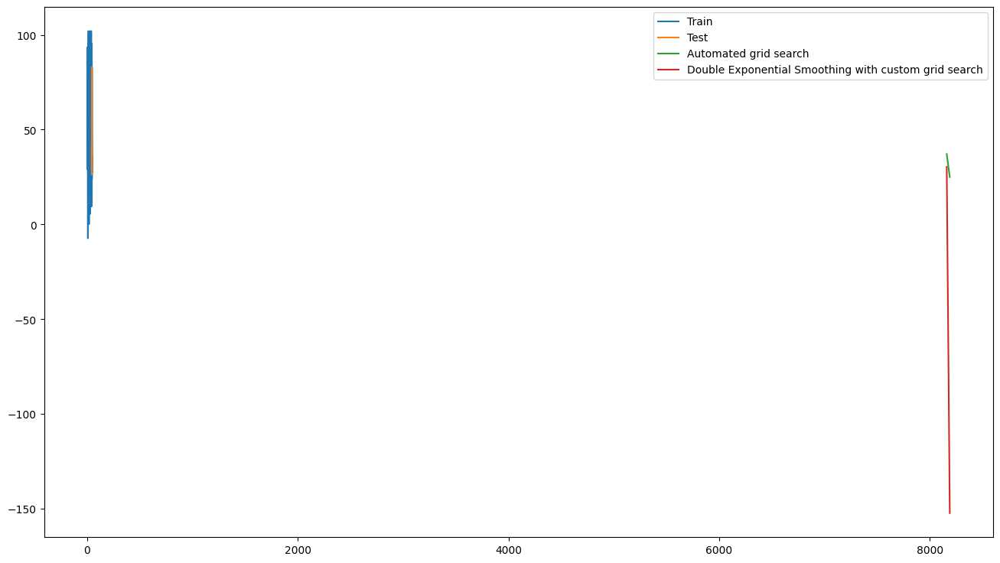

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [16,9]
plt.plot( train, label='Train')
plt.plot(test, label='Test')
plt.plot(fitESAUTOpred, label='Automated grid search')
plt.plot(Forecast_custom_pred, label='Double Exponential Smoothing with custom grid search')
plt.legend(loc='best')
plt.show()


#VAR


In [ ]:
import pandas as pd
import numpy as np
from sklearn import metrics
df =pd.read_csv(r'/content/features.csv (1).zip', header=0, index_col=0)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VAR
import numpy as np
from statsmodels.tsa.stattools import adfuller
from sklearn import metrics
from timeit import default_timer as timer
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df.head()

,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
Store,,,,,,,,,,,
1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
df = df[(df['Date'] > '2012-01-14') & (df['Date'] <= '2013-01-30')]

In [ ]:
df.head()

,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
Store,,,,,,,,,,,
1,2012-01-20,54.11,3.268,4139.87,2807.19,33.88,500.62,3400.21,219.985689,7.348,False
1,2012-01-27,54.26,3.290,1164.46,1082.74,44.00,11.00,1222.19,220.078852,7.348,False
1,2012-02-03,56.55,3.360,34577.06,3579.21,160.53,32403.87,5630.40,220.172015,7.348,False
1,2012-02-10,48.02,3.409,13925.06,6927.23,101.64,8471.88,6886.04,220.265178,7.348,True
1,2012-02-17,45.32,3.510,9873.33,11062.27,9.80,8409.31,3402.66,220.425759,7.348,False


In [ ]:
df.shape

(2430, 11)

In [ ]:
df.columns

Index(['Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday'],
      dtype='object')

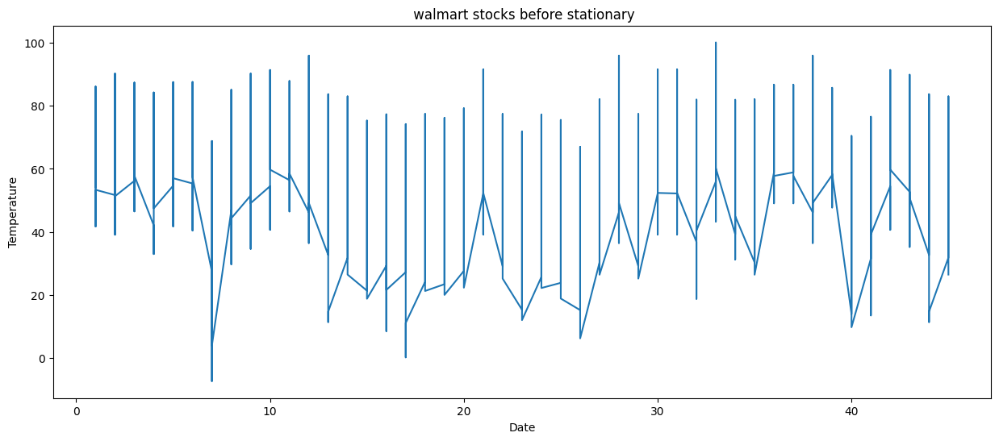

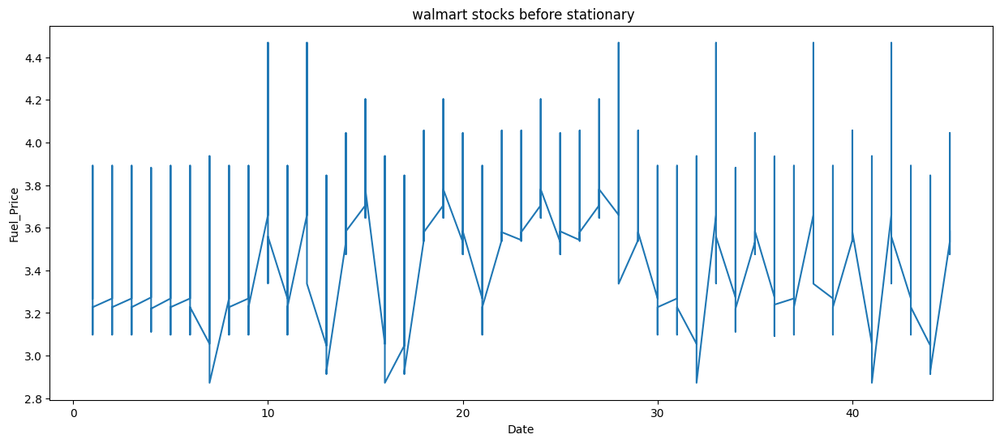

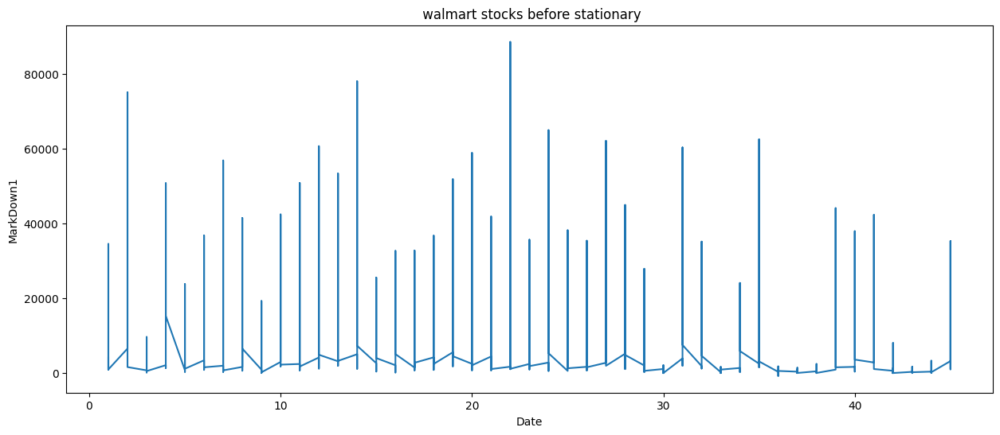

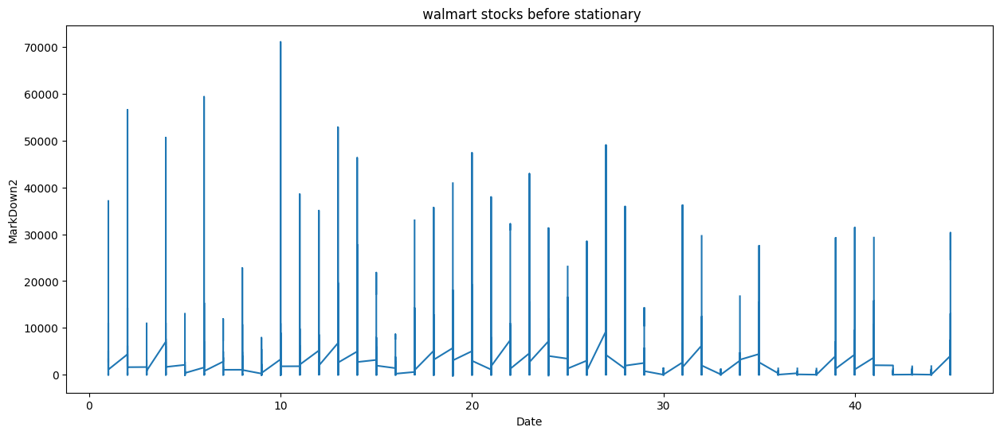

In [ ]:
for c in df[[ 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']]:
    df[str(c)].plot(figsize=(15, 6))
    plt.xlabel("Date")
    plt.ylabel(c)
    plt.title(" walmart stocks before stationary")
    plt.show()

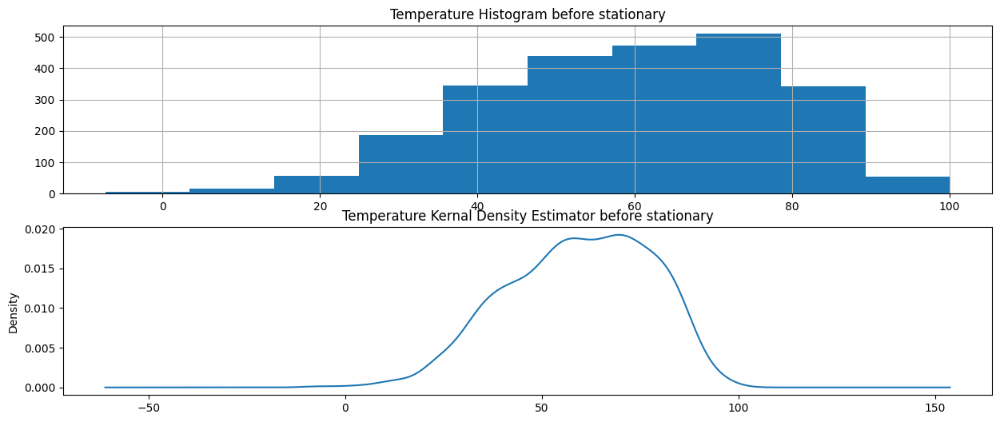

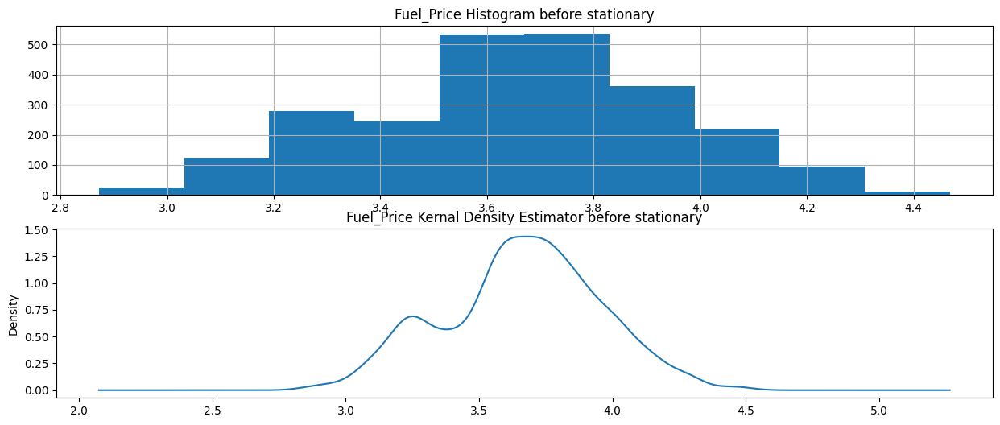

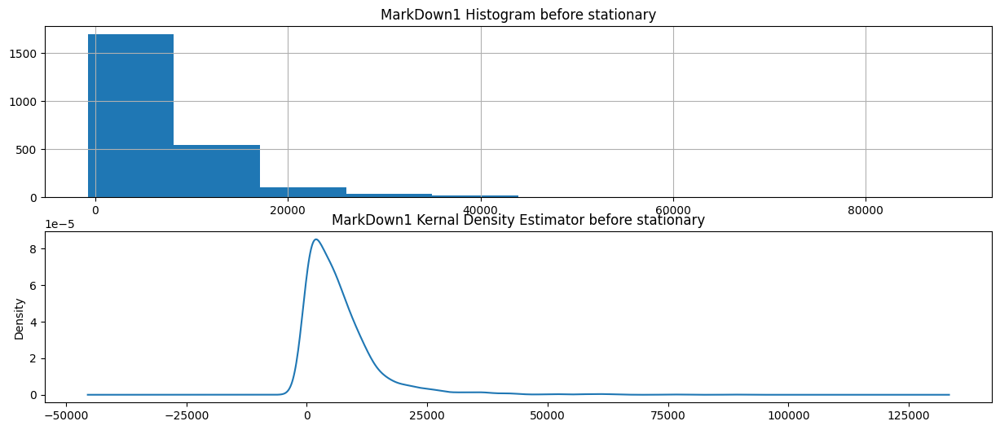

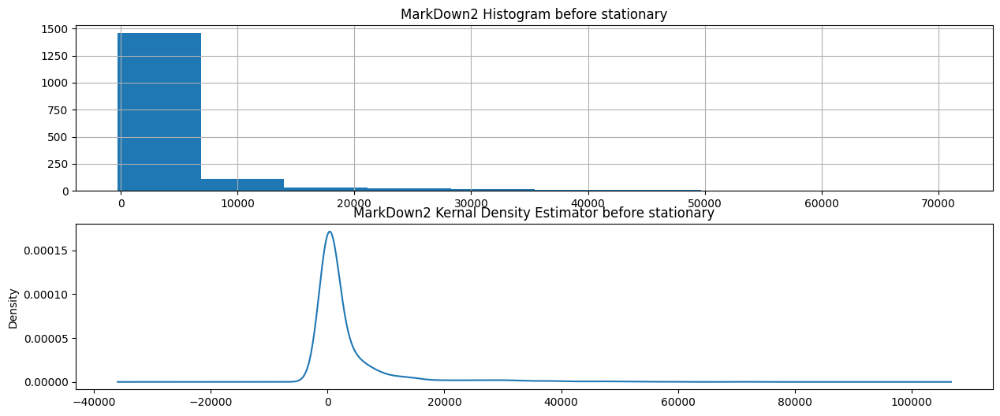

In [ ]:
for c in df[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']]:
    plt.figure(1, figsize=(15,6))
    plt.subplot(211)
    plt.title(f"{str(c)} Histogram before stationary")
    df[str(c)].hist()
    plt.subplot(212)
    df[str(c)].plot(kind='kde')
    plt.title(f"{str(c)} Kernal Density Estimator before stationary")
    plt.show()

In [ ]:
def timeseries_evaluation_metrics_func(y_true, y_pred):

    def mean_absolute_percentage_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    #print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    return

In [ ]:
def Augmented_Dickey_Fuller_Test_func(series , column_name):
    print (f'Results of Dickey-Fuller Test for column: {column_name}')
    dftest = adfuller(series, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','No Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    if dftest[1] <= 0.05:
        print("Conclusion:====>")
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Conclusion:====>")
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [ ]:
for name, column in df[['Temperature', 'Fuel_Price']].iteritems():
    Augmented_Dickey_Fuller_Test_func(df[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Temperature
Test Statistic                -6.927072e+00
p-value                        1.108288e-09
No Lags Used                   2.700000e+01
Number of Observations Used    2.402000e+03
Critical Value (1%)           -3.433075e+00
Critical Value (5%)           -2.862744e+00
Critical Value (10%)          -2.567411e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: Fuel_Price
Test Statistic                -6.261773e+00
p-value                        4.206311e-08
No Lags Used                   1.700000e+01
Number of Observations Used    2.412000e+03
Critical Value (1%)           -3.433064e+00
Critical Value (5%)           -2.862739e+00
Critical Value (10%)          -2.567408e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary




In [ ]:
X = df[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2' ]]
train, test = X[0:-30], X[-30:]

In [ ]:
train_diff = train.diff()
train_diff.dropna(inplace = True)

In [ ]:
for name, column in train_diff[[ 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']].iteritems():
    Augmented_Dickey_Fuller_Test_func(train_diff[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Temperature
Test Statistic                -1.219899e+01
p-value                        1.235626e-22
No Lags Used                   2.200000e+01
Number of Observations Used    1.404000e+03
Critical Value (1%)           -3.435016e+00
Critical Value (5%)           -2.863601e+00
Critical Value (10%)          -2.567867e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: Fuel_Price
Test Statistic                -1.394123e+01
p-value                        4.887659e-26
No Lags Used                   1.400000e+01
Number of Observations Used    1.412000e+03
Critical Value (1%)           -3.434990e+00
Critical Value (5%)           -2.863589e+00
Critical Value (10%)          -2.567861e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: MarkDown1
Test Statistic                -1.049822e+01
p-value              

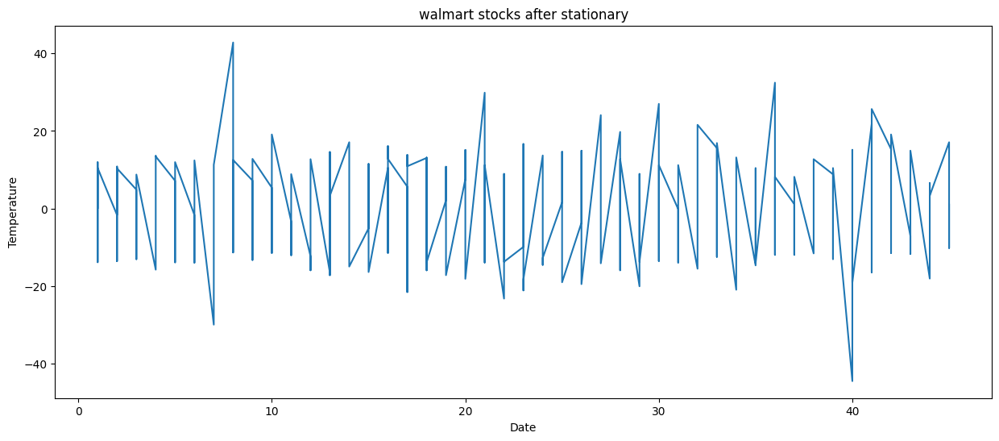

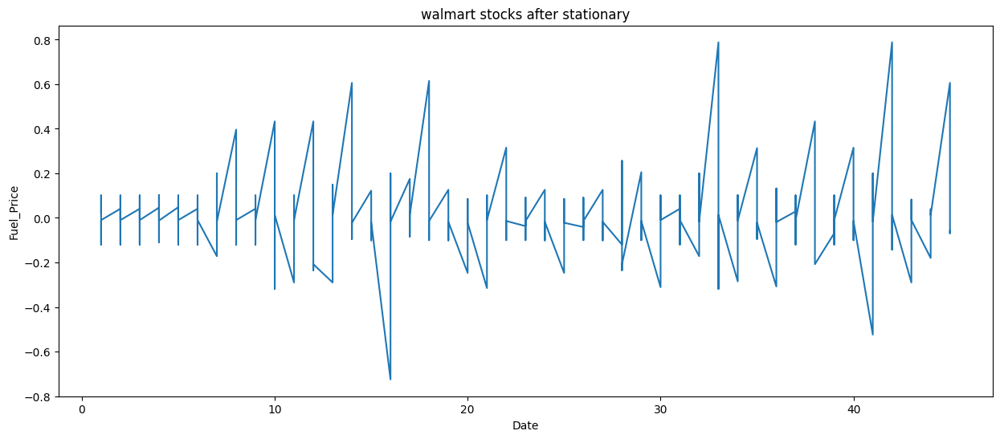

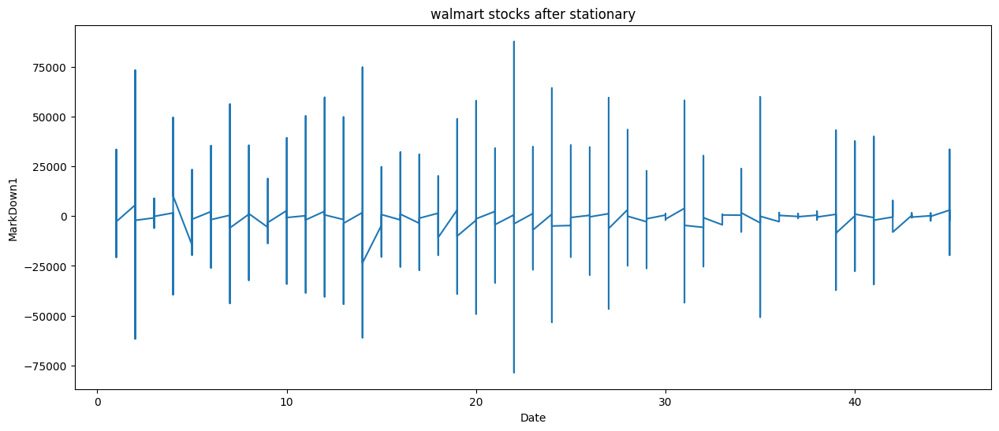

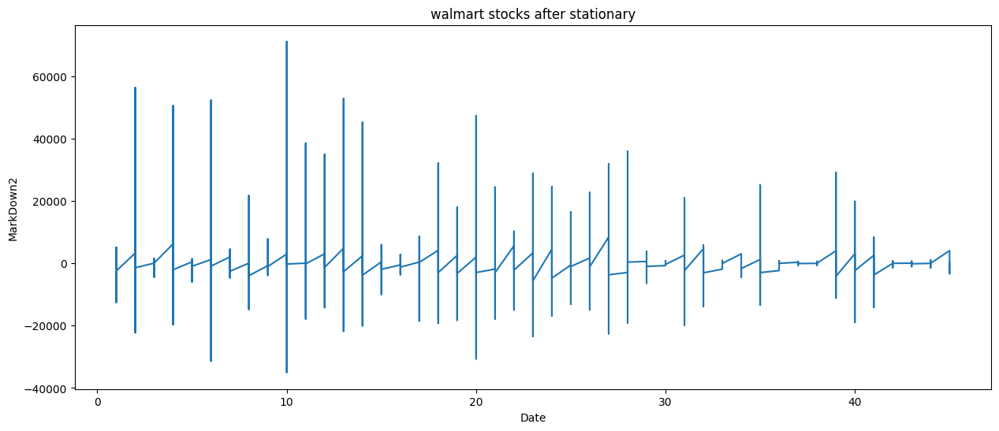

In [ ]:
for c in train_diff[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']]:
    train_diff[str(c)].plot(figsize=(15, 6))
    plt.xlabel("Date")
    plt.ylabel(c)
    plt.title("walmart stocks after stationary")
    plt.show()

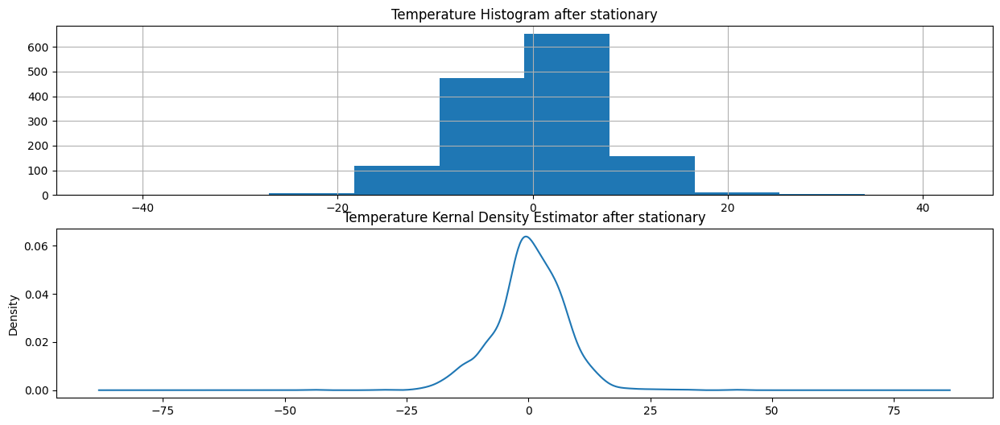

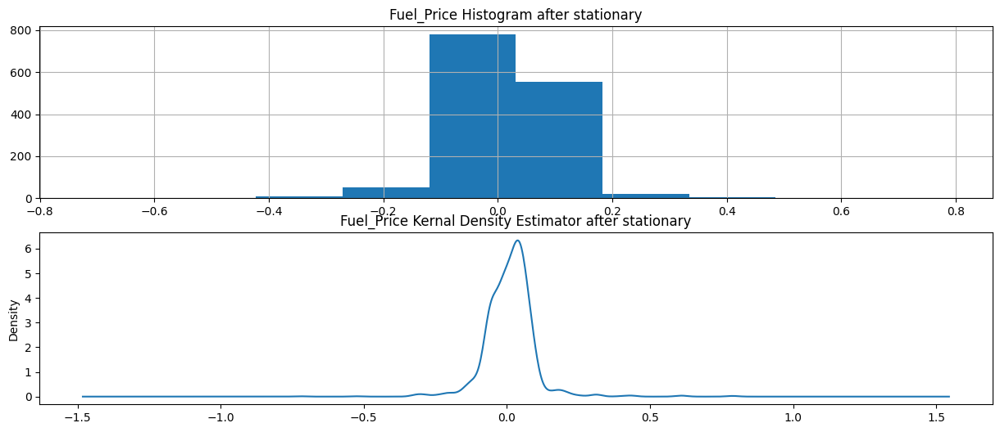

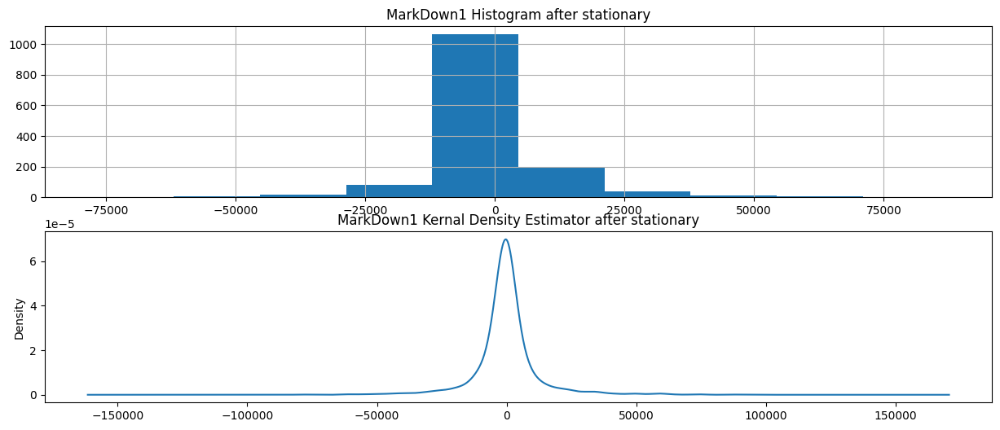

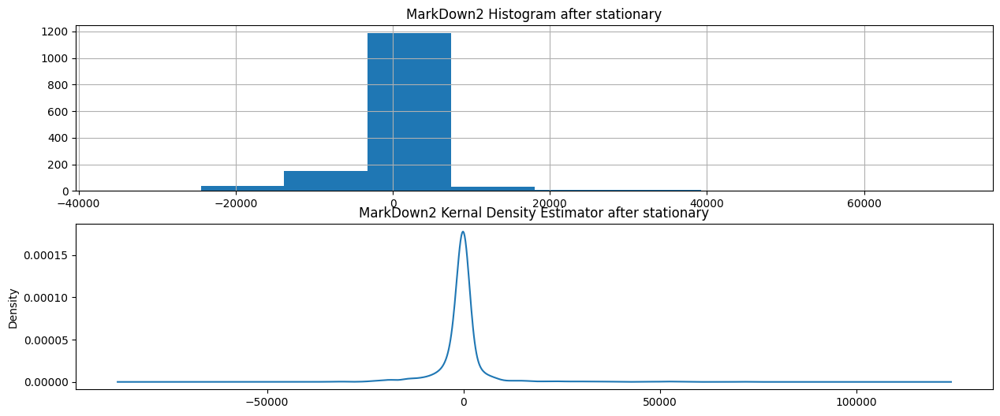

In [ ]:
for c in train_diff[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']]:
    plt.figure(1, figsize=(15,6))
    plt.subplot(211)
    plt.title(f"{str(c)} Histogram after stationary")
    train_diff[str(c)].hist()
    plt.subplot(212)
    train_diff[str(c)].plot(kind='kde')
    plt.title(f"{str(c)} Kernal Density Estimator after stationary")
    plt.show()

In [ ]:
train_diff.head(10)

,Temperature,Fuel_Price,MarkDown1,MarkDown2
Store,,,,
1,0.15,0.022,-2975.41,-1724.45
1,2.29,0.070,33412.60,2496.47
1,-8.53,0.049,-20652.00,3348.02
1,-2.70,0.101,-4051.73,4135.04
1,11.93,0.045,-523.72,-3506.26
1,3.71,0.075,6091.79,-5987.01
1,-2.20,0.039,-5110.36,-1417.12
1,5.98,0.065,-6032.88,-144.38
1,1.19,0.053,1820.40,1.98


In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen

def cointegration_test(df):
    res = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = res.lr1 # Trace statistics
    cvts = res.cvt[:, d[str(1-0.05)]] #Critical values (90%, 95%, 99%) for trace statistic.
    def adjust(val, length= 6):
        return str(val).ljust(length) #string left justified (ljust)
    print('Column Name   >  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), '> ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)


In [ ]:
cointegration_test(train_diff[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']])

Column Name   >  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Temperature >  1385.45   > 40.1749   =>   True
Fuel_Price >  814.84    > 24.2761   =>   True
MarkDown1 >  429.27    > 12.3212   =>   True
MarkDown2 >  199.36    > 4.1296    =>   True


In [ ]:
for i in [1,2,3,4,5,6,7,8,9]:
    model = VAR(train_diff)
    results = model.fit(i)
    print(f'Order : {i}, AIC:  {results.aic}, BIC: { results.bic}')

Order : 1, AIC:  35.06746940907494, BIC: 35.14127906687261
Order : 2, AIC:  34.79067321246486, BIC: 34.9236061074384
Order : 3, AIC:  34.572559426111276, BIC: 34.76468281430126
Order : 4, AIC:  34.53615617176627, BIC: 34.787537434359464
Order : 5, AIC:  34.46085752977081, BIC: 34.771564173420956
Order : 6, AIC:  34.417628033439826, BIC: 34.78772769058952
Order : 7, AIC:  34.338254394230916, BIC: 34.76781482343448
Order : 8, AIC:  34.29832066576111, BIC: 34.78740975200856
Order : 9, AIC:  34.27369715387798, BIC: 34.822382908920034


In [ ]:
def inverse_diff(actual_df, pred_df):
    df_res = pred_df.copy()
    columns = actual_df.columns
    for col in columns:
        df_res[str(col)+'_1st_inv_diff'] = actual_df[col].iloc[-1] + df_res[str(col)].cumsum()
    return df_res

In [ ]:
results = model.fit(4)
display(results.summary())
z = results.forecast(y=train_diff[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2' ]].values, steps=30)
df_pred = pd.DataFrame(z, columns=['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2'  ])

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 20, Nov, 2023
Time:                     06:04:44
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                    34.7875
Nobs:                     1423.00    HQIC:                   34.6301
Log likelihood:          -32581.1    FPE:                9.97388e+14
AIC:                      34.5362    Det(Omega_mle):     9.51116e+14
--------------------------------------------------------------------
Results for equation Temperature
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.024333         0.182104           -0.134           0.894
L1.Temperature        -0.331444         0.027211          -12.181           0.000
L1.Fuel_Price          8.186061         2.118266  

In [ ]:
df_pred["new_index"] = range(233, 263)
df_pred = df_pred.set_index("new_index")

In [ ]:
df_pred

,Temperature,Fuel_Price,MarkDown1,MarkDown2
new_index,,,,
233,-1.067236,-0.006087,3954.796514,82.192842
234,0.057697,-0.000818,-814.072345,-382.876693
235,0.116886,0.009358,-25.610355,-82.506930
236,0.026874,0.009499,-882.756173,-29.121882
237,0.130190,0.011727,847.839567,-279.864301
238,0.287828,0.010363,-121.542530,-553.023467
239,0.153584,0.010743,-133.641254,-453.177384
240,0.212023,0.010131,-319.354498,-276.129696
241,0.228912,0.010750,210.273337,-261.280964


In [ ]:
res = inverse_diff(df[['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2' ]],df_pred)

In [ ]:
res

,Temperature,Fuel_Price,MarkDown1,MarkDown2,Temperature_1st_inv_diff,Fuel_Price_1st_inv_diff,MarkDown1_1st_inv_diff,MarkDown2_1st_inv_diff
new_index,,,,,,,,
233,-1.067236,-0.006087,3954.796514,82.192842,25.422764,3.576913,7085.076514,1444.292842
234,0.057697,-0.000818,-814.072345,-382.876693,25.480461,3.576095,6271.004169,1061.416149
235,0.116886,0.009358,-25.610355,-82.506930,25.597347,3.585453,6245.393813,978.909219
236,0.026874,0.009499,-882.756173,-29.121882,25.624221,3.594952,5362.637640,949.787337
237,0.130190,0.011727,847.839567,-279.864301,25.754411,3.606679,6210.477207,669.923036
238,0.287828,0.010363,-121.542530,-553.023467,26.042239,3.617042,6088.934678,116.899569
239,0.153584,0.010743,-133.641254,-453.177384,26.195823,3.627785,5955.293424,-336.277815
240,0.212023,0.010131,-319.354498,-276.129696,26.407846,3.637916,5635.938926,-612.407511
241,0.228912,0.010750,210.273337,-261.280964,26.636757,3.648666,5846.212263,-873.688475


In [ ]:
for i in ['Temperature', 'Fuel_Price' ]:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(test[str(i)] , res[str(i)+'_1st_inv_diff'])

Evaluation metric for Temperature
MSE is : 1228.6242198432599
MAE is : 30.00586853037589
RMSE is : 35.051736331361106
MAPE is : 46.48450066137046
R2 is : -3.328216912814968

Evaluation metric for Fuel_Price
MSE is : 0.04000439609505077
MAE is : 0.17037458562152336
RMSE is : 0.2000109899356802
MAPE is : 4.505096416415355
R2 is : -0.5498317298231485



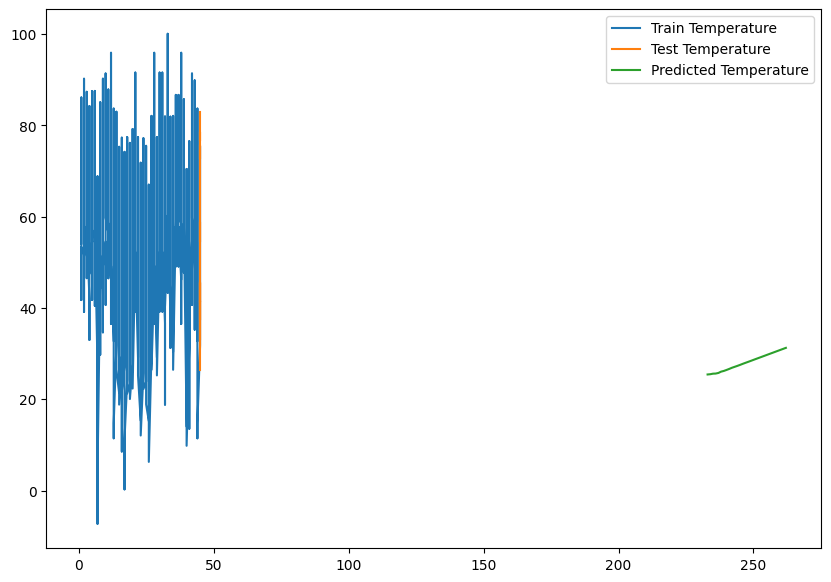

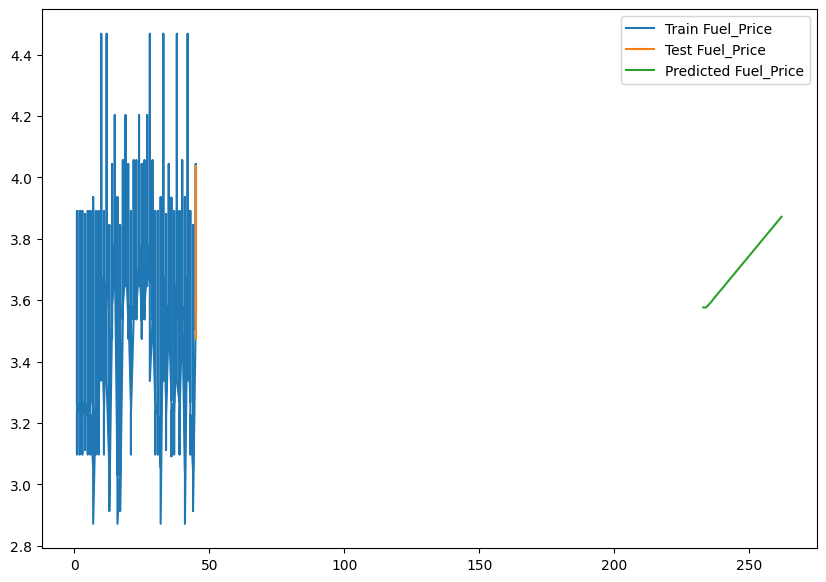

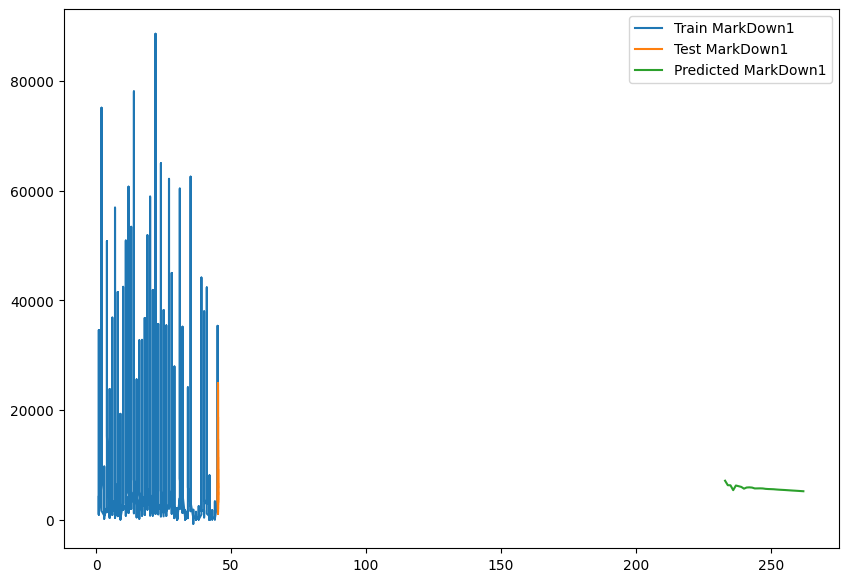

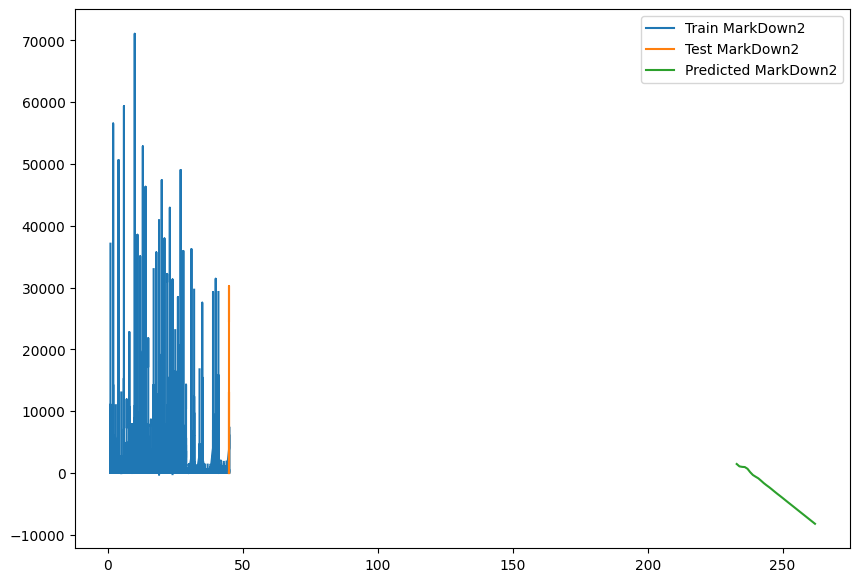

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
for i in ['Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2']:

    plt.rcParams["figure.figsize"] = [10,7]
    plt.plot( train[str(i)], label='Train '+str(i))
    plt.plot(test[str(i)], label='Test '+str(i))
    plt.plot(res[str(i)+'_1st_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

#CNN

In [ ]:
import pandas as pd
import numpy as np
from sklearn import metrics
df =pd.read_csv(r'/content/features.csv', header=0, index_col=0)

In [ ]:
!pip install keras

In [ ]:
import numpy as np
import pandas as pd
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Conv1D
from keras.layers import MaxPooling1D

In [ ]:
def split_sequence(sequence,steps):
  X,y=list(),list()
  for start in range(len(sequence)):
    end_index = start + steps
    if end_index > len(sequence)-1:
      break
    sequence_x,sequence_y = sequence[start : end_index], sequence[end_index]
    X.append(sequence_x)
    y.append(sequence_y)
  return array(X),array(y)

In [ ]:
df.head()

,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
Date,,,,,,,,,,
05-02-2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
12-02-2010,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
19-02-2010,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
26-02-2010,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
05-03-2010,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
# def exp8(col_name):
#   raw_sequence = df[col_name]
#   # choose number of time steps
#   steps=3
#   # split into samples
#   X,y = split_sequence(raw_sequence,steps)
#   print("****************************************************************")
#   print('The input sequence on which we will test our CNN Model: ')
#   print(raw_sequence)
#   print("\n\n****************************************************************")
#   print('The features (X) , lagged values of time series , for our CNN Model')
#   print(X[:4])
#   print("\n\n****************************************************************")
#   print('The respective observed values (y) of the sequence for training in CNN Model')
#   print(y)
#   print("****************************************************************\n\n")
#   # Reshape 2D imput data to 3D input data
#   features = 1
#   X = X.reshape((X.shape[0], X.shape[1], features))
#   print('After reshaping , the shape of the input X ')
#   print(X.shape)
#   print("\n\n*************************************************")
#   print("*************************************************")
#   print('The final form of input feature matrix X')
#   print(X[:4])
#   print("\n\n*************************************************")
#   print("*************************************************")
#   print('Feature matrix X is ready for input to CNN Model')
#   print("*************************************************\n\n")
#   # Defining model architecture
#   model = Sequential()
#   model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(steps,features)))
#   model.add(MaxPooling1D(pool_size=2))
#   model.add(Flatten())
#   model.add(Dense(100, activation='relu'))
#   model.add(Dense(1))
#   model.compile(optimizer='adam', loss='mse')
#   # fit model
#   model.fit(X,y,epochs=100, verbose=0)
#   #predict
#   x_input = array(raw_sequence[-steps-1:-1])
#   x_input = x_input.reshape((1,steps,features))
#   y_pred = model.predict(x_input,verbose=0)
#   print("*************************************************")
#   print(f"The next predicted value is ")
#   print(y_pred)
#   print(f"The next true value is ")
#   print(raw_sequence.iloc[-1])
#   print("*************************************************")
from sklearn.model_selection import train_test_split
col_name = 'Temperature'
raw_sequence = df[col_name]

# Choose number of time steps
steps = 3

# Split into samples
X, y = split_sequence(raw_sequence, steps)

# Reshape 2D input data to 3D input data
features = 1
X = X.reshape((X.shape[0], X.shape[1], features))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the CNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(steps, features)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(100, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Fit the model
model.fit(X_train, y_train, epochs=100, verbose=1, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {loss}")

# Make predictions on a new sequence
x_input = array(raw_sequence[-steps:])
x_input = x_input.reshape((1, steps, features))
y_pred = model.predict(x_input, verbose=0)

print("*************************************************")
print(f"The next predicted value is ")
print(y_pred)
print(f"The next true value is ")
print(raw_sequence.iloc[-1])
print("*************************************************")

Epoch 1/100
205/205 [==============================] - 4s 6ms/step - loss: 189.3633 - val_loss: 50.4829
Epoch 2/100
205/205 [==============================] - 1s 5ms/step - loss: 50.0303 - val_loss: 51.7371
Epoch 3/100
205/205 [==============================] - 1s 4ms/step - loss: 49.3976 - val_loss: 48.4312
Epoch 4/100
205/205 [==============================] - 1s 4ms/step - loss: 48.9899 - val_loss: 48.3543
Epoch 5/100
205/205 [==============================] - 1s 5ms/step - loss: 48.7820 - val_loss: 48.0655
Epoch 6/100
205/205 [==============================] - 1s 5ms/step - loss: 48.4995 - val_loss: 47.4165
Epoch 7/100
205/205 [==============================] - 1s 6ms/step - loss: 48.0340 - val_loss: 46.9908
Epoch 8/100
205/205 [==============================] - 1s 7ms/step - loss: 47.2734 - val_loss: 47.1916
Epoch 9/100
205/205 [==============================] - 1s 7ms/step - loss: 47.5168 - val_loss: 48.8121
Epoch 10/100
205/205 [==============================] - 1s 6ms/step - lo